# Retrieval-Augmented Garment Generation with Diffusion Models

**Claudia Cornacchia**

⚠️ Note on Reproducibility: This repository serves as a code portfolio and implementation reference. Due to the size of the VITON-HD dataset and the proprietary nature of the trained checkpoints, the data files are not included in this repository. The notebooks are saved with outputs visible to demonstrate the execution flow and results.

## Project aim
This project aims to replicate and adapt the framework proposed in *RAGDiffusion: Faithful Cloth Generation via External Knowledge Assimilation* [1]. The primary objective is to synthesize forward facing, flat lay garment images displayed on a clear background from "in the wild" inputs.

Standard latent diffusion models often struggle with this highly specified generation task. Due to a lack of explicit geometric guidance, they are prone to "structural hallucinations", frequently generating artifacts such as incorrect patterns or shapes, distorted necklines, or retaining human anatomical features from the source image.
Retrieval-Augmented Generation (RAG) addresses this limitations by assimilating external knowledge from two sources, a LLM to provide high-precision semantic attributes, and a Retrieval Database to supply a structural guidance by retrieving similar flat lay examples from the database.

While the original RAGDiffusion architecture relies on massive proprietary datasets and huge scale training to achieve State of the Art (SOTA) results, this work introduces architectural adaptations to make this advanced framework feasible within a resource constrained environment (Google Colab).

<div align="center">
    <img src="https://drive.google.com/uc?export=download&id=1vY2c24ETvIK6YNPKr_CSU3fETSq2tkHb" height="200">
</div>


# Setup and utilities


### Environment Setup
First install all the necessary dependencies

In [ ]:
!pip install -q git+https://github.com/Stability-AI/generative-models.git
!pip install -q accelerate einops safetensors

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
!pip install -q transformers==4.49 diffusers==0.32.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 157.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 127.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 124.9 MB/s eta 0:00:00


In [ ]:
!pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.8 MB/s eta 0:00:00


In [ ]:
!pip install git+https://github.com/huggingface/peft.git

  Cloning https://github.com/huggingface/peft.git to /tmp/pip-req-build-bdttma73
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/peft.git /tmp/pip-req-build-bdttma73
  Resolved https://github.com/huggingface/peft.git to commit 8be1a16f5e06ca5e197d2af74bdfc5b3c8072d26
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for peft: filename=peft-0.18.1.dev0-py3-none-any.whl size=584827 sha256=e40eb76c166d4210afa2798422fd9c3161d06e307b4629939cceffa0a5143954
  Stored in directory: /tmp/pip-ephem-wheel-cache-341ztdcy/wheels/5d/16/61/117d50be36b7cb532817817523554825ff840d223c0f65c2c4
Successfully built peft
  Attempting uninstall: peft
    Found existing installation: peft 0.18.0
    Uninstalling peft-0.18.0:
      Successfully uninstalled peft-0.18.0


### Library imports

In [ ]:
# Imports

# Standard library
import os
import random
import math
import time
import pickle
import copy
from copy import deepcopy
from typing import Tuple
from collections import defaultdict
from tqdm import tqdm

# Data manipulation and visualization
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as F_trans
from torchvision.utils import make_grid
import accelerate

# HuggingFace
import diffusers
from diffusers import StableDiffusionXLPipeline
from diffusers.models.attention import Attention # import the cross attention from huggingface diffusers library
from diffusers.models.attention_processor import AttnProcessor
from diffusers.models.embeddings import TextImageTimeEmbedding
from diffusers import UNet2DConditionModel
from diffusers import ControlNetModel

import transformers
from transformers import CLIPProcessor, CLIPModel
from transformers import AutoProcessor, Qwen2_5_VLForConditionalGeneration

# Scikit-Learn (Clustering)
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import DBSCAN

# metrics
import lpips



In [ ]:
print("Diffusers version:", diffusers.__version__)
print("Transformers version:", transformers.__version__)
print("Accelerate version:", accelerate.__version__)


Diffusers version: 0.32.2
Transformers version: 4.49.0
Accelerate version: 1.10.1


### Global configuration

In [ ]:
# Global
device = "cuda" if torch.cuda.is_available() else "cpu"

# Defining the relative paths to the train and test splits
# derived from the downloaded VITON-HD dataset.
# (Relative path for portability)
dataset_path = './viton_hd'
dataset_train_dir = "./viton_hd/train"
dataset_test_dir = "./viton_hd/test"

# Dataset
To replicate the framework proposed in the paper *RAGDiffusion* [1] within a constrained computational environment, I used the **VITON-HD** dataset. It is a fashion dataset containing approximately 13,000 high-resolution (1024x768) image pairs, consisting of people wearing a wide variety of upper-body garments in standing poses, together with the corresponding flat-lay images of those same clothes.

Although VITON-HD offers less background diversity compared to STGarment (the proprietary dataset used in the original paper, which also includes images of clothes on hangers or laid indoors), it represents a good open source alternative. This is because its primary function in this work is to train the model to map the transformation from an "in the wild" image, in which the shape of the garment is subject to warping and occlusion, to its canonical flat-lay representation.


In [ ]:
# DATASET SETUP
# Note: This cell requires Kaggle API keys stored in Google Colab's "Secrets"
# (Key names: 'KAGGLE_USERNAME', 'KAGGLE_KEY')
from google.colab import userdata

try:
    # Retrieve Kaggle API credentials securely
    kaggle_username = userdata.get('KAGGLE_USERNAME')
    kaggle_key = userdata.get('KAGGLE_KEY')

    # Set environment variables for authentication
    os.environ['KAGGLE_USERNAME'] = kaggle_username
    os.environ['KAGGLE_KEY'] = kaggle_key

    # Download dataset from Kaggle
    print("Downloading dataset...")
    !kaggle datasets download -d marquis03/high-resolution-viton-zalando-dataset -p {dataset_path}

    # Unzip and cleanup
    print("Extracting files...")
    !unzip -q {dataset_path}/*.zip -d {dataset_path}
    !rm {dataset_path}/*.zip
    print("Dataset setup complete.")

except Exception as e:
    print("Skipping dataset download (Keys not found or environment not configured).")
    print(f"Error details: {e}")

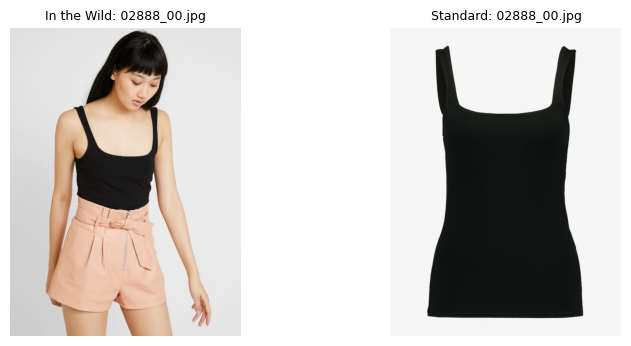

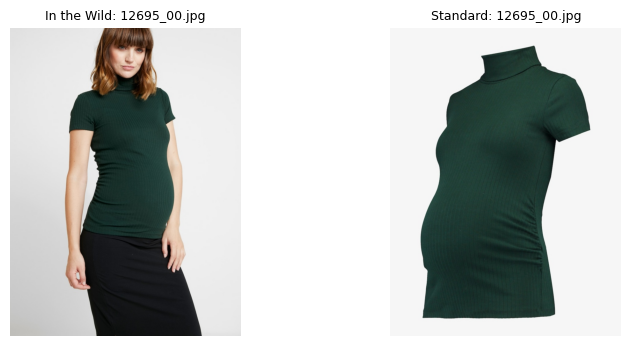

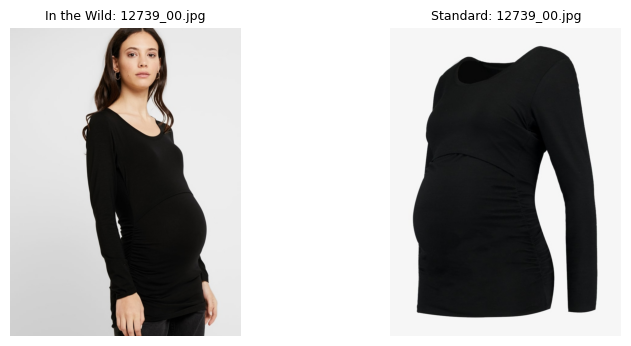

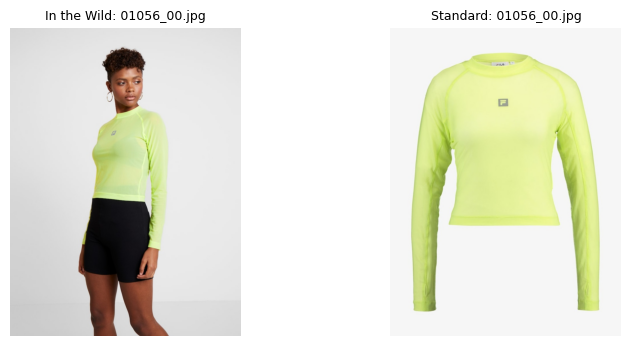

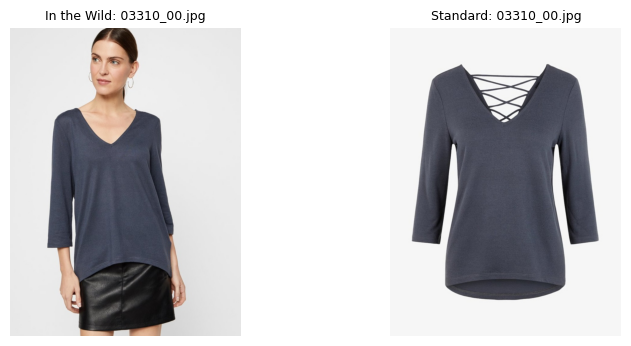

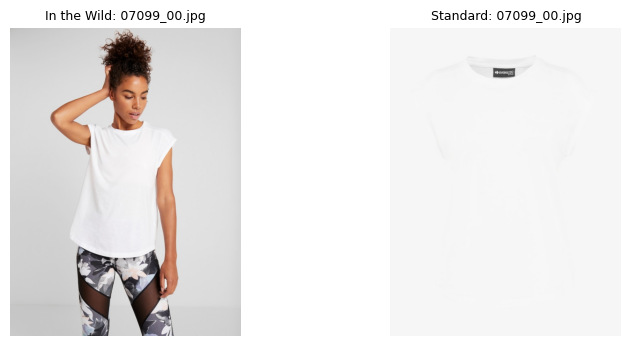

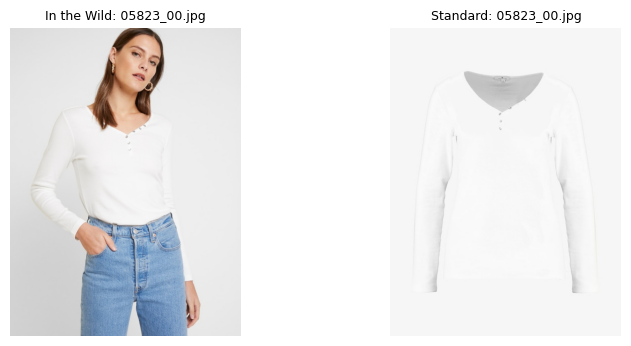

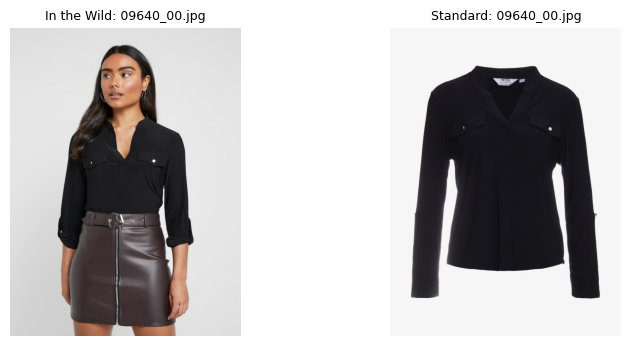

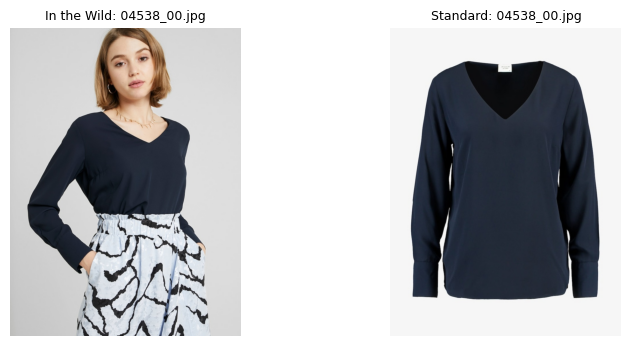

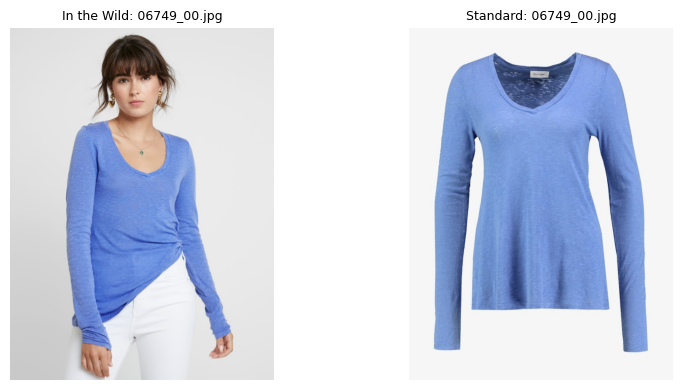

In [ ]:
# Show 10 random pairs of images from the dataset
def show_random_pairs(root_dir, num_pairs=10):
    itw_dir = os.path.join(root_dir, "image")
    std_dir = os.path.join(root_dir, "cloth")

    itw_files = os.listdir(itw_dir)
    selected = random.sample(itw_files, num_pairs)

    for i, fname in enumerate(selected):
        fig, axes = plt.subplots(1, 2, figsize=(9,4))
        itw_path = os.path.join(itw_dir, fname)
        std_path = os.path.join(std_dir, fname)

        itw_image = Image.open(itw_path).convert("RGB")
        std_image = Image.open(std_path).convert("RGB")

        axes[0].imshow(itw_image)
        axes[0].set_title(f"In the Wild: {fname}", fontsize=9)
        axes[0].axis('off')

        axes[1].imshow(std_image)
        axes[1].set_title(f"Standard: {fname}", fontsize=9)
        axes[1].axis('off')

    plt.tight_layout()
    plt.show()

show_random_pairs(dataset_train_dir, num_pairs=10)

#### Extract a representative subset of 100 images
To train the model under significant computational constraints while preserving the core functionality of the approach, I extracted a representative subset of 100 images. I computed CLIP embeddings for a subset of 1000 images, clustering them with MiniBatchKMeans, and choosing the image closest to each cluster centroid to maximize diversity in pose and garment type, while significantly reducing computational requirements.

In [ ]:
# Function to select a representative subset of 100 images

# Configuration
DATASET_DIR = "./viton_hd/train/image"
OUTPUT_FILE = "./NN_Project/selected_images.txt"
NUM_IMAGES = 100
BATCH_SIZE = 64   # batch size for embedding extraction
MAX_SAMPLES = 1000 # subsample dataset for speed

# Load CLIP
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Collect all images
image_paths = [os.path.join(DATASET_DIR, f) for f in os.listdir(DATASET_DIR)
               if f.lower().endswith((".png", ".jpg", ".jpeg"))]

print(f"Found {len(image_paths)} images.")

# Subsampling
if MAX_SAMPLES is not None and len(image_paths) > MAX_SAMPLES:
    np.random.seed(42)
    image_paths = np.random.choice(image_paths, MAX_SAMPLES, replace=False).tolist()
    print(f"Subsampled to {len(image_paths)} images for speed.")

# Compute embeddings in batches
embeddings = []
for i in range(0, len(image_paths), BATCH_SIZE):
    batch_paths = image_paths[i:i+BATCH_SIZE]
    batch_images = [Image.open(p).convert("RGB") for p in batch_paths]

    inputs = processor(images=batch_images, return_tensors="pt", padding=True).to(DEVICE)

    with torch.no_grad():
        feats = model.get_image_features(**inputs)
        feats = feats / feats.norm(dim=-1, keepdim=True)  # L2-normalize each embedding to unit length. This makes Euclidean distance equivalent to a scaled cosine distance, good for clustering similarity
        embeddings.append(feats.cpu().numpy())

embeddings = np.concatenate(embeddings, axis=0) # [num_images, hidden_dimension] (Hidden dimension is the size of each CLIP embedding)
print("Computed embeddings:", embeddings.shape)

# MiniBatchKMeans clustering
kmeans = MiniBatchKMeans(n_clusters=NUM_IMAGES, random_state=42, batch_size=256, n_init=10)
labels = kmeans.fit_predict(embeddings)
centroids = kmeans.cluster_centers_ # get the centroid of each cluster [num_images, hidden_dimension]

# Select closest image to each centroid
selected_images = []
for i in range(NUM_IMAGES): # For each cluster
    # Take the embedding of that cluster
    cluster_indices = np.where(labels == i)[0]
    cluster_embeddings = embeddings[cluster_indices]
    # Take the centroid for that cluster i
    centroid = centroids[i]

    # Find the sample closest to the centroid
    distances = np.linalg.norm(cluster_embeddings - centroid, axis=1)
    closest_index = cluster_indices[np.argmin(distances)]
    selected_images.append(image_paths[closest_index])

# Save selected paths to file
with open(OUTPUT_FILE, "w") as f:
    for img in selected_images:
        f.write(img + "\n")

print(f"\nSaved {len(selected_images)} representative image paths to {OUTPUT_FILE}")


Found 11647 images.
Subsampled to 1000 images for speed.
Computed embeddings: (1000, 512)

Saved 100 representative image paths to ./NN_Project/selected_images.txt


### Dataset class

In [ ]:
# Dataset class to load pairs of (In-the-wild, Flat-lay) garment images

class GarmentDataset(torch.utils.data.Dataset): # Inherit from torch.utils.data.Dataset
    def __init__(self, data_dir: str, attributes_data = None , attribute_vocab=None, transform=None, selected_path = None, start_idx = 0):
        self.data_dir = data_dir
        self.attributes_data = attributes_data
        self.attribute_vocab = attribute_vocab
        self.transform = transform
        self.start_idx = start_idx

        self.itw_dir = os.path.join(data_dir, "image")
        self.std_dir = os.path.join(data_dir, "cloth")
        self.mask_dir = os.path.join(data_dir, "cloth-mask")

        # Use the CLIP processor to preprocess images
        self.clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

        # To load a specific subset of images
        if selected_path is not None:
            with open(selected_path, "r") as f:
                self.itw_paths = [line.strip() for line in f.readlines()]
            self.std_paths = [p.replace("/image/", "/cloth/") for p in self.itw_paths]

    def __len__(self):
        return len(self.itw_paths)

    def __getitem__(self, idx): # is automatically called by the DataLoader every time I iterate
        itw_path = self.itw_paths[idx]
        std_path = self.std_paths[idx]

        # Load images
        itw_image = Image.open(itw_path).convert('RGB')
        std_image = Image.open(std_path).convert('RGB')

        # Preprocessing
        if self.transform:
            itw_image = self.transform(itw_image)
            std_image = self.transform(std_image)
        else:
            # Process image using CLIPProcessor
            itw_image = self.clip_processor(images=itw_image, return_tensors="pt")["pixel_values"].squeeze(0)  # [1,3,224,224] -> [3,224,224] [C,H,W]
            std_image = self.clip_processor(images=std_image, return_tensors="pt")["pixel_values"].squeeze(0)

        # Handle image attributes
        if self.attributes_data is not None:
            # Get the attributes for this specific image pair
            item = self.attributes_data[idx]
            attr_list = item["attributes"] # Extract the "attributes" field

            # Pad or truncate to fixed length (10 attributes)
            max_attrs = 10
            attr_indices = []

            for attr in attr_list[:max_attrs]:
                if attr in self.attribute_vocab:
                  # If the attribute is in the vocabulary insert the corresponsing ID in the list
                    attr_indices.append(self.attribute_vocab[attr])
                else:
                    attr_indices.append(0)  # Unknown attribute

            # Transform the attribute list in a tensor
            attr_tensor = torch.tensor(attr_indices, dtype=torch.long)

            return itw_image, std_image, attr_tensor
        else:
            return itw_image, std_image

# 1. StructureNet (Embedding encoder)
To generate a faithful flat-lay image, the model must learn to disentangle the garment's structure from the visual noise of in-the-wild images (pose, lighting, background, occlusions).

The goal of StructureNet is to map garments from two distinct domains In-the-Wild ($x_{itw}$) and Standard Flat-Lay ($x_{std}$) into a shared semantic embedding space where structurally similar items cluster together. This process produces two latent structure embeddings:
- $e_{std}$: used to construct the Retrieval Memory Database.
- $e_{itw}$: used at inference time as the query vector to retrieve the most structurally similar standard garment in the retrieval database.

The architecture of StructureNet is a dual tower encoder trained via Contrastive Learning. As illustrated below, it fuses visual features ($f_{img}$) with semantic attributes ($f_{attr}$) to create a robust structure representation.

<div align="center">
    <img src="https://drive.google.com/uc?export=download&id=1NwqBwdr1iicJTp-QCjE3-8zOtVGqELbz" height="200">
</div>


## 1.1 Extract $f_{attr}$
Visual features extracted from "in the wild" images often fail to capture fine-grained details such as specific collar types or sleeve lengths. A possible solution to mitigate this problem is to inject explicit semantic knowledge into the pipeline using a Large Language Model. I used Qwen2-VL-7B to extract 10 discrete semantic clothing attributes for each garment pair.   
This attributes are then preprocessed to be able to incorporate them in StructureNet.
- Tokenization: each extracted attribute is mapped to a unique integer index using a predefined vocabulary.
- Embedding lookup: I defined a learnable matrix of embeddings E (number of tokens x embedding size=32)  where each row corresponds to a specific token (attribute value). By performing a lookup operation each integer index is projected into a 32-dimensional vector.

For each image we will get a feature tensor $f_{attr} \in \mathbb{R}^{10 \times 32}$ which results in a 320-dimensional semantic vector that complements the visual features.

The language model Qwen2-VL-7B is also used ad inference time to generate a detailed garment description for the conditional generation pipeline. This description is fed into the text encoder of the diffusion model to guide the generation process alongside the retrieved structure embedding.

This table shows all the 10 semantic attributes extracted by the LLM
| Attribute | Choices |
|-----------|---------|
| Category | T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker,<br> Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat,<br>Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top,<br>Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket |
| Fit | Loose, Regular, Slim |
| Collar | Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck,<br>Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball |
| Sleeve Length | Sleeveless, Short, Mid, Long, Extra Long |
| Fabric | Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Suede, Fleece, Corduroy,<br>Knit, Lace, Synthetic, Stretch, Linen, Wool, Silk, Knitting, Leather, Velvet,<br>Fur Blend, Coated, Mixed, Special Fabric |
| Length | Extra Short, Short, Medium, Long, Extra Long, Uncertain |
| With Inner Wear | Yes, No |
| Sleeves Rolled Up | Yes, No |
| Top Open | Yes, No |
| Top Tuck In | Yes, No |


In [ ]:
# Configuration

ATTRIBUTE_VALUES = {
    "Category": ["t-shirt", "hoodie", "shirt", "polo", "tank", "vest", "swimsuit", "sweater",
                "innerwear", "windbreaker", "down jacket", "jacket", "suit", "waistcoat", "shawl",
                "dress", "skirt", "knitted coat", "leather short coat", "leather long coat",
                "denim jacket", "robe", "loungewear top", "loungewear dress", "sports jacket",
                "knitted cardigan", "leather jacket"],
    "Fit": ["loose", "regular", "slim"],
    "Collar": ["suit", "shirt", "notched", "rounded", "ruffled", "naval", "hooded", "polo",
              "v-neck", "square", "round", "strapless", "one-shoulder", "off-shoulder",
              "neckline", "stand-up", "baseball"],
    "Sleeve Length": ["sleeveless", "short", "mid", "long", "extra long"],
    "Fabric": ["gauze", "tweed", "fur", "chiffon", "denim", "pvc", "micro-suede", "fleece",
              "corduroy", "knit", "lace", "synthetic", "stretch", "linen", "wool", "silk",
              "knitting", "leather", "velvet", "fur blend", "coated", "mixed", "special fabric"],
    "Length": ["extra short", "short", "medium", "long", "extra long", "uncertain"],
    "With Inner Wear": ["yes", "no"],
    "Sleeves Rolled Up": ["yes", "no"],
    "Top Open": ["yes", "no"],
    "Top Tuck In": ["yes", "no"]
}

# Prompt that I will give to the model to extract the attributes
ATTR_PROMPT = (
    """
Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Suede, Fleece, Corduroy, Knit, Lace, Synthetic, Stretch, Linen, Wool, Silk, Knitting, Leather, Velvet, Fur Blend, Coated, Mixed, Special Fabric]
6. Length: [Extra Short, Short, Medium, Long, Extra Long, Uncertain]
7. With Inner Wear: [Yes, No]
8. Sleeves Rolled Up: [Yes, No]
9. Top Open:  [Yes, No]
10. Top Tuck In: [Yes, No]
Answer in the following format (use the exact values from the options):
Category: [value], Fit: [value], Collar: [value], Sleeve Length: [value], Fabric: [value], Length: [value], With Inner Wear: [value], Sleeves Rolled Up: [value], Top Open: [value], Top Tuck In: [value]
"""
)

In [ ]:
# Preprocess the image pair that I will give in input to Qwen2-VL-7B
def combine_images_horizontally(img_path1, img_path2):
    img1 = Image.open(img_path1).convert("RGB")
    img2 = Image.open(img_path2).convert("RGB")

    max_height = max(img1.height, img2.height)
    total_width = img1.width + img2.width

    new_img = Image.new('RGB', (total_width, max_height), (255, 255, 255))
    new_img.paste(img1, (0, 0))
    new_img.paste(img2, (img1.width, 0))
    return new_img

# Display the images side by side with the attributes
def display_pair(itw_path, std_path, x_itw, x_std):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    itw_image = Image.open(itw_path).convert("RGB")
    std_image = Image.open(std_path).convert("RGB")

    axs[0].imshow(itw_image)
    axs[0].axis('off')
    axs[0].set_title(f"{x_itw} (ITW)")

    axs[1].imshow(std_image)
    axs[1].axis('off')
    axs[1].set_title(f"{x_std} (STD)")

    plt.tight_layout()
    plt.show()

In [ ]:
# Import the model Qwen2-VL

model_id = "Qwen/Qwen2.5-VL-7B-Instruct"
processor = AutoProcessor.from_pretrained(model_id, use_fast=True) # Use a fast torchvision-base image processor
model = Qwen2_5_VLForConditionalGeneration.from_pretrained( # load the model weights
    model_id,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    device_map="auto"
)

preprocessor_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

chat_template.json: 0.00B [00:00, ?B/s]

`torch_dtype` is deprecated! Use `dtype` instead!


config.json: 0.00B [00:00, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 5 files:   0%|          | 0/5 [00:00<?, ?it/s]

model-00005-of-00005.safetensors:   0%|          | 0.00/1.09G [00:00<?, ?B/s]

model-00003-of-00005.safetensors:   0%|          | 0.00/3.86G [00:00<?, ?B/s]

model-00002-of-00005.safetensors:   0%|          | 0.00/3.86G [00:00<?, ?B/s]

model-00004-of-00005.safetensors:   0%|          | 0.00/3.86G [00:00<?, ?B/s]

model-00001-of-00005.safetensors:   0%|          | 0.00/3.90G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/5 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/216 [00:00<?, ?B/s]

In [ ]:
# Create a vocabulary mapping each attribute value to a unique integer ID
def create_vocabulary():
    # 1. Collect all unique strings
    all_values = set()
    for values in ATTRIBUTE_VALUES.values():
        all_values.update(values)

    # 2. Create vocabulary
    token_to_id = {}
    for idx, token in enumerate(all_values):
        token_to_id[token] = idx

    print(f"Vocabulary size: {len(token_to_id)}")
    print("Vocabulary:", token_to_id)
    return token_to_id

attribute_vocab = create_vocabulary()
with open("./NN_Project/Attributes/attribute_vocab.pkl", "wb") as f:
    pickle.dump(attribute_vocab, f)


In [ ]:
# Extraction logic
def query(image_path, prompt=ATTR_PROMPT, model=None, processor=None, device=None):
    # Load and prepare image
    start = time.time()
    print("Loading image...")
    image = Image.open(image_path).convert("RGB")
    print(f" Image loaded in {time.time() - start:.2f}s")

    # Create the conversation input
    conversation = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": prompt},
                {"type": "image", "image": image},
            ],
        }
    ]

    t1 = time.time()
    # Prepare inputs for the model: tokenize + encode + convert to tensors on device
    inputs = processor.apply_chat_template(
        conversation,
        add_generation_prompt=True,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
    )
    inputs = {k: v.to(device) for k, v in inputs.items()}
    print(f" Inputs ready in {time.time() - t1:.2f}s")

    print(" Generating output")
    t2 = time.time()
    # Generate output tokens with controlled decoding parameters
    with torch.no_grad():  # Disable gradient calculation for inference
      outputs = model.generate(
         **inputs,
         max_new_tokens=70,
         do_sample=False,
         use_cache=True,  # Speed up generation
         pad_token_id=processor.tokenizer.pad_token_id,
         early_stopping=True
      )
    print(f" Output generated in {time.time() - t2:.2f}s")

    # Decode the output tokens to string
    answer = processor.batch_decode(outputs, skip_special_tokens=True)[0]
    print(f" Total time: {time.time() - start:.2f}s")
    return answer

# Parse the raw text response into a structured list of 10 attributes
def parse_attributes(response_text):
    expected_attrs = [
        "category", "fit", "collar", "sleeve length", "fabric",
        "length", "with inner wear", "sleeves rolled up", "top open", "top tuck in"
    ]

    # Extract the assistant's response if present
    if "assistant" in response_text:
        response_text = response_text.split("assistant", 1)[1].strip()

    lines = response_text.strip().splitlines()

    attribute_line = None
    for line in reversed(lines):
        if line.strip().lower().startswith("category:"):
            attribute_line = line.strip()
            break

    if not attribute_line:
        raise ValueError("Could not find attribute line starting with 'Category:'")

    # Split the line by comma and parse into key-value pairs
    attributes = {}
    for part in attribute_line.split(","):
        if ":" in part:
            key, value = part.strip().split(":", 1)
            # Clean the value by removing brackets and extra whitespace
            value_cleaned = value.strip().lower()
            # Remove leading/trailing brackets if present
            value_cleaned = value_cleaned.strip('[]')
            attributes[key.strip().lower()] = value_cleaned

    # Return the values in the expected order
    result = [attributes.get(attr, "unknown") for attr in expected_attrs]

    return result

In [ ]:
# Main loop: process and extract attributes from image pairs
def extract_attributes_from_pairs(pairs, image_dir, cloth_dir, max_samples=None, show_images=False, device=None):
    checkpoint = 500
    checkpoint_dir = "./NN_Project/Attributes/checkpoint"
    os.makedirs(checkpoint_dir, exist_ok=True)

    results = []
    for i, (x_itw, x_std) in enumerate(tqdm(pairs[:max_samples])):
        itw_path = os.path.join(image_dir, x_itw)
        std_path = os.path.join(cloth_dir, x_std)

        # 1. Prepare visual context (itw, std) image pair
        combined_img = combine_images_horizontally(itw_path, std_path)
        combined_img_path = f"temp_combined_{i}.jpg"
        combined_img.save(combined_img_path)

        # 2. Query the LLM
        response = query(combined_img_path, prompt=ATTR_PROMPT, model=model, processor=processor, device=device) # Pass device!

        if response:
            # 3. Parse response
            response_parsed = parse_attributes(response)
            results.append({
                "x_itw": x_itw,
                "x_std": x_std,
                "attributes": response_parsed
            })
            print(f"\nResponse for image pair {x_itw}, {x_std}:\n{response_parsed}")
            if show_images:
                display_pair(itw_path, std_path, x_itw, x_std)
        else:
            print(f"Failed to get response for image pair {x_itw}, {x_std}. Skipping.")
        os.remove(combined_img_path)

        # Save a checkpoint
        if (i + 1) % checkpoint == 0:
            ckpt_file = os.path.join(checkpoint_dir, f"results_step{i+1}.pkl")
            with open(ckpt_file, "wb") as f:
                pickle.dump(results, f)
            print(f" Saved checkpoint: {ckpt_file}")
    if results:
        ckpt_file = os.path.join(checkpoint_dir, f"results_final.pkl")
        with open(ckpt_file, "wb") as f:
            pickle.dump(results, f)

    return results


#### Generate attributes
In this section I run the previously defined functions to obtain all the needed attributes, and the prompts for the garment generation

In [ ]:
# Extract attributes from the TRAINING PAIRS
dataset = GarmentDataset(data_dir=dataset_train_dir, selected_path = "./NN_Project/selected_images.txt")
image_dir = dataset.itw_dir
cloth_dir = dataset.std_dir

train_pairs = dataset.image_pairs
file_path = "./NN_Project/Attributes/attributes_data1.pkl"

attributes_data= []

# If we already have attributes_data, load it
if os.path.exists(file_path):
    print("Loading attributes_data from file...")
    with open(file_path, "rb") as f:
        attributes_data = pickle.load(f)

# else, query the model to compute attributes_data
else:
    print("Computing attributes_data...")
    images_with_attributes = extract_attributes_from_pairs(train_pairs, image_dir, cloth_dir, max_samples=100, show_images=False, device=device)

    for data in images_with_attributes:
        attributes_data.append({
            "x_itw": data["x_itw"],
            "x_std": data["x_std"],
            "attributes": data["attributes"]
        })

    print(f"Loaded {len(attributes_data)} samples with attributes")
    with open(file_path, "wb") as f:
        pickle.dump(attributes_data, f)

Computing attributes_data...


  0%|          | 0/100 [00:00<?, ?it/s]

Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


 Inputs ready in 0.20s
 Generating output


  1%|          | 1/100 [00:10<16:41, 10.12s/it]

 Output generated in 8.63s
 Total time: 8.84s

Response for image pair ./viton_hd/train/image/08072_00.jpg, ./viton_hd/train/cloth/08072_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.08s
 Generating output


  2%|▏         | 2/100 [00:16<13:02,  7.98s/it]

 Output generated in 5.56s
 Total time: 5.65s

Response for image pair ./viton_hd/train/image/08103_00.jpg, ./viton_hd/train/cloth/08103_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 3/100 [00:23<11:45,  7.27s/it]

 Output generated in 5.57s
 Total time: 5.64s

Response for image pair ./viton_hd/train/image/11204_00.jpg, ./viton_hd/train/cloth/11204_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  4%|▍         | 4/100 [00:29<11:09,  6.97s/it]

 Output generated in 5.56s
 Total time: 5.63s

Response for image pair ./viton_hd/train/image/11809_00.jpg, ./viton_hd/train/cloth/11809_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  5%|▌         | 5/100 [00:36<10:54,  6.89s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/01823_00.jpg, ./viton_hd/train/cloth/01823_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 6/100 [00:42<10:39,  6.80s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/10359_00.jpg, ./viton_hd/train/cloth/10359_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  7%|▋         | 7/100 [00:50<10:44,  6.93s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/14421_00.jpg, ./viton_hd/train/cloth/14421_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 8/100 [00:56<10:24,  6.79s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/02638_00.jpg, ./viton_hd/train/cloth/02638_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


  9%|▉         | 9/100 [01:02<09:55,  6.54s/it]

 Output generated in 4.84s
 Total time: 4.91s

Response for image pair ./viton_hd/train/image/12406_00.jpg, ./viton_hd/train/cloth/12406_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 10%|█         | 10/100 [01:09<09:46,  6.52s/it]

 Output generated in 5.51s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/01505_00.jpg, ./viton_hd/train/cloth/01505_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 11%|█         | 11/100 [01:15<09:38,  6.50s/it]

 Output generated in 5.51s
 Total time: 5.58s

Response for image pair ./viton_hd/train/image/03934_00.jpg, ./viton_hd/train/cloth/03934_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 12/100 [01:22<09:33,  6.52s/it]

 Output generated in 5.64s
 Total time: 5.71s

Response for image pair ./viton_hd/train/image/10784_00.jpg, ./viton_hd/train/cloth/10784_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 13/100 [01:28<09:30,  6.56s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/06036_00.jpg, ./viton_hd/train/cloth/06036_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 14%|█▍        | 14/100 [01:35<09:21,  6.53s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/14580_00.jpg, ./viton_hd/train/cloth/14580_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 15%|█▌        | 15/100 [01:41<09:16,  6.55s/it]

 Output generated in 5.47s
 Total time: 5.54s

Response for image pair ./viton_hd/train/image/02677_00.jpg, ./viton_hd/train/cloth/02677_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 16%|█▌        | 16/100 [01:48<09:17,  6.64s/it]

 Output generated in 5.49s
 Total time: 5.55s

Response for image pair ./viton_hd/train/image/13430_00.jpg, ./viton_hd/train/cloth/13430_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 17/100 [01:55<09:09,  6.62s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/12039_00.jpg, ./viton_hd/train/cloth/12039_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 18/100 [02:02<09:10,  6.71s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/03080_00.jpg, ./viton_hd/train/cloth/03080_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 19%|█▉        | 19/100 [02:08<08:57,  6.64s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/09764_00.jpg, ./viton_hd/train/cloth/09764_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 20%|██        | 20/100 [02:15<08:50,  6.63s/it]

 Output generated in 5.55s
 Total time: 5.62s

Response for image pair ./viton_hd/train/image/09234_00.jpg, ./viton_hd/train/cloth/09234_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 21%|██        | 21/100 [02:21<08:41,  6.61s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/12916_00.jpg, ./viton_hd/train/cloth/12916_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 22/100 [02:28<08:38,  6.65s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/12411_00.jpg, ./viton_hd/train/cloth/12411_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 23%|██▎       | 23/100 [02:35<08:34,  6.68s/it]

 Output generated in 5.66s
 Total time: 5.73s

Response for image pair ./viton_hd/train/image/13932_00.jpg, ./viton_hd/train/cloth/13932_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 24/100 [02:41<08:20,  6.59s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/12994_00.jpg, ./viton_hd/train/cloth/12994_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 25%|██▌       | 25/100 [02:47<08:08,  6.51s/it]

 Output generated in 4.85s
 Total time: 4.92s

Response for image pair ./viton_hd/train/image/06601_00.jpg, ./viton_hd/train/cloth/06601_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 26%|██▌       | 26/100 [02:54<08:01,  6.51s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/04105_00.jpg, ./viton_hd/train/cloth/04105_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 27/100 [03:01<08:04,  6.63s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/05118_00.jpg, ./viton_hd/train/cloth/05118_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 28%|██▊       | 28/100 [03:08<07:59,  6.66s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/08937_00.jpg, ./viton_hd/train/cloth/08937_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 29%|██▉       | 29/100 [03:15<08:02,  6.80s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/14302_00.jpg, ./viton_hd/train/cloth/14302_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 30%|███       | 30/100 [03:21<07:45,  6.65s/it]

 Output generated in 4.85s
 Total time: 4.91s

Response for image pair ./viton_hd/train/image/02819_00.jpg, ./viton_hd/train/cloth/02819_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 31%|███       | 31/100 [03:28<07:44,  6.73s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/11026_00.jpg, ./viton_hd/train/cloth/11026_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 32%|███▏      | 32/100 [03:36<07:54,  6.98s/it]

 Output generated in 5.58s
 Total time: 5.65s

Response for image pair ./viton_hd/train/image/13025_00.jpg, ./viton_hd/train/cloth/13025_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 33/100 [03:42<07:40,  6.87s/it]

 Output generated in 5.52s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/14278_00.jpg, ./viton_hd/train/cloth/14278_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 34%|███▍      | 34/100 [03:49<07:36,  6.92s/it]

 Output generated in 5.53s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/06112_00.jpg, ./viton_hd/train/cloth/06112_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 35%|███▌      | 35/100 [03:55<07:16,  6.71s/it]

 Output generated in 4.87s
 Total time: 4.94s

Response for image pair ./viton_hd/train/image/05509_00.jpg, ./viton_hd/train/cloth/05509_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 36%|███▌      | 36/100 [04:02<07:10,  6.73s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/08141_00.jpg, ./viton_hd/train/cloth/08141_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 37%|███▋      | 37/100 [04:09<07:07,  6.78s/it]

 Output generated in 5.55s
 Total time: 5.62s

Response for image pair ./viton_hd/train/image/12860_00.jpg, ./viton_hd/train/cloth/12860_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 38%|███▊      | 38/100 [04:16<07:05,  6.87s/it]

 Output generated in 5.65s
 Total time: 5.72s

Response for image pair ./viton_hd/train/image/09719_00.jpg, ./viton_hd/train/cloth/09719_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 39%|███▉      | 39/100 [04:23<06:53,  6.77s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/00281_00.jpg, ./viton_hd/train/cloth/00281_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 40%|████      | 40/100 [04:29<06:32,  6.54s/it]

 Output generated in 4.94s
 Total time: 5.01s

Response for image pair ./viton_hd/train/image/03858_00.jpg, ./viton_hd/train/cloth/03858_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 41%|████      | 41/100 [04:35<06:22,  6.49s/it]

 Output generated in 4.80s
 Total time: 4.87s

Response for image pair ./viton_hd/train/image/03871_00.jpg, ./viton_hd/train/cloth/03871_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 42%|████▏     | 42/100 [04:42<06:18,  6.53s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/12157_00.jpg, ./viton_hd/train/cloth/12157_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 43/100 [04:49<06:23,  6.73s/it]

 Output generated in 5.66s
 Total time: 5.73s

Response for image pair ./viton_hd/train/image/13939_00.jpg, ./viton_hd/train/cloth/13939_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 44/100 [04:55<06:04,  6.51s/it]

 Output generated in 4.86s
 Total time: 4.94s

Response for image pair ./viton_hd/train/image/14020_00.jpg, ./viton_hd/train/cloth/14020_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 45/100 [05:02<06:00,  6.56s/it]

 Output generated in 5.59s
 Total time: 5.66s

Response for image pair ./viton_hd/train/image/07892_00.jpg, ./viton_hd/train/cloth/07892_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 46%|████▌     | 46/100 [05:08<05:59,  6.65s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/07725_00.jpg, ./viton_hd/train/cloth/07725_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 47/100 [05:15<05:56,  6.73s/it]

 Output generated in 5.56s
 Total time: 5.63s

Response for image pair ./viton_hd/train/image/07233_00.jpg, ./viton_hd/train/cloth/07233_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 48/100 [05:21<05:35,  6.45s/it]

 Output generated in 4.86s
 Total time: 4.93s

Response for image pair ./viton_hd/train/image/01415_00.jpg, ./viton_hd/train/cloth/01415_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 49/100 [05:28<05:30,  6.48s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/10336_00.jpg, ./viton_hd/train/cloth/10336_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 50%|█████     | 50/100 [05:34<05:18,  6.37s/it]

 Output generated in 4.86s
 Total time: 4.93s

Response for image pair ./viton_hd/train/image/08001_00.jpg, ./viton_hd/train/cloth/08001_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 51/100 [05:40<05:15,  6.44s/it]

 Output generated in 5.53s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/08941_00.jpg, ./viton_hd/train/cloth/08941_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 52/100 [05:46<05:00,  6.26s/it]

 Output generated in 4.75s
 Total time: 4.81s

Response for image pair ./viton_hd/train/image/01094_00.jpg, ./viton_hd/train/cloth/01094_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 53/100 [05:53<04:59,  6.37s/it]

 Output generated in 5.52s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/01083_00.jpg, ./viton_hd/train/cloth/01083_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 54%|█████▍    | 54/100 [05:59<04:53,  6.39s/it]

 Output generated in 5.55s
 Total time: 5.62s

Response for image pair ./viton_hd/train/image/04861_00.jpg, ./viton_hd/train/cloth/04861_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 55%|█████▌    | 55/100 [06:06<04:55,  6.56s/it]

 Output generated in 5.55s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/12242_00.jpg, ./viton_hd/train/cloth/12242_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 56/100 [06:15<05:20,  7.29s/it]

 Output generated in 5.65s
 Total time: 5.72s

Response for image pair ./viton_hd/train/image/14327_00.jpg, ./viton_hd/train/cloth/14327_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 57%|█████▋    | 57/100 [06:22<05:06,  7.12s/it]

 Output generated in 5.53s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/02481_00.jpg, ./viton_hd/train/cloth/02481_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 58%|█████▊    | 58/100 [06:29<04:55,  7.03s/it]

 Output generated in 5.53s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/02741_00.jpg, ./viton_hd/train/cloth/02741_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 59%|█████▉    | 59/100 [06:36<04:51,  7.10s/it]

 Output generated in 5.53s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/09402_00.jpg, ./viton_hd/train/cloth/09402_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 60%|██████    | 60/100 [06:43<04:41,  7.03s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/05335_00.jpg, ./viton_hd/train/cloth/05335_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 61/100 [06:49<04:27,  6.87s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/00162_00.jpg, ./viton_hd/train/cloth/00162_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 62/100 [06:56<04:20,  6.85s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/07347_00.jpg, ./viton_hd/train/cloth/07347_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 63%|██████▎   | 63/100 [07:03<04:14,  6.88s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/00140_00.jpg, ./viton_hd/train/cloth/00140_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 64%|██████▍   | 64/100 [07:09<03:57,  6.58s/it]

 Output generated in 4.85s
 Total time: 4.92s

Response for image pair ./viton_hd/train/image/04327_00.jpg, ./viton_hd/train/cloth/04327_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 65%|██████▌   | 65/100 [07:16<03:50,  6.58s/it]

 Output generated in 5.55s
 Total time: 5.63s

Response for image pair ./viton_hd/train/image/00576_00.jpg, ./viton_hd/train/cloth/00576_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 66%|██████▌   | 66/100 [07:22<03:43,  6.58s/it]

 Output generated in 5.55s
 Total time: 5.62s

Response for image pair ./viton_hd/train/image/08530_00.jpg, ./viton_hd/train/cloth/08530_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 67/100 [07:29<03:41,  6.71s/it]

 Output generated in 5.55s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/04977_00.jpg, ./viton_hd/train/cloth/04977_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 68/100 [07:36<03:32,  6.63s/it]

 Output generated in 5.55s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/08596_00.jpg, ./viton_hd/train/cloth/08596_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 69/100 [07:42<03:25,  6.61s/it]

 Output generated in 5.53s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/02279_00.jpg, ./viton_hd/train/cloth/02279_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 70%|███████   | 70/100 [07:49<03:22,  6.73s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/04374_00.jpg, ./viton_hd/train/cloth/04374_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 71%|███████   | 71/100 [07:56<03:11,  6.61s/it]

 Output generated in 4.86s
 Total time: 4.94s

Response for image pair ./viton_hd/train/image/04490_00.jpg, ./viton_hd/train/cloth/04490_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 72/100 [08:02<03:04,  6.58s/it]

 Output generated in 5.55s
 Total time: 5.62s

Response for image pair ./viton_hd/train/image/03113_00.jpg, ./viton_hd/train/cloth/03113_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 73/100 [08:09<03:00,  6.67s/it]

 Output generated in 5.47s
 Total time: 5.54s

Response for image pair ./viton_hd/train/image/08879_00.jpg, ./viton_hd/train/cloth/08879_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 74/100 [08:15<02:51,  6.58s/it]

 Output generated in 5.55s
 Total time: 5.62s

Response for image pair ./viton_hd/train/image/04108_00.jpg, ./viton_hd/train/cloth/04108_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 75/100 [08:21<02:37,  6.32s/it]

 Output generated in 4.81s
 Total time: 4.88s

Response for image pair ./viton_hd/train/image/11838_00.jpg, ./viton_hd/train/cloth/11838_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 76/100 [08:28<02:34,  6.45s/it]

 Output generated in 5.67s
 Total time: 5.74s

Response for image pair ./viton_hd/train/image/01769_00.jpg, ./viton_hd/train/cloth/01769_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 77/100 [08:35<02:32,  6.62s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/12068_00.jpg, ./viton_hd/train/cloth/12068_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 78/100 [08:42<02:27,  6.69s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/03661_00.jpg, ./viton_hd/train/cloth/03661_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 79/100 [08:47<02:14,  6.39s/it]

 Output generated in 4.85s
 Total time: 4.93s

Response for image pair ./viton_hd/train/image/00581_00.jpg, ./viton_hd/train/cloth/00581_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 80/100 [08:54<02:10,  6.53s/it]

 Output generated in 5.66s
 Total time: 5.73s

Response for image pair ./viton_hd/train/image/10759_00.jpg, ./viton_hd/train/cloth/10759_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 81/100 [09:01<02:05,  6.59s/it]

 Output generated in 5.54s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/00102_00.jpg, ./viton_hd/train/cloth/00102_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 82/100 [09:07<01:58,  6.57s/it]

 Output generated in 4.88s
 Total time: 4.95s

Response for image pair ./viton_hd/train/image/08046_00.jpg, ./viton_hd/train/cloth/08046_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 83/100 [09:14<01:51,  6.59s/it]

 Output generated in 5.68s
 Total time: 5.74s

Response for image pair ./viton_hd/train/image/03219_00.jpg, ./viton_hd/train/cloth/03219_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 84%|████████▍ | 84/100 [09:22<01:49,  6.85s/it]

 Output generated in 5.59s
 Total time: 5.66s

Response for image pair ./viton_hd/train/image/01536_00.jpg, ./viton_hd/train/cloth/01536_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 85%|████████▌ | 85/100 [09:29<01:45,  7.05s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/12954_00.jpg, ./viton_hd/train/cloth/12954_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 86/100 [09:36<01:39,  7.09s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/02561_00.jpg, ./viton_hd/train/cloth/02561_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 87/100 [09:43<01:31,  7.05s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/11004_00.jpg, ./viton_hd/train/cloth/11004_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 88/100 [09:50<01:22,  6.91s/it]

 Output generated in 5.55s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/10032_00.jpg, ./viton_hd/train/cloth/10032_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 89/100 [09:56<01:14,  6.80s/it]

 Output generated in 5.53s
 Total time: 5.61s

Response for image pair ./viton_hd/train/image/14540_00.jpg, ./viton_hd/train/cloth/14540_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 90/100 [10:03<01:07,  6.70s/it]

 Output generated in 5.47s
 Total time: 5.53s

Response for image pair ./viton_hd/train/image/11132_00.jpg, ./viton_hd/train/cloth/11132_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 91/100 [10:10<01:00,  6.73s/it]

 Output generated in 5.47s
 Total time: 5.53s

Response for image pair ./viton_hd/train/image/10651_00.jpg, ./viton_hd/train/cloth/10651_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 92/100 [10:16<00:53,  6.67s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/02590_00.jpg, ./viton_hd/train/cloth/02590_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 93/100 [10:23<00:47,  6.85s/it]

 Output generated in 5.53s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/11762_00.jpg, ./viton_hd/train/cloth/11762_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 94%|█████████▍| 94/100 [10:30<00:40,  6.70s/it]

 Output generated in 5.48s
 Total time: 5.55s

Response for image pair ./viton_hd/train/image/02437_00.jpg, ./viton_hd/train/cloth/02437_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 95%|█████████▌| 95/100 [10:36<00:33,  6.71s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/00236_00.jpg, ./viton_hd/train/cloth/00236_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 96/100 [10:43<00:27,  6.79s/it]

 Output generated in 5.54s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/00409_00.jpg, ./viton_hd/train/cloth/00409_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 97%|█████████▋| 97/100 [10:50<00:20,  6.71s/it]

 Output generated in 5.53s
 Total time: 5.59s

Response for image pair ./viton_hd/train/image/02420_00.jpg, ./viton_hd/train/cloth/02420_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 98/100 [10:56<00:12,  6.48s/it]

 Output generated in 4.86s
 Total time: 4.92s

Response for image pair ./viton_hd/train/image/04529_00.jpg, ./viton_hd/train/cloth/04529_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 99%|█████████▉| 99/100 [11:03<00:06,  6.52s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/00308_00.jpg, ./viton_hd/train/cloth/00308_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


100%|██████████| 100/100 [11:09<00:00,  6.70s/it]

 Output generated in 5.53s
 Total time: 5.60s

Response for image pair ./viton_hd/train/image/08720_00.jpg, ./viton_hd/train/cloth/08720_00.jpg:
system
You are a helpful assistant.
user

Given the image pair of a clothing item (flat lay on the left, worn on the right)
extract exactly one value for the following 10 clothing attributes. Use only the options provided.
1. Category: [T-shirt, Hoodie, Shirt, Polo, Tank, Vest, Swimsuit, Sweater, Innerwear, Windbreaker, Down Jacket, Jacket, Suit, Waistcoat, Shawl, Dress, Skirt, Knitted Coat, Leather Short Coat, Leather Long Coat, Denim Jacket, Robe, Loungewear Top, Loungewear Dress, Sports Jacket, Knitted Cardigan, Leather Jacket]
2. Fit: [Loose, Regular, Slim]
3. Collar: [Suit, Shirt, Notched, Rounded, Ruffled, Naval, Hooded, Polo, V-neck, Square, Round, Strapless, One-shoulder, Off-shoulder, Neckline, Stand-up, Baseball]
4. Sleeve Length: [Sleeveless, Short, Mid, Long, Extra Long]
5. Fabric: [Gauze, Tweed, Fur, Chiffon, Denim, PVC, Micro-Sue

In [ ]:
# Extract attributes for TESTING PAIRS
dataset = GarmentDataset(data_dir=dataset_test_dir, selected_path = "./NN_Project/test_image.txt")
image_dir = dataset.itw_dir
cloth_dir = dataset.std_dir

test_pairs = dataset.image_pairs
file_path = "./NN_Project/Attributes/attributes_data_test.pkl"

attributes_data_test = []

# If we already have attributes_data_test, load it
if os.path.exists(file_path):
    print("Loading attributes_data_test from file...")
    with open(file_path, "rb") as f:
        attributes_data_test = pickle.load(f)

# else, query the model to compute attributes_data_test
else:
    print("Computing attributes_data_test...")
    images_with_attributes = extract_attributes_from_pairs(test_pairs, image_dir, cloth_dir, max_samples=20, show_images=False, device=device)

    for data in images_with_attributes:
        attributes_data_test.append({
            "x_itw": data["x_itw"],
            "x_std": data["x_std"],
            "attributes": data["attributes"]
        })

    print(f"Loaded {len(attributes_data_test)} samples with attributes")
    with open(file_path, "wb") as f:
        pickle.dump(attributes_data_test, f)


Found 20 selected image pairs starting from index 0.
Computing attributes_data_test...


  0%|          | 0/20 [00:00<?, ?it/s]The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


  5%|▌         | 1/20 [00:06<02:12,  6.96s/it]

 Output generated in 5.47s
 Total time: 5.53s
Parsed attributes for image pair: ['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 10%|█         | 2/20 [00:13<02:00,  6.70s/it]

 Output generated in 5.55s
 Total time: 5.62s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 15%|█▌        | 3/20 [00:20<01:53,  6.66s/it]

 Output generated in 5.54s
 Total time: 5.61s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 20%|██        | 4/20 [00:26<01:46,  6.67s/it]

 Output generated in 5.66s
 Total time: 5.72s
Parsed attributes for image pair: ['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 25%|██▌       | 5/20 [00:33<01:40,  6.71s/it]

 Output generated in 5.58s
 Total time: 5.65s
Parsed attributes for image pair: ['dress', 'regular', 'stand-up', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 30%|███       | 6/20 [00:39<01:32,  6.60s/it]

 Output generated in 5.51s
 Total time: 5.58s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 35%|███▌      | 7/20 [00:45<01:23,  6.39s/it]

 Output generated in 4.84s
 Total time: 4.91s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 40%|████      | 8/20 [00:52<01:19,  6.62s/it]

 Output generated in 5.52s
 Total time: 5.58s
Parsed attributes for image pair: ['t-shirt', 'regular', 'rounded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 45%|████▌     | 9/20 [00:59<01:12,  6.59s/it]

 Output generated in 5.51s
 Total time: 5.58s
Parsed attributes for image pair: ['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 50%|█████     | 10/20 [01:06<01:06,  6.61s/it]

 Output generated in 5.51s
 Total time: 5.58s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 55%|█████▌    | 11/20 [01:13<01:02,  6.89s/it]

 Output generated in 5.51s
 Total time: 5.58s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 60%|██████    | 12/20 [01:20<00:54,  6.83s/it]

 Output generated in 4.82s
 Total time: 4.89s
Parsed attributes for image pair: ['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 65%|██████▌   | 13/20 [01:26<00:47,  6.73s/it]

 Output generated in 5.50s
 Total time: 5.57s
Parsed attributes for image pair: ['shirt', 'regular', 'stand-up', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 70%|███████   | 14/20 [01:32<00:38,  6.44s/it]

 Output generated in 4.83s
 Total time: 4.90s
Parsed attributes for image pair: ['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 75%|███████▌  | 15/20 [01:38<00:31,  6.32s/it]

 Output generated in 4.84s
 Total time: 4.91s
Parsed attributes for image pair: ['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 16/20 [01:45<00:25,  6.39s/it]

 Output generated in 5.45s
 Total time: 5.51s
Parsed attributes for image pair: ['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 85%|████████▌ | 17/20 [01:51<00:19,  6.40s/it]

 Output generated in 5.53s
 Total time: 5.59s
Parsed attributes for image pair: ['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


 90%|█████████ | 18/20 [01:57<00:12,  6.21s/it]

 Output generated in 4.86s
 Total time: 4.94s
Parsed attributes for image pair: ['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.06s
 Generating output


 95%|█████████▌| 19/20 [02:04<00:06,  6.36s/it]

 Output generated in 5.53s
 Total time: 5.60s
Parsed attributes for image pair: ['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Loading image...
 Image loaded in 0.01s
Preparing conversation
Tokenizing and encoding
 Inputs ready in 0.07s
 Generating output


100%|██████████| 20/20 [02:11<00:00,  6.55s/it]

 Output generated in 5.72s
 Total time: 5.80s
Parsed attributes for image pair: ['shirt', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loaded 20 samples with attributes


In [ ]:
# Generate the attributes needed to produce the standard embeddings in the retrieval db
dataset = GarmentDataset(data_dir=dataset_train_dir, selected_path = "./NN_Project/retrieval_db_2000/paths.txt")
image_dir = dataset.itw_dir
cloth_dir = dataset.std_dir

pairs = dataset.image_pairs
file_path = "./NN_Project/Attributes/checkpoint/results_final.pkl"

attributes_data_retrieval_db = []

# If we already have attributes_data_retrieval_db, load it
if os.path.exists(file_path):
    print("Loading attributes_data_retrieval_db from file...")
    with open(file_path, "rb") as f:
        attributes_data_retrieval_db = pickle.load(f)

# else, query the model to compute attributes_data_retrieval_db
else:
    print("Computing attributes_data_retrieval_db...")
    images_with_attributes = extract_attributes_from_pairs(pairs, image_dir, cloth_dir, max_samples=2000, show_images=False, device=device)

    for data in images_with_attributes:
        attributes_data_retrieval_db.append({
            "x_itw": data["x_itw"],
            "x_std": data["x_std"],
            "attributes": data["attributes"]
        })

    print(f"Loaded {len(attributes_data_retrieval_db)} samples with attributes")
    with open(file_path, "wb") as f:
        pickle.dump(attributes_data_retrieval_db, f)


Found 2000 selected image pairs starting from index 0.
Computing attributes_data_retrieval_db...


  0%|          | 0/2000 [00:00<?, ?it/s]

Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  0%|          | 1/2000 [00:02<1:38:35,  2.96s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/04203_00.jpg, ./viton_hd/train/cloth/04203_00.jpg:
['sweater', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  0%|          | 2/2000 [00:05<1:36:47,  2.91s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05729_00.jpg, ./viton_hd/train/cloth/05729_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  0%|          | 3/2000 [00:08<1:36:02,  2.89s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06597_00.jpg, ./viton_hd/train/cloth/06597_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  0%|          | 4/2000 [00:11<1:35:50,  2.88s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00726_00.jpg, ./viton_hd/train/cloth/00726_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  0%|          | 5/2000 [00:14<1:35:17,  2.87s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07253_00.jpg, ./viton_hd/train/cloth/07253_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  0%|          | 6/2000 [00:18<1:53:01,  3.40s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/08617_00.jpg, ./viton_hd/train/cloth/08617_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  0%|          | 7/2000 [00:22<1:56:14,  3.50s/it]

 Output generated in 2.33s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/12918_00.jpg, ./viton_hd/train/cloth/12918_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  0%|          | 8/2000 [00:26<1:59:40,  3.60s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/10115_00.jpg, ./viton_hd/train/cloth/10115_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  0%|          | 9/2000 [00:30<2:06:18,  3.81s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/00603_00.jpg, ./viton_hd/train/cloth/00603_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  0%|          | 10/2000 [00:34<2:11:31,  3.97s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08192_00.jpg, ./viton_hd/train/cloth/08192_00.jpg:
['polo', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  1%|          | 11/2000 [00:38<2:09:55,  3.92s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/05628_00.jpg, ./viton_hd/train/cloth/05628_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  1%|          | 12/2000 [00:43<2:16:51,  4.13s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/00415_00.jpg, ./viton_hd/train/cloth/00415_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  1%|          | 13/2000 [00:47<2:19:21,  4.21s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/12232_00.jpg, ./viton_hd/train/cloth/12232_00.jpg:
['bodysuit', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  1%|          | 14/2000 [00:51<2:18:54,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03371_00.jpg, ./viton_hd/train/cloth/03371_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  1%|          | 15/2000 [00:56<2:19:15,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01460_00.jpg, ./viton_hd/train/cloth/01460_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  1%|          | 16/2000 [01:00<2:19:30,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12127_00.jpg, ./viton_hd/train/cloth/12127_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  1%|          | 17/2000 [01:04<2:15:52,  4.11s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/10031_00.jpg, ./viton_hd/train/cloth/10031_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'long', 'no', 'yes', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  1%|          | 18/2000 [01:08<2:17:28,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03386_00.jpg, ./viton_hd/train/cloth/03386_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  1%|          | 19/2000 [01:12<2:13:41,  4.05s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09573_00.jpg, ./viton_hd/train/cloth/09573_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  1%|          | 20/2000 [01:16<2:18:14,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03069_00.jpg, ./viton_hd/train/cloth/03069_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  1%|          | 21/2000 [01:21<2:17:59,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05499_00.jpg, ./viton_hd/train/cloth/05499_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  1%|          | 22/2000 [01:25<2:18:32,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/00511_00.jpg, ./viton_hd/train/cloth/00511_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  1%|          | 23/2000 [01:29<2:18:08,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02099_00.jpg, ./viton_hd/train/cloth/02099_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  1%|          | 24/2000 [01:33<2:18:59,  4.22s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/13072_00.jpg, ./viton_hd/train/cloth/13072_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  1%|▏         | 25/2000 [01:37<2:18:12,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13012_00.jpg, ./viton_hd/train/cloth/13012_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  1%|▏         | 26/2000 [01:42<2:19:56,  4.25s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/06854_00.jpg, ./viton_hd/train/cloth/06854_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  1%|▏         | 27/2000 [01:46<2:17:33,  4.18s/it]

 Output generated in 2.39s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/10153_00.jpg, ./viton_hd/train/cloth/10153_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'yes', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  1%|▏         | 28/2000 [01:50<2:18:57,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04610_00.jpg, ./viton_hd/train/cloth/04610_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  1%|▏         | 29/2000 [01:54<2:18:54,  4.23s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/06091_00.jpg, ./viton_hd/train/cloth/06091_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 30/2000 [01:59<2:20:10,  4.27s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/06481_00.jpg, ./viton_hd/train/cloth/06481_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 31/2000 [02:03<2:20:36,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05071_00.jpg, ./viton_hd/train/cloth/05071_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 32/2000 [02:07<2:21:35,  4.32s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05770_00.jpg, ./viton_hd/train/cloth/05770_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 33/2000 [02:12<2:21:02,  4.30s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06283_00.jpg, ./viton_hd/train/cloth/06283_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 34/2000 [02:16<2:21:12,  4.31s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/06878_00.jpg, ./viton_hd/train/cloth/06878_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 35/2000 [02:20<2:20:52,  4.30s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04727_00.jpg, ./viton_hd/train/cloth/04727_00.jpg:
['polo', 'slim', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  2%|▏         | 36/2000 [02:25<2:20:52,  4.30s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/04020_00.jpg, ./viton_hd/train/cloth/04020_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 37/2000 [02:29<2:21:11,  4.32s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/10276_00.jpg, ./viton_hd/train/cloth/10276_00.jpg:
['dress', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 38/2000 [02:33<2:22:50,  4.37s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/04660_00.jpg, ./viton_hd/train/cloth/04660_00.jpg:
['turtleneck', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 39/2000 [02:38<2:23:07,  4.38s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13114_00.jpg, ./viton_hd/train/cloth/13114_00.jpg:
['polo', 'regular', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 40/2000 [02:42<2:22:07,  4.35s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00597_00.jpg, ./viton_hd/train/cloth/00597_00.jpg:
['polo', 'slim', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 41/2000 [02:46<2:21:39,  4.34s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08807_00.jpg, ./viton_hd/train/cloth/08807_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 42/2000 [02:51<2:21:15,  4.33s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14148_00.jpg, ./viton_hd/train/cloth/14148_00.jpg:
['shirt', 'regular', 'stand-up', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  2%|▏         | 43/2000 [02:55<2:21:09,  4.33s/it]

 Output generated in 2.88s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/04097_00.jpg, ./viton_hd/train/cloth/04097_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 44/2000 [02:59<2:19:36,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10301_00.jpg, ./viton_hd/train/cloth/10301_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  2%|▏         | 45/2000 [03:04<2:20:26,  4.31s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12957_00.jpg, ./viton_hd/train/cloth/12957_00.jpg:
['top', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  2%|▏         | 46/2000 [03:08<2:20:31,  4.31s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/14045_00.jpg, ./viton_hd/train/cloth/14045_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 47/2000 [03:12<2:19:29,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12335_00.jpg, ./viton_hd/train/cloth/12335_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  2%|▏         | 48/2000 [03:16<2:13:55,  4.12s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05709_00.jpg, ./viton_hd/train/cloth/05709_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  2%|▏         | 49/2000 [03:20<2:16:48,  4.21s/it]

 Output generated in 2.88s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/00103_00.jpg, ./viton_hd/train/cloth/00103_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  2%|▎         | 50/2000 [03:24<2:16:17,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05459_00.jpg, ./viton_hd/train/cloth/05459_00.jpg:
['t-shirt', 'regular', 'round', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 51/2000 [03:29<2:15:47,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06289_00.jpg, ./viton_hd/train/cloth/06289_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 52/2000 [03:33<2:17:17,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02638_00.jpg, ./viton_hd/train/cloth/02638_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  3%|▎         | 53/2000 [03:37<2:18:25,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02319_00.jpg, ./viton_hd/train/cloth/02319_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 54/2000 [03:42<2:19:08,  4.29s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06850_00.jpg, ./viton_hd/train/cloth/06850_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 55/2000 [03:46<2:17:28,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10327_00.jpg, ./viton_hd/train/cloth/10327_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 56/2000 [03:50<2:20:04,  4.32s/it]

 Output generated in 3.10s
 Total time: 3.17s

Response for image pair ./viton_hd/train/image/07001_00.jpg, ./viton_hd/train/cloth/07001_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 57/2000 [03:55<2:19:19,  4.30s/it]

 Output generated in 2.56s
 Total time: 2.62s

Response for image pair ./viton_hd/train/image/02263_00.jpg, ./viton_hd/train/cloth/02263_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 58/2000 [03:59<2:19:05,  4.30s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10092_00.jpg, ./viton_hd/train/cloth/10092_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  3%|▎         | 59/2000 [04:03<2:18:00,  4.27s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/11915_00.jpg, ./viton_hd/train/cloth/11915_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  3%|▎         | 60/2000 [04:07<2:15:14,  4.18s/it]

 Output generated in 2.39s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/00572_00.jpg, ./viton_hd/train/cloth/00572_00.jpg:
['tank', 'loose', 'notched', 'sleeveless', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  3%|▎         | 61/2000 [04:11<2:16:25,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01733_00.jpg, ./viton_hd/train/cloth/01733_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 62/2000 [04:15<2:11:32,  4.07s/it]

 Output generated in 2.27s
 Total time: 2.34s

Response for image pair ./viton_hd/train/image/01435_00.jpg, ./viton_hd/train/cloth/01435_00.jpg:
['polo', 'slim', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  3%|▎         | 63/2000 [04:19<2:13:16,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00089_00.jpg, ./viton_hd/train/cloth/00089_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 64/2000 [04:24<2:15:03,  4.19s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11603_00.jpg, ./viton_hd/train/cloth/11603_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 65/2000 [04:28<2:14:43,  4.18s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/08585_00.jpg, ./viton_hd/train/cloth/08585_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  3%|▎         | 66/2000 [04:32<2:15:54,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11935_00.jpg, ./viton_hd/train/cloth/11935_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  3%|▎         | 67/2000 [04:36<2:15:40,  4.21s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13359_00.jpg, ./viton_hd/train/cloth/13359_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  3%|▎         | 68/2000 [04:41<2:17:48,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01464_00.jpg, ./viton_hd/train/cloth/01464_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  3%|▎         | 69/2000 [04:45<2:13:32,  4.15s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/02667_00.jpg, ./viton_hd/train/cloth/02667_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  4%|▎         | 70/2000 [04:49<2:12:57,  4.13s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/05805_00.jpg, ./viton_hd/train/cloth/05805_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  4%|▎         | 71/2000 [04:52<2:08:46,  4.01s/it]

 Output generated in 2.33s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/02435_00.jpg, ./viton_hd/train/cloth/02435_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  4%|▎         | 72/2000 [04:57<2:10:44,  4.07s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/10239_00.jpg, ./viton_hd/train/cloth/10239_00.jpg:
['tank', 'regular', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  4%|▎         | 73/2000 [05:01<2:10:56,  4.08s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13363_00.jpg, ./viton_hd/train/cloth/13363_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▎         | 74/2000 [05:05<2:12:41,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01774_00.jpg, ./viton_hd/train/cloth/01774_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 75/2000 [05:09<2:10:38,  4.07s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/01552_00.jpg, ./viton_hd/train/cloth/01552_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  4%|▍         | 76/2000 [05:13<2:07:43,  3.98s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/03861_00.jpg, ./viton_hd/train/cloth/03861_00.jpg:
['sweater', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 77/2000 [05:17<2:10:13,  4.06s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00882_00.jpg, ./viton_hd/train/cloth/00882_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  4%|▍         | 78/2000 [05:21<2:10:13,  4.07s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13296_00.jpg, ./viton_hd/train/cloth/13296_00.jpg:
['top', 'regular', 'notched', 'long', 'synthetic', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  4%|▍         | 79/2000 [05:25<2:09:07,  4.03s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/01295_00.jpg, ./viton_hd/train/cloth/01295_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  4%|▍         | 80/2000 [05:29<2:07:11,  3.97s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/02316_00.jpg, ./viton_hd/train/cloth/02316_00.jpg:
['sweater', 'regular', 'mock', 'long', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 81/2000 [05:33<2:09:52,  4.06s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13754_00.jpg, ./viton_hd/train/cloth/13754_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  4%|▍         | 82/2000 [05:37<2:12:55,  4.16s/it]

 Output generated in 2.87s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/05258_00.jpg, ./viton_hd/train/cloth/05258_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 83/2000 [05:42<2:13:23,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13508_00.jpg, ./viton_hd/train/cloth/13508_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  4%|▍         | 84/2000 [05:46<2:14:07,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02699_00.jpg, ./viton_hd/train/cloth/02699_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 85/2000 [05:50<2:14:48,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00879_00.jpg, ./viton_hd/train/cloth/00879_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 86/2000 [05:54<2:10:32,  4.09s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/03271_00.jpg, ./viton_hd/train/cloth/03271_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  4%|▍         | 87/2000 [05:58<2:11:00,  4.11s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/00640_00.jpg, ./viton_hd/train/cloth/00640_00.jpg:
['dress', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  4%|▍         | 88/2000 [06:02<2:10:53,  4.11s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/13355_00.jpg, ./viton_hd/train/cloth/13355_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  4%|▍         | 89/2000 [06:06<2:11:37,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04729_00.jpg, ./viton_hd/train/cloth/04729_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


  4%|▍         | 90/2000 [06:11<2:14:48,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09939_00.jpg, ./viton_hd/train/cloth/09939_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  5%|▍         | 91/2000 [06:15<2:13:32,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12051_00.jpg, ./viton_hd/train/cloth/12051_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  5%|▍         | 92/2000 [06:19<2:15:24,  4.26s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05449_00.jpg, ./viton_hd/train/cloth/05449_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▍         | 93/2000 [06:23<2:11:24,  4.13s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/05489_00.jpg, ./viton_hd/train/cloth/05489_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▍         | 94/2000 [06:28<2:12:35,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09689_00.jpg, ./viton_hd/train/cloth/09689_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▍         | 95/2000 [06:32<2:13:40,  4.21s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/04530_00.jpg, ./viton_hd/train/cloth/04530_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▍         | 96/2000 [06:36<2:15:08,  4.26s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/13469_00.jpg, ./viton_hd/train/cloth/13469_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  5%|▍         | 97/2000 [06:40<2:14:14,  4.23s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/09033_00.jpg, ./viton_hd/train/cloth/09033_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  5%|▍         | 98/2000 [06:45<2:13:41,  4.22s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/12864_00.jpg, ./viton_hd/train/cloth/12864_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  5%|▍         | 99/2000 [06:49<2:12:57,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07649_00.jpg, ./viton_hd/train/cloth/07649_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  5%|▌         | 100/2000 [06:53<2:14:36,  4.25s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06822_00.jpg, ./viton_hd/train/cloth/06822_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  5%|▌         | 101/2000 [06:57<2:15:51,  4.29s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08533_00.jpg, ./viton_hd/train/cloth/08533_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▌         | 102/2000 [07:02<2:15:49,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10656_00.jpg, ./viton_hd/train/cloth/10656_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  5%|▌         | 103/2000 [07:06<2:15:17,  4.28s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/05748_00.jpg, ./viton_hd/train/cloth/05748_00.jpg:
['bodysuit', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  5%|▌         | 104/2000 [07:10<2:15:05,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13392_00.jpg, ./viton_hd/train/cloth/13392_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▌         | 105/2000 [07:14<2:13:51,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12294_00.jpg, ./viton_hd/train/cloth/12294_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  5%|▌         | 106/2000 [07:18<2:12:03,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02961_00.jpg, ./viton_hd/train/cloth/02961_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▌         | 107/2000 [07:23<2:12:10,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/00329_00.jpg, ./viton_hd/train/cloth/00329_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  5%|▌         | 108/2000 [07:27<2:12:13,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10385_00.jpg, ./viton_hd/train/cloth/10385_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  5%|▌         | 109/2000 [07:31<2:13:54,  4.25s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/08334_00.jpg, ./viton_hd/train/cloth/08334_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▌         | 110/2000 [07:36<2:14:45,  4.28s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/07672_00.jpg, ./viton_hd/train/cloth/07672_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  6%|▌         | 111/2000 [07:40<2:12:56,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06851_00.jpg, ./viton_hd/train/cloth/06851_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  6%|▌         | 112/2000 [07:44<2:14:21,  4.27s/it]

 Output generated in 2.89s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/04872_00.jpg, ./viton_hd/train/cloth/04872_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 113/2000 [07:48<2:12:53,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09983_00.jpg, ./viton_hd/train/cloth/09983_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▌         | 114/2000 [07:52<2:09:40,  4.13s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/08127_00.jpg, ./viton_hd/train/cloth/08127_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▌         | 115/2000 [07:56<2:11:19,  4.18s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08033_00.jpg, ./viton_hd/train/cloth/08033_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 116/2000 [08:01<2:12:17,  4.21s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10268_00.jpg, ./viton_hd/train/cloth/10268_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  6%|▌         | 117/2000 [08:04<2:08:17,  4.09s/it]

 Output generated in 2.39s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/05621_00.jpg, ./viton_hd/train/cloth/05621_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▌         | 118/2000 [08:08<2:05:45,  4.01s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/06177_00.jpg, ./viton_hd/train/cloth/06177_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▌         | 119/2000 [08:13<2:07:51,  4.08s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14373_00.jpg, ./viton_hd/train/cloth/14373_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 120/2000 [08:16<2:06:43,  4.04s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/13711_00.jpg, ./viton_hd/train/cloth/13711_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 121/2000 [08:21<2:09:17,  4.13s/it]

 Output generated in 2.92s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/02331_00.jpg, ./viton_hd/train/cloth/02331_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 122/2000 [08:25<2:11:59,  4.22s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/12284_00.jpg, ./viton_hd/train/cloth/12284_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▌         | 123/2000 [08:29<2:07:43,  4.08s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/03987_00.jpg, ./viton_hd/train/cloth/03987_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▌         | 124/2000 [08:33<2:10:25,  4.17s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/02485_00.jpg, ./viton_hd/train/cloth/02485_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▋         | 125/2000 [08:37<2:08:04,  4.10s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/08209_00.jpg, ./viton_hd/train/cloth/08209_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▋         | 126/2000 [08:42<2:09:52,  4.16s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01941_00.jpg, ./viton_hd/train/cloth/01941_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  6%|▋         | 127/2000 [08:46<2:11:35,  4.22s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08431_00.jpg, ./viton_hd/train/cloth/08431_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  6%|▋         | 128/2000 [08:50<2:11:58,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14014_00.jpg, ./viton_hd/train/cloth/14014_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  6%|▋         | 129/2000 [08:54<2:11:55,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04635_00.jpg, ./viton_hd/train/cloth/04635_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  6%|▋         | 130/2000 [08:59<2:12:07,  4.24s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/12063_00.jpg, ./viton_hd/train/cloth/12063_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 131/2000 [09:03<2:14:17,  4.31s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01736_00.jpg, ./viton_hd/train/cloth/01736_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 132/2000 [09:09<2:27:55,  4.75s/it]

 Output generated in 2.88s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/10337_00.jpg, ./viton_hd/train/cloth/10337_00.jpg:
['shirt', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  7%|▋         | 133/2000 [09:13<2:22:07,  4.57s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01550_00.jpg, ./viton_hd/train/cloth/01550_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 134/2000 [09:17<2:19:06,  4.47s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13128_00.jpg, ./viton_hd/train/cloth/13128_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 135/2000 [09:22<2:18:03,  4.44s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/07537_00.jpg, ./viton_hd/train/cloth/07537_00.jpg:
['turtleneck', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 136/2000 [09:26<2:15:11,  4.35s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09254_00.jpg, ./viton_hd/train/cloth/09254_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  7%|▋         | 137/2000 [09:30<2:15:11,  4.35s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07166_00.jpg, ./viton_hd/train/cloth/07166_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 138/2000 [09:34<2:14:11,  4.32s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12492_00.jpg, ./viton_hd/train/cloth/12492_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  7%|▋         | 139/2000 [09:39<2:12:24,  4.27s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03659_00.jpg, ./viton_hd/train/cloth/03659_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 140/2000 [09:43<2:13:07,  4.29s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10147_00.jpg, ./viton_hd/train/cloth/10147_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  7%|▋         | 141/2000 [09:47<2:12:41,  4.28s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/10810_00.jpg, ./viton_hd/train/cloth/10810_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 142/2000 [09:51<2:09:17,  4.18s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/10005_00.jpg, ./viton_hd/train/cloth/10005_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  7%|▋         | 143/2000 [09:55<2:10:10,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01063_00.jpg, ./viton_hd/train/cloth/01063_00.jpg:
['t-shirt', 'slim', 'stand-up', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  7%|▋         | 144/2000 [10:00<2:10:45,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/00352_00.jpg, ./viton_hd/train/cloth/00352_00.jpg:
['bodysuit', 'slim', 'square', 'long', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  7%|▋         | 145/2000 [10:04<2:10:48,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11031_00.jpg, ./viton_hd/train/cloth/11031_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  7%|▋         | 146/2000 [10:08<2:10:16,  4.22s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/00704_00.jpg, ./viton_hd/train/cloth/00704_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 147/2000 [10:12<2:06:50,  4.11s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/05036_00.jpg, ./viton_hd/train/cloth/05036_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  7%|▋         | 148/2000 [10:16<2:03:18,  4.00s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/14648_00.jpg, ./viton_hd/train/cloth/14648_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  7%|▋         | 149/2000 [10:19<2:00:25,  3.90s/it]

 Output generated in 2.33s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/13391_00.jpg, ./viton_hd/train/cloth/13391_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 150/2000 [10:23<2:00:25,  3.91s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/08075_00.jpg, ./viton_hd/train/cloth/08075_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  8%|▊         | 151/2000 [10:28<2:04:17,  4.03s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/09532_00.jpg, ./viton_hd/train/cloth/09532_00.jpg:
['knitted cardigan', 'regular', 'stand-up', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 152/2000 [10:32<2:05:39,  4.08s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10010_00.jpg, ./viton_hd/train/cloth/10010_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 153/2000 [10:36<2:07:01,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12170_00.jpg, ./viton_hd/train/cloth/12170_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  8%|▊         | 154/2000 [10:40<2:08:30,  4.18s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07415_00.jpg, ./viton_hd/train/cloth/07415_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  8%|▊         | 155/2000 [10:44<2:05:14,  4.07s/it]

 Output generated in 2.30s
 Total time: 2.37s

Response for image pair ./viton_hd/train/image/07685_00.jpg, ./viton_hd/train/cloth/07685_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  8%|▊         | 156/2000 [10:48<2:02:28,  3.99s/it]

 Output generated in 2.43s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/14221_00.jpg, ./viton_hd/train/cloth/14221_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  8%|▊         | 157/2000 [10:52<2:05:10,  4.08s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03097_00.jpg, ./viton_hd/train/cloth/03097_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  8%|▊         | 158/2000 [10:57<2:06:45,  4.13s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/14081_00.jpg, ./viton_hd/train/cloth/14081_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  8%|▊         | 159/2000 [11:01<2:08:19,  4.18s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14484_00.jpg, ./viton_hd/train/cloth/14484_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  8%|▊         | 160/2000 [11:05<2:08:23,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03963_00.jpg, ./viton_hd/train/cloth/03963_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  8%|▊         | 161/2000 [11:09<2:08:28,  4.19s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/02989_00.jpg, ./viton_hd/train/cloth/02989_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  8%|▊         | 162/2000 [11:13<2:05:05,  4.08s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/03454_00.jpg, ./viton_hd/train/cloth/03454_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 163/2000 [11:17<2:05:45,  4.11s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/00697_00.jpg, ./viton_hd/train/cloth/00697_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  8%|▊         | 164/2000 [11:22<2:08:08,  4.19s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/04505_00.jpg, ./viton_hd/train/cloth/04505_00.jpg:
['tank', 'regular', 'hooded', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  8%|▊         | 165/2000 [11:26<2:07:54,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12766_00.jpg, ./viton_hd/train/cloth/12766_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 166/2000 [11:30<2:09:07,  4.22s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/09437_00.jpg, ./viton_hd/train/cloth/09437_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  8%|▊         | 167/2000 [11:35<2:11:34,  4.31s/it]

 Output generated in 2.89s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/04909_00.jpg, ./viton_hd/train/cloth/04909_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


  8%|▊         | 168/2000 [11:39<2:08:28,  4.21s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/06169_00.jpg, ./viton_hd/train/cloth/06169_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 169/2000 [11:43<2:06:06,  4.13s/it]

 Output generated in 2.60s
 Total time: 2.67s

Response for image pair ./viton_hd/train/image/12173_00.jpg, ./viton_hd/train/cloth/12173_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  8%|▊         | 170/2000 [11:47<2:08:24,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09568_00.jpg, ./viton_hd/train/cloth/09568_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▊         | 171/2000 [11:51<2:07:55,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/14308_00.jpg, ./viton_hd/train/cloth/14308_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▊         | 172/2000 [11:55<2:04:44,  4.09s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/12965_00.jpg, ./viton_hd/train/cloth/12965_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  9%|▊         | 173/2000 [11:59<2:07:28,  4.19s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/04551_00.jpg, ./viton_hd/train/cloth/04551_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▊         | 174/2000 [12:04<2:07:48,  4.20s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/04458_00.jpg, ./viton_hd/train/cloth/04458_00.jpg:
['turtleneck', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 175/2000 [12:08<2:08:01,  4.21s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/03605_00.jpg, ./viton_hd/train/cloth/03605_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  9%|▉         | 176/2000 [12:12<2:07:54,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01185_00.jpg, ./viton_hd/train/cloth/01185_00.jpg:
['top', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 177/2000 [12:16<2:07:21,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09098_00.jpg, ./viton_hd/train/cloth/09098_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  9%|▉         | 178/2000 [12:20<2:04:07,  4.09s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/10291_00.jpg, ./viton_hd/train/cloth/10291_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 179/2000 [12:24<2:04:18,  4.10s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07093_00.jpg, ./viton_hd/train/cloth/07093_00.jpg:
['t-shirt', 'loose', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  9%|▉         | 180/2000 [12:29<2:06:55,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09872_00.jpg, ./viton_hd/train/cloth/09872_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 181/2000 [12:32<2:03:10,  4.06s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/01183_00.jpg, ./viton_hd/train/cloth/01183_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 182/2000 [12:37<2:04:46,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02105_00.jpg, ./viton_hd/train/cloth/02105_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  9%|▉         | 183/2000 [12:41<2:09:09,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/10844_00.jpg, ./viton_hd/train/cloth/10844_00.jpg:
['t-shirt', 'regular', 'turtleneck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


  9%|▉         | 184/2000 [12:46<2:09:55,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10231_00.jpg, ./viton_hd/train/cloth/10231_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 185/2000 [12:50<2:11:16,  4.34s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/03306_00.jpg, ./viton_hd/train/cloth/03306_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  9%|▉         | 186/2000 [12:54<2:11:39,  4.35s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00901_00.jpg, ./viton_hd/train/cloth/00901_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  9%|▉         | 187/2000 [12:58<2:06:49,  4.20s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/04073_00.jpg, ./viton_hd/train/cloth/04073_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


  9%|▉         | 188/2000 [13:02<2:06:02,  4.17s/it]

 Output generated in 2.74s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/06529_00.jpg, ./viton_hd/train/cloth/06529_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


  9%|▉         | 189/2000 [13:07<2:06:57,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/02656_00.jpg, ./viton_hd/train/cloth/02656_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 10%|▉         | 190/2000 [13:10<2:04:19,  4.12s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/02144_00.jpg, ./viton_hd/train/cloth/02144_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|▉         | 191/2000 [13:15<2:04:06,  4.12s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/05133_00.jpg, ./viton_hd/train/cloth/05133_00.jpg:
['tank', 'regular', 'not applicable', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 10%|▉         | 192/2000 [13:19<2:04:07,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04576_00.jpg, ./viton_hd/train/cloth/04576_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|▉         | 193/2000 [13:23<2:06:46,  4.21s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/10952_00.jpg, ./viton_hd/train/cloth/10952_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 10%|▉         | 194/2000 [13:28<2:08:13,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/05393_00.jpg, ./viton_hd/train/cloth/05393_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|▉         | 195/2000 [13:32<2:07:25,  4.24s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12151_00.jpg, ./viton_hd/train/cloth/12151_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|▉         | 196/2000 [13:36<2:06:27,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07044_00.jpg, ./viton_hd/train/cloth/07044_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|▉         | 197/2000 [13:40<2:07:13,  4.23s/it]

 Output generated in 2.92s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/14356_00.jpg, ./viton_hd/train/cloth/14356_00.jpg:
['swimsuit', 'regular', 'not applicable', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|▉         | 198/2000 [13:44<2:07:46,  4.25s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/08552_00.jpg, ./viton_hd/train/cloth/08552_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 10%|▉         | 199/2000 [13:48<2:04:09,  4.14s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/09344_00.jpg, ./viton_hd/train/cloth/09344_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|█         | 200/2000 [13:53<2:06:32,  4.22s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/04508_00.jpg, ./viton_hd/train/cloth/04508_00.jpg:
['t-shirt', 'loose', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|█         | 201/2000 [13:57<2:06:51,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12734_00.jpg, ./viton_hd/train/cloth/12734_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 10%|█         | 202/2000 [14:01<2:03:03,  4.11s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/02124_00.jpg, ./viton_hd/train/cloth/02124_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 10%|█         | 203/2000 [14:05<2:06:05,  4.21s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/07074_00.jpg, ./viton_hd/train/cloth/07074_00.jpg:
['polo', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 10%|█         | 204/2000 [14:10<2:06:33,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07065_00.jpg, ./viton_hd/train/cloth/07065_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|█         | 205/2000 [14:14<2:06:52,  4.24s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/06489_00.jpg, ./viton_hd/train/cloth/06489_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|█         | 206/2000 [14:18<2:06:32,  4.23s/it]

 Output generated in 2.88s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/07255_00.jpg, ./viton_hd/train/cloth/07255_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 10%|█         | 207/2000 [14:22<2:03:27,  4.13s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/02809_00.jpg, ./viton_hd/train/cloth/02809_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 10%|█         | 208/2000 [14:26<2:04:26,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/10507_00.jpg, ./viton_hd/train/cloth/10507_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|█         | 209/2000 [14:30<2:05:33,  4.21s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/04625_00.jpg, ./viton_hd/train/cloth/04625_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 10%|█         | 210/2000 [14:35<2:07:25,  4.27s/it]

 Output generated in 2.89s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/03765_00.jpg, ./viton_hd/train/cloth/03765_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 11%|█         | 211/2000 [14:39<2:07:04,  4.26s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/07988_00.jpg, ./viton_hd/train/cloth/07988_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 11%|█         | 212/2000 [14:43<2:06:50,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09638_00.jpg, ./viton_hd/train/cloth/09638_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█         | 213/2000 [14:48<2:09:22,  4.34s/it]

 Output generated in 2.90s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/06987_00.jpg, ./viton_hd/train/cloth/06987_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 11%|█         | 214/2000 [14:52<2:05:26,  4.21s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/11262_00.jpg, ./viton_hd/train/cloth/11262_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█         | 215/2000 [14:56<2:06:03,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06328_00.jpg, ./viton_hd/train/cloth/06328_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█         | 216/2000 [15:01<2:07:31,  4.29s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/00771_00.jpg, ./viton_hd/train/cloth/00771_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█         | 217/2000 [15:04<2:03:25,  4.15s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/13352_00.jpg, ./viton_hd/train/cloth/13352_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█         | 218/2000 [15:08<2:03:17,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01899_00.jpg, ./viton_hd/train/cloth/01899_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 11%|█         | 219/2000 [15:12<2:01:15,  4.09s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/02498_00.jpg, ./viton_hd/train/cloth/02498_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 11%|█         | 220/2000 [15:17<2:02:04,  4.12s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04214_00.jpg, ./viton_hd/train/cloth/04214_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 11%|█         | 221/2000 [15:20<1:58:11,  3.99s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/03801_00.jpg, ./viton_hd/train/cloth/03801_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█         | 222/2000 [15:25<2:00:56,  4.08s/it]

 Output generated in 2.91s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/04412_00.jpg, ./viton_hd/train/cloth/04412_00.jpg:
['shirt', 'regular', 'polo', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 11%|█         | 223/2000 [15:29<2:01:39,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11400_00.jpg, ./viton_hd/train/cloth/11400_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 11%|█         | 224/2000 [15:33<2:06:06,  4.26s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11380_00.jpg, ./viton_hd/train/cloth/11380_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 11%|█▏        | 225/2000 [15:37<2:04:04,  4.19s/it]

 Output generated in 2.42s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/03858_00.jpg, ./viton_hd/train/cloth/03858_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 11%|█▏        | 226/2000 [15:41<2:01:52,  4.12s/it]

 Output generated in 2.37s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/07906_00.jpg, ./viton_hd/train/cloth/07906_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 11%|█▏        | 227/2000 [15:46<2:03:20,  4.17s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04098_00.jpg, ./viton_hd/train/cloth/04098_00.jpg:
['bodysuit', 'slim', 'none', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█▏        | 228/2000 [15:50<2:03:40,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10455_00.jpg, ./viton_hd/train/cloth/10455_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 11%|█▏        | 229/2000 [15:54<2:02:53,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13552_00.jpg, ./viton_hd/train/cloth/13552_00.jpg:
['dress', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 12%|█▏        | 230/2000 [15:58<2:01:09,  4.11s/it]

 Output generated in 2.43s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/05523_00.jpg, ./viton_hd/train/cloth/05523_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 12%|█▏        | 231/2000 [16:02<1:57:54,  4.00s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/01729_00.jpg, ./viton_hd/train/cloth/01729_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 12%|█▏        | 232/2000 [16:06<2:00:55,  4.10s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01369_00.jpg, ./viton_hd/train/cloth/01369_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 233/2000 [16:10<2:01:15,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06945_00.jpg, ./viton_hd/train/cloth/06945_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 234/2000 [16:15<2:02:44,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14191_00.jpg, ./viton_hd/train/cloth/14191_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 12%|█▏        | 235/2000 [16:19<2:02:52,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10206_00.jpg, ./viton_hd/train/cloth/10206_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 236/2000 [16:23<2:03:32,  4.20s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07976_00.jpg, ./viton_hd/train/cloth/07976_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 237/2000 [16:27<2:01:40,  4.14s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05305_00.jpg, ./viton_hd/train/cloth/05305_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 238/2000 [16:31<2:02:50,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04835_00.jpg, ./viton_hd/train/cloth/04835_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 12%|█▏        | 239/2000 [16:35<2:02:49,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11581_00.jpg, ./viton_hd/train/cloth/11581_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 240/2000 [16:39<1:58:52,  4.05s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/07595_00.jpg, ./viton_hd/train/cloth/07595_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 241/2000 [16:43<2:00:52,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10705_00.jpg, ./viton_hd/train/cloth/10705_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 242/2000 [16:48<2:02:47,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04075_00.jpg, ./viton_hd/train/cloth/04075_00.jpg:
['crop top', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 243/2000 [16:52<2:03:31,  4.22s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/03781_00.jpg, ./viton_hd/train/cloth/03781_00.jpg:
['shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 244/2000 [16:56<2:03:24,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08906_00.jpg, ./viton_hd/train/cloth/08906_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 12%|█▏        | 245/2000 [17:01<2:04:44,  4.26s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/07539_00.jpg, ./viton_hd/train/cloth/07539_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 246/2000 [17:05<2:04:49,  4.27s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07125_00.jpg, ./viton_hd/train/cloth/07125_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 12%|█▏        | 247/2000 [17:09<2:00:32,  4.13s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/14280_00.jpg, ./viton_hd/train/cloth/14280_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 12%|█▏        | 248/2000 [17:13<2:00:00,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04567_00.jpg, ./viton_hd/train/cloth/04567_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▏        | 249/2000 [17:17<1:58:21,  4.06s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/07893_00.jpg, ./viton_hd/train/cloth/07893_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 12%|█▎        | 250/2000 [17:21<2:02:57,  4.22s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08092_00.jpg, ./viton_hd/train/cloth/08092_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 13%|█▎        | 251/2000 [17:25<1:59:11,  4.09s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/04529_00.jpg, ./viton_hd/train/cloth/04529_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 13%|█▎        | 252/2000 [17:30<2:02:01,  4.19s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/05048_00.jpg, ./viton_hd/train/cloth/05048_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 13%|█▎        | 253/2000 [17:34<2:02:54,  4.22s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10056_00.jpg, ./viton_hd/train/cloth/10056_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 13%|█▎        | 254/2000 [17:38<2:00:14,  4.13s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05597_00.jpg, ./viton_hd/train/cloth/05597_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 255/2000 [17:42<2:00:53,  4.16s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/11453_00.jpg, ./viton_hd/train/cloth/11453_00.jpg:
['swimsuit', 'regular', 'notched', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 13%|█▎        | 256/2000 [17:46<2:02:47,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01915_00.jpg, ./viton_hd/train/cloth/01915_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 257/2000 [17:51<2:02:08,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14339_00.jpg, ./viton_hd/train/cloth/14339_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 13%|█▎        | 258/2000 [17:55<2:02:25,  4.22s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/02281_00.jpg, ./viton_hd/train/cloth/02281_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 13%|█▎        | 259/2000 [17:59<2:02:34,  4.22s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07482_00.jpg, ./viton_hd/train/cloth/07482_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 13%|█▎        | 260/2000 [18:03<1:58:14,  4.08s/it]

 Output generated in 2.31s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/07010_00.jpg, ./viton_hd/train/cloth/07010_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 13%|█▎        | 261/2000 [18:07<1:59:13,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00046_00.jpg, ./viton_hd/train/cloth/00046_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 262/2000 [18:11<1:59:41,  4.13s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/13761_00.jpg, ./viton_hd/train/cloth/13761_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 13%|█▎        | 263/2000 [18:16<2:02:33,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07611_00.jpg, ./viton_hd/train/cloth/07611_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 13%|█▎        | 264/2000 [18:20<2:02:29,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12391_00.jpg, ./viton_hd/train/cloth/12391_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 265/2000 [18:24<2:03:26,  4.27s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/04127_00.jpg, ./viton_hd/train/cloth/04127_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 266/2000 [18:28<2:02:36,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05595_00.jpg, ./viton_hd/train/cloth/05595_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 267/2000 [18:33<2:02:13,  4.23s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/14215_00.jpg, ./viton_hd/train/cloth/14215_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 13%|█▎        | 268/2000 [18:36<1:58:33,  4.11s/it]

 Output generated in 2.37s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/06842_00.jpg, ./viton_hd/train/cloth/06842_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 13%|█▎        | 269/2000 [18:41<2:00:39,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/02055_00.jpg, ./viton_hd/train/cloth/02055_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 14%|█▎        | 270/2000 [18:45<2:00:46,  4.19s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/03771_00.jpg, ./viton_hd/train/cloth/03771_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 14%|█▎        | 271/2000 [18:49<2:02:28,  4.25s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/02084_00.jpg, ./viton_hd/train/cloth/02084_00.jpg:
['blouse', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 14%|█▎        | 272/2000 [18:54<2:02:10,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08361_00.jpg, ./viton_hd/train/cloth/08361_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▎        | 273/2000 [18:58<2:03:05,  4.28s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07931_00.jpg, ./viton_hd/train/cloth/07931_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 14%|█▎        | 274/2000 [19:02<2:02:21,  4.25s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/10409_00.jpg, ./viton_hd/train/cloth/10409_00.jpg:
['shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 14%|█▍        | 275/2000 [19:07<2:03:29,  4.30s/it]

 Output generated in 2.97s
 Total time: 3.06s

Response for image pair ./viton_hd/train/image/08195_00.jpg, ./viton_hd/train/cloth/08195_00.jpg:
['bodysuit', 'slim', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 14%|█▍        | 276/2000 [19:11<2:03:01,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01298_00.jpg, ./viton_hd/train/cloth/01298_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 277/2000 [19:15<2:03:42,  4.31s/it]

 Output generated in 2.95s
 Total time: 3.04s

Response for image pair ./viton_hd/train/image/06550_00.jpg, ./viton_hd/train/cloth/06550_00.jpg:
['shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 14%|█▍        | 278/2000 [19:19<2:01:16,  4.23s/it]

 Output generated in 2.52s
 Total time: 2.61s

Response for image pair ./viton_hd/train/image/08665_00.jpg, ./viton_hd/train/cloth/08665_00.jpg:
['sweater', 'regular', 'mock', 'long', 'knit', 'long', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 279/2000 [19:24<2:07:25,  4.44s/it]

 Output generated in 3.26s
 Total time: 3.33s

Response for image pair ./viton_hd/train/image/03442_00.jpg, ./viton_hd/train/cloth/03442_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 280/2000 [19:29<2:09:05,  4.50s/it]

 Output generated in 3.04s
 Total time: 3.12s

Response for image pair ./viton_hd/train/image/00101_00.jpg, ./viton_hd/train/cloth/00101_00.jpg:
['dress', 'regular', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 281/2000 [19:33<2:05:56,  4.40s/it]

 Output generated in 2.63s
 Total time: 2.71s

Response for image pair ./viton_hd/train/image/09840_00.jpg, ./viton_hd/train/cloth/09840_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 14%|█▍        | 282/2000 [19:37<2:03:59,  4.33s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/01305_00.jpg, ./viton_hd/train/cloth/01305_00.jpg:
['polo', 'slim', 'square', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 14%|█▍        | 283/2000 [19:41<2:02:39,  4.29s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03062_00.jpg, ./viton_hd/train/cloth/03062_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 284/2000 [19:45<1:58:30,  4.14s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/07242_00.jpg, ./viton_hd/train/cloth/07242_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 285/2000 [19:49<1:55:35,  4.04s/it]

 Output generated in 2.43s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/11663_00.jpg, ./viton_hd/train/cloth/11663_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 14%|█▍        | 286/2000 [19:53<1:58:38,  4.15s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/03863_00.jpg, ./viton_hd/train/cloth/03863_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 287/2000 [19:58<2:00:50,  4.23s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08131_00.jpg, ./viton_hd/train/cloth/08131_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 288/2000 [20:02<2:00:23,  4.22s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11470_00.jpg, ./viton_hd/train/cloth/11470_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 289/2000 [20:06<2:00:07,  4.21s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/10463_00.jpg, ./viton_hd/train/cloth/10463_00.jpg:
['top', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 14%|█▍        | 290/2000 [20:10<1:58:47,  4.17s/it]

 Output generated in 2.44s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/04894_00.jpg, ./viton_hd/train/cloth/04894_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'denim', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 15%|█▍        | 291/2000 [20:15<2:01:54,  4.28s/it]

 Output generated in 2.89s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/08587_00.jpg, ./viton_hd/train/cloth/08587_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 15%|█▍        | 292/2000 [20:19<2:01:19,  4.26s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/00562_00.jpg, ./viton_hd/train/cloth/00562_00.jpg:
['t-shirt', 'regular', 'rounded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▍        | 293/2000 [20:23<2:01:30,  4.27s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12935_00.jpg, ./viton_hd/train/cloth/12935_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▍        | 294/2000 [20:27<2:01:16,  4.27s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/09602_00.jpg, ./viton_hd/train/cloth/09602_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▍        | 295/2000 [20:32<2:01:05,  4.26s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/09767_00.jpg, ./viton_hd/train/cloth/09767_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 15%|█▍        | 296/2000 [20:36<2:01:13,  4.27s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01210_00.jpg, ./viton_hd/train/cloth/01210_00.jpg:
['sweater', 'slim', 'round', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 15%|█▍        | 297/2000 [20:40<2:00:30,  4.25s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/09282_00.jpg, ./viton_hd/train/cloth/09282_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 15%|█▍        | 298/2000 [20:44<1:59:54,  4.23s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11640_00.jpg, ./viton_hd/train/cloth/11640_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 15%|█▍        | 299/2000 [20:48<1:58:52,  4.19s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/04949_00.jpg, ./viton_hd/train/cloth/04949_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 15%|█▌        | 300/2000 [20:53<1:59:35,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/11194_00.jpg, ./viton_hd/train/cloth/11194_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▌        | 301/2000 [20:57<1:59:09,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00531_00.jpg, ./viton_hd/train/cloth/00531_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 15%|█▌        | 302/2000 [21:01<1:58:44,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/00402_00.jpg, ./viton_hd/train/cloth/00402_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 15%|█▌        | 303/2000 [21:05<1:58:42,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14241_00.jpg, ./viton_hd/train/cloth/14241_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 15%|█▌        | 304/2000 [21:10<1:59:43,  4.24s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05018_00.jpg, ./viton_hd/train/cloth/05018_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▌        | 305/2000 [21:14<2:01:35,  4.30s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/08947_00.jpg, ./viton_hd/train/cloth/08947_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 15%|█▌        | 306/2000 [21:18<2:00:59,  4.29s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13262_00.jpg, ./viton_hd/train/cloth/13262_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▌        | 307/2000 [21:22<1:59:35,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06163_00.jpg, ./viton_hd/train/cloth/06163_00.jpg:
['crop top', 'slim', 'v-neck', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 15%|█▌        | 308/2000 [21:27<1:59:08,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11588_00.jpg, ./viton_hd/train/cloth/11588_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 15%|█▌        | 309/2000 [21:31<1:59:28,  4.24s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/06028_00.jpg, ./viton_hd/train/cloth/06028_00.jpg:
['top', 'slim', 'stand-up', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 310/2000 [21:35<1:59:42,  4.25s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10215_00.jpg, ./viton_hd/train/cloth/10215_00.jpg:
['blouse', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 311/2000 [21:39<1:55:56,  4.12s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/04601_00.jpg, ./viton_hd/train/cloth/04601_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▌        | 312/2000 [21:43<1:57:52,  4.19s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11861_00.jpg, ./viton_hd/train/cloth/11861_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 16%|█▌        | 313/2000 [21:47<1:55:00,  4.09s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/06218_00.jpg, ./viton_hd/train/cloth/06218_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 314/2000 [21:51<1:56:00,  4.13s/it]

 Output generated in 2.72s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/11059_00.jpg, ./viton_hd/train/cloth/11059_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 315/2000 [21:56<1:55:55,  4.13s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08285_00.jpg, ./viton_hd/train/cloth/08285_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▌        | 316/2000 [22:00<1:56:29,  4.15s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09516_00.jpg, ./viton_hd/train/cloth/09516_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 317/2000 [22:04<1:57:54,  4.20s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/12020_00.jpg, ./viton_hd/train/cloth/12020_00.jpg:
['knitted cardigan', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 318/2000 [22:08<1:56:37,  4.16s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/07351_00.jpg, ./viton_hd/train/cloth/07351_00.jpg:
['t-shirt', 'regular', 'mock', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▌        | 319/2000 [22:13<1:58:46,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08412_00.jpg, ./viton_hd/train/cloth/08412_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 16%|█▌        | 320/2000 [22:17<1:58:20,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14177_00.jpg, ./viton_hd/train/cloth/14177_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 321/2000 [22:21<1:57:35,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00652_00.jpg, ./viton_hd/train/cloth/00652_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▌        | 322/2000 [22:25<1:56:44,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11637_00.jpg, ./viton_hd/train/cloth/11637_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▌        | 323/2000 [22:29<1:58:37,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00107_00.jpg, ./viton_hd/train/cloth/00107_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▌        | 324/2000 [22:34<1:57:51,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13644_00.jpg, ./viton_hd/train/cloth/13644_00.jpg:
['shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▋        | 325/2000 [22:38<1:57:04,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08527_00.jpg, ./viton_hd/train/cloth/08527_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▋        | 326/2000 [22:42<1:53:51,  4.08s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/05427_00.jpg, ./viton_hd/train/cloth/05427_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▋        | 327/2000 [22:46<1:54:24,  4.10s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11980_00.jpg, ./viton_hd/train/cloth/11980_00.jpg:
['t-shirt', 'loose', 'notched', 'long', 'knit', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▋        | 328/2000 [22:50<1:55:54,  4.16s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/05356_00.jpg, ./viton_hd/train/cloth/05356_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 16%|█▋        | 329/2000 [22:54<1:55:55,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05171_00.jpg, ./viton_hd/train/cloth/05171_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 16%|█▋        | 330/2000 [22:58<1:55:43,  4.16s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/13021_00.jpg, ./viton_hd/train/cloth/13021_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 331/2000 [23:03<1:55:41,  4.16s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14092_00.jpg, ./viton_hd/train/cloth/14092_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 17%|█▋        | 332/2000 [23:07<1:54:43,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08776_00.jpg, ./viton_hd/train/cloth/08776_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 333/2000 [23:11<1:53:09,  4.07s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/01841_00.jpg, ./viton_hd/train/cloth/01841_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 334/2000 [23:15<1:54:16,  4.12s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/09336_00.jpg, ./viton_hd/train/cloth/09336_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 335/2000 [23:19<1:54:44,  4.13s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/13938_00.jpg, ./viton_hd/train/cloth/13938_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 336/2000 [23:23<1:55:28,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13619_00.jpg, ./viton_hd/train/cloth/13619_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 337/2000 [23:27<1:56:00,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02931_00.jpg, ./viton_hd/train/cloth/02931_00.jpg:
['bodysuit', 'slim', 'none', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 338/2000 [23:31<1:52:34,  4.06s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/11859_00.jpg, ./viton_hd/train/cloth/11859_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 17%|█▋        | 339/2000 [23:35<1:53:56,  4.12s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11138_00.jpg, ./viton_hd/train/cloth/11138_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 340/2000 [23:40<1:56:05,  4.20s/it]

 Output generated in 2.93s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/03437_00.jpg, ./viton_hd/train/cloth/03437_00.jpg:
['swimsuit', 'regular', 'notched', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 341/2000 [23:44<1:55:45,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13543_00.jpg, ./viton_hd/train/cloth/13543_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 342/2000 [23:48<1:56:13,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07466_00.jpg, ./viton_hd/train/cloth/07466_00.jpg:
['shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 343/2000 [23:52<1:55:00,  4.16s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/11111_00.jpg, ./viton_hd/train/cloth/11111_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 344/2000 [23:56<1:55:05,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14178_00.jpg, ./viton_hd/train/cloth/14178_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 345/2000 [24:01<1:54:32,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11226_00.jpg, ./viton_hd/train/cloth/11226_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 17%|█▋        | 346/2000 [24:05<1:54:53,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13284_00.jpg, ./viton_hd/train/cloth/13284_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 17%|█▋        | 347/2000 [24:08<1:51:04,  4.03s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/07437_00.jpg, ./viton_hd/train/cloth/07437_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 348/2000 [24:13<1:51:57,  4.07s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08487_00.jpg, ./viton_hd/train/cloth/08487_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 17%|█▋        | 349/2000 [24:16<1:49:49,  3.99s/it]

 Output generated in 2.44s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/07598_00.jpg, ./viton_hd/train/cloth/07598_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 350/2000 [24:21<1:51:37,  4.06s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07372_00.jpg, ./viton_hd/train/cloth/07372_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 351/2000 [24:25<1:51:59,  4.07s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01453_00.jpg, ./viton_hd/train/cloth/01453_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 352/2000 [24:29<1:54:22,  4.16s/it]

 Output generated in 2.89s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/01759_00.jpg, ./viton_hd/train/cloth/01759_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 353/2000 [24:33<1:54:26,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11395_00.jpg, ./viton_hd/train/cloth/11395_00.jpg:
['shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 18%|█▊        | 354/2000 [24:37<1:51:50,  4.08s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/08320_00.jpg, ./viton_hd/train/cloth/08320_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 355/2000 [24:41<1:52:31,  4.10s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/03682_00.jpg, ./viton_hd/train/cloth/03682_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 18%|█▊        | 356/2000 [24:46<1:53:55,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10163_00.jpg, ./viton_hd/train/cloth/10163_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 18%|█▊        | 357/2000 [24:50<1:54:00,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05845_00.jpg, ./viton_hd/train/cloth/05845_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 358/2000 [24:54<1:55:41,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13121_00.jpg, ./viton_hd/train/cloth/13121_00.jpg:
['dress', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 359/2000 [24:58<1:52:20,  4.11s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/05272_00.jpg, ./viton_hd/train/cloth/05272_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 18%|█▊        | 360/2000 [25:02<1:52:24,  4.11s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01246_00.jpg, ./viton_hd/train/cloth/01246_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 361/2000 [25:06<1:53:56,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01987_00.jpg, ./viton_hd/train/cloth/01987_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 362/2000 [25:11<1:54:08,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12175_00.jpg, ./viton_hd/train/cloth/12175_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 18%|█▊        | 363/2000 [25:15<1:55:06,  4.22s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/03327_00.jpg, ./viton_hd/train/cloth/03327_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 364/2000 [25:19<1:54:27,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04379_00.jpg, ./viton_hd/train/cloth/04379_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 365/2000 [25:23<1:53:57,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05045_00.jpg, ./viton_hd/train/cloth/05045_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 366/2000 [25:28<1:54:57,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12304_00.jpg, ./viton_hd/train/cloth/12304_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 18%|█▊        | 367/2000 [25:32<1:55:13,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14617_00.jpg, ./viton_hd/train/cloth/14617_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 18%|█▊        | 368/2000 [25:36<1:52:47,  4.15s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/10627_00.jpg, ./viton_hd/train/cloth/10627_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 18%|█▊        | 369/2000 [25:40<1:53:36,  4.18s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/04965_00.jpg, ./viton_hd/train/cloth/04965_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 18%|█▊        | 370/2000 [25:44<1:54:45,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04009_00.jpg, ./viton_hd/train/cloth/04009_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▊        | 371/2000 [25:48<1:50:42,  4.08s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/05801_00.jpg, ./viton_hd/train/cloth/05801_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 19%|█▊        | 372/2000 [25:52<1:51:27,  4.11s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/13640_00.jpg, ./viton_hd/train/cloth/13640_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▊        | 373/2000 [25:56<1:51:53,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03720_00.jpg, ./viton_hd/train/cloth/03720_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▊        | 374/2000 [26:01<1:53:38,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01911_00.jpg, ./viton_hd/train/cloth/01911_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 19%|█▉        | 375/2000 [26:05<1:50:19,  4.07s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03684_00.jpg, ./viton_hd/train/cloth/03684_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 19%|█▉        | 376/2000 [26:09<1:52:15,  4.15s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09210_00.jpg, ./viton_hd/train/cloth/09210_00.jpg:
['shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 19%|█▉        | 377/2000 [26:13<1:53:01,  4.18s/it]

 Output generated in 2.74s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/04051_00.jpg, ./viton_hd/train/cloth/04051_00.jpg:
['polo', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 19%|█▉        | 378/2000 [26:17<1:52:11,  4.15s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/03294_00.jpg, ./viton_hd/train/cloth/03294_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 19%|█▉        | 379/2000 [26:22<1:53:10,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01096_00.jpg, ./viton_hd/train/cloth/01096_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 19%|█▉        | 380/2000 [26:26<1:54:39,  4.25s/it]

 Output generated in 2.95s
 Total time: 3.04s

Response for image pair ./viton_hd/train/image/05970_00.jpg, ./viton_hd/train/cloth/05970_00.jpg:
['swimsuit', 'regular', 'notched', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▉        | 381/2000 [26:30<1:54:22,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11711_00.jpg, ./viton_hd/train/cloth/11711_00.jpg:
['shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▉        | 382/2000 [26:34<1:54:22,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11090_00.jpg, ./viton_hd/train/cloth/11090_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▉        | 383/2000 [26:39<1:54:18,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11972_00.jpg, ./viton_hd/train/cloth/11972_00.jpg:
['top', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▉        | 384/2000 [26:43<1:53:58,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11687_00.jpg, ./viton_hd/train/cloth/11687_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 19%|█▉        | 385/2000 [26:47<1:52:50,  4.19s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13007_00.jpg, ./viton_hd/train/cloth/13007_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 19%|█▉        | 386/2000 [26:51<1:52:37,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09722_00.jpg, ./viton_hd/train/cloth/09722_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 19%|█▉        | 387/2000 [26:55<1:52:04,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13147_00.jpg, ./viton_hd/train/cloth/13147_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 19%|█▉        | 388/2000 [26:59<1:49:12,  4.06s/it]

 Output generated in 2.39s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/14569_00.jpg, ./viton_hd/train/cloth/14569_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 19%|█▉        | 389/2000 [27:03<1:49:59,  4.10s/it]

 Output generated in 2.71s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/10141_00.jpg, ./viton_hd/train/cloth/10141_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 20%|█▉        | 390/2000 [27:08<1:51:51,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/03879_00.jpg, ./viton_hd/train/cloth/03879_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 20%|█▉        | 391/2000 [27:12<1:53:34,  4.24s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/00210_00.jpg, ./viton_hd/train/cloth/00210_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|█▉        | 392/2000 [27:16<1:50:10,  4.11s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/02749_00.jpg, ./viton_hd/train/cloth/02749_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|█▉        | 393/2000 [27:20<1:47:34,  4.02s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/04667_00.jpg, ./viton_hd/train/cloth/04667_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|█▉        | 394/2000 [27:24<1:49:35,  4.09s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/09621_00.jpg, ./viton_hd/train/cloth/09621_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|█▉        | 395/2000 [27:28<1:52:33,  4.21s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/08069_00.jpg, ./viton_hd/train/cloth/08069_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|█▉        | 396/2000 [27:33<1:53:04,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03253_00.jpg, ./viton_hd/train/cloth/03253_00.jpg:
['t-shirt', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|█▉        | 397/2000 [27:37<1:52:26,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14085_00.jpg, ./viton_hd/train/cloth/14085_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|█▉        | 398/2000 [27:41<1:51:06,  4.16s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/03627_00.jpg, ./viton_hd/train/cloth/03627_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|█▉        | 399/2000 [27:44<1:47:12,  4.02s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/02587_00.jpg, ./viton_hd/train/cloth/02587_00.jpg:
['sweater', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|██        | 400/2000 [27:49<1:48:45,  4.08s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/12007_00.jpg, ./viton_hd/train/cloth/12007_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|██        | 401/2000 [27:53<1:49:44,  4.12s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/06043_00.jpg, ./viton_hd/train/cloth/06043_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|██        | 402/2000 [27:57<1:49:54,  4.13s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/04621_00.jpg, ./viton_hd/train/cloth/04621_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|██        | 403/2000 [28:01<1:50:32,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10980_00.jpg, ./viton_hd/train/cloth/10980_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|██        | 404/2000 [28:05<1:47:36,  4.05s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/07574_00.jpg, ./viton_hd/train/cloth/07574_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|██        | 405/2000 [28:09<1:49:17,  4.11s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/10970_00.jpg, ./viton_hd/train/cloth/10970_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 20%|██        | 406/2000 [28:13<1:46:51,  4.02s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/08283_00.jpg, ./viton_hd/train/cloth/08283_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|██        | 407/2000 [28:17<1:48:27,  4.08s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02357_00.jpg, ./viton_hd/train/cloth/02357_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|██        | 408/2000 [28:21<1:47:43,  4.06s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/10391_00.jpg, ./viton_hd/train/cloth/10391_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 20%|██        | 409/2000 [28:25<1:48:13,  4.08s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05000_00.jpg, ./viton_hd/train/cloth/05000_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 20%|██        | 410/2000 [28:30<1:48:53,  4.11s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11141_00.jpg, ./viton_hd/train/cloth/11141_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██        | 411/2000 [28:33<1:45:08,  3.97s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/11465_00.jpg, ./viton_hd/train/cloth/11465_00.jpg:
['sweater', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 21%|██        | 412/2000 [28:37<1:43:32,  3.91s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/06239_00.jpg, ./viton_hd/train/cloth/06239_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 21%|██        | 413/2000 [28:41<1:42:27,  3.87s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/08085_00.jpg, ./viton_hd/train/cloth/08085_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 21%|██        | 414/2000 [28:45<1:41:31,  3.84s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/13879_00.jpg, ./viton_hd/train/cloth/13879_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 21%|██        | 415/2000 [28:49<1:46:11,  4.02s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/13480_00.jpg, ./viton_hd/train/cloth/13480_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 21%|██        | 416/2000 [28:53<1:46:41,  4.04s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/12086_00.jpg, ./viton_hd/train/cloth/12086_00.jpg:
['polo', 'slim', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██        | 417/2000 [28:57<1:45:31,  4.00s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/03658_00.jpg, ./viton_hd/train/cloth/03658_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██        | 418/2000 [29:01<1:45:52,  4.02s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13971_00.jpg, ./viton_hd/train/cloth/13971_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 21%|██        | 419/2000 [29:06<1:49:07,  4.14s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/07314_00.jpg, ./viton_hd/train/cloth/07314_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██        | 420/2000 [29:10<1:49:22,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05584_00.jpg, ./viton_hd/train/cloth/05584_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 21%|██        | 421/2000 [29:14<1:49:31,  4.16s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/12255_00.jpg, ./viton_hd/train/cloth/12255_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 21%|██        | 422/2000 [29:18<1:52:41,  4.28s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04761_00.jpg, ./viton_hd/train/cloth/04761_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██        | 423/2000 [29:23<1:51:55,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06656_00.jpg, ./viton_hd/train/cloth/06656_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 21%|██        | 424/2000 [29:27<1:52:46,  4.29s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/01495_00.jpg, ./viton_hd/train/cloth/01495_00.jpg:
['bodysuit', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██▏       | 425/2000 [29:31<1:51:55,  4.26s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12087_00.jpg, ./viton_hd/train/cloth/12087_00.jpg:
['t-shirt', 'regular', 'round', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 21%|██▏       | 426/2000 [29:35<1:51:16,  4.24s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/12917_00.jpg, ./viton_hd/train/cloth/12917_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 21%|██▏       | 427/2000 [29:40<1:53:26,  4.33s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02355_00.jpg, ./viton_hd/train/cloth/02355_00.jpg:
['shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 21%|██▏       | 428/2000 [29:44<1:51:27,  4.25s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/04159_00.jpg, ./viton_hd/train/cloth/04159_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 21%|██▏       | 429/2000 [29:48<1:51:22,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05368_00.jpg, ./viton_hd/train/cloth/05368_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 430/2000 [29:53<1:51:36,  4.27s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00304_00.jpg, ./viton_hd/train/cloth/00304_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 431/2000 [29:57<1:50:14,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07554_00.jpg, ./viton_hd/train/cloth/07554_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 22%|██▏       | 432/2000 [30:00<1:46:37,  4.08s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/10098_00.jpg, ./viton_hd/train/cloth/10098_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 433/2000 [30:05<1:47:02,  4.10s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14326_00.jpg, ./viton_hd/train/cloth/14326_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 434/2000 [30:09<1:47:59,  4.14s/it]

 Output generated in 2.74s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/14103_00.jpg, ./viton_hd/train/cloth/14103_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 435/2000 [30:13<1:48:34,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10887_00.jpg, ./viton_hd/train/cloth/10887_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 22%|██▏       | 436/2000 [30:17<1:49:01,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/01879_00.jpg, ./viton_hd/train/cloth/01879_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 22%|██▏       | 437/2000 [30:21<1:48:56,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11349_00.jpg, ./viton_hd/train/cloth/11349_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 438/2000 [30:26<1:48:22,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14372_00.jpg, ./viton_hd/train/cloth/14372_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 439/2000 [30:30<1:48:18,  4.16s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/00340_00.jpg, ./viton_hd/train/cloth/00340_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 22%|██▏       | 440/2000 [30:34<1:46:41,  4.10s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/01762_00.jpg, ./viton_hd/train/cloth/01762_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 22%|██▏       | 441/2000 [30:38<1:47:48,  4.15s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/14143_00.jpg, ./viton_hd/train/cloth/14143_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 442/2000 [30:42<1:49:02,  4.20s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/11057_00.jpg, ./viton_hd/train/cloth/11057_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 443/2000 [30:46<1:45:53,  4.08s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/10906_00.jpg, ./viton_hd/train/cloth/10906_00.jpg:
['hoodie', 'regular', 'hooded', 'long', 'fleece', 'long', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 444/2000 [30:50<1:47:18,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08077_00.jpg, ./viton_hd/train/cloth/08077_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 22%|██▏       | 445/2000 [30:55<1:47:33,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11975_00.jpg, ./viton_hd/train/cloth/11975_00.jpg:
['crop top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 446/2000 [30:59<1:47:48,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01393_00.jpg, ./viton_hd/train/cloth/01393_00.jpg:
['sweater', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 447/2000 [31:03<1:47:34,  4.16s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09941_00.jpg, ./viton_hd/train/cloth/09941_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 22%|██▏       | 448/2000 [31:07<1:51:02,  4.29s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04440_00.jpg, ./viton_hd/train/cloth/04440_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 22%|██▏       | 449/2000 [31:12<1:49:24,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08890_00.jpg, ./viton_hd/train/cloth/08890_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 22%|██▎       | 450/2000 [31:16<1:51:48,  4.33s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/04555_00.jpg, ./viton_hd/train/cloth/04555_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 451/2000 [31:20<1:50:47,  4.29s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/07850_00.jpg, ./viton_hd/train/cloth/07850_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 23%|██▎       | 452/2000 [31:24<1:46:36,  4.13s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/01303_00.jpg, ./viton_hd/train/cloth/01303_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 23%|██▎       | 453/2000 [31:28<1:47:22,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06285_00.jpg, ./viton_hd/train/cloth/06285_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 454/2000 [31:33<1:47:20,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/05563_00.jpg, ./viton_hd/train/cloth/05563_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 455/2000 [31:37<1:46:07,  4.12s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/01312_00.jpg, ./viton_hd/train/cloth/01312_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 23%|██▎       | 456/2000 [31:41<1:46:19,  4.13s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14341_00.jpg, ./viton_hd/train/cloth/14341_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 23%|██▎       | 457/2000 [31:45<1:47:17,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/11609_00.jpg, ./viton_hd/train/cloth/11609_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 23%|██▎       | 458/2000 [31:49<1:48:19,  4.21s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/08252_00.jpg, ./viton_hd/train/cloth/08252_00.jpg:
['t-shirt', 'loose', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 23%|██▎       | 459/2000 [31:54<1:49:30,  4.26s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00387_00.jpg, ./viton_hd/train/cloth/00387_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 460/2000 [31:58<1:49:11,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11496_00.jpg, ./viton_hd/train/cloth/11496_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 23%|██▎       | 461/2000 [32:02<1:48:12,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09170_00.jpg, ./viton_hd/train/cloth/09170_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 23%|██▎       | 462/2000 [32:06<1:50:03,  4.29s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/03933_00.jpg, ./viton_hd/train/cloth/03933_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 463/2000 [32:11<1:51:05,  4.34s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/09134_00.jpg, ./viton_hd/train/cloth/09134_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 464/2000 [32:15<1:50:35,  4.32s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/04533_00.jpg, ./viton_hd/train/cloth/04533_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 465/2000 [32:20<1:50:51,  4.33s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04879_00.jpg, ./viton_hd/train/cloth/04879_00.jpg:
['t-shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 466/2000 [32:23<1:47:34,  4.21s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/04044_00.jpg, ./viton_hd/train/cloth/04044_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 23%|██▎       | 467/2000 [32:28<1:47:50,  4.22s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/13691_00.jpg, ./viton_hd/train/cloth/13691_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 468/2000 [32:32<1:48:00,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11722_00.jpg, ./viton_hd/train/cloth/11722_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 23%|██▎       | 469/2000 [32:36<1:47:59,  4.23s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/10050_00.jpg, ./viton_hd/train/cloth/10050_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 24%|██▎       | 470/2000 [32:41<1:49:12,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07915_00.jpg, ./viton_hd/train/cloth/07915_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 24%|██▎       | 471/2000 [32:45<1:46:06,  4.16s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/10121_00.jpg, ./viton_hd/train/cloth/10121_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 24%|██▎       | 472/2000 [32:49<1:46:30,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01956_00.jpg, ./viton_hd/train/cloth/01956_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 24%|██▎       | 473/2000 [32:53<1:47:32,  4.23s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01148_00.jpg, ./viton_hd/train/cloth/01148_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 24%|██▎       | 474/2000 [32:57<1:46:46,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05971_00.jpg, ./viton_hd/train/cloth/05971_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 24%|██▍       | 475/2000 [33:02<1:47:57,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10396_00.jpg, ./viton_hd/train/cloth/10396_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 24%|██▍       | 476/2000 [33:06<1:47:18,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13298_00.jpg, ./viton_hd/train/cloth/13298_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 24%|██▍       | 477/2000 [33:10<1:46:33,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10394_00.jpg, ./viton_hd/train/cloth/10394_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 478/2000 [33:14<1:43:22,  4.08s/it]

 Output generated in 2.35s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/06266_00.jpg, ./viton_hd/train/cloth/06266_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'velvet', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 479/2000 [33:18<1:45:17,  4.15s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/10236_00.jpg, ./viton_hd/train/cloth/10236_00.jpg:
['shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 480/2000 [33:22<1:45:49,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00735_00.jpg, ./viton_hd/train/cloth/00735_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 481/2000 [33:27<1:47:35,  4.25s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/07391_00.jpg, ./viton_hd/train/cloth/07391_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 482/2000 [33:31<1:46:34,  4.21s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07169_00.jpg, ./viton_hd/train/cloth/07169_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 24%|██▍       | 483/2000 [33:35<1:43:13,  4.08s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/04321_00.jpg, ./viton_hd/train/cloth/04321_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 484/2000 [33:38<1:41:07,  4.00s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/05196_00.jpg, ./viton_hd/train/cloth/05196_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 24%|██▍       | 485/2000 [33:43<1:42:57,  4.08s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/13336_00.jpg, ./viton_hd/train/cloth/13336_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 24%|██▍       | 486/2000 [33:47<1:44:20,  4.14s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03844_00.jpg, ./viton_hd/train/cloth/03844_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 24%|██▍       | 487/2000 [33:51<1:46:19,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/06781_00.jpg, ./viton_hd/train/cloth/06781_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 24%|██▍       | 488/2000 [33:55<1:43:08,  4.09s/it]

 Output generated in 2.47s
 Total time: 2.56s

Response for image pair ./viton_hd/train/image/04475_00.jpg, ./viton_hd/train/cloth/04475_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 24%|██▍       | 489/2000 [33:59<1:40:42,  4.00s/it]

 Output generated in 2.39s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/06847_00.jpg, ./viton_hd/train/cloth/06847_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 24%|██▍       | 490/2000 [34:03<1:41:56,  4.05s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14117_00.jpg, ./viton_hd/train/cloth/14117_00.jpg:
['shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 25%|██▍       | 491/2000 [34:07<1:44:29,  4.15s/it]

 Output generated in 2.89s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/06797_00.jpg, ./viton_hd/train/cloth/06797_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▍       | 492/2000 [34:12<1:45:20,  4.19s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/03449_00.jpg, ./viton_hd/train/cloth/03449_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▍       | 493/2000 [34:16<1:45:33,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13838_00.jpg, ./viton_hd/train/cloth/13838_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▍       | 494/2000 [34:20<1:45:21,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14192_00.jpg, ./viton_hd/train/cloth/14192_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 25%|██▍       | 495/2000 [34:24<1:46:36,  4.25s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13941_00.jpg, ./viton_hd/train/cloth/13941_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 25%|██▍       | 496/2000 [34:29<1:47:07,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04925_00.jpg, ./viton_hd/train/cloth/04925_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▍       | 497/2000 [34:33<1:47:44,  4.30s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00313_00.jpg, ./viton_hd/train/cloth/00313_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 25%|██▍       | 498/2000 [34:37<1:45:54,  4.23s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/08792_00.jpg, ./viton_hd/train/cloth/08792_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 25%|██▍       | 499/2000 [34:42<1:47:16,  4.29s/it]

 Output generated in 3.08s
 Total time: 3.15s

Response for image pair ./viton_hd/train/image/03557_00.jpg, ./viton_hd/train/cloth/03557_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 25%|██▌       | 500/2000 [34:46<1:44:25,  4.18s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/04386_00.jpg, ./viton_hd/train/cloth/04386_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'yes', 'no']
 Saved checkpoint: ./NN_Project/Attributes/checkpoint/results_step500.pkl
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 25%|██▌       | 501/2000 [34:50<1:45:18,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10581_00.jpg, ./viton_hd/train/cloth/10581_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▌       | 502/2000 [34:54<1:46:49,  4.28s/it]

 Output generated in 3.00s
 Total time: 3.08s

Response for image pair ./viton_hd/train/image/00774_00.jpg, ./viton_hd/train/cloth/00774_00.jpg:
['swimsuit', 'regular', 'not applicable', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▌       | 503/2000 [34:59<1:48:00,  4.33s/it]

 Output generated in 2.94s
 Total time: 3.03s

Response for image pair ./viton_hd/train/image/02449_00.jpg, ./viton_hd/train/cloth/02449_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▌       | 504/2000 [35:03<1:49:03,  4.37s/it]

 Output generated in 3.06s
 Total time: 3.15s

Response for image pair ./viton_hd/train/image/01669_00.jpg, ./viton_hd/train/cloth/01669_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 25%|██▌       | 505/2000 [35:07<1:45:23,  4.23s/it]

 Output generated in 2.51s
 Total time: 2.59s

Response for image pair ./viton_hd/train/image/14217_00.jpg, ./viton_hd/train/cloth/14217_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 25%|██▌       | 506/2000 [35:12<1:47:03,  4.30s/it]

 Output generated in 2.98s
 Total time: 3.06s

Response for image pair ./viton_hd/train/image/03518_00.jpg, ./viton_hd/train/cloth/03518_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 25%|██▌       | 507/2000 [35:16<1:48:18,  4.35s/it]

 Output generated in 2.93s
 Total time: 3.01s

Response for image pair ./viton_hd/train/image/07775_00.jpg, ./viton_hd/train/cloth/07775_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 25%|██▌       | 508/2000 [35:21<1:49:05,  4.39s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01623_00.jpg, ./viton_hd/train/cloth/01623_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 25%|██▌       | 509/2000 [35:25<1:48:04,  4.35s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/14335_00.jpg, ./viton_hd/train/cloth/14335_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 510/2000 [35:29<1:46:46,  4.30s/it]

 Output generated in 2.89s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/14204_00.jpg, ./viton_hd/train/cloth/14204_00.jpg:
['bodysuit', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 26%|██▌       | 511/2000 [35:33<1:47:35,  4.34s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/13318_00.jpg, ./viton_hd/train/cloth/13318_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 26%|██▌       | 512/2000 [35:38<1:46:53,  4.31s/it]

 Output generated in 2.81s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/04849_00.jpg, ./viton_hd/train/cloth/04849_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 26%|██▌       | 513/2000 [35:42<1:46:33,  4.30s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05450_00.jpg, ./viton_hd/train/cloth/05450_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 514/2000 [35:46<1:46:47,  4.31s/it]

 Output generated in 2.91s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/09179_00.jpg, ./viton_hd/train/cloth/09179_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 26%|██▌       | 515/2000 [35:51<1:46:41,  4.31s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/02025_00.jpg, ./viton_hd/train/cloth/02025_00.jpg:
['blouse', 'regular', 'notched', 'long', 'silk', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 516/2000 [35:55<1:46:54,  4.32s/it]

 Output generated in 2.94s
 Total time: 3.02s

Response for image pair ./viton_hd/train/image/01668_00.jpg, ./viton_hd/train/cloth/01668_00.jpg:
['sweater', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 517/2000 [35:59<1:45:48,  4.28s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/10287_00.jpg, ./viton_hd/train/cloth/10287_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 518/2000 [36:03<1:45:06,  4.26s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05534_00.jpg, ./viton_hd/train/cloth/05534_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 519/2000 [36:08<1:45:02,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/07073_00.jpg, ./viton_hd/train/cloth/07073_00.jpg:
['dress', 'slim', 'notched', 'short', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 520/2000 [36:12<1:44:42,  4.24s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/09715_00.jpg, ./viton_hd/train/cloth/09715_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 521/2000 [36:16<1:44:55,  4.26s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/13419_00.jpg, ./viton_hd/train/cloth/13419_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▌       | 522/2000 [36:20<1:45:55,  4.30s/it]

 Output generated in 2.90s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/04831_00.jpg, ./viton_hd/train/cloth/04831_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 26%|██▌       | 523/2000 [36:25<1:46:02,  4.31s/it]

 Output generated in 2.92s
 Total time: 3.01s

Response for image pair ./viton_hd/train/image/02200_00.jpg, ./viton_hd/train/cloth/02200_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 26%|██▌       | 524/2000 [36:29<1:45:07,  4.27s/it]

 Output generated in 2.83s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/06055_00.jpg, ./viton_hd/train/cloth/06055_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▋       | 525/2000 [36:33<1:45:12,  4.28s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08293_00.jpg, ./viton_hd/train/cloth/08293_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 26%|██▋       | 526/2000 [36:37<1:42:22,  4.17s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/06704_00.jpg, ./viton_hd/train/cloth/06704_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 26%|██▋       | 527/2000 [36:42<1:44:09,  4.24s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/02813_00.jpg, ./viton_hd/train/cloth/02813_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 26%|██▋       | 528/2000 [36:46<1:44:24,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08373_00.jpg, ./viton_hd/train/cloth/08373_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 26%|██▋       | 529/2000 [36:50<1:44:41,  4.27s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/06732_00.jpg, ./viton_hd/train/cloth/06732_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 26%|██▋       | 530/2000 [36:54<1:43:15,  4.21s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10700_00.jpg, ./viton_hd/train/cloth/10700_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 27%|██▋       | 531/2000 [36:58<1:40:37,  4.11s/it]

 Output generated in 2.43s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/02751_00.jpg, ./viton_hd/train/cloth/02751_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 27%|██▋       | 532/2000 [37:02<1:41:38,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12877_00.jpg, ./viton_hd/train/cloth/12877_00.jpg:
['polo', 'regular', 'v-neck', 'mid', 'knit', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 27%|██▋       | 533/2000 [37:07<1:41:53,  4.17s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/11464_00.jpg, ./viton_hd/train/cloth/11464_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 27%|██▋       | 534/2000 [37:11<1:43:27,  4.23s/it]

 Output generated in 2.87s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/08141_00.jpg, ./viton_hd/train/cloth/08141_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 535/2000 [37:15<1:39:52,  4.09s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/00483_00.jpg, ./viton_hd/train/cloth/00483_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 536/2000 [37:19<1:38:33,  4.04s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/14419_00.jpg, ./viton_hd/train/cloth/14419_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 27%|██▋       | 537/2000 [37:23<1:39:16,  4.07s/it]

 Output generated in 2.77s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12797_00.jpg, ./viton_hd/train/cloth/12797_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 27%|██▋       | 538/2000 [37:27<1:37:15,  3.99s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/04506_00.jpg, ./viton_hd/train/cloth/04506_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 27%|██▋       | 539/2000 [37:31<1:38:59,  4.07s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08299_00.jpg, ./viton_hd/train/cloth/08299_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 27%|██▋       | 540/2000 [37:35<1:39:28,  4.09s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13164_00.jpg, ./viton_hd/train/cloth/13164_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 27%|██▋       | 541/2000 [37:39<1:40:38,  4.14s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04141_00.jpg, ./viton_hd/train/cloth/04141_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 27%|██▋       | 542/2000 [37:43<1:41:12,  4.16s/it]

 Output generated in 2.88s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/05685_00.jpg, ./viton_hd/train/cloth/05685_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 543/2000 [37:48<1:41:51,  4.19s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/00722_00.jpg, ./viton_hd/train/cloth/00722_00.jpg:
['tank', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 544/2000 [37:52<1:41:38,  4.19s/it]

 Output generated in 2.70s
 Total time: 2.76s

Response for image pair ./viton_hd/train/image/06188_00.jpg, ./viton_hd/train/cloth/06188_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 545/2000 [37:56<1:39:36,  4.11s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/05224_00.jpg, ./viton_hd/train/cloth/05224_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 546/2000 [38:00<1:39:50,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07477_00.jpg, ./viton_hd/train/cloth/07477_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 27%|██▋       | 547/2000 [38:04<1:40:26,  4.15s/it]

 Output generated in 2.70s
 Total time: 2.77s

Response for image pair ./viton_hd/train/image/10651_00.jpg, ./viton_hd/train/cloth/10651_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 27%|██▋       | 548/2000 [38:08<1:41:18,  4.19s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/08041_00.jpg, ./viton_hd/train/cloth/08041_00.jpg:
['bodysuit', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 27%|██▋       | 549/2000 [38:13<1:41:20,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14656_00.jpg, ./viton_hd/train/cloth/14656_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 550/2000 [38:17<1:40:40,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04368_00.jpg, ./viton_hd/train/cloth/04368_00.jpg:
['shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 551/2000 [38:21<1:42:27,  4.24s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/13731_00.jpg, ./viton_hd/train/cloth/13731_00.jpg:
['knitted cardigan', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 28%|██▊       | 552/2000 [38:26<1:42:58,  4.27s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14603_00.jpg, ./viton_hd/train/cloth/14603_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 28%|██▊       | 553/2000 [38:30<1:43:32,  4.29s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02183_00.jpg, ./viton_hd/train/cloth/02183_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 28%|██▊       | 554/2000 [38:34<1:43:28,  4.29s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/08535_00.jpg, ./viton_hd/train/cloth/08535_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 28%|██▊       | 555/2000 [38:39<1:43:54,  4.31s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/09180_00.jpg, ./viton_hd/train/cloth/09180_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 556/2000 [38:43<1:42:20,  4.25s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07380_00.jpg, ./viton_hd/train/cloth/07380_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 557/2000 [38:47<1:42:17,  4.25s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/11089_00.jpg, ./viton_hd/train/cloth/11089_00.jpg:
['knitted cardigan', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 558/2000 [38:51<1:42:07,  4.25s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/08763_00.jpg, ./viton_hd/train/cloth/08763_00.jpg:
['bodysuit', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 559/2000 [38:55<1:42:41,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01347_00.jpg, ./viton_hd/train/cloth/01347_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 560/2000 [39:00<1:42:24,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/02821_00.jpg, ./viton_hd/train/cloth/02821_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 561/2000 [39:04<1:44:52,  4.37s/it]

 Output generated in 2.89s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/07914_00.jpg, ./viton_hd/train/cloth/07914_00.jpg:
['bodysuit', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 562/2000 [39:09<1:43:33,  4.32s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11727_00.jpg, ./viton_hd/train/cloth/11727_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 28%|██▊       | 563/2000 [39:13<1:42:01,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09196_00.jpg, ./viton_hd/train/cloth/09196_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 564/2000 [39:16<1:38:46,  4.13s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/12809_00.jpg, ./viton_hd/train/cloth/12809_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 28%|██▊       | 565/2000 [39:21<1:40:48,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07307_00.jpg, ./viton_hd/train/cloth/07307_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 566/2000 [39:25<1:37:47,  4.09s/it]

 Output generated in 2.44s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/12187_00.jpg, ./viton_hd/train/cloth/12187_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 28%|██▊       | 567/2000 [39:29<1:36:00,  4.02s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/12408_00.jpg, ./viton_hd/train/cloth/12408_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 28%|██▊       | 568/2000 [39:33<1:35:21,  4.00s/it]

 Output generated in 2.45s
 Total time: 2.54s

Response for image pair ./viton_hd/train/image/12717_00.jpg, ./viton_hd/train/cloth/12717_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 28%|██▊       | 569/2000 [39:37<1:38:31,  4.13s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/12898_00.jpg, ./viton_hd/train/cloth/12898_00.jpg:
['bodysuit', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 28%|██▊       | 570/2000 [39:41<1:38:44,  4.14s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/11051_00.jpg, ./viton_hd/train/cloth/11051_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▊       | 571/2000 [39:45<1:39:53,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04206_00.jpg, ./viton_hd/train/cloth/04206_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▊       | 572/2000 [39:49<1:38:38,  4.14s/it]

 Output generated in 2.41s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/10419_00.jpg, ./viton_hd/train/cloth/10419_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▊       | 573/2000 [39:54<1:39:39,  4.19s/it]

 Output generated in 2.92s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/08152_00.jpg, ./viton_hd/train/cloth/08152_00.jpg:
['swimsuit', 'slim', 'notched', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▊       | 574/2000 [39:58<1:39:47,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06881_00.jpg, ./viton_hd/train/cloth/06881_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▉       | 575/2000 [40:02<1:36:34,  4.07s/it]

 Output generated in 2.33s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/04845_00.jpg, ./viton_hd/train/cloth/04845_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 576/2000 [40:06<1:36:33,  4.07s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/04451_00.jpg, ./viton_hd/train/cloth/04451_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▉       | 577/2000 [40:10<1:36:58,  4.09s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07033_00.jpg, ./viton_hd/train/cloth/07033_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 578/2000 [40:14<1:34:55,  4.01s/it]

 Output generated in 2.33s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/05579_00.jpg, ./viton_hd/train/cloth/05579_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 579/2000 [40:18<1:36:30,  4.07s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07698_00.jpg, ./viton_hd/train/cloth/07698_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 580/2000 [40:22<1:36:55,  4.10s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03200_00.jpg, ./viton_hd/train/cloth/03200_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 581/2000 [40:26<1:38:10,  4.15s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02490_00.jpg, ./viton_hd/train/cloth/02490_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 582/2000 [40:31<1:38:27,  4.17s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11882_00.jpg, ./viton_hd/train/cloth/11882_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 29%|██▉       | 583/2000 [40:35<1:38:46,  4.18s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01657_00.jpg, ./viton_hd/train/cloth/01657_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 29%|██▉       | 584/2000 [40:39<1:36:17,  4.08s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/08121_00.jpg, ./viton_hd/train/cloth/08121_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▉       | 585/2000 [40:43<1:36:31,  4.09s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07881_00.jpg, ./viton_hd/train/cloth/07881_00.jpg:
['top', 'regular', 'v-neck', 'short', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 29%|██▉       | 586/2000 [40:47<1:33:38,  3.97s/it]

 Output generated in 2.33s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/06335_00.jpg, ./viton_hd/train/cloth/06335_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'long', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 587/2000 [40:50<1:32:10,  3.91s/it]

 Output generated in 2.31s
 Total time: 2.38s

Response for image pair ./viton_hd/train/image/01251_00.jpg, ./viton_hd/train/cloth/01251_00.jpg:
['polo', 'slim', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 588/2000 [40:54<1:34:02,  4.00s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12777_00.jpg, ./viton_hd/train/cloth/12777_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 29%|██▉       | 589/2000 [40:59<1:36:44,  4.11s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/04633_00.jpg, ./viton_hd/train/cloth/04633_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|██▉       | 590/2000 [41:03<1:36:50,  4.12s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/03753_00.jpg, ./viton_hd/train/cloth/03753_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|██▉       | 591/2000 [41:07<1:37:37,  4.16s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12303_00.jpg, ./viton_hd/train/cloth/12303_00.jpg:
['t-shirt', 'regular', 'turtleneck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|██▉       | 592/2000 [41:11<1:38:11,  4.18s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02511_00.jpg, ./viton_hd/train/cloth/02511_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|██▉       | 593/2000 [41:16<1:41:11,  4.32s/it]

 Output generated in 2.87s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/00179_00.jpg, ./viton_hd/train/cloth/00179_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|██▉       | 594/2000 [41:20<1:41:02,  4.31s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11361_00.jpg, ./viton_hd/train/cloth/11361_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|██▉       | 595/2000 [41:25<1:41:39,  4.34s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14129_00.jpg, ./viton_hd/train/cloth/14129_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|██▉       | 596/2000 [41:29<1:40:35,  4.30s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13208_00.jpg, ./viton_hd/train/cloth/13208_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|██▉       | 597/2000 [41:33<1:40:33,  4.30s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07080_00.jpg, ./viton_hd/train/cloth/07080_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|██▉       | 598/2000 [41:38<1:39:44,  4.27s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12119_00.jpg, ./viton_hd/train/cloth/12119_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 30%|██▉       | 599/2000 [41:42<1:39:36,  4.27s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13863_00.jpg, ./viton_hd/train/cloth/13863_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|███       | 600/2000 [41:46<1:36:26,  4.13s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/05398_00.jpg, ./viton_hd/train/cloth/05398_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|███       | 601/2000 [41:50<1:36:15,  4.13s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/10277_00.jpg, ./viton_hd/train/cloth/10277_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|███       | 602/2000 [41:54<1:36:38,  4.15s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05806_00.jpg, ./viton_hd/train/cloth/05806_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|███       | 603/2000 [41:58<1:36:49,  4.16s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04578_00.jpg, ./viton_hd/train/cloth/04578_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 30%|███       | 604/2000 [42:02<1:36:57,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08200_00.jpg, ./viton_hd/train/cloth/08200_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|███       | 605/2000 [42:07<1:38:12,  4.22s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/01555_00.jpg, ./viton_hd/train/cloth/01555_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|███       | 606/2000 [42:11<1:37:44,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/06896_00.jpg, ./viton_hd/train/cloth/06896_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 30%|███       | 607/2000 [42:15<1:37:25,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/14532_00.jpg, ./viton_hd/train/cloth/14532_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|███       | 608/2000 [42:19<1:38:11,  4.23s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/09391_00.jpg, ./viton_hd/train/cloth/09391_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 30%|███       | 609/2000 [42:23<1:34:49,  4.09s/it]

 Output generated in 2.42s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/14020_00.jpg, ./viton_hd/train/cloth/14020_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 30%|███       | 610/2000 [42:28<1:37:39,  4.22s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07648_00.jpg, ./viton_hd/train/cloth/07648_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 31%|███       | 611/2000 [42:32<1:38:02,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/05138_00.jpg, ./viton_hd/train/cloth/05138_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 31%|███       | 612/2000 [42:37<1:41:03,  4.37s/it]

 Output generated in 3.23s
 Total time: 3.31s

Response for image pair ./viton_hd/train/image/05508_00.jpg, ./viton_hd/train/cloth/05508_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 31%|███       | 613/2000 [42:41<1:39:09,  4.29s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07055_00.jpg, ./viton_hd/train/cloth/07055_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 31%|███       | 614/2000 [42:45<1:39:51,  4.32s/it]

 Output generated in 2.97s
 Total time: 3.06s

Response for image pair ./viton_hd/train/image/13759_00.jpg, ./viton_hd/train/cloth/13759_00.jpg:
['bodysuit', 'slim', 'not applicable', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 31%|███       | 615/2000 [42:49<1:39:44,  4.32s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/11481_00.jpg, ./viton_hd/train/cloth/11481_00.jpg:
['t-shirt', 'slim', 'rounded', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 31%|███       | 616/2000 [42:53<1:35:31,  4.14s/it]

 Output generated in 2.44s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/14027_00.jpg, ./viton_hd/train/cloth/14027_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 31%|███       | 617/2000 [42:58<1:39:23,  4.31s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14100_00.jpg, ./viton_hd/train/cloth/14100_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 31%|███       | 618/2000 [43:02<1:39:06,  4.30s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13209_00.jpg, ./viton_hd/train/cloth/13209_00.jpg:
['jacket', 'regular', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 31%|███       | 619/2000 [43:06<1:38:36,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13921_00.jpg, ./viton_hd/train/cloth/13921_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 31%|███       | 620/2000 [43:11<1:38:08,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/03654_00.jpg, ./viton_hd/train/cloth/03654_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 31%|███       | 621/2000 [43:14<1:34:52,  4.13s/it]

 Output generated in 2.34s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/10367_00.jpg, ./viton_hd/train/cloth/10367_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 31%|███       | 622/2000 [43:19<1:35:41,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05391_00.jpg, ./viton_hd/train/cloth/05391_00.jpg:
['bodysuit', 'slim', 'mock', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 31%|███       | 623/2000 [43:23<1:35:44,  4.17s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/12571_00.jpg, ./viton_hd/train/cloth/12571_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 31%|███       | 624/2000 [43:26<1:32:23,  4.03s/it]

 Output generated in 2.41s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/10658_00.jpg, ./viton_hd/train/cloth/10658_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 31%|███▏      | 625/2000 [43:31<1:34:45,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07584_00.jpg, ./viton_hd/train/cloth/07584_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 31%|███▏      | 626/2000 [43:35<1:36:27,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/03024_00.jpg, ./viton_hd/train/cloth/03024_00.jpg:
['tank', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 31%|███▏      | 627/2000 [43:39<1:35:45,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14002_00.jpg, ./viton_hd/train/cloth/14002_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 31%|███▏      | 628/2000 [43:44<1:35:25,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00447_00.jpg, ./viton_hd/train/cloth/00447_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 31%|███▏      | 629/2000 [43:48<1:35:50,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/00123_00.jpg, ./viton_hd/train/cloth/00123_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 32%|███▏      | 630/2000 [43:52<1:37:09,  4.26s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05098_00.jpg, ./viton_hd/train/cloth/05098_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 32%|███▏      | 631/2000 [43:57<1:38:01,  4.30s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05659_00.jpg, ./viton_hd/train/cloth/05659_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 32%|███▏      | 632/2000 [44:01<1:38:17,  4.31s/it]

 Output generated in 2.88s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/11013_00.jpg, ./viton_hd/train/cloth/11013_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 633/2000 [44:05<1:38:26,  4.32s/it]

 Output generated in 2.97s
 Total time: 3.05s

Response for image pair ./viton_hd/train/image/09351_00.jpg, ./viton_hd/train/cloth/09351_00.jpg:
['bodysuit', 'slim', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 32%|███▏      | 634/2000 [44:09<1:37:56,  4.30s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12705_00.jpg, ./viton_hd/train/cloth/12705_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 635/2000 [44:14<1:37:38,  4.29s/it]

 Output generated in 2.91s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/09977_00.jpg, ./viton_hd/train/cloth/09977_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.12s
 Generating output


 32%|███▏      | 636/2000 [44:18<1:37:29,  4.29s/it]

 Output generated in 2.85s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/04032_00.jpg, ./viton_hd/train/cloth/04032_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 32%|███▏      | 637/2000 [44:22<1:36:02,  4.23s/it]

 Output generated in 2.32s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/00150_00.jpg, ./viton_hd/train/cloth/00150_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 638/2000 [44:26<1:32:37,  4.08s/it]

 Output generated in 2.33s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/09003_00.jpg, ./viton_hd/train/cloth/09003_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 639/2000 [44:30<1:34:13,  4.15s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/00565_00.jpg, ./viton_hd/train/cloth/00565_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 640/2000 [44:34<1:34:50,  4.18s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/07417_00.jpg, ./viton_hd/train/cloth/07417_00.jpg:
['bodysuit', 'slim', 'stand-up', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 641/2000 [44:39<1:36:15,  4.25s/it]

 Output generated in 2.91s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/07848_00.jpg, ./viton_hd/train/cloth/07848_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 32%|███▏      | 642/2000 [44:43<1:38:46,  4.36s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07542_00.jpg, ./viton_hd/train/cloth/07542_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 643/2000 [44:48<1:38:00,  4.33s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03786_00.jpg, ./viton_hd/train/cloth/03786_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 644/2000 [44:52<1:37:02,  4.29s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/06130_00.jpg, ./viton_hd/train/cloth/06130_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 32%|███▏      | 645/2000 [44:56<1:36:40,  4.28s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/00867_00.jpg, ./viton_hd/train/cloth/00867_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 646/2000 [45:00<1:35:30,  4.23s/it]

 Output generated in 2.54s
 Total time: 2.61s

Response for image pair ./viton_hd/train/image/04045_00.jpg, ./viton_hd/train/cloth/04045_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'medium', 'no', 'no', 'yes', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 32%|███▏      | 647/2000 [45:05<1:36:29,  4.28s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01119_00.jpg, ./viton_hd/train/cloth/01119_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 648/2000 [45:09<1:36:44,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10383_00.jpg, ./viton_hd/train/cloth/10383_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 32%|███▏      | 649/2000 [45:13<1:33:21,  4.15s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/12410_00.jpg, ./viton_hd/train/cloth/12410_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 32%|███▎      | 650/2000 [45:17<1:33:26,  4.15s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/00173_00.jpg, ./viton_hd/train/cloth/00173_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 33%|███▎      | 651/2000 [45:21<1:33:13,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14480_00.jpg, ./viton_hd/train/cloth/14480_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 652/2000 [45:25<1:34:10,  4.19s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/14115_00.jpg, ./viton_hd/train/cloth/14115_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 653/2000 [45:30<1:36:02,  4.28s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/07982_00.jpg, ./viton_hd/train/cloth/07982_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 33%|███▎      | 654/2000 [45:34<1:32:27,  4.12s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09801_00.jpg, ./viton_hd/train/cloth/09801_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 33%|███▎      | 655/2000 [45:38<1:32:42,  4.14s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/09526_00.jpg, ./viton_hd/train/cloth/09526_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 656/2000 [45:42<1:34:02,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12422_00.jpg, ./viton_hd/train/cloth/12422_00.jpg:
['sweater', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 33%|███▎      | 657/2000 [45:46<1:33:02,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11311_00.jpg, ./viton_hd/train/cloth/11311_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 33%|███▎      | 658/2000 [45:51<1:35:11,  4.26s/it]

 Output generated in 2.88s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/10228_00.jpg, ./viton_hd/train/cloth/10228_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 659/2000 [45:55<1:34:37,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03114_00.jpg, ./viton_hd/train/cloth/03114_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 33%|███▎      | 660/2000 [45:59<1:31:09,  4.08s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/04833_00.jpg, ./viton_hd/train/cloth/04833_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 661/2000 [46:03<1:32:07,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10224_00.jpg, ./viton_hd/train/cloth/10224_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 33%|███▎      | 662/2000 [46:07<1:29:01,  3.99s/it]

 Output generated in 2.35s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/00608_00.jpg, ./viton_hd/train/cloth/00608_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 33%|███▎      | 663/2000 [46:11<1:31:52,  4.12s/it]

 Output generated in 2.89s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/00738_00.jpg, ./viton_hd/train/cloth/00738_00.jpg:
['knitted cardigan', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 664/2000 [46:15<1:32:24,  4.15s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/12637_00.jpg, ./viton_hd/train/cloth/12637_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 33%|███▎      | 665/2000 [46:19<1:32:33,  4.16s/it]

 Output generated in 2.81s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11743_00.jpg, ./viton_hd/train/cloth/11743_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 33%|███▎      | 666/2000 [46:24<1:33:48,  4.22s/it]

 Output generated in 2.88s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/13254_00.jpg, ./viton_hd/train/cloth/13254_00.jpg:
['bodysuit', 'slim', 'mock', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 33%|███▎      | 667/2000 [46:28<1:33:50,  4.22s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07658_00.jpg, ./viton_hd/train/cloth/07658_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 33%|███▎      | 668/2000 [46:32<1:33:54,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/13753_00.jpg, ./viton_hd/train/cloth/13753_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 33%|███▎      | 669/2000 [46:36<1:34:06,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08076_00.jpg, ./viton_hd/train/cloth/08076_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▎      | 670/2000 [46:41<1:35:28,  4.31s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03350_00.jpg, ./viton_hd/train/cloth/03350_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▎      | 671/2000 [46:45<1:34:59,  4.29s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05167_00.jpg, ./viton_hd/train/cloth/05167_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 34%|███▎      | 672/2000 [46:49<1:34:01,  4.25s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11065_00.jpg, ./viton_hd/train/cloth/11065_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▎      | 673/2000 [46:53<1:33:02,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02285_00.jpg, ./viton_hd/train/cloth/02285_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▎      | 674/2000 [46:58<1:33:23,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07905_00.jpg, ./viton_hd/train/cloth/07905_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 675/2000 [47:02<1:33:14,  4.22s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/00276_00.jpg, ./viton_hd/train/cloth/00276_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 676/2000 [47:06<1:31:18,  4.14s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/05878_00.jpg, ./viton_hd/train/cloth/05878_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 34%|███▍      | 677/2000 [47:10<1:29:45,  4.07s/it]

 Output generated in 2.43s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/03015_00.jpg, ./viton_hd/train/cloth/03015_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.10s
 Generating output


 34%|███▍      | 678/2000 [47:14<1:29:14,  4.05s/it]

 Output generated in 2.48s
 Total time: 2.59s

Response for image pair ./viton_hd/train/image/00448_00.jpg, ./viton_hd/train/cloth/00448_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 34%|███▍      | 679/2000 [47:18<1:30:54,  4.13s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/09209_00.jpg, ./viton_hd/train/cloth/09209_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▍      | 680/2000 [47:22<1:32:16,  4.19s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/04658_00.jpg, ./viton_hd/train/cloth/04658_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▍      | 681/2000 [47:27<1:34:06,  4.28s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/13319_00.jpg, ./viton_hd/train/cloth/13319_00.jpg:
['dress', 'regular', 'stand-up', 'sleeveless', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 682/2000 [47:31<1:33:29,  4.26s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13587_00.jpg, ./viton_hd/train/cloth/13587_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 683/2000 [47:36<1:34:40,  4.31s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/09341_00.jpg, ./viton_hd/train/cloth/09341_00.jpg:
['pregnancy top', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 684/2000 [47:40<1:33:01,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/06436_00.jpg, ./viton_hd/train/cloth/06436_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 685/2000 [47:44<1:32:01,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/01805_00.jpg, ./viton_hd/train/cloth/01805_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▍      | 686/2000 [47:48<1:32:20,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/07803_00.jpg, ./viton_hd/train/cloth/07803_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 34%|███▍      | 687/2000 [47:52<1:32:11,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/14329_00.jpg, ./viton_hd/train/cloth/14329_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▍      | 688/2000 [47:56<1:31:47,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00589_00.jpg, ./viton_hd/train/cloth/00589_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 34%|███▍      | 689/2000 [48:00<1:29:17,  4.09s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/14028_00.jpg, ./viton_hd/train/cloth/14028_00.jpg:
['tank', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 34%|███▍      | 690/2000 [48:04<1:27:00,  3.99s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/08145_00.jpg, ./viton_hd/train/cloth/08145_00.jpg:
['vest', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 35%|███▍      | 691/2000 [48:08<1:29:54,  4.12s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01651_00.jpg, ./viton_hd/train/cloth/01651_00.jpg:
['dress', 'slim', 'notched', 'long', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 35%|███▍      | 692/2000 [48:13<1:30:21,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09444_00.jpg, ./viton_hd/train/cloth/09444_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 35%|███▍      | 693/2000 [48:17<1:30:26,  4.15s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/01108_00.jpg, ./viton_hd/train/cloth/01108_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▍      | 694/2000 [48:21<1:30:51,  4.17s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/05016_00.jpg, ./viton_hd/train/cloth/05016_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 35%|███▍      | 695/2000 [48:25<1:31:30,  4.21s/it]

 Output generated in 2.92s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/14293_00.jpg, ./viton_hd/train/cloth/14293_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 35%|███▍      | 696/2000 [48:30<1:33:50,  4.32s/it]

 Output generated in 2.90s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/08259_00.jpg, ./viton_hd/train/cloth/08259_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 35%|███▍      | 697/2000 [48:39<2:05:24,  5.77s/it]

 Output generated in 2.88s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/07683_00.jpg, ./viton_hd/train/cloth/07683_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▍      | 698/2000 [48:43<1:55:42,  5.33s/it]

 Output generated in 2.95s
 Total time: 3.03s

Response for image pair ./viton_hd/train/image/00567_00.jpg, ./viton_hd/train/cloth/00567_00.jpg:
['vest', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 35%|███▍      | 699/2000 [48:48<1:48:16,  4.99s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14482_00.jpg, ./viton_hd/train/cloth/14482_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▌      | 700/2000 [48:51<1:41:18,  4.68s/it]

 Output generated in 2.45s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/00870_00.jpg, ./viton_hd/train/cloth/00870_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▌      | 701/2000 [48:56<1:38:40,  4.56s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14594_00.jpg, ./viton_hd/train/cloth/14594_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 35%|███▌      | 702/2000 [49:05<2:08:31,  5.94s/it]

 Output generated in 2.94s
 Total time: 3.03s

Response for image pair ./viton_hd/train/image/03215_00.jpg, ./viton_hd/train/cloth/03215_00.jpg:
['bodysuit', 'slim', 'square', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▌      | 703/2000 [49:09<1:53:44,  5.26s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/05287_00.jpg, ./viton_hd/train/cloth/05287_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▌      | 704/2000 [49:13<1:46:45,  4.94s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12547_00.jpg, ./viton_hd/train/cloth/12547_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 35%|███▌      | 705/2000 [49:17<1:40:12,  4.64s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/03683_00.jpg, ./viton_hd/train/cloth/03683_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 35%|███▌      | 706/2000 [49:21<1:37:56,  4.54s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08040_00.jpg, ./viton_hd/train/cloth/08040_00.jpg:
['top', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 35%|███▌      | 707/2000 [49:25<1:34:46,  4.40s/it]

 Output generated in 2.40s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/05461_00.jpg, ./viton_hd/train/cloth/05461_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 35%|███▌      | 708/2000 [49:29<1:33:33,  4.35s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01510_00.jpg, ./viton_hd/train/cloth/01510_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 35%|███▌      | 709/2000 [49:34<1:33:20,  4.34s/it]

 Output generated in 2.87s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/03317_00.jpg, ./viton_hd/train/cloth/03317_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▌      | 710/2000 [49:38<1:36:27,  4.49s/it]

 Output generated in 3.07s
 Total time: 3.16s

Response for image pair ./viton_hd/train/image/01326_00.jpg, ./viton_hd/train/cloth/01326_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▌      | 711/2000 [49:43<1:35:34,  4.45s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/03365_00.jpg, ./viton_hd/train/cloth/03365_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▌      | 712/2000 [49:47<1:30:56,  4.24s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/03179_00.jpg, ./viton_hd/train/cloth/03179_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▌      | 713/2000 [49:51<1:32:06,  4.29s/it]

 Output generated in 2.91s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/10757_00.jpg, ./viton_hd/train/cloth/10757_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▌      | 714/2000 [49:55<1:30:56,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09838_00.jpg, ./viton_hd/train/cloth/09838_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▌      | 715/2000 [49:59<1:27:23,  4.08s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03871_00.jpg, ./viton_hd/train/cloth/03871_00.jpg:
['tank', 'regular', 'none', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 36%|███▌      | 716/2000 [50:03<1:26:22,  4.04s/it]

 Output generated in 2.49s
 Total time: 2.57s

Response for image pair ./viton_hd/train/image/11364_00.jpg, ./viton_hd/train/cloth/11364_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▌      | 717/2000 [50:07<1:28:22,  4.13s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13924_00.jpg, ./viton_hd/train/cloth/13924_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▌      | 718/2000 [50:11<1:29:14,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11536_00.jpg, ./viton_hd/train/cloth/11536_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▌      | 719/2000 [50:16<1:30:07,  4.22s/it]

 Output generated in 2.96s
 Total time: 3.04s

Response for image pair ./viton_hd/train/image/14425_00.jpg, ./viton_hd/train/cloth/14425_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▌      | 720/2000 [50:20<1:30:03,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01553_00.jpg, ./viton_hd/train/cloth/01553_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▌      | 721/2000 [50:24<1:31:09,  4.28s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07990_00.jpg, ./viton_hd/train/cloth/07990_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 36%|███▌      | 722/2000 [50:29<1:32:13,  4.33s/it]

 Output generated in 3.07s
 Total time: 3.16s

Response for image pair ./viton_hd/train/image/10533_00.jpg, ./viton_hd/train/cloth/10533_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 36%|███▌      | 723/2000 [50:32<1:27:55,  4.13s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/00241_00.jpg, ./viton_hd/train/cloth/00241_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 36%|███▌      | 724/2000 [50:37<1:27:39,  4.12s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/11570_00.jpg, ./viton_hd/train/cloth/11570_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 36%|███▋      | 725/2000 [50:41<1:28:16,  4.15s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/01526_00.jpg, ./viton_hd/train/cloth/01526_00.jpg:
['dress', 'regular', 'notched', 'long', 'synthetic', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▋      | 726/2000 [50:45<1:28:56,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/11382_00.jpg, ./viton_hd/train/cloth/11382_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 36%|███▋      | 727/2000 [50:49<1:29:17,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01707_00.jpg, ./viton_hd/train/cloth/01707_00.jpg:
['dress', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.10s
 Generating output


 36%|███▋      | 728/2000 [50:54<1:29:30,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/06937_00.jpg, ./viton_hd/train/cloth/06937_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▋      | 729/2000 [50:58<1:30:13,  4.26s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/13022_00.jpg, ./viton_hd/train/cloth/13022_00.jpg:
['bodysuit', 'slim', 'square', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 36%|███▋      | 730/2000 [51:02<1:30:28,  4.27s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/00224_00.jpg, ./viton_hd/train/cloth/00224_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 731/2000 [51:06<1:30:23,  4.27s/it]

 Output generated in 2.90s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/05181_00.jpg, ./viton_hd/train/cloth/05181_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 37%|███▋      | 732/2000 [51:11<1:29:50,  4.25s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14261_00.jpg, ./viton_hd/train/cloth/14261_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 37%|███▋      | 733/2000 [51:15<1:29:59,  4.26s/it]

 Output generated in 2.89s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/11244_00.jpg, ./viton_hd/train/cloth/11244_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 37%|███▋      | 734/2000 [51:19<1:29:50,  4.26s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/08996_00.jpg, ./viton_hd/train/cloth/08996_00.jpg:
['polo', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 37%|███▋      | 735/2000 [51:24<1:29:58,  4.27s/it]

 Output generated in 2.81s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01297_00.jpg, ./viton_hd/train/cloth/01297_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 736/2000 [51:28<1:30:19,  4.29s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/09353_00.jpg, ./viton_hd/train/cloth/09353_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 737/2000 [51:32<1:29:32,  4.25s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/08394_00.jpg, ./viton_hd/train/cloth/08394_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 738/2000 [51:36<1:28:45,  4.22s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/12852_00.jpg, ./viton_hd/train/cloth/12852_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 37%|███▋      | 739/2000 [51:40<1:26:37,  4.12s/it]

 Output generated in 2.50s
 Total time: 2.60s

Response for image pair ./viton_hd/train/image/13190_00.jpg, ./viton_hd/train/cloth/13190_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 37%|███▋      | 740/2000 [51:44<1:24:22,  4.02s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09118_00.jpg, ./viton_hd/train/cloth/09118_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 37%|███▋      | 741/2000 [51:48<1:25:39,  4.08s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09238_00.jpg, ./viton_hd/train/cloth/09238_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 742/2000 [51:52<1:24:06,  4.01s/it]

 Output generated in 2.44s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/06308_00.jpg, ./viton_hd/train/cloth/06308_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 37%|███▋      | 743/2000 [51:56<1:24:51,  4.05s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12113_00.jpg, ./viton_hd/train/cloth/12113_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 744/2000 [52:00<1:25:38,  4.09s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10922_00.jpg, ./viton_hd/train/cloth/10922_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 37%|███▋      | 745/2000 [52:05<1:26:57,  4.16s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/05870_00.jpg, ./viton_hd/train/cloth/05870_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 746/2000 [52:09<1:27:36,  4.19s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/04546_00.jpg, ./viton_hd/train/cloth/04546_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 747/2000 [52:13<1:27:15,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/02483_00.jpg, ./viton_hd/train/cloth/02483_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 37%|███▋      | 748/2000 [52:17<1:27:22,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10009_00.jpg, ./viton_hd/train/cloth/10009_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 37%|███▋      | 749/2000 [52:21<1:27:33,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01454_00.jpg, ./viton_hd/train/cloth/01454_00.jpg:
['sweater', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 750/2000 [52:26<1:28:31,  4.25s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13408_00.jpg, ./viton_hd/train/cloth/13408_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 751/2000 [52:30<1:28:20,  4.24s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07524_00.jpg, ./viton_hd/train/cloth/07524_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 38%|███▊      | 752/2000 [52:34<1:25:25,  4.11s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05826_00.jpg, ./viton_hd/train/cloth/05826_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'denim', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 753/2000 [52:38<1:26:11,  4.15s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/10655_00.jpg, ./viton_hd/train/cloth/10655_00.jpg:
['bodysuit', 'slim', 'none', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 754/2000 [52:42<1:26:29,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08746_00.jpg, ./viton_hd/train/cloth/08746_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 755/2000 [52:46<1:23:48,  4.04s/it]

 Output generated in 2.34s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/08911_00.jpg, ./viton_hd/train/cloth/08911_00.jpg:
['tank', 'regular', 'mock', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 38%|███▊      | 756/2000 [52:50<1:26:02,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13622_00.jpg, ./viton_hd/train/cloth/13622_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 757/2000 [52:55<1:26:20,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07393_00.jpg, ./viton_hd/train/cloth/07393_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 758/2000 [52:59<1:26:24,  4.17s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03483_00.jpg, ./viton_hd/train/cloth/03483_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 759/2000 [53:03<1:26:31,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13974_00.jpg, ./viton_hd/train/cloth/13974_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 760/2000 [53:07<1:26:52,  4.20s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/14163_00.jpg, ./viton_hd/train/cloth/14163_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 38%|███▊      | 761/2000 [53:11<1:24:25,  4.09s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/08866_00.jpg, ./viton_hd/train/cloth/08866_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 38%|███▊      | 762/2000 [53:15<1:25:01,  4.12s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13686_00.jpg, ./viton_hd/train/cloth/13686_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 763/2000 [53:20<1:25:53,  4.17s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11273_00.jpg, ./viton_hd/train/cloth/11273_00.jpg:
['bodysuit', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 38%|███▊      | 764/2000 [53:24<1:27:25,  4.24s/it]

 Output generated in 2.81s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11981_00.jpg, ./viton_hd/train/cloth/11981_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 765/2000 [53:28<1:26:30,  4.20s/it]

 Output generated in 2.44s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/03394_00.jpg, ./viton_hd/train/cloth/03394_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 766/2000 [53:33<1:27:55,  4.27s/it]

 Output generated in 2.72s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/03330_00.jpg, ./viton_hd/train/cloth/03330_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 767/2000 [53:37<1:28:03,  4.28s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05291_00.jpg, ./viton_hd/train/cloth/05291_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 768/2000 [53:41<1:24:31,  4.12s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/13316_00.jpg, ./viton_hd/train/cloth/13316_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'velvet', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 769/2000 [53:45<1:24:38,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/11862_00.jpg, ./viton_hd/train/cloth/11862_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 38%|███▊      | 770/2000 [53:49<1:26:09,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/09358_00.jpg, ./viton_hd/train/cloth/09358_00.jpg:
['top', 'regular', 'notched', 'short', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▊      | 771/2000 [53:53<1:24:19,  4.12s/it]

 Output generated in 2.47s
 Total time: 2.57s

Response for image pair ./viton_hd/train/image/05271_00.jpg, ./viton_hd/train/cloth/05271_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 39%|███▊      | 772/2000 [53:57<1:25:32,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12795_00.jpg, ./viton_hd/train/cloth/12795_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▊      | 773/2000 [54:02<1:26:48,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01541_00.jpg, ./viton_hd/train/cloth/01541_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 39%|███▊      | 774/2000 [54:06<1:27:14,  4.27s/it]

 Output generated in 2.81s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/04539_00.jpg, ./viton_hd/train/cloth/04539_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 39%|███▉      | 775/2000 [54:10<1:27:28,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12118_00.jpg, ./viton_hd/train/cloth/12118_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 39%|███▉      | 776/2000 [54:14<1:24:54,  4.16s/it]

 Output generated in 2.43s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/06562_00.jpg, ./viton_hd/train/cloth/06562_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 39%|███▉      | 777/2000 [54:19<1:26:47,  4.26s/it]

 Output generated in 2.89s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/13285_00.jpg, ./viton_hd/train/cloth/13285_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 39%|███▉      | 778/2000 [54:23<1:23:51,  4.12s/it]

 Output generated in 2.39s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/08333_00.jpg, ./viton_hd/train/cloth/08333_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 39%|███▉      | 779/2000 [54:27<1:24:23,  4.15s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06594_00.jpg, ./viton_hd/train/cloth/06594_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 39%|███▉      | 780/2000 [54:31<1:26:27,  4.25s/it]

 Output generated in 2.82s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/09619_00.jpg, ./viton_hd/train/cloth/09619_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 781/2000 [54:35<1:25:41,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10426_00.jpg, ./viton_hd/train/cloth/10426_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 39%|███▉      | 782/2000 [54:39<1:22:54,  4.08s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/00719_00.jpg, ./viton_hd/train/cloth/00719_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 783/2000 [54:44<1:25:23,  4.21s/it]

 Output generated in 2.90s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/01122_00.jpg, ./viton_hd/train/cloth/01122_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 784/2000 [54:48<1:24:49,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12601_00.jpg, ./viton_hd/train/cloth/12601_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 785/2000 [54:52<1:25:03,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04347_00.jpg, ./viton_hd/train/cloth/04347_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 39%|███▉      | 786/2000 [54:56<1:24:38,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14300_00.jpg, ./viton_hd/train/cloth/14300_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 787/2000 [55:00<1:22:08,  4.06s/it]

 Output generated in 2.36s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/02035_00.jpg, ./viton_hd/train/cloth/02035_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 788/2000 [55:04<1:23:01,  4.11s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/13098_00.jpg, ./viton_hd/train/cloth/13098_00.jpg:
['knitted cardigan', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 39%|███▉      | 789/2000 [55:08<1:23:33,  4.14s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11944_00.jpg, ./viton_hd/train/cloth/11944_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|███▉      | 790/2000 [55:13<1:23:37,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05007_00.jpg, ./viton_hd/train/cloth/05007_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 40%|███▉      | 791/2000 [55:16<1:21:12,  4.03s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/13173_00.jpg, ./viton_hd/train/cloth/13173_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|███▉      | 792/2000 [55:20<1:22:18,  4.09s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14035_00.jpg, ./viton_hd/train/cloth/14035_00.jpg:
['sweater', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 40%|███▉      | 793/2000 [55:25<1:22:36,  4.11s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07023_00.jpg, ./viton_hd/train/cloth/07023_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|███▉      | 794/2000 [55:29<1:24:01,  4.18s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/04753_00.jpg, ./viton_hd/train/cloth/04753_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|███▉      | 795/2000 [55:33<1:24:16,  4.20s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/00551_00.jpg, ./viton_hd/train/cloth/00551_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 40%|███▉      | 796/2000 [55:37<1:23:44,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/00751_00.jpg, ./viton_hd/train/cloth/00751_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 40%|███▉      | 797/2000 [55:41<1:21:33,  4.07s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/10055_00.jpg, ./viton_hd/train/cloth/10055_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 40%|███▉      | 798/2000 [55:45<1:20:29,  4.02s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/03196_00.jpg, ./viton_hd/train/cloth/03196_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|███▉      | 799/2000 [55:49<1:19:39,  3.98s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03384_00.jpg, ./viton_hd/train/cloth/03384_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|████      | 800/2000 [55:53<1:21:32,  4.08s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/10213_00.jpg, ./viton_hd/train/cloth/10213_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 40%|████      | 801/2000 [55:57<1:19:29,  3.98s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/14400_00.jpg, ./viton_hd/train/cloth/14400_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|████      | 802/2000 [56:01<1:20:55,  4.05s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12165_00.jpg, ./viton_hd/train/cloth/12165_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|████      | 803/2000 [56:05<1:21:09,  4.07s/it]

 Output generated in 2.44s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/04232_00.jpg, ./viton_hd/train/cloth/04232_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|████      | 804/2000 [56:10<1:24:38,  4.25s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/08783_00.jpg, ./viton_hd/train/cloth/08783_00.jpg:
['t-shirt', 'regular', 'turtleneck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 40%|████      | 805/2000 [56:14<1:25:38,  4.30s/it]

 Output generated in 2.94s
 Total time: 3.01s

Response for image pair ./viton_hd/train/image/00256_00.jpg, ./viton_hd/train/cloth/00256_00.jpg:
['bodysuit', 'slim', 'stand-up', 'sleeveless', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|████      | 806/2000 [56:19<1:26:31,  4.35s/it]

 Output generated in 2.39s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/04327_00.jpg, ./viton_hd/train/cloth/04327_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|████      | 807/2000 [56:23<1:26:12,  4.34s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14420_00.jpg, ./viton_hd/train/cloth/14420_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 40%|████      | 808/2000 [56:28<1:26:16,  4.34s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10393_00.jpg, ./viton_hd/train/cloth/10393_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|████      | 809/2000 [56:32<1:25:24,  4.30s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10684_00.jpg, ./viton_hd/train/cloth/10684_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 40%|████      | 810/2000 [56:36<1:24:16,  4.25s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/13815_00.jpg, ./viton_hd/train/cloth/13815_00.jpg:
['t-shirt', 'slim', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████      | 811/2000 [56:40<1:23:55,  4.23s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/01202_00.jpg, ./viton_hd/train/cloth/01202_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████      | 812/2000 [56:44<1:24:10,  4.25s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11971_00.jpg, ./viton_hd/train/cloth/11971_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 41%|████      | 813/2000 [56:49<1:23:54,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07078_00.jpg, ./viton_hd/train/cloth/07078_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████      | 814/2000 [56:53<1:24:17,  4.26s/it]

 Output generated in 2.91s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/11680_00.jpg, ./viton_hd/train/cloth/11680_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 41%|████      | 815/2000 [56:57<1:24:33,  4.28s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13179_00.jpg, ./viton_hd/train/cloth/13179_00.jpg:
['t-shirt', 'slim', 'mock', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 41%|████      | 816/2000 [57:01<1:24:02,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/02838_00.jpg, ./viton_hd/train/cloth/02838_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████      | 817/2000 [57:06<1:24:49,  4.30s/it]

 Output generated in 2.92s
 Total time: 3.01s

Response for image pair ./viton_hd/train/image/07928_00.jpg, ./viton_hd/train/cloth/07928_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 41%|████      | 818/2000 [57:10<1:23:29,  4.24s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/05376_00.jpg, ./viton_hd/train/cloth/05376_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 41%|████      | 819/2000 [57:14<1:25:06,  4.32s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/01878_00.jpg, ./viton_hd/train/cloth/01878_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 41%|████      | 820/2000 [57:19<1:25:01,  4.32s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/00868_00.jpg, ./viton_hd/train/cloth/00868_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████      | 821/2000 [57:23<1:24:33,  4.30s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14355_00.jpg, ./viton_hd/train/cloth/14355_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████      | 822/2000 [57:27<1:21:41,  4.16s/it]

 Output generated in 2.43s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/03056_00.jpg, ./viton_hd/train/cloth/03056_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 41%|████      | 823/2000 [57:31<1:22:02,  4.18s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/06574_00.jpg, ./viton_hd/train/cloth/06574_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 41%|████      | 824/2000 [57:35<1:20:02,  4.08s/it]

 Output generated in 2.41s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/04309_00.jpg, ./viton_hd/train/cloth/04309_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████▏     | 825/2000 [57:39<1:19:04,  4.04s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/00864_00.jpg, ./viton_hd/train/cloth/00864_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████▏     | 826/2000 [57:43<1:17:34,  3.96s/it]

 Output generated in 2.33s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/10792_00.jpg, ./viton_hd/train/cloth/10792_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 41%|████▏     | 827/2000 [57:47<1:17:29,  3.96s/it]

 Output generated in 2.37s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/03497_00.jpg, ./viton_hd/train/cloth/03497_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 41%|████▏     | 828/2000 [57:51<1:18:31,  4.02s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06619_00.jpg, ./viton_hd/train/cloth/06619_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 41%|████▏     | 829/2000 [57:55<1:19:35,  4.08s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/00982_00.jpg, ./viton_hd/train/cloth/00982_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 42%|████▏     | 830/2000 [58:00<1:25:55,  4.41s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00935_00.jpg, ./viton_hd/train/cloth/00935_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 42%|████▏     | 831/2000 [58:04<1:22:27,  4.23s/it]

 Output generated in 2.37s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/13671_00.jpg, ./viton_hd/train/cloth/13671_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'velvet', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 832/2000 [58:09<1:23:55,  4.31s/it]

 Output generated in 3.17s
 Total time: 3.25s

Response for image pair ./viton_hd/train/image/14602_00.jpg, ./viton_hd/train/cloth/14602_00.jpg:
['knitted cardigan', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 42%|████▏     | 833/2000 [58:13<1:25:05,  4.37s/it]

 Output generated in 2.89s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/03845_00.jpg, ./viton_hd/train/cloth/03845_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 42%|████▏     | 834/2000 [58:17<1:24:48,  4.36s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/08458_00.jpg, ./viton_hd/train/cloth/08458_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 42%|████▏     | 835/2000 [58:22<1:24:37,  4.36s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/10042_00.jpg, ./viton_hd/train/cloth/10042_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 836/2000 [58:26<1:24:42,  4.37s/it]

 Output generated in 2.95s
 Total time: 3.02s

Response for image pair ./viton_hd/train/image/13665_00.jpg, ./viton_hd/train/cloth/13665_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 42%|████▏     | 837/2000 [58:30<1:24:39,  4.37s/it]

 Output generated in 2.89s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/08611_00.jpg, ./viton_hd/train/cloth/08611_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 838/2000 [58:35<1:24:06,  4.34s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/12038_00.jpg, ./viton_hd/train/cloth/12038_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 839/2000 [58:39<1:22:57,  4.29s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/04466_00.jpg, ./viton_hd/train/cloth/04466_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 840/2000 [58:43<1:19:44,  4.12s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/13169_00.jpg, ./viton_hd/train/cloth/13169_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 42%|████▏     | 841/2000 [58:47<1:20:07,  4.15s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/10018_00.jpg, ./viton_hd/train/cloth/10018_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 842/2000 [58:51<1:20:47,  4.19s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/11197_00.jpg, ./viton_hd/train/cloth/11197_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 843/2000 [58:56<1:22:16,  4.27s/it]

 Output generated in 2.92s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/04092_00.jpg, ./viton_hd/train/cloth/04092_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 844/2000 [59:00<1:21:53,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07940_00.jpg, ./viton_hd/train/cloth/07940_00.jpg:
['blouse', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 42%|████▏     | 845/2000 [59:04<1:19:01,  4.11s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/00283_00.jpg, ./viton_hd/train/cloth/00283_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 42%|████▏     | 846/2000 [59:08<1:20:00,  4.16s/it]

 Output generated in 2.74s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10444_00.jpg, ./viton_hd/train/cloth/10444_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 42%|████▏     | 847/2000 [59:12<1:20:19,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03689_00.jpg, ./viton_hd/train/cloth/03689_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▏     | 848/2000 [59:16<1:20:39,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/05713_00.jpg, ./viton_hd/train/cloth/05713_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 42%|████▏     | 849/2000 [59:21<1:20:59,  4.22s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11038_00.jpg, ./viton_hd/train/cloth/11038_00.jpg:
['dress', 'regular', 'notched', 'long', 'chiffon', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 42%|████▎     | 850/2000 [59:25<1:22:40,  4.31s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/09502_00.jpg, ./viton_hd/train/cloth/09502_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 851/2000 [59:29<1:22:31,  4.31s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06184_00.jpg, ./viton_hd/train/cloth/06184_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 852/2000 [59:34<1:21:49,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05945_00.jpg, ./viton_hd/train/cloth/05945_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 853/2000 [59:38<1:21:28,  4.26s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/05371_00.jpg, ./viton_hd/train/cloth/05371_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 43%|████▎     | 854/2000 [59:42<1:20:22,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02347_00.jpg, ./viton_hd/train/cloth/02347_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 855/2000 [59:46<1:20:07,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01895_00.jpg, ./viton_hd/train/cloth/01895_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 856/2000 [59:50<1:17:48,  4.08s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/10370_00.jpg, ./viton_hd/train/cloth/10370_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 857/2000 [59:54<1:15:40,  3.97s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/06472_00.jpg, ./viton_hd/train/cloth/06472_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 858/2000 [59:58<1:16:45,  4.03s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08934_00.jpg, ./viton_hd/train/cloth/08934_00.jpg:
['polo', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 43%|████▎     | 859/2000 [1:00:02<1:17:46,  4.09s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/00748_00.jpg, ./viton_hd/train/cloth/00748_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 43%|████▎     | 860/2000 [1:00:06<1:18:10,  4.11s/it]

 Output generated in 2.84s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/11353_00.jpg, ./viton_hd/train/cloth/11353_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 43%|████▎     | 861/2000 [1:00:10<1:16:31,  4.03s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/03209_00.jpg, ./viton_hd/train/cloth/03209_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 43%|████▎     | 862/2000 [1:00:14<1:16:52,  4.05s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07234_00.jpg, ./viton_hd/train/cloth/07234_00.jpg:
['t-shirt', 'slim', 'stand-up', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 43%|████▎     | 863/2000 [1:00:18<1:17:25,  4.09s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02676_00.jpg, ./viton_hd/train/cloth/02676_00.jpg:
['t-shirt', 'slim', 'square', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 864/2000 [1:00:22<1:17:29,  4.09s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02662_00.jpg, ./viton_hd/train/cloth/02662_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 865/2000 [1:00:27<1:18:02,  4.13s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02531_00.jpg, ./viton_hd/train/cloth/02531_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 43%|████▎     | 866/2000 [1:00:31<1:18:10,  4.14s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11246_00.jpg, ./viton_hd/train/cloth/11246_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 867/2000 [1:00:35<1:17:00,  4.08s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/04489_00.jpg, ./viton_hd/train/cloth/04489_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 868/2000 [1:00:39<1:17:06,  4.09s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03628_00.jpg, ./viton_hd/train/cloth/03628_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 43%|████▎     | 869/2000 [1:00:43<1:18:19,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01304_00.jpg, ./viton_hd/train/cloth/01304_00.jpg:
['top', 'regular', 'notched', 'long', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▎     | 870/2000 [1:00:47<1:18:55,  4.19s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11952_00.jpg, ./viton_hd/train/cloth/11952_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▎     | 871/2000 [1:00:52<1:19:19,  4.22s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/11602_00.jpg, ./viton_hd/train/cloth/11602_00.jpg:
['bodysuit', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 44%|████▎     | 872/2000 [1:00:56<1:18:29,  4.17s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/09687_00.jpg, ./viton_hd/train/cloth/09687_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▎     | 873/2000 [1:01:00<1:17:59,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11200_00.jpg, ./viton_hd/train/cloth/11200_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'mid', 'velvet', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▎     | 874/2000 [1:01:04<1:18:44,  4.20s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/01583_00.jpg, ./viton_hd/train/cloth/01583_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 44%|████▍     | 875/2000 [1:01:08<1:18:44,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01520_00.jpg, ./viton_hd/train/cloth/01520_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 876/2000 [1:01:13<1:19:12,  4.23s/it]

 Output generated in 2.91s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/07140_00.jpg, ./viton_hd/train/cloth/07140_00.jpg:
['knitted cardigan', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 877/2000 [1:01:17<1:19:43,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/06527_00.jpg, ./viton_hd/train/cloth/06527_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 44%|████▍     | 878/2000 [1:01:21<1:20:18,  4.29s/it]

 Output generated in 2.90s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/13602_00.jpg, ./viton_hd/train/cloth/13602_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 879/2000 [1:01:25<1:17:38,  4.16s/it]

 Output generated in 2.30s
 Total time: 2.38s

Response for image pair ./viton_hd/train/image/13630_00.jpg, ./viton_hd/train/cloth/13630_00.jpg:
['shirt', 'slim', 'shirt', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 44%|████▍     | 880/2000 [1:01:29<1:16:28,  4.10s/it]

 Output generated in 2.35s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/09815_00.jpg, ./viton_hd/train/cloth/09815_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▍     | 881/2000 [1:01:33<1:17:22,  4.15s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/04118_00.jpg, ./viton_hd/train/cloth/04118_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 882/2000 [1:01:37<1:15:58,  4.08s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/13713_00.jpg, ./viton_hd/train/cloth/13713_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▍     | 883/2000 [1:01:42<1:20:42,  4.34s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08353_00.jpg, ./viton_hd/train/cloth/08353_00.jpg:
['shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▍     | 884/2000 [1:01:46<1:17:24,  4.16s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/01465_00.jpg, ./viton_hd/train/cloth/01465_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 885/2000 [1:01:50<1:15:33,  4.07s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/06297_00.jpg, ./viton_hd/train/cloth/06297_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▍     | 886/2000 [1:01:54<1:14:57,  4.04s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/10347_00.jpg, ./viton_hd/train/cloth/10347_00.jpg:
['hoodie', 'regular', 'hooded', 'long', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 887/2000 [1:01:58<1:17:43,  4.19s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/02724_00.jpg, ./viton_hd/train/cloth/02724_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▍     | 888/2000 [1:02:03<1:18:05,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12687_00.jpg, ./viton_hd/train/cloth/12687_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 44%|████▍     | 889/2000 [1:02:07<1:18:17,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08797_00.jpg, ./viton_hd/train/cloth/08797_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 44%|████▍     | 890/2000 [1:02:11<1:18:13,  4.23s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/10681_00.jpg, ./viton_hd/train/cloth/10681_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 45%|████▍     | 891/2000 [1:02:15<1:18:26,  4.24s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/03296_00.jpg, ./viton_hd/train/cloth/03296_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 45%|████▍     | 892/2000 [1:02:20<1:18:11,  4.23s/it]

 Output generated in 2.72s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/11595_00.jpg, ./viton_hd/train/cloth/11595_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 45%|████▍     | 893/2000 [1:02:24<1:18:48,  4.27s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04288_00.jpg, ./viton_hd/train/cloth/04288_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▍     | 894/2000 [1:02:28<1:18:11,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10690_00.jpg, ./viton_hd/train/cloth/10690_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▍     | 895/2000 [1:02:33<1:18:32,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02801_00.jpg, ./viton_hd/train/cloth/02801_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 45%|████▍     | 896/2000 [1:02:37<1:18:33,  4.27s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03307_00.jpg, ./viton_hd/train/cloth/03307_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 45%|████▍     | 897/2000 [1:02:41<1:18:09,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10140_00.jpg, ./viton_hd/train/cloth/10140_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▍     | 898/2000 [1:02:45<1:18:23,  4.27s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/09759_00.jpg, ./viton_hd/train/cloth/09759_00.jpg:
['blouse', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 45%|████▍     | 899/2000 [1:02:49<1:17:48,  4.24s/it]

 Output generated in 2.41s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/06349_00.jpg, ./viton_hd/train/cloth/06349_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 45%|████▌     | 900/2000 [1:02:54<1:17:38,  4.24s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/05351_00.jpg, ./viton_hd/train/cloth/05351_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 901/2000 [1:02:58<1:19:29,  4.34s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/01290_00.jpg, ./viton_hd/train/cloth/01290_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 902/2000 [1:03:03<1:20:32,  4.40s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01929_00.jpg, ./viton_hd/train/cloth/01929_00.jpg:
['jacket', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 903/2000 [1:03:07<1:19:33,  4.35s/it]

 Output generated in 2.72s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/06373_00.jpg, ./viton_hd/train/cloth/06373_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 904/2000 [1:03:11<1:19:34,  4.36s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03944_00.jpg, ./viton_hd/train/cloth/03944_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 45%|████▌     | 905/2000 [1:03:16<1:18:55,  4.32s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12913_00.jpg, ./viton_hd/train/cloth/12913_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 45%|████▌     | 906/2000 [1:03:20<1:18:29,  4.30s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/01252_00.jpg, ./viton_hd/train/cloth/01252_00.jpg:
['knitted cardigan', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 45%|████▌     | 907/2000 [1:03:24<1:15:52,  4.17s/it]

 Output generated in 2.41s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/14203_00.jpg, ./viton_hd/train/cloth/14203_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 908/2000 [1:03:28<1:16:09,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13871_00.jpg, ./viton_hd/train/cloth/13871_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 45%|████▌     | 909/2000 [1:03:32<1:16:34,  4.21s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/05955_00.jpg, ./viton_hd/train/cloth/05955_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▌     | 910/2000 [1:03:37<1:16:33,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07390_00.jpg, ./viton_hd/train/cloth/07390_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▌     | 911/2000 [1:03:41<1:16:01,  4.19s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12579_00.jpg, ./viton_hd/train/cloth/12579_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▌     | 912/2000 [1:03:45<1:17:09,  4.25s/it]

 Output generated in 2.93s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/03997_00.jpg, ./viton_hd/train/cloth/03997_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 46%|████▌     | 913/2000 [1:03:49<1:17:49,  4.30s/it]

 Output generated in 2.88s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/05775_00.jpg, ./viton_hd/train/cloth/05775_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 46%|████▌     | 914/2000 [1:03:54<1:17:38,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00111_00.jpg, ./viton_hd/train/cloth/00111_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▌     | 915/2000 [1:03:58<1:14:54,  4.14s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/07558_00.jpg, ./viton_hd/train/cloth/07558_00.jpg:
['shirt', 'regular', 'v-neck', 'short', 'gauze', 'medium', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 46%|████▌     | 916/2000 [1:04:02<1:15:46,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09955_00.jpg, ./viton_hd/train/cloth/09955_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 46%|████▌     | 917/2000 [1:04:06<1:15:54,  4.21s/it]

 Output generated in 2.83s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11960_00.jpg, ./viton_hd/train/cloth/11960_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 46%|████▌     | 918/2000 [1:04:10<1:16:40,  4.25s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/09692_00.jpg, ./viton_hd/train/cloth/09692_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 46%|████▌     | 919/2000 [1:04:15<1:16:33,  4.25s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/06779_00.jpg, ./viton_hd/train/cloth/06779_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 46%|████▌     | 920/2000 [1:04:19<1:14:47,  4.16s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/08787_00.jpg, ./viton_hd/train/cloth/08787_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 46%|████▌     | 921/2000 [1:04:22<1:12:57,  4.06s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/06994_00.jpg, ./viton_hd/train/cloth/06994_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 46%|████▌     | 922/2000 [1:04:26<1:12:07,  4.01s/it]

 Output generated in 2.44s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/01160_00.jpg, ./viton_hd/train/cloth/01160_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 46%|████▌     | 923/2000 [1:04:31<1:14:21,  4.14s/it]

 Output generated in 2.94s
 Total time: 3.02s

Response for image pair ./viton_hd/train/image/06015_00.jpg, ./viton_hd/train/cloth/06015_00.jpg:
['dress', 'regular', 'v-neck', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 46%|████▌     | 924/2000 [1:04:35<1:16:05,  4.24s/it]

 Output generated in 2.96s
 Total time: 3.05s

Response for image pair ./viton_hd/train/image/09897_00.jpg, ./viton_hd/train/cloth/09897_00.jpg:
['swimsuit', 'slim', 'not applicable', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 46%|████▋     | 925/2000 [1:04:40<1:16:16,  4.26s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11014_00.jpg, ./viton_hd/train/cloth/11014_00.jpg:
['t-shirt', 'slim', 'rounded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 46%|████▋     | 926/2000 [1:04:44<1:17:18,  4.32s/it]

 Output generated in 2.92s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/08795_00.jpg, ./viton_hd/train/cloth/08795_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▋     | 927/2000 [1:04:48<1:16:26,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10418_00.jpg, ./viton_hd/train/cloth/10418_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 46%|████▋     | 928/2000 [1:04:53<1:17:19,  4.33s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04819_00.jpg, ./viton_hd/train/cloth/04819_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▋     | 929/2000 [1:04:57<1:16:35,  4.29s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04219_00.jpg, ./viton_hd/train/cloth/04219_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 46%|████▋     | 930/2000 [1:05:01<1:13:12,  4.10s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/04000_00.jpg, ./viton_hd/train/cloth/04000_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 931/2000 [1:05:05<1:13:33,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09971_00.jpg, ./viton_hd/train/cloth/09971_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 47%|████▋     | 932/2000 [1:05:09<1:12:47,  4.09s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/02172_00.jpg, ./viton_hd/train/cloth/02172_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 47%|████▋     | 933/2000 [1:05:13<1:14:17,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07461_00.jpg, ./viton_hd/train/cloth/07461_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 47%|████▋     | 934/2000 [1:05:17<1:12:29,  4.08s/it]

 Output generated in 2.35s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/07632_00.jpg, ./viton_hd/train/cloth/07632_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 935/2000 [1:05:21<1:12:42,  4.10s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08437_00.jpg, ./viton_hd/train/cloth/08437_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 47%|████▋     | 936/2000 [1:05:25<1:13:57,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04170_00.jpg, ./viton_hd/train/cloth/04170_00.jpg:
['blouse', 'regular', 'notched', 'long', 'silk', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 937/2000 [1:05:30<1:13:57,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06737_00.jpg, ./viton_hd/train/cloth/06737_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 938/2000 [1:05:34<1:14:20,  4.20s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/03314_00.jpg, ./viton_hd/train/cloth/03314_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 939/2000 [1:05:38<1:15:01,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05905_00.jpg, ./viton_hd/train/cloth/05905_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 940/2000 [1:05:43<1:15:21,  4.27s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09117_00.jpg, ./viton_hd/train/cloth/09117_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 47%|████▋     | 941/2000 [1:05:47<1:15:31,  4.28s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11720_00.jpg, ./viton_hd/train/cloth/11720_00.jpg:
['tank', 'regular', 'stand-up', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 942/2000 [1:05:51<1:14:51,  4.25s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02828_00.jpg, ./viton_hd/train/cloth/02828_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 943/2000 [1:05:55<1:14:29,  4.23s/it]

 Output generated in 2.70s
 Total time: 2.76s

Response for image pair ./viton_hd/train/image/01828_00.jpg, ./viton_hd/train/cloth/01828_00.jpg:
['hoodie', 'regular', 'hooded', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 47%|████▋     | 944/2000 [1:05:59<1:14:31,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12800_00.jpg, ./viton_hd/train/cloth/12800_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 945/2000 [1:06:04<1:14:52,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03920_00.jpg, ./viton_hd/train/cloth/03920_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 47%|████▋     | 946/2000 [1:06:08<1:14:48,  4.26s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/10071_00.jpg, ./viton_hd/train/cloth/10071_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 947/2000 [1:06:12<1:12:35,  4.14s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/09581_00.jpg, ./viton_hd/train/cloth/09581_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 948/2000 [1:06:16<1:13:44,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09120_00.jpg, ./viton_hd/train/cloth/09120_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 47%|████▋     | 949/2000 [1:06:20<1:13:22,  4.19s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/11421_00.jpg, ./viton_hd/train/cloth/11421_00.jpg:
['shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 48%|████▊     | 950/2000 [1:06:25<1:14:11,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09920_00.jpg, ./viton_hd/train/cloth/09920_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 48%|████▊     | 951/2000 [1:06:28<1:11:33,  4.09s/it]

 Output generated in 2.36s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05248_00.jpg, ./viton_hd/train/cloth/05248_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 952/2000 [1:06:33<1:11:36,  4.10s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12447_00.jpg, ./viton_hd/train/cloth/12447_00.jpg:
['top', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 953/2000 [1:06:37<1:12:23,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05073_00.jpg, ./viton_hd/train/cloth/05073_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 48%|████▊     | 954/2000 [1:06:41<1:11:21,  4.09s/it]

 Output generated in 2.36s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/02803_00.jpg, ./viton_hd/train/cloth/02803_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 48%|████▊     | 955/2000 [1:06:45<1:11:24,  4.10s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08715_00.jpg, ./viton_hd/train/cloth/08715_00.jpg:
['tank', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 956/2000 [1:06:49<1:12:37,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05967_00.jpg, ./viton_hd/train/cloth/05967_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 957/2000 [1:06:53<1:12:01,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00616_00.jpg, ./viton_hd/train/cloth/00616_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 958/2000 [1:06:58<1:13:32,  4.24s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/04970_00.jpg, ./viton_hd/train/cloth/04970_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 959/2000 [1:07:02<1:13:57,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10846_00.jpg, ./viton_hd/train/cloth/10846_00.jpg:
['shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 960/2000 [1:07:06<1:13:55,  4.27s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06890_00.jpg, ./viton_hd/train/cloth/06890_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 961/2000 [1:07:10<1:11:44,  4.14s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/12568_00.jpg, ./viton_hd/train/cloth/12568_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 48%|████▊     | 962/2000 [1:07:15<1:13:00,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00857_00.jpg, ./viton_hd/train/cloth/00857_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 963/2000 [1:07:19<1:13:17,  4.24s/it]

 Output generated in 2.72s
 Total time: 2.78s

Response for image pair ./viton_hd/train/image/02100_00.jpg, ./viton_hd/train/cloth/02100_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 48%|████▊     | 964/2000 [1:07:23<1:11:39,  4.15s/it]

 Output generated in 2.41s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/09011_00.jpg, ./viton_hd/train/cloth/09011_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 965/2000 [1:07:27<1:10:01,  4.06s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/08815_00.jpg, ./viton_hd/train/cloth/08815_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 966/2000 [1:07:31<1:11:08,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04602_00.jpg, ./viton_hd/train/cloth/04602_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 48%|████▊     | 967/2000 [1:07:35<1:10:27,  4.09s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/00834_00.jpg, ./viton_hd/train/cloth/00834_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 48%|████▊     | 968/2000 [1:07:40<1:12:39,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/14062_00.jpg, ./viton_hd/train/cloth/14062_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 48%|████▊     | 969/2000 [1:07:44<1:12:20,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12632_00.jpg, ./viton_hd/train/cloth/12632_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 48%|████▊     | 970/2000 [1:07:48<1:12:17,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/02826_00.jpg, ./viton_hd/train/cloth/02826_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▊     | 971/2000 [1:07:52<1:12:29,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11482_00.jpg, ./viton_hd/train/cloth/11482_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▊     | 972/2000 [1:07:56<1:10:55,  4.14s/it]

 Output generated in 2.47s
 Total time: 2.56s

Response for image pair ./viton_hd/train/image/03918_00.jpg, ./viton_hd/train/cloth/03918_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▊     | 973/2000 [1:08:00<1:11:21,  4.17s/it]

 Output generated in 2.91s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/14170_00.jpg, ./viton_hd/train/cloth/14170_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▊     | 974/2000 [1:08:05<1:12:16,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/04885_00.jpg, ./viton_hd/train/cloth/04885_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 975/2000 [1:08:09<1:13:54,  4.33s/it]

 Output generated in 2.96s
 Total time: 3.04s

Response for image pair ./viton_hd/train/image/04935_00.jpg, ./viton_hd/train/cloth/04935_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▉     | 976/2000 [1:08:14<1:13:16,  4.29s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/13362_00.jpg, ./viton_hd/train/cloth/13362_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 49%|████▉     | 977/2000 [1:08:18<1:12:49,  4.27s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14070_00.jpg, ./viton_hd/train/cloth/14070_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 978/2000 [1:08:22<1:12:33,  4.26s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/06934_00.jpg, ./viton_hd/train/cloth/06934_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 979/2000 [1:08:26<1:12:19,  4.25s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/08279_00.jpg, ./viton_hd/train/cloth/08279_00.jpg:
['tank', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 980/2000 [1:08:31<1:12:37,  4.27s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/13445_00.jpg, ./viton_hd/train/cloth/13445_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 49%|████▉     | 981/2000 [1:08:35<1:12:17,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/02954_00.jpg, ./viton_hd/train/cloth/02954_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 982/2000 [1:08:39<1:12:20,  4.26s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/12180_00.jpg, ./viton_hd/train/cloth/12180_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'denim', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 983/2000 [1:08:43<1:10:01,  4.13s/it]

 Output generated in 2.33s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/13735_00.jpg, ./viton_hd/train/cloth/13735_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 984/2000 [1:08:47<1:09:33,  4.11s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/14507_00.jpg, ./viton_hd/train/cloth/14507_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▉     | 985/2000 [1:08:51<1:09:08,  4.09s/it]

 Output generated in 2.37s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/05576_00.jpg, ./viton_hd/train/cloth/05576_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 49%|████▉     | 986/2000 [1:08:55<1:10:24,  4.17s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/05990_00.jpg, ./viton_hd/train/cloth/05990_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▉     | 987/2000 [1:09:00<1:11:05,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07516_00.jpg, ./viton_hd/train/cloth/07516_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 49%|████▉     | 988/2000 [1:09:04<1:11:55,  4.26s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/13461_00.jpg, ./viton_hd/train/cloth/13461_00.jpg:
['bodysuit', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 49%|████▉     | 989/2000 [1:09:08<1:10:51,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10502_00.jpg, ./viton_hd/train/cloth/10502_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 50%|████▉     | 990/2000 [1:09:12<1:11:11,  4.23s/it]

 Output generated in 2.86s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/11494_00.jpg, ./viton_hd/train/cloth/11494_00.jpg:
['bodysuit', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|████▉     | 991/2000 [1:09:16<1:10:29,  4.19s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/14305_00.jpg, ./viton_hd/train/cloth/14305_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|████▉     | 992/2000 [1:09:20<1:09:07,  4.11s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/02108_00.jpg, ./viton_hd/train/cloth/02108_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|████▉     | 993/2000 [1:09:25<1:09:15,  4.13s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/00767_00.jpg, ./viton_hd/train/cloth/00767_00.jpg:
['dress', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|████▉     | 994/2000 [1:09:29<1:09:53,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07308_00.jpg, ./viton_hd/train/cloth/07308_00.jpg:
['polo', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|████▉     | 995/2000 [1:09:33<1:10:13,  4.19s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/01339_00.jpg, ./viton_hd/train/cloth/01339_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|████▉     | 996/2000 [1:09:37<1:08:03,  4.07s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/03503_00.jpg, ./viton_hd/train/cloth/03503_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|████▉     | 997/2000 [1:09:41<1:08:02,  4.07s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07808_00.jpg, ./viton_hd/train/cloth/07808_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|████▉     | 998/2000 [1:09:45<1:08:54,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07097_00.jpg, ./viton_hd/train/cloth/07097_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|████▉     | 999/2000 [1:09:49<1:09:22,  4.16s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11198_00.jpg, ./viton_hd/train/cloth/11198_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|█████     | 1000/2000 [1:09:53<1:08:06,  4.09s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/13135_00.jpg, ./viton_hd/train/cloth/13135_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'long', 'no', 'no', 'yes', 'no']
 Saved checkpoint: ./NN_Project/Attributes/checkpoint/results_step1000.pkl
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|█████     | 1001/2000 [1:09:57<1:07:24,  4.05s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03141_00.jpg, ./viton_hd/train/cloth/03141_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 50%|█████     | 1002/2000 [1:10:02<1:08:47,  4.14s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/06629_00.jpg, ./viton_hd/train/cloth/06629_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|█████     | 1003/2000 [1:10:06<1:09:13,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12397_00.jpg, ./viton_hd/train/cloth/12397_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|█████     | 1004/2000 [1:10:10<1:08:56,  4.15s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01888_00.jpg, ./viton_hd/train/cloth/01888_00.jpg:
['top', 'regular', 'notched', 'short', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|█████     | 1005/2000 [1:10:14<1:09:48,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07970_00.jpg, ./viton_hd/train/cloth/07970_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 50%|█████     | 1006/2000 [1:10:19<1:09:46,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02279_00.jpg, ./viton_hd/train/cloth/02279_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 50%|█████     | 1007/2000 [1:10:23<1:09:28,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09327_00.jpg, ./viton_hd/train/cloth/09327_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|█████     | 1008/2000 [1:10:27<1:09:37,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07969_00.jpg, ./viton_hd/train/cloth/07969_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 50%|█████     | 1009/2000 [1:10:31<1:09:52,  4.23s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/02428_00.jpg, ./viton_hd/train/cloth/02428_00.jpg:
['knitted cardigan', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 50%|█████     | 1010/2000 [1:10:35<1:09:56,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12097_00.jpg, ./viton_hd/train/cloth/12097_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 51%|█████     | 1011/2000 [1:10:40<1:10:20,  4.27s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02323_00.jpg, ./viton_hd/train/cloth/02323_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1012/2000 [1:10:44<1:10:25,  4.28s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/00242_00.jpg, ./viton_hd/train/cloth/00242_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 51%|█████     | 1013/2000 [1:10:49<1:11:54,  4.37s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/01230_00.jpg, ./viton_hd/train/cloth/01230_00.jpg:
['bodysuit', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1014/2000 [1:10:53<1:10:43,  4.30s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/13773_00.jpg, ./viton_hd/train/cloth/13773_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1015/2000 [1:10:57<1:10:20,  4.29s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/07527_00.jpg, ./viton_hd/train/cloth/07527_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 51%|█████     | 1016/2000 [1:11:01<1:07:47,  4.13s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/08082_00.jpg, ./viton_hd/train/cloth/08082_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1017/2000 [1:11:05<1:08:52,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13608_00.jpg, ./viton_hd/train/cloth/13608_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1018/2000 [1:11:09<1:08:44,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09798_00.jpg, ./viton_hd/train/cloth/09798_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 51%|█████     | 1019/2000 [1:11:14<1:08:38,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08765_00.jpg, ./viton_hd/train/cloth/08765_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1020/2000 [1:11:18<1:09:26,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09548_00.jpg, ./viton_hd/train/cloth/09548_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████     | 1021/2000 [1:11:22<1:08:53,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09175_00.jpg, ./viton_hd/train/cloth/09175_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 51%|█████     | 1022/2000 [1:11:26<1:06:11,  4.06s/it]

 Output generated in 2.34s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/06189_00.jpg, ./viton_hd/train/cloth/06189_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 51%|█████     | 1023/2000 [1:11:30<1:07:43,  4.16s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00825_00.jpg, ./viton_hd/train/cloth/00825_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 51%|█████     | 1024/2000 [1:11:34<1:07:43,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06263_00.jpg, ./viton_hd/train/cloth/06263_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 51%|█████▏    | 1025/2000 [1:11:39<1:08:05,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07109_00.jpg, ./viton_hd/train/cloth/07109_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████▏    | 1026/2000 [1:11:43<1:08:02,  4.19s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/05163_00.jpg, ./viton_hd/train/cloth/05163_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 51%|█████▏    | 1027/2000 [1:11:47<1:08:19,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01846_00.jpg, ./viton_hd/train/cloth/01846_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 51%|█████▏    | 1028/2000 [1:11:51<1:06:21,  4.10s/it]

 Output generated in 2.39s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/05246_00.jpg, ./viton_hd/train/cloth/05246_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 51%|█████▏    | 1029/2000 [1:11:55<1:06:26,  4.11s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/13151_00.jpg, ./viton_hd/train/cloth/13151_00.jpg:
['tank', 'slim', 'notched', 'long', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 52%|█████▏    | 1030/2000 [1:11:59<1:07:10,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04755_00.jpg, ./viton_hd/train/cloth/04755_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1031/2000 [1:12:04<1:07:47,  4.20s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/11296_00.jpg, ./viton_hd/train/cloth/11296_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1032/2000 [1:12:07<1:05:45,  4.08s/it]

 Output generated in 2.37s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/10226_00.jpg, ./viton_hd/train/cloth/10226_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1033/2000 [1:12:11<1:04:45,  4.02s/it]

 Output generated in 2.35s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/03843_00.jpg, ./viton_hd/train/cloth/03843_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1034/2000 [1:12:16<1:05:59,  4.10s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05266_00.jpg, ./viton_hd/train/cloth/05266_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1035/2000 [1:12:19<1:04:27,  4.01s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/08013_00.jpg, ./viton_hd/train/cloth/08013_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1036/2000 [1:12:24<1:06:32,  4.14s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/13719_00.jpg, ./viton_hd/train/cloth/13719_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1037/2000 [1:12:28<1:06:46,  4.16s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02218_00.jpg, ./viton_hd/train/cloth/02218_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 52%|█████▏    | 1038/2000 [1:12:32<1:07:24,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14114_00.jpg, ./viton_hd/train/cloth/14114_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 52%|█████▏    | 1039/2000 [1:12:37<1:08:27,  4.27s/it]

 Output generated in 2.91s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/11795_00.jpg, ./viton_hd/train/cloth/11795_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1040/2000 [1:12:41<1:09:16,  4.33s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01478_00.jpg, ./viton_hd/train/cloth/01478_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1041/2000 [1:12:45<1:07:21,  4.21s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/03236_00.jpg, ./viton_hd/train/cloth/03236_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 52%|█████▏    | 1042/2000 [1:12:50<1:07:57,  4.26s/it]

 Output generated in 2.84s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/12816_00.jpg, ./viton_hd/train/cloth/12816_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1043/2000 [1:12:54<1:07:34,  4.24s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/12890_00.jpg, ./viton_hd/train/cloth/12890_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1044/2000 [1:12:58<1:06:56,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06671_00.jpg, ./viton_hd/train/cloth/06671_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 52%|█████▏    | 1045/2000 [1:13:02<1:04:54,  4.08s/it]

 Output generated in 2.43s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/08112_00.jpg, ./viton_hd/train/cloth/08112_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'gauze', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▏    | 1046/2000 [1:13:06<1:05:10,  4.10s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06237_00.jpg, ./viton_hd/train/cloth/06237_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1047/2000 [1:13:10<1:07:40,  4.26s/it]

 Output generated in 2.81s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08115_00.jpg, ./viton_hd/train/cloth/08115_00.jpg:
['dress', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 52%|█████▏    | 1048/2000 [1:13:15<1:07:58,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02885_00.jpg, ./viton_hd/train/cloth/02885_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 52%|█████▏    | 1049/2000 [1:13:19<1:07:07,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14491_00.jpg, ./viton_hd/train/cloth/14491_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 52%|█████▎    | 1050/2000 [1:13:23<1:05:22,  4.13s/it]

 Output generated in 2.43s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/01871_00.jpg, ./viton_hd/train/cloth/01871_00.jpg:
['tank', 'loose', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1051/2000 [1:13:27<1:03:33,  4.02s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/13161_00.jpg, ./viton_hd/train/cloth/13161_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1052/2000 [1:13:31<1:03:40,  4.03s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08288_00.jpg, ./viton_hd/train/cloth/08288_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1053/2000 [1:13:34<1:02:49,  3.98s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/09052_00.jpg, ./viton_hd/train/cloth/09052_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 53%|█████▎    | 1054/2000 [1:13:39<1:04:24,  4.08s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/06909_00.jpg, ./viton_hd/train/cloth/06909_00.jpg:
['t-shirt', 'regular', 'turtleneck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1055/2000 [1:13:43<1:05:41,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/03471_00.jpg, ./viton_hd/train/cloth/03471_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 53%|█████▎    | 1056/2000 [1:13:48<1:07:43,  4.30s/it]

 Output generated in 3.11s
 Total time: 3.18s

Response for image pair ./viton_hd/train/image/00948_00.jpg, ./viton_hd/train/cloth/00948_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 53%|█████▎    | 1057/2000 [1:13:52<1:05:14,  4.15s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/10490_00.jpg, ./viton_hd/train/cloth/10490_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1058/2000 [1:13:56<1:05:28,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03218_00.jpg, ./viton_hd/train/cloth/03218_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1059/2000 [1:14:00<1:06:11,  4.22s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/08003_00.jpg, ./viton_hd/train/cloth/08003_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 53%|█████▎    | 1060/2000 [1:14:05<1:07:00,  4.28s/it]

 Output generated in 2.94s
 Total time: 3.03s

Response for image pair ./viton_hd/train/image/11257_00.jpg, ./viton_hd/train/cloth/11257_00.jpg:
['bodysuit', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 53%|█████▎    | 1061/2000 [1:14:09<1:06:30,  4.25s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10999_00.jpg, ./viton_hd/train/cloth/10999_00.jpg:
['t-shirt', 'slim', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1062/2000 [1:14:13<1:07:01,  4.29s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/07943_00.jpg, ./viton_hd/train/cloth/07943_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1063/2000 [1:14:17<1:07:12,  4.30s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05178_00.jpg, ./viton_hd/train/cloth/05178_00.jpg:
['blouse', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1064/2000 [1:14:22<1:07:46,  4.34s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/09041_00.jpg, ./viton_hd/train/cloth/09041_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 53%|█████▎    | 1065/2000 [1:14:26<1:05:18,  4.19s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/11251_00.jpg, ./viton_hd/train/cloth/11251_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 53%|█████▎    | 1066/2000 [1:14:30<1:05:11,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00872_00.jpg, ./viton_hd/train/cloth/00872_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 53%|█████▎    | 1067/2000 [1:14:34<1:04:32,  4.15s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10164_00.jpg, ./viton_hd/train/cloth/10164_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 53%|█████▎    | 1068/2000 [1:14:38<1:05:11,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08886_00.jpg, ./viton_hd/train/cloth/08886_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 53%|█████▎    | 1069/2000 [1:14:42<1:03:05,  4.07s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/05176_00.jpg, ./viton_hd/train/cloth/05176_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▎    | 1070/2000 [1:14:46<1:03:38,  4.11s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/03777_00.jpg, ./viton_hd/train/cloth/03777_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▎    | 1071/2000 [1:14:50<1:02:52,  4.06s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/02956_00.jpg, ./viton_hd/train/cloth/02956_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▎    | 1072/2000 [1:14:54<1:03:01,  4.08s/it]

 Output generated in 2.71s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/05577_00.jpg, ./viton_hd/train/cloth/05577_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▎    | 1073/2000 [1:14:58<1:03:01,  4.08s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08916_00.jpg, ./viton_hd/train/cloth/08916_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▎    | 1074/2000 [1:15:03<1:03:24,  4.11s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12479_00.jpg, ./viton_hd/train/cloth/12479_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1075/2000 [1:15:07<1:03:45,  4.14s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12684_00.jpg, ./viton_hd/train/cloth/12684_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 54%|█████▍    | 1076/2000 [1:15:11<1:05:00,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03079_00.jpg, ./viton_hd/train/cloth/03079_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1077/2000 [1:15:15<1:05:00,  4.23s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08439_00.jpg, ./viton_hd/train/cloth/08439_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▍    | 1078/2000 [1:15:19<1:02:30,  4.07s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/03638_00.jpg, ./viton_hd/train/cloth/03638_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▍    | 1079/2000 [1:15:24<1:04:04,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03936_00.jpg, ./viton_hd/train/cloth/03936_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▍    | 1080/2000 [1:15:28<1:03:55,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10987_00.jpg, ./viton_hd/train/cloth/10987_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▍    | 1081/2000 [1:15:31<1:01:57,  4.05s/it]

 Output generated in 2.32s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/02562_00.jpg, ./viton_hd/train/cloth/02562_00.jpg:
['sweater', 'slim', 'mock', 'long', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1082/2000 [1:15:36<1:02:32,  4.09s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08104_00.jpg, ./viton_hd/train/cloth/08104_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 54%|█████▍    | 1083/2000 [1:15:40<1:04:43,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08741_00.jpg, ./viton_hd/train/cloth/08741_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 54%|█████▍    | 1084/2000 [1:15:44<1:03:57,  4.19s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/02494_00.jpg, ./viton_hd/train/cloth/02494_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1085/2000 [1:15:49<1:04:21,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00855_00.jpg, ./viton_hd/train/cloth/00855_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1086/2000 [1:15:53<1:04:51,  4.26s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08385_00.jpg, ./viton_hd/train/cloth/08385_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1087/2000 [1:15:57<1:04:37,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04790_00.jpg, ./viton_hd/train/cloth/04790_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1088/2000 [1:16:01<1:04:52,  4.27s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11254_00.jpg, ./viton_hd/train/cloth/11254_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 54%|█████▍    | 1089/2000 [1:16:06<1:05:43,  4.33s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/00070_00.jpg, ./viton_hd/train/cloth/00070_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▍    | 1090/2000 [1:16:10<1:05:08,  4.30s/it]

 Output generated in 2.73s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/06703_00.jpg, ./viton_hd/train/cloth/06703_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▍    | 1091/2000 [1:16:14<1:04:43,  4.27s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14313_00.jpg, ./viton_hd/train/cloth/14313_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▍    | 1092/2000 [1:16:19<1:04:45,  4.28s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13200_00.jpg, ./viton_hd/train/cloth/13200_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▍    | 1093/2000 [1:16:22<1:02:28,  4.13s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/11123_00.jpg, ./viton_hd/train/cloth/11123_00.jpg:
['sweater', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▍    | 1094/2000 [1:16:26<1:01:32,  4.08s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/13662_00.jpg, ./viton_hd/train/cloth/13662_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 55%|█████▍    | 1095/2000 [1:16:31<1:01:49,  4.10s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03820_00.jpg, ./viton_hd/train/cloth/03820_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▍    | 1096/2000 [1:16:35<1:02:57,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02591_00.jpg, ./viton_hd/train/cloth/02591_00.jpg:
['jacket', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 55%|█████▍    | 1097/2000 [1:16:39<1:03:28,  4.22s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/06770_00.jpg, ./viton_hd/train/cloth/06770_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 55%|█████▍    | 1098/2000 [1:16:43<1:02:09,  4.13s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/01580_00.jpg, ./viton_hd/train/cloth/01580_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▍    | 1099/2000 [1:16:47<1:01:37,  4.10s/it]

 Output generated in 2.44s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/01391_00.jpg, ./viton_hd/train/cloth/01391_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▌    | 1100/2000 [1:16:52<1:03:17,  4.22s/it]

 Output generated in 2.88s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/02445_00.jpg, ./viton_hd/train/cloth/02445_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▌    | 1101/2000 [1:16:56<1:03:35,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12778_00.jpg, ./viton_hd/train/cloth/12778_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▌    | 1102/2000 [1:17:00<1:04:25,  4.30s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01662_00.jpg, ./viton_hd/train/cloth/01662_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▌    | 1103/2000 [1:17:05<1:04:25,  4.31s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11857_00.jpg, ./viton_hd/train/cloth/11857_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▌    | 1104/2000 [1:17:09<1:04:32,  4.32s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11657_00.jpg, ./viton_hd/train/cloth/11657_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 55%|█████▌    | 1105/2000 [1:17:13<1:03:19,  4.25s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/09726_00.jpg, ./viton_hd/train/cloth/09726_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▌    | 1106/2000 [1:17:17<1:02:59,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02733_00.jpg, ./viton_hd/train/cloth/02733_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 55%|█████▌    | 1107/2000 [1:17:22<1:02:37,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14575_00.jpg, ./viton_hd/train/cloth/14575_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 55%|█████▌    | 1108/2000 [1:17:26<1:03:08,  4.25s/it]

 Output generated in 2.95s
 Total time: 3.03s

Response for image pair ./viton_hd/train/image/05741_00.jpg, ./viton_hd/train/cloth/05741_00.jpg:
['jumpsuit', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 55%|█████▌    | 1109/2000 [1:17:30<1:00:47,  4.09s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/05881_00.jpg, ./viton_hd/train/cloth/05881_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 1110/2000 [1:17:34<1:01:00,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09273_00.jpg, ./viton_hd/train/cloth/09273_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▌    | 1111/2000 [1:17:38<1:01:35,  4.16s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/05227_00.jpg, ./viton_hd/train/cloth/05227_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 1112/2000 [1:17:42<1:02:03,  4.19s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/07986_00.jpg, ./viton_hd/train/cloth/07986_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 1113/2000 [1:17:46<1:01:45,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07206_00.jpg, ./viton_hd/train/cloth/07206_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▌    | 1114/2000 [1:17:51<1:01:37,  4.17s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14534_00.jpg, ./viton_hd/train/cloth/14534_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▌    | 1115/2000 [1:17:55<1:01:21,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13699_00.jpg, ./viton_hd/train/cloth/13699_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 56%|█████▌    | 1116/2000 [1:17:59<1:02:09,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08825_00.jpg, ./viton_hd/train/cloth/08825_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▌    | 1117/2000 [1:18:03<1:02:38,  4.26s/it]

 Output generated in 2.83s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/09747_00.jpg, ./viton_hd/train/cloth/09747_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▌    | 1118/2000 [1:18:07<59:55,  4.08s/it]  

 Output generated in 2.33s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/07288_00.jpg, ./viton_hd/train/cloth/07288_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▌    | 1119/2000 [1:18:11<58:24,  3.98s/it]

 Output generated in 2.34s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/06661_00.jpg, ./viton_hd/train/cloth/06661_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 1120/2000 [1:18:15<59:24,  4.05s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12791_00.jpg, ./viton_hd/train/cloth/12791_00.jpg:
['dress', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▌    | 1121/2000 [1:18:19<59:43,  4.08s/it]

 Output generated in 2.71s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/05084_00.jpg, ./viton_hd/train/cloth/05084_00.jpg:
['t-shirt', 'slim', 'round', 'mid', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 1122/2000 [1:18:23<58:33,  4.00s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/02216_00.jpg, ./viton_hd/train/cloth/02216_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 56%|█████▌    | 1123/2000 [1:18:27<59:38,  4.08s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/13805_00.jpg, ./viton_hd/train/cloth/13805_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▌    | 1124/2000 [1:18:31<58:30,  4.01s/it]

 Output generated in 2.32s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/02465_00.jpg, ./viton_hd/train/cloth/02465_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▋    | 1125/2000 [1:18:35<59:12,  4.06s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13438_00.jpg, ./viton_hd/train/cloth/13438_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▋    | 1126/2000 [1:18:40<1:00:31,  4.16s/it]

 Output generated in 2.87s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/13054_00.jpg, ./viton_hd/train/cloth/13054_00.jpg:
['sweater', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▋    | 1127/2000 [1:18:44<1:01:11,  4.21s/it]

 Output generated in 2.88s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/08818_00.jpg, ./viton_hd/train/cloth/08818_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▋    | 1128/2000 [1:18:48<1:01:17,  4.22s/it]

 Output generated in 2.81s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/08500_00.jpg, ./viton_hd/train/cloth/08500_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 56%|█████▋    | 1129/2000 [1:18:53<1:01:32,  4.24s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/09913_00.jpg, ./viton_hd/train/cloth/09913_00.jpg:
['knitted cardigan', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 56%|█████▋    | 1130/2000 [1:18:56<59:08,  4.08s/it]  

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/04853_00.jpg, ./viton_hd/train/cloth/04853_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 57%|█████▋    | 1131/2000 [1:19:01<1:00:09,  4.15s/it]

 Output generated in 2.89s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/11130_00.jpg, ./viton_hd/train/cloth/11130_00.jpg:
['bodysuit', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1132/2000 [1:19:05<1:00:43,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12058_00.jpg, ./viton_hd/train/cloth/12058_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1133/2000 [1:19:12<1:14:44,  5.17s/it]

 Output generated in 2.47s
 Total time: 2.55s

Response for image pair ./viton_hd/train/image/03856_00.jpg, ./viton_hd/train/cloth/03856_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 57%|█████▋    | 1134/2000 [1:19:16<1:10:11,  4.86s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/12254_00.jpg, ./viton_hd/train/cloth/12254_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 57%|█████▋    | 1135/2000 [1:19:21<1:07:50,  4.71s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/10753_00.jpg, ./viton_hd/train/cloth/10753_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1136/2000 [1:19:25<1:05:32,  4.55s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09883_00.jpg, ./viton_hd/train/cloth/09883_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 57%|█████▋    | 1137/2000 [1:19:29<1:03:57,  4.45s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13583_00.jpg, ./viton_hd/train/cloth/13583_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1138/2000 [1:19:33<1:01:16,  4.26s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/12991_00.jpg, ./viton_hd/train/cloth/12991_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 57%|█████▋    | 1139/2000 [1:19:37<1:00:21,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13450_00.jpg, ./viton_hd/train/cloth/13450_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 57%|█████▋    | 1140/2000 [1:19:41<1:00:25,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13048_00.jpg, ./viton_hd/train/cloth/13048_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 57%|█████▋    | 1141/2000 [1:19:46<1:01:09,  4.27s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00501_00.jpg, ./viton_hd/train/cloth/00501_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1142/2000 [1:19:50<1:00:37,  4.24s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/12828_00.jpg, ./viton_hd/train/cloth/12828_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1143/2000 [1:19:54<1:00:21,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09595_00.jpg, ./viton_hd/train/cloth/09595_00.jpg:
['t-shirt', 'regular', 'rounded', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1144/2000 [1:19:58<1:00:22,  4.23s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/11763_00.jpg, ./viton_hd/train/cloth/11763_00.jpg:
['bodysuit', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1145/2000 [1:20:03<1:00:41,  4.26s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01631_00.jpg, ./viton_hd/train/cloth/01631_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1146/2000 [1:20:06<58:14,  4.09s/it]  

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/00547_00.jpg, ./viton_hd/train/cloth/00547_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1147/2000 [1:20:11<58:43,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13993_00.jpg, ./viton_hd/train/cloth/13993_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1148/2000 [1:20:14<57:42,  4.06s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/05550_00.jpg, ./viton_hd/train/cloth/05550_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 57%|█████▋    | 1149/2000 [1:20:19<58:34,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11077_00.jpg, ./viton_hd/train/cloth/11077_00.jpg:
['blouse', 'regular', 'stand-up', 'short', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 57%|█████▊    | 1150/2000 [1:20:24<1:01:30,  4.34s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03352_00.jpg, ./viton_hd/train/cloth/03352_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 58%|█████▊    | 1151/2000 [1:20:28<1:00:43,  4.29s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/00959_00.jpg, ./viton_hd/train/cloth/00959_00.jpg:
['sweater', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1152/2000 [1:20:32<1:00:58,  4.31s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09477_00.jpg, ./viton_hd/train/cloth/09477_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 58%|█████▊    | 1153/2000 [1:20:37<1:01:31,  4.36s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/13042_00.jpg, ./viton_hd/train/cloth/13042_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1154/2000 [1:20:40<59:08,  4.19s/it]  

 Output generated in 2.36s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/00088_00.jpg, ./viton_hd/train/cloth/00088_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1155/2000 [1:20:45<58:47,  4.17s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/11796_00.jpg, ./viton_hd/train/cloth/11796_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1156/2000 [1:20:49<59:14,  4.21s/it]

 Output generated in 2.88s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/05816_00.jpg, ./viton_hd/train/cloth/05816_00.jpg:
['shirt', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1157/2000 [1:20:53<1:00:27,  4.30s/it]

 Output generated in 3.07s
 Total time: 3.16s

Response for image pair ./viton_hd/train/image/07135_00.jpg, ./viton_hd/train/cloth/07135_00.jpg:
['knitted cardigan', 'slim', 'turtleneck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1158/2000 [1:20:57<59:34,  4.25s/it]  

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11809_00.jpg, ./viton_hd/train/cloth/11809_00.jpg:
['shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1159/2000 [1:21:02<59:14,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/02434_00.jpg, ./viton_hd/train/cloth/02434_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1160/2000 [1:21:05<57:18,  4.09s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/11460_00.jpg, ./viton_hd/train/cloth/11460_00.jpg:
['tank', 'regular', 'round', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1161/2000 [1:21:10<57:38,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02538_00.jpg, ./viton_hd/train/cloth/02538_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 58%|█████▊    | 1162/2000 [1:21:14<58:17,  4.17s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/02005_00.jpg, ./viton_hd/train/cloth/02005_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1163/2000 [1:21:18<59:15,  4.25s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/08831_00.jpg, ./viton_hd/train/cloth/08831_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1164/2000 [1:21:23<59:26,  4.27s/it]

 Output generated in 2.90s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/04025_00.jpg, ./viton_hd/train/cloth/04025_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 58%|█████▊    | 1165/2000 [1:21:27<59:30,  4.28s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14149_00.jpg, ./viton_hd/train/cloth/14149_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1166/2000 [1:21:32<1:00:42,  4.37s/it]

 Output generated in 3.17s
 Total time: 3.25s

Response for image pair ./viton_hd/train/image/06843_00.jpg, ./viton_hd/train/cloth/06843_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 58%|█████▊    | 1167/2000 [1:21:36<1:00:36,  4.37s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/07387_00.jpg, ./viton_hd/train/cloth/07387_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1168/2000 [1:21:40<1:00:41,  4.38s/it]

 Output generated in 2.89s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/12611_00.jpg, ./viton_hd/train/cloth/12611_00.jpg:
['polo', 'regular', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 58%|█████▊    | 1169/2000 [1:21:45<1:00:35,  4.38s/it]

 Output generated in 2.89s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/12152_00.jpg, ./viton_hd/train/cloth/12152_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 58%|█████▊    | 1170/2000 [1:21:48<58:12,  4.21s/it]  

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/10728_00.jpg, ./viton_hd/train/cloth/10728_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▊    | 1171/2000 [1:21:53<58:59,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01819_00.jpg, ./viton_hd/train/cloth/01819_00.jpg:
['tank', 'regular', 'notched', 'long', 'synthetic', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 59%|█████▊    | 1172/2000 [1:21:57<57:08,  4.14s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/14328_00.jpg, ./viton_hd/train/cloth/14328_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 59%|█████▊    | 1173/2000 [1:22:00<55:21,  4.02s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/14205_00.jpg, ./viton_hd/train/cloth/14205_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▊    | 1174/2000 [1:22:04<54:33,  3.96s/it]

 Output generated in 2.45s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/14637_00.jpg, ./viton_hd/train/cloth/14637_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 59%|█████▉    | 1175/2000 [1:22:09<55:57,  4.07s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11950_00.jpg, ./viton_hd/train/cloth/11950_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▉    | 1176/2000 [1:22:13<55:19,  4.03s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/03643_00.jpg, ./viton_hd/train/cloth/03643_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▉    | 1177/2000 [1:22:17<55:40,  4.06s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/09661_00.jpg, ./viton_hd/train/cloth/09661_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 59%|█████▉    | 1178/2000 [1:22:21<54:45,  4.00s/it]

 Output generated in 2.37s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/00526_00.jpg, ./viton_hd/train/cloth/00526_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 59%|█████▉    | 1179/2000 [1:22:25<55:05,  4.03s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04605_00.jpg, ./viton_hd/train/cloth/04605_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▉    | 1180/2000 [1:22:29<54:43,  4.00s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/12867_00.jpg, ./viton_hd/train/cloth/12867_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 59%|█████▉    | 1181/2000 [1:22:33<56:04,  4.11s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/10048_00.jpg, ./viton_hd/train/cloth/10048_00.jpg:
['sweater', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 59%|█████▉    | 1182/2000 [1:22:37<56:42,  4.16s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/08126_00.jpg, ./viton_hd/train/cloth/08126_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▉    | 1183/2000 [1:22:41<57:07,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06370_00.jpg, ./viton_hd/train/cloth/06370_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 59%|█████▉    | 1184/2000 [1:22:46<56:50,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11430_00.jpg, ./viton_hd/train/cloth/11430_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 59%|█████▉    | 1185/2000 [1:22:50<57:16,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06351_00.jpg, ./viton_hd/train/cloth/06351_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 59%|█████▉    | 1186/2000 [1:22:54<56:58,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/03216_00.jpg, ./viton_hd/train/cloth/03216_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 59%|█████▉    | 1187/2000 [1:22:59<58:05,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07457_00.jpg, ./viton_hd/train/cloth/07457_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 59%|█████▉    | 1188/2000 [1:23:03<58:04,  4.29s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04459_00.jpg, ./viton_hd/train/cloth/04459_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 59%|█████▉    | 1189/2000 [1:23:07<58:33,  4.33s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02395_00.jpg, ./viton_hd/train/cloth/02395_00.jpg:
['polo', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 60%|█████▉    | 1190/2000 [1:23:11<57:43,  4.28s/it]

 Output generated in 2.70s
 Total time: 2.77s

Response for image pair ./viton_hd/train/image/07016_00.jpg, ./viton_hd/train/cloth/07016_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|█████▉    | 1191/2000 [1:23:16<58:40,  4.35s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/04297_00.jpg, ./viton_hd/train/cloth/04297_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|█████▉    | 1192/2000 [1:23:20<58:11,  4.32s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08324_00.jpg, ./viton_hd/train/cloth/08324_00.jpg:
['t-shirt', 'slim', 'rounded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|█████▉    | 1193/2000 [1:23:24<57:44,  4.29s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05569_00.jpg, ./viton_hd/train/cloth/05569_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|█████▉    | 1194/2000 [1:23:29<57:20,  4.27s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02835_00.jpg, ./viton_hd/train/cloth/02835_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 60%|█████▉    | 1195/2000 [1:23:32<55:02,  4.10s/it]

 Output generated in 2.32s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/08495_00.jpg, ./viton_hd/train/cloth/08495_00.jpg:
['shirt', 'regular', 'notched', 'long', 'synthetic', 'medium', 'no', 'yes', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 60%|█████▉    | 1196/2000 [1:23:37<55:18,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06627_00.jpg, ./viton_hd/train/cloth/06627_00.jpg:
['polo', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|█████▉    | 1197/2000 [1:23:41<56:13,  4.20s/it]

 Output generated in 2.90s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/10591_00.jpg, ./viton_hd/train/cloth/10591_00.jpg:
['tank', 'slim', 'hooded', 'sleeveless', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|█████▉    | 1198/2000 [1:23:45<56:12,  4.20s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/13220_00.jpg, ./viton_hd/train/cloth/13220_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 60%|█████▉    | 1199/2000 [1:23:49<54:32,  4.09s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09636_00.jpg, ./viton_hd/train/cloth/09636_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|██████    | 1200/2000 [1:23:53<54:59,  4.12s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02586_00.jpg, ./viton_hd/train/cloth/02586_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|██████    | 1201/2000 [1:23:57<54:12,  4.07s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/10109_00.jpg, ./viton_hd/train/cloth/10109_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|██████    | 1202/2000 [1:24:01<54:50,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05619_00.jpg, ./viton_hd/train/cloth/05619_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|██████    | 1203/2000 [1:24:06<55:17,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05607_00.jpg, ./viton_hd/train/cloth/05607_00.jpg:
['t-shirt', 'regular', 'rounded', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|██████    | 1204/2000 [1:24:10<55:09,  4.16s/it]

 Output generated in 2.72s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/00079_00.jpg, ./viton_hd/train/cloth/00079_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|██████    | 1205/2000 [1:24:14<55:33,  4.19s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/02940_00.jpg, ./viton_hd/train/cloth/02940_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|██████    | 1206/2000 [1:24:18<55:48,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12787_00.jpg, ./viton_hd/train/cloth/12787_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 60%|██████    | 1207/2000 [1:24:22<55:10,  4.17s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01324_00.jpg, ./viton_hd/train/cloth/01324_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 60%|██████    | 1208/2000 [1:24:27<55:24,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12577_00.jpg, ./viton_hd/train/cloth/12577_00.jpg:
['polo', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 60%|██████    | 1209/2000 [1:24:31<55:35,  4.22s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07668_00.jpg, ./viton_hd/train/cloth/07668_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 60%|██████    | 1210/2000 [1:24:35<55:32,  4.22s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09004_00.jpg, ./viton_hd/train/cloth/09004_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1211/2000 [1:24:40<56:09,  4.27s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/03336_00.jpg, ./viton_hd/train/cloth/03336_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 61%|██████    | 1212/2000 [1:24:44<55:40,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09866_00.jpg, ./viton_hd/train/cloth/09866_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 61%|██████    | 1213/2000 [1:24:48<56:26,  4.30s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07181_00.jpg, ./viton_hd/train/cloth/07181_00.jpg:
['shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1214/2000 [1:24:52<56:06,  4.28s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/02261_00.jpg, ./viton_hd/train/cloth/02261_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1215/2000 [1:24:57<55:37,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11868_00.jpg, ./viton_hd/train/cloth/11868_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 61%|██████    | 1216/2000 [1:25:00<53:36,  4.10s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/07464_00.jpg, ./viton_hd/train/cloth/07464_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1217/2000 [1:25:04<53:45,  4.12s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/06224_00.jpg, ./viton_hd/train/cloth/06224_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1218/2000 [1:25:09<53:28,  4.10s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08227_00.jpg, ./viton_hd/train/cloth/08227_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1219/2000 [1:25:13<53:51,  4.14s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/08403_00.jpg, ./viton_hd/train/cloth/08403_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 61%|██████    | 1220/2000 [1:25:17<52:22,  4.03s/it]

 Output generated in 2.36s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/03498_00.jpg, ./viton_hd/train/cloth/03498_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1221/2000 [1:25:21<53:20,  4.11s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04367_00.jpg, ./viton_hd/train/cloth/04367_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1222/2000 [1:25:25<52:21,  4.04s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/14558_00.jpg, ./viton_hd/train/cloth/14558_00.jpg:
['tank', 'loose', 'notched', 'sleeveless', 'gauze', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1223/2000 [1:25:29<51:23,  3.97s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/04247_00.jpg, ./viton_hd/train/cloth/04247_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████    | 1224/2000 [1:25:33<52:36,  4.07s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07912_00.jpg, ./viton_hd/train/cloth/07912_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 61%|██████▏   | 1225/2000 [1:25:37<53:25,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00175_00.jpg, ./viton_hd/train/cloth/00175_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 61%|██████▏   | 1226/2000 [1:25:41<51:41,  4.01s/it]

 Output generated in 2.38s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03541_00.jpg, ./viton_hd/train/cloth/03541_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 61%|██████▏   | 1227/2000 [1:25:45<52:27,  4.07s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08703_00.jpg, ./viton_hd/train/cloth/08703_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 61%|██████▏   | 1228/2000 [1:25:49<51:08,  3.97s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/08442_00.jpg, ./viton_hd/train/cloth/08442_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 61%|██████▏   | 1229/2000 [1:25:53<50:15,  3.91s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/04771_00.jpg, ./viton_hd/train/cloth/04771_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1230/2000 [1:25:57<51:09,  3.99s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/05189_00.jpg, ./viton_hd/train/cloth/05189_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1231/2000 [1:26:01<53:01,  4.14s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/02709_00.jpg, ./viton_hd/train/cloth/02709_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 62%|██████▏   | 1232/2000 [1:26:05<53:20,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02705_00.jpg, ./viton_hd/train/cloth/02705_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 62%|██████▏   | 1233/2000 [1:26:10<53:54,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05436_00.jpg, ./viton_hd/train/cloth/05436_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 62%|██████▏   | 1234/2000 [1:26:13<51:37,  4.04s/it]

 Output generated in 2.29s
 Total time: 2.38s

Response for image pair ./viton_hd/train/image/13621_00.jpg, ./viton_hd/train/cloth/13621_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1235/2000 [1:26:20<1:02:38,  4.91s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04690_00.jpg, ./viton_hd/train/cloth/04690_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1236/2000 [1:26:25<1:00:13,  4.73s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/08084_00.jpg, ./viton_hd/train/cloth/08084_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1237/2000 [1:26:30<1:01:27,  4.83s/it]

 Output generated in 2.74s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/05304_00.jpg, ./viton_hd/train/cloth/05304_00.jpg:
['tank', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1238/2000 [1:26:34<58:42,  4.62s/it]  

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/11772_00.jpg, ./viton_hd/train/cloth/11772_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 62%|██████▏   | 1239/2000 [1:26:38<55:16,  4.36s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/12565_00.jpg, ./viton_hd/train/cloth/12565_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 62%|██████▏   | 1240/2000 [1:26:41<53:13,  4.20s/it]

 Output generated in 2.36s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/08945_00.jpg, ./viton_hd/train/cloth/08945_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 62%|██████▏   | 1241/2000 [1:26:46<53:32,  4.23s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13718_00.jpg, ./viton_hd/train/cloth/13718_00.jpg:
['top', 'regular', 'notched', 'mid', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1242/2000 [1:26:50<52:59,  4.19s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/10059_00.jpg, ./viton_hd/train/cloth/10059_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1243/2000 [1:26:54<51:33,  4.09s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/10539_00.jpg, ./viton_hd/train/cloth/10539_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 62%|██████▏   | 1244/2000 [1:26:58<50:46,  4.03s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/11774_00.jpg, ./viton_hd/train/cloth/11774_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1245/2000 [1:27:02<51:13,  4.07s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04217_00.jpg, ./viton_hd/train/cloth/04217_00.jpg:
['shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1246/2000 [1:27:06<51:52,  4.13s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01417_00.jpg, ./viton_hd/train/cloth/01417_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 62%|██████▏   | 1247/2000 [1:27:10<52:20,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07082_00.jpg, ./viton_hd/train/cloth/07082_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 62%|██████▏   | 1248/2000 [1:27:14<50:37,  4.04s/it]

 Output generated in 2.32s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/07217_00.jpg, ./viton_hd/train/cloth/07217_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 62%|██████▏   | 1249/2000 [1:27:18<51:40,  4.13s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/06958_00.jpg, ./viton_hd/train/cloth/06958_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 62%|██████▎   | 1250/2000 [1:27:23<51:48,  4.14s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07480_00.jpg, ./viton_hd/train/cloth/07480_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 63%|██████▎   | 1251/2000 [1:27:26<50:06,  4.01s/it]

 Output generated in 2.37s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/06213_00.jpg, ./viton_hd/train/cloth/06213_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1252/2000 [1:27:30<50:55,  4.08s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/13679_00.jpg, ./viton_hd/train/cloth/13679_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1253/2000 [1:27:35<51:31,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10743_00.jpg, ./viton_hd/train/cloth/10743_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1254/2000 [1:27:39<50:47,  4.08s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/04841_00.jpg, ./viton_hd/train/cloth/04841_00.jpg:
['hoodie', 'regular', 'hooded', 'long', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 63%|██████▎   | 1255/2000 [1:27:43<51:29,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07269_00.jpg, ./viton_hd/train/cloth/07269_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1256/2000 [1:27:47<51:54,  4.19s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/08940_00.jpg, ./viton_hd/train/cloth/08940_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1257/2000 [1:27:52<52:05,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07442_00.jpg, ./viton_hd/train/cloth/07442_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1258/2000 [1:27:56<52:11,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00747_00.jpg, ./viton_hd/train/cloth/00747_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1259/2000 [1:28:00<51:27,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12563_00.jpg, ./viton_hd/train/cloth/12563_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 63%|██████▎   | 1260/2000 [1:28:04<51:38,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00204_00.jpg, ./viton_hd/train/cloth/00204_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1261/2000 [1:28:08<51:20,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13046_00.jpg, ./viton_hd/train/cloth/13046_00.jpg:
['dress', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 63%|██████▎   | 1262/2000 [1:28:12<49:58,  4.06s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05641_00.jpg, ./viton_hd/train/cloth/05641_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 63%|██████▎   | 1263/2000 [1:28:16<50:54,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12240_00.jpg, ./viton_hd/train/cloth/12240_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 63%|██████▎   | 1264/2000 [1:28:21<51:04,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02800_00.jpg, ./viton_hd/train/cloth/02800_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1265/2000 [1:28:24<49:21,  4.03s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/07007_00.jpg, ./viton_hd/train/cloth/07007_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 63%|██████▎   | 1266/2000 [1:28:29<50:19,  4.11s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06415_00.jpg, ./viton_hd/train/cloth/06415_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 63%|██████▎   | 1267/2000 [1:28:33<50:14,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04948_00.jpg, ./viton_hd/train/cloth/04948_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 63%|██████▎   | 1268/2000 [1:28:37<50:31,  4.14s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/14490_00.jpg, ./viton_hd/train/cloth/14490_00.jpg:
['shirt', 'regular', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 63%|██████▎   | 1269/2000 [1:28:41<50:18,  4.13s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/11446_00.jpg, ./viton_hd/train/cloth/11446_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▎   | 1270/2000 [1:28:45<50:32,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07098_00.jpg, ./viton_hd/train/cloth/07098_00.jpg:
['shirt', 'regular', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 64%|██████▎   | 1271/2000 [1:28:49<50:43,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11393_00.jpg, ./viton_hd/train/cloth/11393_00.jpg:
['t-shirt', 'regular', 'rounded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 64%|██████▎   | 1272/2000 [1:28:54<50:56,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01742_00.jpg, ./viton_hd/train/cloth/01742_00.jpg:
['t-shirt', 'regular', 'round', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 64%|██████▎   | 1273/2000 [1:28:58<49:31,  4.09s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/04677_00.jpg, ./viton_hd/train/cloth/04677_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▎   | 1274/2000 [1:29:01<48:29,  4.01s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/14664_00.jpg, ./viton_hd/train/cloth/14664_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1275/2000 [1:29:05<47:47,  3.96s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/14194_00.jpg, ./viton_hd/train/cloth/14194_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1276/2000 [1:29:09<47:49,  3.96s/it]

 Output generated in 2.64s
 Total time: 2.73s

Response for image pair ./viton_hd/train/image/08455_00.jpg, ./viton_hd/train/cloth/08455_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 64%|██████▍   | 1277/2000 [1:29:13<48:33,  4.03s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09122_00.jpg, ./viton_hd/train/cloth/09122_00.jpg:
['shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1278/2000 [1:29:17<47:42,  3.96s/it]

 Output generated in 2.37s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/12855_00.jpg, ./viton_hd/train/cloth/12855_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 64%|██████▍   | 1279/2000 [1:29:22<49:47,  4.14s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/07812_00.jpg, ./viton_hd/train/cloth/07812_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 64%|██████▍   | 1280/2000 [1:29:26<48:50,  4.07s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/07370_00.jpg, ./viton_hd/train/cloth/07370_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1281/2000 [1:29:30<49:05,  4.10s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01498_00.jpg, ./viton_hd/train/cloth/01498_00.jpg:
['shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 64%|██████▍   | 1282/2000 [1:29:34<49:43,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12840_00.jpg, ./viton_hd/train/cloth/12840_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1283/2000 [1:29:39<51:29,  4.31s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/02697_00.jpg, ./viton_hd/train/cloth/02697_00.jpg:
['turtleneck', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1284/2000 [1:29:43<51:08,  4.29s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/08573_00.jpg, ./viton_hd/train/cloth/08573_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 64%|██████▍   | 1285/2000 [1:29:47<50:33,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13337_00.jpg, ./viton_hd/train/cloth/13337_00.jpg:
['dress', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1286/2000 [1:29:51<50:30,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06453_00.jpg, ./viton_hd/train/cloth/06453_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1287/2000 [1:29:56<50:22,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07868_00.jpg, ./viton_hd/train/cloth/07868_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1288/2000 [1:30:00<50:16,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10407_00.jpg, ./viton_hd/train/cloth/10407_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 64%|██████▍   | 1289/2000 [1:30:04<49:47,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13896_00.jpg, ./viton_hd/train/cloth/13896_00.jpg:
['dress', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 64%|██████▍   | 1290/2000 [1:30:08<50:17,  4.25s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04809_00.jpg, ./viton_hd/train/cloth/04809_00.jpg:
['polo', 'slim', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▍   | 1291/2000 [1:30:12<49:57,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07136_00.jpg, ./viton_hd/train/cloth/07136_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▍   | 1292/2000 [1:30:16<48:22,  4.10s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09347_00.jpg, ./viton_hd/train/cloth/09347_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 65%|██████▍   | 1293/2000 [1:30:20<48:24,  4.11s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12414_00.jpg, ./viton_hd/train/cloth/12414_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 65%|██████▍   | 1294/2000 [1:30:25<48:57,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08294_00.jpg, ./viton_hd/train/cloth/08294_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 65%|██████▍   | 1295/2000 [1:30:29<49:07,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12761_00.jpg, ./viton_hd/train/cloth/12761_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▍   | 1296/2000 [1:30:33<48:52,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05180_00.jpg, ./viton_hd/train/cloth/05180_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 65%|██████▍   | 1297/2000 [1:30:37<48:07,  4.11s/it]

 Output generated in 2.37s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/06229_00.jpg, ./viton_hd/train/cloth/06229_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▍   | 1298/2000 [1:30:41<48:18,  4.13s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/02405_00.jpg, ./viton_hd/train/cloth/02405_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▍   | 1299/2000 [1:30:46<48:58,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01012_00.jpg, ./viton_hd/train/cloth/01012_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 65%|██████▌   | 1300/2000 [1:30:50<48:52,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06612_00.jpg, ./viton_hd/train/cloth/06612_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▌   | 1301/2000 [1:30:54<49:21,  4.24s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/02287_00.jpg, ./viton_hd/train/cloth/02287_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 65%|██████▌   | 1302/2000 [1:30:58<49:16,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14153_00.jpg, ./viton_hd/train/cloth/14153_00.jpg:
['polo', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▌   | 1303/2000 [1:31:03<49:27,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09805_00.jpg, ./viton_hd/train/cloth/09805_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 65%|██████▌   | 1304/2000 [1:31:07<49:25,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08775_00.jpg, ./viton_hd/train/cloth/08775_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 65%|██████▌   | 1305/2000 [1:31:11<49:15,  4.25s/it]

 Output generated in 2.74s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12883_00.jpg, ./viton_hd/train/cloth/12883_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▌   | 1306/2000 [1:31:15<49:30,  4.28s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01603_00.jpg, ./viton_hd/train/cloth/01603_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 65%|██████▌   | 1307/2000 [1:31:19<48:34,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/13314_00.jpg, ./viton_hd/train/cloth/13314_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 65%|██████▌   | 1308/2000 [1:31:23<47:40,  4.13s/it]

 Output generated in 2.34s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/07870_00.jpg, ./viton_hd/train/cloth/07870_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 65%|██████▌   | 1309/2000 [1:31:28<48:02,  4.17s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/01274_00.jpg, ./viton_hd/train/cloth/01274_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 66%|██████▌   | 1310/2000 [1:31:32<48:36,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10715_00.jpg, ./viton_hd/train/cloth/10715_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1311/2000 [1:31:36<49:01,  4.27s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/00362_00.jpg, ./viton_hd/train/cloth/00362_00.jpg:
['dress', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 66%|██████▌   | 1312/2000 [1:31:41<49:26,  4.31s/it]

 Output generated in 2.87s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/08025_00.jpg, ./viton_hd/train/cloth/08025_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 66%|██████▌   | 1313/2000 [1:31:45<49:15,  4.30s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11449_00.jpg, ./viton_hd/train/cloth/11449_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1314/2000 [1:31:49<48:41,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02228_00.jpg, ./viton_hd/train/cloth/02228_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1315/2000 [1:31:54<48:38,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04628_00.jpg, ./viton_hd/train/cloth/04628_00.jpg:
['t-shirt', 'slim', 'ruffled', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1316/2000 [1:31:58<48:14,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11876_00.jpg, ./viton_hd/train/cloth/11876_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 66%|██████▌   | 1317/2000 [1:32:02<47:14,  4.15s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/09871_00.jpg, ./viton_hd/train/cloth/09871_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1318/2000 [1:32:06<47:14,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05290_00.jpg, ./viton_hd/train/cloth/05290_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1319/2000 [1:32:10<47:46,  4.21s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/05423_00.jpg, ./viton_hd/train/cloth/05423_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 66%|██████▌   | 1320/2000 [1:32:14<47:48,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10335_00.jpg, ./viton_hd/train/cloth/10335_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1321/2000 [1:32:19<47:43,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10174_00.jpg, ./viton_hd/train/cloth/10174_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 66%|██████▌   | 1322/2000 [1:32:23<48:11,  4.26s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/13997_00.jpg, ./viton_hd/train/cloth/13997_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▌   | 1323/2000 [1:32:27<47:40,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11815_00.jpg, ./viton_hd/train/cloth/11815_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 66%|██████▌   | 1324/2000 [1:32:32<48:08,  4.27s/it]

 Output generated in 2.97s
 Total time: 3.06s

Response for image pair ./viton_hd/train/image/03947_00.jpg, ./viton_hd/train/cloth/03947_00.jpg:
['dress', 'regular', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▋   | 1325/2000 [1:32:36<48:09,  4.28s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11936_00.jpg, ./viton_hd/train/cloth/11936_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 66%|██████▋   | 1326/2000 [1:32:40<47:54,  4.26s/it]

 Output generated in 2.91s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/06697_00.jpg, ./viton_hd/train/cloth/06697_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 66%|██████▋   | 1327/2000 [1:32:44<48:06,  4.29s/it]

 Output generated in 2.90s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/14208_00.jpg, ./viton_hd/train/cloth/14208_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 66%|██████▋   | 1328/2000 [1:32:49<48:17,  4.31s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05939_00.jpg, ./viton_hd/train/cloth/05939_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▋   | 1329/2000 [1:32:53<47:42,  4.27s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04099_00.jpg, ./viton_hd/train/cloth/04099_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 66%|██████▋   | 1330/2000 [1:32:57<47:18,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04314_00.jpg, ./viton_hd/train/cloth/04314_00.jpg:
['tank', 'slim', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1331/2000 [1:33:01<47:13,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13848_00.jpg, ./viton_hd/train/cloth/13848_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1332/2000 [1:33:06<47:29,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04587_00.jpg, ./viton_hd/train/cloth/04587_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1333/2000 [1:33:10<47:03,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12105_00.jpg, ./viton_hd/train/cloth/12105_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1334/2000 [1:33:14<47:16,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09771_00.jpg, ./viton_hd/train/cloth/09771_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1335/2000 [1:33:18<46:47,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12938_00.jpg, ./viton_hd/train/cloth/12938_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1336/2000 [1:33:22<46:33,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09571_00.jpg, ./viton_hd/train/cloth/09571_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1337/2000 [1:33:27<46:52,  4.24s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11493_00.jpg, ./viton_hd/train/cloth/11493_00.jpg:
['knitted cardigan', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1338/2000 [1:33:31<46:34,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13605_00.jpg, ./viton_hd/train/cloth/13605_00.jpg:
['polo', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1339/2000 [1:33:35<45:18,  4.11s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/06390_00.jpg, ./viton_hd/train/cloth/06390_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 67%|██████▋   | 1340/2000 [1:33:39<45:36,  4.15s/it]

 Output generated in 2.73s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14323_00.jpg, ./viton_hd/train/cloth/14323_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1341/2000 [1:33:43<45:42,  4.16s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14600_00.jpg, ./viton_hd/train/cloth/14600_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1342/2000 [1:33:47<45:58,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07021_00.jpg, ./viton_hd/train/cloth/07021_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1343/2000 [1:33:52<46:16,  4.23s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/07919_00.jpg, ./viton_hd/train/cloth/07919_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1344/2000 [1:33:56<46:42,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/06825_00.jpg, ./viton_hd/train/cloth/06825_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 67%|██████▋   | 1345/2000 [1:34:00<46:24,  4.25s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/06580_00.jpg, ./viton_hd/train/cloth/06580_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 67%|██████▋   | 1346/2000 [1:34:05<46:05,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/00885_00.jpg, ./viton_hd/train/cloth/00885_00.jpg:
['sweater', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 67%|██████▋   | 1347/2000 [1:34:08<44:47,  4.12s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/06603_00.jpg, ./viton_hd/train/cloth/06603_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 67%|██████▋   | 1348/2000 [1:34:13<44:43,  4.12s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04263_00.jpg, ./viton_hd/train/cloth/04263_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 67%|██████▋   | 1349/2000 [1:34:17<44:48,  4.13s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01611_00.jpg, ./viton_hd/train/cloth/01611_00.jpg:
['tank', 'regular', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 68%|██████▊   | 1350/2000 [1:34:21<44:56,  4.15s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/12657_00.jpg, ./viton_hd/train/cloth/12657_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 68%|██████▊   | 1351/2000 [1:34:25<44:33,  4.12s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/06236_00.jpg, ./viton_hd/train/cloth/06236_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 68%|██████▊   | 1352/2000 [1:34:29<43:54,  4.06s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/13489_00.jpg, ./viton_hd/train/cloth/13489_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1353/2000 [1:34:33<45:21,  4.21s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/12132_00.jpg, ./viton_hd/train/cloth/12132_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 68%|██████▊   | 1354/2000 [1:34:38<45:10,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09570_00.jpg, ./viton_hd/train/cloth/09570_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 68%|██████▊   | 1355/2000 [1:34:42<45:07,  4.20s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13818_00.jpg, ./viton_hd/train/cloth/13818_00.jpg:
['t-shirt', 'slim', 'square', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 68%|██████▊   | 1356/2000 [1:34:46<45:17,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00758_00.jpg, ./viton_hd/train/cloth/00758_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1357/2000 [1:34:50<44:58,  4.20s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/11163_00.jpg, ./viton_hd/train/cloth/11163_00.jpg:
['dress', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1358/2000 [1:34:54<43:56,  4.11s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/08528_00.jpg, ./viton_hd/train/cloth/08528_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1359/2000 [1:34:58<44:30,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01127_00.jpg, ./viton_hd/train/cloth/01127_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 68%|██████▊   | 1360/2000 [1:35:03<44:24,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08543_00.jpg, ./viton_hd/train/cloth/08543_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 68%|██████▊   | 1361/2000 [1:35:06<42:42,  4.01s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/04575_00.jpg, ./viton_hd/train/cloth/04575_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1362/2000 [1:35:10<43:35,  4.10s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05868_00.jpg, ./viton_hd/train/cloth/05868_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1363/2000 [1:35:15<45:39,  4.30s/it]

 Output generated in 2.93s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/13531_00.jpg, ./viton_hd/train/cloth/13531_00.jpg:
['jumpsuit', 'slim', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1364/2000 [1:35:19<45:13,  4.27s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09667_00.jpg, ./viton_hd/train/cloth/09667_00.jpg:
['tank', 'slim', 'notched', 'short', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 68%|██████▊   | 1365/2000 [1:35:24<45:27,  4.29s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08829_00.jpg, ./viton_hd/train/cloth/08829_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 68%|██████▊   | 1366/2000 [1:35:28<45:44,  4.33s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06064_00.jpg, ./viton_hd/train/cloth/06064_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 68%|██████▊   | 1367/2000 [1:35:33<45:34,  4.32s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07569_00.jpg, ./viton_hd/train/cloth/07569_00.jpg:
['sweater', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 68%|██████▊   | 1368/2000 [1:35:37<45:50,  4.35s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09930_00.jpg, ./viton_hd/train/cloth/09930_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 68%|██████▊   | 1369/2000 [1:35:41<45:48,  4.36s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06775_00.jpg, ./viton_hd/train/cloth/06775_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 68%|██████▊   | 1370/2000 [1:35:46<45:50,  4.37s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/03821_00.jpg, ./viton_hd/train/cloth/03821_00.jpg:
['turtleneck', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 69%|██████▊   | 1371/2000 [1:35:50<45:17,  4.32s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12115_00.jpg, ./viton_hd/train/cloth/12115_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▊   | 1372/2000 [1:35:54<44:32,  4.26s/it]

 Output generated in 2.38s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/10134_00.jpg, ./viton_hd/train/cloth/10134_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 69%|██████▊   | 1373/2000 [1:35:58<44:32,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01136_00.jpg, ./viton_hd/train/cloth/01136_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▊   | 1374/2000 [1:36:03<44:41,  4.28s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05088_00.jpg, ./viton_hd/train/cloth/05088_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1375/2000 [1:36:06<43:20,  4.16s/it]

 Output generated in 2.41s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/06385_00.jpg, ./viton_hd/train/cloth/06385_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1376/2000 [1:36:11<43:26,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12701_00.jpg, ./viton_hd/train/cloth/12701_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1377/2000 [1:36:15<42:25,  4.09s/it]

 Output generated in 2.35s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/14291_00.jpg, ./viton_hd/train/cloth/14291_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 1378/2000 [1:36:19<43:12,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06743_00.jpg, ./viton_hd/train/cloth/06743_00.jpg:
['top', 'regular', 'notched', 'short', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1379/2000 [1:36:23<42:58,  4.15s/it]

 Output generated in 2.40s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/07639_00.jpg, ./viton_hd/train/cloth/07639_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'denim', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 1380/2000 [1:36:27<43:02,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11384_00.jpg, ./viton_hd/train/cloth/11384_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1381/2000 [1:36:31<42:58,  4.17s/it]

 Output generated in 2.82s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/11557_00.jpg, ./viton_hd/train/cloth/11557_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 1382/2000 [1:36:36<42:54,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12334_00.jpg, ./viton_hd/train/cloth/12334_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1383/2000 [1:36:40<43:27,  4.23s/it]

 Output generated in 2.90s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/00438_00.jpg, ./viton_hd/train/cloth/00438_00.jpg:
['shirt', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 69%|██████▉   | 1384/2000 [1:36:44<42:14,  4.11s/it]

 Output generated in 2.44s
 Total time: 2.54s

Response for image pair ./viton_hd/train/image/02823_00.jpg, ./viton_hd/train/cloth/02823_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 1385/2000 [1:36:48<41:24,  4.04s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/06355_00.jpg, ./viton_hd/train/cloth/06355_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 69%|██████▉   | 1386/2000 [1:36:52<42:41,  4.17s/it]

 Output generated in 3.06s
 Total time: 3.14s

Response for image pair ./viton_hd/train/image/03790_00.jpg, ./viton_hd/train/cloth/03790_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 69%|██████▉   | 1387/2000 [1:36:56<41:15,  4.04s/it]

 Output generated in 2.41s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/11996_00.jpg, ./viton_hd/train/cloth/11996_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 1388/2000 [1:37:00<42:17,  4.15s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/07744_00.jpg, ./viton_hd/train/cloth/07744_00.jpg:
['bodysuit', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 69%|██████▉   | 1389/2000 [1:37:05<42:57,  4.22s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04960_00.jpg, ./viton_hd/train/cloth/04960_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|██████▉   | 1390/2000 [1:37:09<42:05,  4.14s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/08292_00.jpg, ./viton_hd/train/cloth/08292_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|██████▉   | 1391/2000 [1:37:13<42:29,  4.19s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07508_00.jpg, ./viton_hd/train/cloth/07508_00.jpg:
['knitted cardigan', 'slim', 'square', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|██████▉   | 1392/2000 [1:37:17<42:08,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12338_00.jpg, ./viton_hd/train/cloth/12338_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|██████▉   | 1393/2000 [1:37:21<42:19,  4.18s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/01039_00.jpg, ./viton_hd/train/cloth/01039_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|██████▉   | 1394/2000 [1:37:25<40:55,  4.05s/it]

 Output generated in 2.33s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/10803_00.jpg, ./viton_hd/train/cloth/10803_00.jpg:
['tank', 'regular', 'mock', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 70%|██████▉   | 1395/2000 [1:37:29<41:32,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08950_00.jpg, ./viton_hd/train/cloth/08950_00.jpg:
['polo', 'slim', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 70%|██████▉   | 1396/2000 [1:37:33<41:41,  4.14s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/05858_00.jpg, ./viton_hd/train/cloth/05858_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 70%|██████▉   | 1397/2000 [1:37:38<42:38,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06528_00.jpg, ./viton_hd/train/cloth/06528_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 70%|██████▉   | 1398/2000 [1:37:42<42:25,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03094_00.jpg, ./viton_hd/train/cloth/03094_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 70%|██████▉   | 1399/2000 [1:37:46<42:24,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06897_00.jpg, ./viton_hd/train/cloth/06897_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 70%|███████   | 1400/2000 [1:37:51<42:28,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12008_00.jpg, ./viton_hd/train/cloth/12008_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 70%|███████   | 1401/2000 [1:37:55<41:12,  4.13s/it]

 Output generated in 2.35s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/06611_00.jpg, ./viton_hd/train/cloth/06611_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 70%|███████   | 1402/2000 [1:37:59<41:44,  4.19s/it]

 Output generated in 2.80s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/05206_00.jpg, ./viton_hd/train/cloth/05206_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|███████   | 1403/2000 [1:38:03<42:36,  4.28s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00571_00.jpg, ./viton_hd/train/cloth/00571_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 70%|███████   | 1404/2000 [1:38:08<42:16,  4.26s/it]

 Output generated in 2.73s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08828_00.jpg, ./viton_hd/train/cloth/08828_00.jpg:
['tank', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|███████   | 1405/2000 [1:38:12<41:56,  4.23s/it]

 Output generated in 2.74s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12984_00.jpg, ./viton_hd/train/cloth/12984_00.jpg:
['t-shirt', 'slim', 'square', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 70%|███████   | 1406/2000 [1:38:16<40:45,  4.12s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/03799_00.jpg, ./viton_hd/train/cloth/03799_00.jpg:
['shirt', 'loose', 'v-neck', 'short', 'knit', 'long', 'yes', 'yes', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 70%|███████   | 1407/2000 [1:38:20<41:00,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11552_00.jpg, ./viton_hd/train/cloth/11552_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 70%|███████   | 1408/2000 [1:38:24<41:02,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06465_00.jpg, ./viton_hd/train/cloth/06465_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|███████   | 1409/2000 [1:38:28<40:59,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06955_00.jpg, ./viton_hd/train/cloth/06955_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 70%|███████   | 1410/2000 [1:38:32<41:05,  4.18s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12158_00.jpg, ./viton_hd/train/cloth/12158_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1411/2000 [1:38:36<40:18,  4.11s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/05480_00.jpg, ./viton_hd/train/cloth/05480_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████   | 1412/2000 [1:38:41<41:07,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02348_00.jpg, ./viton_hd/train/cloth/02348_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████   | 1413/2000 [1:38:45<41:21,  4.23s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08752_00.jpg, ./viton_hd/train/cloth/08752_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████   | 1414/2000 [1:38:49<41:18,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/00756_00.jpg, ./viton_hd/train/cloth/00756_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████   | 1415/2000 [1:38:53<41:04,  4.21s/it]

 Output generated in 2.73s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/09491_00.jpg, ./viton_hd/train/cloth/09491_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1416/2000 [1:38:58<41:03,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01535_00.jpg, ./viton_hd/train/cloth/01535_00.jpg:
['t-shirt', 'regular', 'mock', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████   | 1417/2000 [1:39:01<39:52,  4.10s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/01272_00.jpg, ./viton_hd/train/cloth/01272_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████   | 1418/2000 [1:39:06<39:53,  4.11s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/01646_00.jpg, ./viton_hd/train/cloth/01646_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1419/2000 [1:39:10<41:13,  4.26s/it]

 Output generated in 2.91s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/11252_00.jpg, ./viton_hd/train/cloth/11252_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1420/2000 [1:39:14<40:03,  4.14s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/02052_00.jpg, ./viton_hd/train/cloth/02052_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1421/2000 [1:39:18<40:28,  4.20s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/11947_00.jpg, ./viton_hd/train/cloth/11947_00.jpg:
['hoodie', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1422/2000 [1:39:23<41:31,  4.31s/it]

 Output generated in 2.91s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/11124_00.jpg, ./viton_hd/train/cloth/11124_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1423/2000 [1:39:27<40:34,  4.22s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/00375_00.jpg, ./viton_hd/train/cloth/00375_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████   | 1424/2000 [1:39:31<40:21,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00905_00.jpg, ./viton_hd/train/cloth/00905_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████▏  | 1425/2000 [1:39:35<39:58,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06916_00.jpg, ./viton_hd/train/cloth/06916_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 71%|███████▏  | 1426/2000 [1:39:40<40:23,  4.22s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/05389_00.jpg, ./viton_hd/train/cloth/05389_00.jpg:
['t-shirt', 'regular', 'mock', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████▏  | 1427/2000 [1:39:43<39:12,  4.11s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/06049_00.jpg, ./viton_hd/train/cloth/06049_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████▏  | 1428/2000 [1:39:47<38:33,  4.04s/it]

 Output generated in 2.43s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/08706_00.jpg, ./viton_hd/train/cloth/08706_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 71%|███████▏  | 1429/2000 [1:39:52<39:09,  4.11s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/10941_00.jpg, ./viton_hd/train/cloth/10941_00.jpg:
['knitted cardigan', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1430/2000 [1:39:56<38:47,  4.08s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/09404_00.jpg, ./viton_hd/train/cloth/09404_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1431/2000 [1:40:00<39:08,  4.13s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/14175_00.jpg, ./viton_hd/train/cloth/14175_00.jpg:
['shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1432/2000 [1:40:04<39:30,  4.17s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11317_00.jpg, ./viton_hd/train/cloth/11317_00.jpg:
['t-shirt', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1433/2000 [1:40:08<39:54,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03782_00.jpg, ./viton_hd/train/cloth/03782_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1434/2000 [1:40:13<39:43,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/02785_00.jpg, ./viton_hd/train/cloth/02785_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1435/2000 [1:40:17<39:25,  4.19s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12216_00.jpg, ./viton_hd/train/cloth/12216_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1436/2000 [1:40:21<39:28,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/01264_00.jpg, ./viton_hd/train/cloth/01264_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1437/2000 [1:40:25<39:18,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13291_00.jpg, ./viton_hd/train/cloth/13291_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1438/2000 [1:40:30<39:54,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12669_00.jpg, ./viton_hd/train/cloth/12669_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1439/2000 [1:40:33<38:42,  4.14s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/04685_00.jpg, ./viton_hd/train/cloth/04685_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1440/2000 [1:40:38<38:50,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07168_00.jpg, ./viton_hd/train/cloth/07168_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1441/2000 [1:40:42<38:29,  4.13s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/03549_00.jpg, ./viton_hd/train/cloth/03549_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1442/2000 [1:40:46<38:21,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10917_00.jpg, ./viton_hd/train/cloth/10917_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1443/2000 [1:40:50<38:20,  4.13s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11207_00.jpg, ./viton_hd/train/cloth/11207_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1444/2000 [1:40:54<38:17,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02585_00.jpg, ./viton_hd/train/cloth/02585_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1445/2000 [1:40:58<38:24,  4.15s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03230_00.jpg, ./viton_hd/train/cloth/03230_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1446/2000 [1:41:02<38:17,  4.15s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/13663_00.jpg, ./viton_hd/train/cloth/13663_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 72%|███████▏  | 1447/2000 [1:41:07<38:55,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06035_00.jpg, ./viton_hd/train/cloth/06035_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1448/2000 [1:41:11<38:42,  4.21s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07478_00.jpg, ./viton_hd/train/cloth/07478_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▏  | 1449/2000 [1:41:15<39:12,  4.27s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/13062_00.jpg, ./viton_hd/train/cloth/13062_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 72%|███████▎  | 1450/2000 [1:41:20<39:12,  4.28s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11533_00.jpg, ./viton_hd/train/cloth/11533_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1451/2000 [1:41:24<39:25,  4.31s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/13417_00.jpg, ./viton_hd/train/cloth/13417_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1452/2000 [1:41:28<38:53,  4.26s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/01432_00.jpg, ./viton_hd/train/cloth/01432_00.jpg:
['t-shirt', 'regular', 'round', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 73%|███████▎  | 1453/2000 [1:41:32<37:38,  4.13s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/05987_00.jpg, ./viton_hd/train/cloth/05987_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1454/2000 [1:41:36<37:50,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14346_00.jpg, ./viton_hd/train/cloth/14346_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1455/2000 [1:41:41<38:16,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01749_00.jpg, ./viton_hd/train/cloth/01749_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1456/2000 [1:41:44<37:01,  4.08s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/08918_00.jpg, ./viton_hd/train/cloth/08918_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 73%|███████▎  | 1457/2000 [1:41:49<37:55,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02692_00.jpg, ./viton_hd/train/cloth/02692_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 73%|███████▎  | 1458/2000 [1:41:53<38:07,  4.22s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/00410_00.jpg, ./viton_hd/train/cloth/00410_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 73%|███████▎  | 1459/2000 [1:41:57<37:48,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01338_00.jpg, ./viton_hd/train/cloth/01338_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1460/2000 [1:42:01<37:36,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11423_00.jpg, ./viton_hd/train/cloth/11423_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1461/2000 [1:42:05<36:50,  4.10s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/06260_00.jpg, ./viton_hd/train/cloth/06260_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 73%|███████▎  | 1462/2000 [1:42:10<37:22,  4.17s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/09923_00.jpg, ./viton_hd/train/cloth/09923_00.jpg:
['shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 73%|███████▎  | 1463/2000 [1:42:14<37:26,  4.18s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/05681_00.jpg, ./viton_hd/train/cloth/05681_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1464/2000 [1:42:18<38:13,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03310_00.jpg, ./viton_hd/train/cloth/03310_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1465/2000 [1:42:23<38:48,  4.35s/it]

 Output generated in 2.92s
 Total time: 2.98s

Response for image pair ./viton_hd/train/image/07923_00.jpg, ./viton_hd/train/cloth/07923_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1466/2000 [1:42:27<38:21,  4.31s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03468_00.jpg, ./viton_hd/train/cloth/03468_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1467/2000 [1:42:31<37:17,  4.20s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/14058_00.jpg, ./viton_hd/train/cloth/14058_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1468/2000 [1:42:35<36:59,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09374_00.jpg, ./viton_hd/train/cloth/09374_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 73%|███████▎  | 1469/2000 [1:42:39<35:46,  4.04s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/07930_00.jpg, ./viton_hd/train/cloth/07930_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 74%|███████▎  | 1470/2000 [1:42:43<35:54,  4.07s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/05026_00.jpg, ./viton_hd/train/cloth/05026_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▎  | 1471/2000 [1:42:47<34:50,  3.95s/it]

 Output generated in 2.32s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/00675_00.jpg, ./viton_hd/train/cloth/00675_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▎  | 1472/2000 [1:42:51<35:52,  4.08s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13435_00.jpg, ./viton_hd/train/cloth/13435_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▎  | 1473/2000 [1:42:55<36:12,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00759_00.jpg, ./viton_hd/train/cloth/00759_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▎  | 1474/2000 [1:43:00<36:27,  4.16s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05788_00.jpg, ./viton_hd/train/cloth/05788_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1475/2000 [1:43:04<36:25,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13865_00.jpg, ./viton_hd/train/cloth/13865_00.jpg:
['blouse', 'regular', 'notched', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1476/2000 [1:43:08<37:33,  4.30s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/09105_00.jpg, ./viton_hd/train/cloth/09105_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1477/2000 [1:43:13<37:07,  4.26s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03647_00.jpg, ./viton_hd/train/cloth/03647_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1478/2000 [1:43:17<36:58,  4.25s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00118_00.jpg, ./viton_hd/train/cloth/00118_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 74%|███████▍  | 1479/2000 [1:43:21<37:05,  4.27s/it]

 Output generated in 2.94s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/03420_00.jpg, ./viton_hd/train/cloth/03420_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'special fabric', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1480/2000 [1:43:25<35:24,  4.09s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/13953_00.jpg, ./viton_hd/train/cloth/13953_00.jpg:
['tank', 'regular', 'none', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1481/2000 [1:43:29<35:42,  4.13s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11696_00.jpg, ./viton_hd/train/cloth/11696_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1482/2000 [1:43:33<34:37,  4.01s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/01639_00.jpg, ./viton_hd/train/cloth/01639_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1483/2000 [1:43:37<35:10,  4.08s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11837_00.jpg, ./viton_hd/train/cloth/11837_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1484/2000 [1:43:41<35:42,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00022_00.jpg, ./viton_hd/train/cloth/00022_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 74%|███████▍  | 1485/2000 [1:43:45<34:31,  4.02s/it]

 Output generated in 2.33s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/00949_00.jpg, ./viton_hd/train/cloth/00949_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1486/2000 [1:43:49<34:49,  4.07s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14563_00.jpg, ./viton_hd/train/cloth/14563_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1487/2000 [1:43:53<34:04,  3.98s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09182_00.jpg, ./viton_hd/train/cloth/09182_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 74%|███████▍  | 1488/2000 [1:43:57<33:08,  3.88s/it]

 Output generated in 2.35s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/09666_00.jpg, ./viton_hd/train/cloth/09666_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1489/2000 [1:44:01<33:49,  3.97s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09214_00.jpg, ./viton_hd/train/cloth/09214_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 74%|███████▍  | 1490/2000 [1:44:05<34:12,  4.02s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/14015_00.jpg, ./viton_hd/train/cloth/14015_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 75%|███████▍  | 1491/2000 [1:44:09<34:40,  4.09s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06307_00.jpg, ./viton_hd/train/cloth/06307_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1492/2000 [1:44:13<34:08,  4.03s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/07701_00.jpg, ./viton_hd/train/cloth/07701_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1493/2000 [1:44:17<34:28,  4.08s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02058_00.jpg, ./viton_hd/train/cloth/02058_00.jpg:
['crop top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1494/2000 [1:44:22<34:52,  4.14s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13103_00.jpg, ./viton_hd/train/cloth/13103_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1495/2000 [1:44:26<35:12,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02249_00.jpg, ./viton_hd/train/cloth/02249_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1496/2000 [1:44:30<35:23,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/02489_00.jpg, ./viton_hd/train/cloth/02489_00.jpg:
['knitted cardigan', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 75%|███████▍  | 1497/2000 [1:44:34<35:19,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/00225_00.jpg, ./viton_hd/train/cloth/00225_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1498/2000 [1:44:38<34:55,  4.17s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/13500_00.jpg, ./viton_hd/train/cloth/13500_00.jpg:
['dress', 'slim', 'stand-up', 'long', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▍  | 1499/2000 [1:44:43<35:00,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05470_00.jpg, ./viton_hd/train/cloth/05470_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 1500/2000 [1:44:47<35:26,  4.25s/it]

 Output generated in 3.04s
 Total time: 3.11s

Response for image pair ./viton_hd/train/image/01114_00.jpg, ./viton_hd/train/cloth/01114_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
 Saved checkpoint: ./NN_Project/Attributes/checkpoint/results_step1500.pkl
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 75%|███████▌  | 1501/2000 [1:44:51<35:15,  4.24s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/04223_00.jpg, ./viton_hd/train/cloth/04223_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 1502/2000 [1:44:55<34:59,  4.22s/it]

 Output generated in 2.71s
 Total time: 2.78s

Response for image pair ./viton_hd/train/image/06808_00.jpg, ./viton_hd/train/cloth/06808_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 1503/2000 [1:45:00<34:57,  4.22s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/00586_00.jpg, ./viton_hd/train/cloth/00586_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 75%|███████▌  | 1504/2000 [1:45:03<33:38,  4.07s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/00653_00.jpg, ./viton_hd/train/cloth/00653_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 1505/2000 [1:45:08<33:54,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09981_00.jpg, ./viton_hd/train/cloth/09981_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 1506/2000 [1:45:12<34:44,  4.22s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/04906_00.jpg, ./viton_hd/train/cloth/04906_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 75%|███████▌  | 1507/2000 [1:45:16<34:49,  4.24s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09173_00.jpg, ./viton_hd/train/cloth/09173_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 75%|███████▌  | 1508/2000 [1:45:20<34:10,  4.17s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/08427_00.jpg, ./viton_hd/train/cloth/08427_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 75%|███████▌  | 1509/2000 [1:45:25<34:15,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01601_00.jpg, ./viton_hd/train/cloth/01601_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1510/2000 [1:45:29<33:56,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13980_00.jpg, ./viton_hd/train/cloth/13980_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1511/2000 [1:45:33<34:40,  4.25s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/09288_00.jpg, ./viton_hd/train/cloth/09288_00.jpg:
['tank', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1512/2000 [1:45:38<35:49,  4.40s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01935_00.jpg, ./viton_hd/train/cloth/01935_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1513/2000 [1:45:42<34:29,  4.25s/it]

 Output generated in 2.33s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/08798_00.jpg, ./viton_hd/train/cloth/08798_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1514/2000 [1:45:46<33:32,  4.14s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/02596_00.jpg, ./viton_hd/train/cloth/02596_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1515/2000 [1:45:50<33:40,  4.17s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/11466_00.jpg, ./viton_hd/train/cloth/11466_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1516/2000 [1:45:54<34:06,  4.23s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/14277_00.jpg, ./viton_hd/train/cloth/14277_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1517/2000 [1:45:58<32:51,  4.08s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/02526_00.jpg, ./viton_hd/train/cloth/02526_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1518/2000 [1:46:02<32:00,  3.98s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/13124_00.jpg, ./viton_hd/train/cloth/13124_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▌  | 1519/2000 [1:46:06<32:45,  4.09s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08781_00.jpg, ./viton_hd/train/cloth/08781_00.jpg:
['shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▌  | 1520/2000 [1:46:10<32:46,  4.10s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11625_00.jpg, ./viton_hd/train/cloth/11625_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1521/2000 [1:46:15<33:21,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05025_00.jpg, ./viton_hd/train/cloth/05025_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1522/2000 [1:46:19<33:12,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/09910_00.jpg, ./viton_hd/train/cloth/09910_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 76%|███████▌  | 1523/2000 [1:46:23<33:09,  4.17s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/05342_00.jpg, ./viton_hd/train/cloth/05342_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▌  | 1524/2000 [1:46:27<32:58,  4.16s/it]

 Output generated in 2.73s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/08460_00.jpg, ./viton_hd/train/cloth/08460_00.jpg:
['tank', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▋  | 1525/2000 [1:46:31<32:42,  4.13s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/10926_00.jpg, ./viton_hd/train/cloth/10926_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▋  | 1526/2000 [1:46:35<32:56,  4.17s/it]

 Output generated in 2.87s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/08113_00.jpg, ./viton_hd/train/cloth/08113_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▋  | 1527/2000 [1:46:39<32:16,  4.09s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/09657_00.jpg, ./viton_hd/train/cloth/09657_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▋  | 1528/2000 [1:46:43<32:33,  4.14s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/10982_00.jpg, ./viton_hd/train/cloth/10982_00.jpg:
['sweater', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▋  | 1529/2000 [1:46:48<32:14,  4.11s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/06601_00.jpg, ./viton_hd/train/cloth/06601_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 76%|███████▋  | 1530/2000 [1:46:52<32:24,  4.14s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/01880_00.jpg, ./viton_hd/train/cloth/01880_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1531/2000 [1:46:56<31:51,  4.08s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/03678_00.jpg, ./viton_hd/train/cloth/03678_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1532/2000 [1:47:00<32:04,  4.11s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08238_00.jpg, ./viton_hd/train/cloth/08238_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1533/2000 [1:47:04<32:01,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12870_00.jpg, ./viton_hd/train/cloth/12870_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1534/2000 [1:47:08<31:00,  3.99s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/05083_00.jpg, ./viton_hd/train/cloth/05083_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1535/2000 [1:47:12<31:20,  4.04s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05510_00.jpg, ./viton_hd/train/cloth/05510_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1536/2000 [1:47:16<31:36,  4.09s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/01534_00.jpg, ./viton_hd/train/cloth/01534_00.jpg:
['tank', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 77%|███████▋  | 1537/2000 [1:47:20<30:44,  3.98s/it]

 Output generated in 2.32s
 Total time: 2.38s

Response for image pair ./viton_hd/train/image/13388_00.jpg, ./viton_hd/train/cloth/13388_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'velvet', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1538/2000 [1:47:24<31:26,  4.08s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09914_00.jpg, ./viton_hd/train/cloth/09914_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 77%|███████▋  | 1539/2000 [1:47:28<32:01,  4.17s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/01087_00.jpg, ./viton_hd/train/cloth/01087_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 77%|███████▋  | 1540/2000 [1:47:33<31:53,  4.16s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11152_00.jpg, ./viton_hd/train/cloth/11152_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1541/2000 [1:47:37<32:11,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/02117_00.jpg, ./viton_hd/train/cloth/02117_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1542/2000 [1:47:41<31:06,  4.07s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/13137_00.jpg, ./viton_hd/train/cloth/13137_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1543/2000 [1:47:45<30:56,  4.06s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/06217_00.jpg, ./viton_hd/train/cloth/06217_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1544/2000 [1:47:49<31:14,  4.11s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08659_00.jpg, ./viton_hd/train/cloth/08659_00.jpg:
['sweater', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1545/2000 [1:47:53<31:08,  4.11s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11416_00.jpg, ./viton_hd/train/cloth/11416_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 77%|███████▋  | 1546/2000 [1:47:57<31:21,  4.14s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/06205_00.jpg, ./viton_hd/train/cloth/06205_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1547/2000 [1:48:02<31:43,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04964_00.jpg, ./viton_hd/train/cloth/04964_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 77%|███████▋  | 1548/2000 [1:48:06<32:01,  4.25s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/07318_00.jpg, ./viton_hd/train/cloth/07318_00.jpg:
['polo', 'slim', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 77%|███████▋  | 1549/2000 [1:48:10<32:11,  4.28s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02831_00.jpg, ./viton_hd/train/cloth/02831_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1550/2000 [1:48:14<30:59,  4.13s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/08477_00.jpg, ./viton_hd/train/cloth/08477_00.jpg:
['tank', 'regular', 'none', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1551/2000 [1:48:18<30:19,  4.05s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/12164_00.jpg, ./viton_hd/train/cloth/12164_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1552/2000 [1:48:22<29:46,  3.99s/it]

 Output generated in 2.40s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/06039_00.jpg, ./viton_hd/train/cloth/06039_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1553/2000 [1:48:26<29:17,  3.93s/it]

 Output generated in 2.42s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/03144_00.jpg, ./viton_hd/train/cloth/03144_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1554/2000 [1:48:30<29:19,  3.94s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/02477_00.jpg, ./viton_hd/train/cloth/02477_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1555/2000 [1:48:34<29:43,  4.01s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/01301_00.jpg, ./viton_hd/train/cloth/01301_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1556/2000 [1:48:38<30:14,  4.09s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00556_00.jpg, ./viton_hd/train/cloth/00556_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1557/2000 [1:48:42<29:40,  4.02s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05893_00.jpg, ./viton_hd/train/cloth/05893_00.jpg:
['tank', 'regular', 'notched', 'short', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1558/2000 [1:48:46<30:00,  4.07s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/13152_00.jpg, ./viton_hd/train/cloth/13152_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'velvet', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1559/2000 [1:48:50<30:22,  4.13s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11554_00.jpg, ./viton_hd/train/cloth/11554_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 78%|███████▊  | 1560/2000 [1:48:55<30:37,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/08029_00.jpg, ./viton_hd/train/cloth/08029_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'long', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 78%|███████▊  | 1561/2000 [1:48:59<30:57,  4.23s/it]

 Output generated in 2.95s
 Total time: 3.01s

Response for image pair ./viton_hd/train/image/04954_00.jpg, ./viton_hd/train/cloth/04954_00.jpg:
['bodysuit', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1562/2000 [1:49:03<30:49,  4.22s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/08578_00.jpg, ./viton_hd/train/cloth/08578_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1563/2000 [1:49:08<31:38,  4.34s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07776_00.jpg, ./viton_hd/train/cloth/07776_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1564/2000 [1:49:12<30:23,  4.18s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/09887_00.jpg, ./viton_hd/train/cloth/09887_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1565/2000 [1:49:15<29:26,  4.06s/it]

 Output generated in 2.29s
 Total time: 2.35s

Response for image pair ./viton_hd/train/image/01064_00.jpg, ./viton_hd/train/cloth/01064_00.jpg:
['polo', 'slim', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 78%|███████▊  | 1566/2000 [1:49:19<28:50,  3.99s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/08819_00.jpg, ./viton_hd/train/cloth/08819_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 78%|███████▊  | 1567/2000 [1:49:23<28:29,  3.95s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/06137_00.jpg, ./viton_hd/train/cloth/06137_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 78%|███████▊  | 1568/2000 [1:49:27<28:45,  3.99s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12268_00.jpg, ./viton_hd/train/cloth/12268_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1569/2000 [1:49:31<29:06,  4.05s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/06158_00.jpg, ./viton_hd/train/cloth/06158_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 78%|███████▊  | 1570/2000 [1:49:36<29:21,  4.10s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08672_00.jpg, ./viton_hd/train/cloth/08672_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▊  | 1571/2000 [1:49:40<29:23,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10662_00.jpg, ./viton_hd/train/cloth/10662_00.jpg:
['crop top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▊  | 1572/2000 [1:49:44<29:26,  4.13s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/10015_00.jpg, ./viton_hd/train/cloth/10015_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▊  | 1573/2000 [1:49:48<30:04,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11661_00.jpg, ./viton_hd/train/cloth/11661_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▊  | 1574/2000 [1:49:53<30:04,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07577_00.jpg, ./viton_hd/train/cloth/07577_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 79%|███████▉  | 1575/2000 [1:49:57<30:23,  4.29s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01010_00.jpg, ./viton_hd/train/cloth/01010_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1576/2000 [1:50:01<30:16,  4.29s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11658_00.jpg, ./viton_hd/train/cloth/11658_00.jpg:
['sweater', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1577/2000 [1:50:06<30:42,  4.36s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03092_00.jpg, ./viton_hd/train/cloth/03092_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 79%|███████▉  | 1578/2000 [1:50:09<29:13,  4.16s/it]

 Output generated in 2.35s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/06621_00.jpg, ./viton_hd/train/cloth/06621_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1579/2000 [1:50:14<29:15,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07610_00.jpg, ./viton_hd/train/cloth/07610_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 79%|███████▉  | 1580/2000 [1:50:18<29:02,  4.15s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/00043_00.jpg, ./viton_hd/train/cloth/00043_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1581/2000 [1:50:22<29:55,  4.29s/it]

 Output generated in 2.92s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/09752_00.jpg, ./viton_hd/train/cloth/09752_00.jpg:
['bodysuit', 'slim', 'mock', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1582/2000 [1:50:27<29:41,  4.26s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11793_00.jpg, ./viton_hd/train/cloth/11793_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 79%|███████▉  | 1583/2000 [1:50:31<29:33,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10300_00.jpg, ./viton_hd/train/cloth/10300_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1584/2000 [1:50:35<29:14,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14357_00.jpg, ./viton_hd/train/cloth/14357_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1585/2000 [1:50:39<29:01,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08941_00.jpg, ./viton_hd/train/cloth/08941_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1586/2000 [1:50:43<29:02,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06102_00.jpg, ./viton_hd/train/cloth/06102_00.jpg:
['blouse', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1587/2000 [1:50:48<29:00,  4.22s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07279_00.jpg, ./viton_hd/train/cloth/07279_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1588/2000 [1:50:52<28:56,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08779_00.jpg, ./viton_hd/train/cloth/08779_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 79%|███████▉  | 1589/2000 [1:50:56<28:43,  4.19s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/09929_00.jpg, ./viton_hd/train/cloth/09929_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|███████▉  | 1590/2000 [1:51:00<28:41,  4.20s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12359_00.jpg, ./viton_hd/train/cloth/12359_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|███████▉  | 1591/2000 [1:51:04<28:28,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11924_00.jpg, ./viton_hd/train/cloth/11924_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|███████▉  | 1592/2000 [1:51:08<28:21,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05706_00.jpg, ./viton_hd/train/cloth/05706_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|███████▉  | 1593/2000 [1:51:13<28:26,  4.19s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/12019_00.jpg, ./viton_hd/train/cloth/12019_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|███████▉  | 1594/2000 [1:51:17<28:54,  4.27s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/00473_00.jpg, ./viton_hd/train/cloth/00473_00.jpg:
['vest', 'slim', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|███████▉  | 1595/2000 [1:51:21<27:50,  4.12s/it]

 Output generated in 2.41s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/04974_00.jpg, ./viton_hd/train/cloth/04974_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|███████▉  | 1596/2000 [1:51:25<28:08,  4.18s/it]

 Output generated in 2.86s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/02632_00.jpg, ./viton_hd/train/cloth/02632_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|███████▉  | 1597/2000 [1:51:30<28:48,  4.29s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/04043_00.jpg, ./viton_hd/train/cloth/04043_00.jpg:
['maternity top', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|███████▉  | 1598/2000 [1:51:34<27:48,  4.15s/it]

 Output generated in 2.39s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/12796_00.jpg, ./viton_hd/train/cloth/12796_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|███████▉  | 1599/2000 [1:51:38<28:19,  4.24s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05949_00.jpg, ./viton_hd/train/cloth/05949_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|████████  | 1600/2000 [1:51:42<28:27,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12326_00.jpg, ./viton_hd/train/cloth/12326_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|████████  | 1601/2000 [1:51:46<27:15,  4.10s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/04810_00.jpg, ./viton_hd/train/cloth/04810_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 1602/2000 [1:51:50<27:12,  4.10s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/12930_00.jpg, ./viton_hd/train/cloth/12930_00.jpg:
['tank', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 1603/2000 [1:51:54<27:10,  4.11s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10001_00.jpg, ./viton_hd/train/cloth/10001_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 1604/2000 [1:51:58<26:56,  4.08s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/09919_00.jpg, ./viton_hd/train/cloth/09919_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 1605/2000 [1:52:02<26:24,  4.01s/it]

 Output generated in 2.44s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/05261_00.jpg, ./viton_hd/train/cloth/05261_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 1606/2000 [1:52:06<25:58,  3.96s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/05813_00.jpg, ./viton_hd/train/cloth/05813_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|████████  | 1607/2000 [1:52:10<26:33,  4.05s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/02440_00.jpg, ./viton_hd/train/cloth/02440_00.jpg:
['bodysuit', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 80%|████████  | 1608/2000 [1:52:15<27:14,  4.17s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/03507_00.jpg, ./viton_hd/train/cloth/03507_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|████████  | 1609/2000 [1:52:19<27:02,  4.15s/it]

 Output generated in 2.72s
 Total time: 2.78s

Response for image pair ./viton_hd/train/image/09218_00.jpg, ./viton_hd/train/cloth/09218_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 80%|████████  | 1610/2000 [1:52:23<27:44,  4.27s/it]

 Output generated in 3.16s
 Total time: 3.22s

Response for image pair ./viton_hd/train/image/05780_00.jpg, ./viton_hd/train/cloth/05780_00.jpg:
['knitted cardigan', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1611/2000 [1:52:27<27:03,  4.17s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/09736_00.jpg, ./viton_hd/train/cloth/09736_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1612/2000 [1:52:32<27:27,  4.25s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01524_00.jpg, ./viton_hd/train/cloth/01524_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1613/2000 [1:52:36<27:16,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/03318_00.jpg, ./viton_hd/train/cloth/03318_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1614/2000 [1:52:40<27:18,  4.24s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10733_00.jpg, ./viton_hd/train/cloth/10733_00.jpg:
['t-shirt', 'slim', 'mock', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1615/2000 [1:52:45<27:32,  4.29s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/03355_00.jpg, ./viton_hd/train/cloth/03355_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 81%|████████  | 1616/2000 [1:52:49<27:29,  4.29s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11758_00.jpg, ./viton_hd/train/cloth/11758_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 81%|████████  | 1617/2000 [1:52:53<27:11,  4.26s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13134_00.jpg, ./viton_hd/train/cloth/13134_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 81%|████████  | 1618/2000 [1:52:57<26:53,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/11214_00.jpg, ./viton_hd/train/cloth/11214_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1619/2000 [1:53:01<26:45,  4.21s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00665_00.jpg, ./viton_hd/train/cloth/00665_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 81%|████████  | 1620/2000 [1:53:06<26:38,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05035_00.jpg, ./viton_hd/train/cloth/05035_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1621/2000 [1:53:10<27:06,  4.29s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05986_00.jpg, ./viton_hd/train/cloth/05986_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1622/2000 [1:53:14<27:11,  4.31s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/04277_00.jpg, ./viton_hd/train/cloth/04277_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1623/2000 [1:53:19<26:46,  4.26s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/07737_00.jpg, ./viton_hd/train/cloth/07737_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████  | 1624/2000 [1:53:23<26:30,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/06438_00.jpg, ./viton_hd/train/cloth/06438_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████▏ | 1625/2000 [1:53:27<26:27,  4.23s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/13081_00.jpg, ./viton_hd/train/cloth/13081_00.jpg:
['t-shirt', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 81%|████████▏ | 1626/2000 [1:53:31<26:24,  4.24s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/05635_00.jpg, ./viton_hd/train/cloth/05635_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 81%|████████▏ | 1627/2000 [1:53:36<26:36,  4.28s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/01032_00.jpg, ./viton_hd/train/cloth/01032_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████▏ | 1628/2000 [1:53:40<25:57,  4.19s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/06291_00.jpg, ./viton_hd/train/cloth/06291_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 81%|████████▏ | 1629/2000 [1:53:44<25:59,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01377_00.jpg, ./viton_hd/train/cloth/01377_00.jpg:
['blouse', 'regular', 'notched', 'long', 'silk', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 82%|████████▏ | 1630/2000 [1:53:48<25:24,  4.12s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/06449_00.jpg, ./viton_hd/train/cloth/06449_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1631/2000 [1:53:53<26:49,  4.36s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07867_00.jpg, ./viton_hd/train/cloth/07867_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 82%|████████▏ | 1632/2000 [1:53:57<26:26,  4.31s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/13321_00.jpg, ./viton_hd/train/cloth/13321_00.jpg:
['dress', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1633/2000 [1:54:01<25:34,  4.18s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/12588_00.jpg, ./viton_hd/train/cloth/12588_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'long', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1634/2000 [1:54:04<24:32,  4.02s/it]

 Output generated in 2.32s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/01933_00.jpg, ./viton_hd/train/cloth/01933_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1635/2000 [1:54:09<24:47,  4.08s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10875_00.jpg, ./viton_hd/train/cloth/10875_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1636/2000 [1:54:13<25:11,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12191_00.jpg, ./viton_hd/train/cloth/12191_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1637/2000 [1:54:17<25:00,  4.13s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/06416_00.jpg, ./viton_hd/train/cloth/06416_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1638/2000 [1:54:21<25:18,  4.19s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/01283_00.jpg, ./viton_hd/train/cloth/01283_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1639/2000 [1:54:26<25:19,  4.21s/it]

 Output generated in 2.93s
 Total time: 3.00s

Response for image pair ./viton_hd/train/image/07507_00.jpg, ./viton_hd/train/cloth/07507_00.jpg:
['bodysuit', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1640/2000 [1:54:30<25:09,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01009_00.jpg, ./viton_hd/train/cloth/01009_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1641/2000 [1:54:34<25:02,  4.19s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01167_00.jpg, ./viton_hd/train/cloth/01167_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1642/2000 [1:54:38<25:12,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/12616_00.jpg, ./viton_hd/train/cloth/12616_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1643/2000 [1:54:43<25:15,  4.24s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/06446_00.jpg, ./viton_hd/train/cloth/06446_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1644/2000 [1:54:46<24:25,  4.12s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/05015_00.jpg, ./viton_hd/train/cloth/05015_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 82%|████████▏ | 1645/2000 [1:54:51<24:25,  4.13s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09980_00.jpg, ./viton_hd/train/cloth/09980_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 82%|████████▏ | 1646/2000 [1:54:55<24:39,  4.18s/it]

 Output generated in 2.88s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/06698_00.jpg, ./viton_hd/train/cloth/06698_00.jpg:
['dress', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1647/2000 [1:54:59<24:53,  4.23s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/01838_00.jpg, ./viton_hd/train/cloth/01838_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1648/2000 [1:55:03<24:44,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/02069_00.jpg, ./viton_hd/train/cloth/02069_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 82%|████████▏ | 1649/2000 [1:55:07<24:09,  4.13s/it]

 Output generated in 2.34s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/09021_00.jpg, ./viton_hd/train/cloth/09021_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 82%|████████▎ | 1650/2000 [1:55:12<24:21,  4.17s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14311_00.jpg, ./viton_hd/train/cloth/14311_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1651/2000 [1:55:16<24:27,  4.21s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10542_00.jpg, ./viton_hd/train/cloth/10542_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 83%|████████▎ | 1652/2000 [1:55:20<24:39,  4.25s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/11341_00.jpg, ./viton_hd/train/cloth/11341_00.jpg:
['sweater', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1653/2000 [1:55:24<24:24,  4.22s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/12540_00.jpg, ./viton_hd/train/cloth/12540_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1654/2000 [1:55:29<24:25,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07321_00.jpg, ./viton_hd/train/cloth/07321_00.jpg:
['dress', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1655/2000 [1:55:33<24:25,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12205_00.jpg, ./viton_hd/train/cloth/12205_00.jpg:
['t-shirt', 'regular', 'stand-up', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1656/2000 [1:55:37<24:08,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/04991_00.jpg, ./viton_hd/train/cloth/04991_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1657/2000 [1:55:41<23:17,  4.07s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09399_00.jpg, ./viton_hd/train/cloth/09399_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1658/2000 [1:55:45<22:51,  4.01s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/05355_00.jpg, ./viton_hd/train/cloth/05355_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1659/2000 [1:55:49<23:29,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/08822_00.jpg, ./viton_hd/train/cloth/08822_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1660/2000 [1:55:53<23:31,  4.15s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05126_00.jpg, ./viton_hd/train/cloth/05126_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 83%|████████▎ | 1661/2000 [1:55:57<23:22,  4.14s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13424_00.jpg, ./viton_hd/train/cloth/13424_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 83%|████████▎ | 1662/2000 [1:56:02<23:38,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09181_00.jpg, ./viton_hd/train/cloth/09181_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1663/2000 [1:56:06<23:34,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10445_00.jpg, ./viton_hd/train/cloth/10445_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1664/2000 [1:56:10<23:30,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07686_00.jpg, ./viton_hd/train/cloth/07686_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1665/2000 [1:56:14<23:25,  4.20s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/09764_00.jpg, ./viton_hd/train/cloth/09764_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1666/2000 [1:56:19<23:39,  4.25s/it]

 Output generated in 2.86s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/10861_00.jpg, ./viton_hd/train/cloth/10861_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1667/2000 [1:56:23<23:34,  4.25s/it]

 Output generated in 2.90s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/02910_00.jpg, ./viton_hd/train/cloth/02910_00.jpg:
['hoodie', 'regular', 'hooded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1668/2000 [1:56:27<23:29,  4.25s/it]

 Output generated in 2.92s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/07046_00.jpg, ./viton_hd/train/cloth/07046_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 83%|████████▎ | 1669/2000 [1:56:31<22:59,  4.17s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/04805_00.jpg, ./viton_hd/train/cloth/04805_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▎ | 1670/2000 [1:56:36<23:17,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01883_00.jpg, ./viton_hd/train/cloth/01883_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▎ | 1671/2000 [1:56:40<23:17,  4.25s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02213_00.jpg, ./viton_hd/train/cloth/02213_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▎ | 1672/2000 [1:56:44<23:30,  4.30s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02362_00.jpg, ./viton_hd/train/cloth/02362_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▎ | 1673/2000 [1:56:48<23:14,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13788_00.jpg, ./viton_hd/train/cloth/13788_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▎ | 1674/2000 [1:56:53<23:15,  4.28s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05037_00.jpg, ./viton_hd/train/cloth/05037_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'synthetic', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1675/2000 [1:56:57<23:19,  4.30s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/14237_00.jpg, ./viton_hd/train/cloth/14237_00.jpg:
['knitted cardigan', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 84%|████████▍ | 1676/2000 [1:57:01<23:24,  4.34s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12689_00.jpg, ./viton_hd/train/cloth/12689_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1677/2000 [1:57:06<22:51,  4.25s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/02088_00.jpg, ./viton_hd/train/cloth/02088_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1678/2000 [1:57:10<22:58,  4.28s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09585_00.jpg, ./viton_hd/train/cloth/09585_00.jpg:
['polo', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 84%|████████▍ | 1679/2000 [1:57:14<21:55,  4.10s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/02413_00.jpg, ./viton_hd/train/cloth/02413_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1680/2000 [1:57:18<22:11,  4.16s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/03357_00.jpg, ./viton_hd/train/cloth/03357_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1681/2000 [1:57:22<22:40,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/12037_00.jpg, ./viton_hd/train/cloth/12037_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1682/2000 [1:57:27<22:38,  4.27s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09431_00.jpg, ./viton_hd/train/cloth/09431_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 84%|████████▍ | 1683/2000 [1:57:31<21:54,  4.15s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/07313_00.jpg, ./viton_hd/train/cloth/07313_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 84%|████████▍ | 1684/2000 [1:57:35<22:11,  4.21s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09094_00.jpg, ./viton_hd/train/cloth/09094_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 84%|████████▍ | 1685/2000 [1:57:40<22:57,  4.37s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/05335_00.jpg, ./viton_hd/train/cloth/05335_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1686/2000 [1:57:44<22:36,  4.32s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11066_00.jpg, ./viton_hd/train/cloth/11066_00.jpg:
['tank', 'slim', 'stand-up', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1687/2000 [1:57:48<22:18,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10697_00.jpg, ./viton_hd/train/cloth/10697_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1688/2000 [1:57:52<21:38,  4.16s/it]

 Output generated in 2.46s
 Total time: 2.53s

Response for image pair ./viton_hd/train/image/06588_00.jpg, ./viton_hd/train/cloth/06588_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1689/2000 [1:57:56<21:00,  4.05s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/05626_00.jpg, ./viton_hd/train/cloth/05626_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 84%|████████▍ | 1690/2000 [1:58:00<20:36,  3.99s/it]

 Output generated in 2.40s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/02038_00.jpg, ./viton_hd/train/cloth/02038_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1691/2000 [1:58:04<21:01,  4.08s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11348_00.jpg, ./viton_hd/train/cloth/11348_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1692/2000 [1:58:08<21:11,  4.13s/it]

 Output generated in 2.72s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/01697_00.jpg, ./viton_hd/train/cloth/01697_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▍ | 1693/2000 [1:58:13<22:07,  4.32s/it]

 Output generated in 2.93s
 Total time: 2.99s

Response for image pair ./viton_hd/train/image/07045_00.jpg, ./viton_hd/train/cloth/07045_00.jpg:
['swimsuit', 'slim', 'not applicable', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1694/2000 [1:58:17<21:39,  4.25s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/11529_00.jpg, ./viton_hd/train/cloth/11529_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1695/2000 [1:58:21<21:46,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08165_00.jpg, ./viton_hd/train/cloth/08165_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1696/2000 [1:58:25<21:27,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10586_00.jpg, ./viton_hd/train/cloth/10586_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1697/2000 [1:58:30<21:19,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13769_00.jpg, ./viton_hd/train/cloth/13769_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▍ | 1698/2000 [1:58:34<21:21,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09426_00.jpg, ./viton_hd/train/cloth/09426_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▍ | 1699/2000 [1:58:38<21:15,  4.24s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08925_00.jpg, ./viton_hd/train/cloth/08925_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 85%|████████▌ | 1700/2000 [1:58:42<20:55,  4.18s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/13525_00.jpg, ./viton_hd/train/cloth/13525_00.jpg:
['top', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▌ | 1701/2000 [1:58:46<21:00,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09371_00.jpg, ./viton_hd/train/cloth/09371_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▌ | 1702/2000 [1:58:51<20:52,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/03142_00.jpg, ./viton_hd/train/cloth/03142_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▌ | 1703/2000 [1:58:55<20:56,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12735_00.jpg, ./viton_hd/train/cloth/12735_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▌ | 1704/2000 [1:58:59<20:41,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13038_00.jpg, ./viton_hd/train/cloth/13038_00.jpg:
['dress', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▌ | 1705/2000 [1:59:03<19:55,  4.05s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/01869_00.jpg, ./viton_hd/train/cloth/01869_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 85%|████████▌ | 1706/2000 [1:59:07<20:24,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05890_00.jpg, ./viton_hd/train/cloth/05890_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▌ | 1707/2000 [1:59:11<20:14,  4.15s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09605_00.jpg, ./viton_hd/train/cloth/09605_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▌ | 1708/2000 [1:59:16<20:26,  4.20s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02564_00.jpg, ./viton_hd/train/cloth/02564_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 85%|████████▌ | 1709/2000 [1:59:20<20:37,  4.25s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02121_00.jpg, ./viton_hd/train/cloth/02121_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1710/2000 [1:59:24<20:37,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05238_00.jpg, ./viton_hd/train/cloth/05238_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1711/2000 [1:59:29<20:28,  4.25s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05733_00.jpg, ./viton_hd/train/cloth/05733_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▌ | 1712/2000 [1:59:33<20:47,  4.33s/it]

 Output generated in 2.98s
 Total time: 3.05s

Response for image pair ./viton_hd/train/image/08502_00.jpg, ./viton_hd/train/cloth/08502_00.jpg:
['bodysuit', 'slim', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▌ | 1713/2000 [1:59:37<20:38,  4.31s/it]

 Output generated in 2.89s
 Total time: 2.96s

Response for image pair ./viton_hd/train/image/09016_00.jpg, ./viton_hd/train/cloth/09016_00.jpg:
['bodysuit', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 86%|████████▌ | 1714/2000 [1:59:42<21:27,  4.50s/it]

 Output generated in 2.85s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/05153_00.jpg, ./viton_hd/train/cloth/05153_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1715/2000 [1:59:47<21:23,  4.50s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10722_00.jpg, ./viton_hd/train/cloth/10722_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1716/2000 [1:59:51<21:06,  4.46s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07067_00.jpg, ./viton_hd/train/cloth/07067_00.jpg:
['t-shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1717/2000 [1:59:55<20:41,  4.39s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/13496_00.jpg, ./viton_hd/train/cloth/13496_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▌ | 1718/2000 [1:59:59<20:14,  4.31s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01614_00.jpg, ./viton_hd/train/cloth/01614_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1719/2000 [2:00:03<19:24,  4.14s/it]

 Output generated in 2.43s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/06834_00.jpg, ./viton_hd/train/cloth/06834_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1720/2000 [2:00:08<19:49,  4.25s/it]

 Output generated in 3.11s
 Total time: 3.18s

Response for image pair ./viton_hd/train/image/13894_00.jpg, ./viton_hd/train/cloth/13894_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1721/2000 [2:00:12<19:33,  4.21s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12299_00.jpg, ./viton_hd/train/cloth/12299_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▌ | 1722/2000 [2:00:16<19:50,  4.28s/it]

 Output generated in 2.94s
 Total time: 3.01s

Response for image pair ./viton_hd/train/image/12269_00.jpg, ./viton_hd/train/cloth/12269_00.jpg:
['bodysuit', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▌ | 1723/2000 [2:00:20<19:19,  4.19s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/02949_00.jpg, ./viton_hd/train/cloth/02949_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▌ | 1724/2000 [2:00:24<18:35,  4.04s/it]

 Output generated in 2.33s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/03962_00.jpg, ./viton_hd/train/cloth/03962_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▋ | 1725/2000 [2:00:28<18:47,  4.10s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04595_00.jpg, ./viton_hd/train/cloth/04595_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▋ | 1726/2000 [2:00:32<18:53,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/03977_00.jpg, ./viton_hd/train/cloth/03977_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▋ | 1727/2000 [2:00:37<18:54,  4.16s/it]

 Output generated in 2.83s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/04884_00.jpg, ./viton_hd/train/cloth/04884_00.jpg:
['tank', 'regular', 'polo', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▋ | 1728/2000 [2:00:40<18:29,  4.08s/it]

 Output generated in 2.48s
 Total time: 2.55s

Response for image pair ./viton_hd/train/image/10278_00.jpg, ./viton_hd/train/cloth/10278_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'yes', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 86%|████████▋ | 1729/2000 [2:00:45<18:40,  4.13s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12977_00.jpg, ./viton_hd/train/cloth/12977_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 86%|████████▋ | 1730/2000 [2:00:49<18:44,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/00795_00.jpg, ./viton_hd/train/cloth/00795_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1731/2000 [2:00:53<18:09,  4.05s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09107_00.jpg, ./viton_hd/train/cloth/09107_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1732/2000 [2:00:57<18:47,  4.21s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/09201_00.jpg, ./viton_hd/train/cloth/09201_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 87%|████████▋ | 1733/2000 [2:01:01<18:38,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/14596_00.jpg, ./viton_hd/train/cloth/14596_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1734/2000 [2:01:06<18:35,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04419_00.jpg, ./viton_hd/train/cloth/04419_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1735/2000 [2:01:10<18:10,  4.12s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/08567_00.jpg, ./viton_hd/train/cloth/08567_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1736/2000 [2:01:14<18:28,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/05481_00.jpg, ./viton_hd/train/cloth/05481_00.jpg:
['polo', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1737/2000 [2:01:18<18:21,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11781_00.jpg, ./viton_hd/train/cloth/11781_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1738/2000 [2:01:22<17:58,  4.12s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/03698_00.jpg, ./viton_hd/train/cloth/03698_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 87%|████████▋ | 1739/2000 [2:01:26<17:58,  4.13s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/07081_00.jpg, ./viton_hd/train/cloth/07081_00.jpg:
['bodysuit', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1740/2000 [2:01:31<18:02,  4.16s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/10417_00.jpg, ./viton_hd/train/cloth/10417_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1741/2000 [2:01:34<17:36,  4.08s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/00555_00.jpg, ./viton_hd/train/cloth/00555_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1742/2000 [2:01:38<17:12,  4.00s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/06381_00.jpg, ./viton_hd/train/cloth/06381_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1743/2000 [2:01:42<17:07,  4.00s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/12227_00.jpg, ./viton_hd/train/cloth/12227_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1744/2000 [2:01:46<17:09,  4.02s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/11840_00.jpg, ./viton_hd/train/cloth/11840_00.jpg:
['tank', 'regular', 'turtleneck', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 87%|████████▋ | 1745/2000 [2:01:51<17:31,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06761_00.jpg, ./viton_hd/train/cloth/06761_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1746/2000 [2:01:55<17:05,  4.04s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/03098_00.jpg, ./viton_hd/train/cloth/03098_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1747/2000 [2:01:59<17:15,  4.09s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/14057_00.jpg, ./viton_hd/train/cloth/14057_00.jpg:
['knitted cardigan', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 87%|████████▋ | 1748/2000 [2:02:03<17:37,  4.20s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02089_00.jpg, ./viton_hd/train/cloth/02089_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 87%|████████▋ | 1749/2000 [2:02:07<17:29,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07056_00.jpg, ./viton_hd/train/cloth/07056_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1750/2000 [2:02:12<17:31,  4.20s/it]

 Output generated in 2.86s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/08592_00.jpg, ./viton_hd/train/cloth/08592_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1751/2000 [2:02:16<17:34,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/03729_00.jpg, ./viton_hd/train/cloth/03729_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1752/2000 [2:02:20<17:31,  4.24s/it]

 Output generated in 2.74s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/10747_00.jpg, ./viton_hd/train/cloth/10747_00.jpg:
['tank', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1753/2000 [2:02:24<17:31,  4.26s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08634_00.jpg, ./viton_hd/train/cloth/08634_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1754/2000 [2:02:29<17:26,  4.25s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04863_00.jpg, ./viton_hd/train/cloth/04863_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1755/2000 [2:02:33<17:09,  4.20s/it]

 Output generated in 2.39s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/00414_00.jpg, ./viton_hd/train/cloth/00414_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1756/2000 [2:02:37<17:03,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/00364_00.jpg, ./viton_hd/train/cloth/00364_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1757/2000 [2:02:41<17:05,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/13717_00.jpg, ./viton_hd/train/cloth/13717_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1758/2000 [2:02:45<17:00,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06862_00.jpg, ./viton_hd/train/cloth/06862_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 88%|████████▊ | 1759/2000 [2:02:50<17:13,  4.29s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02092_00.jpg, ./viton_hd/train/cloth/02092_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1760/2000 [2:02:54<16:33,  4.14s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/10670_00.jpg, ./viton_hd/train/cloth/10670_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1761/2000 [2:02:58<16:08,  4.05s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/10520_00.jpg, ./viton_hd/train/cloth/10520_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'denim', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1762/2000 [2:03:02<16:06,  4.06s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12573_00.jpg, ./viton_hd/train/cloth/12573_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1763/2000 [2:03:06<15:53,  4.02s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/00472_00.jpg, ./viton_hd/train/cloth/00472_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1764/2000 [2:03:09<15:35,  3.96s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/01531_00.jpg, ./viton_hd/train/cloth/01531_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1765/2000 [2:03:14<15:53,  4.06s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/11186_00.jpg, ./viton_hd/train/cloth/11186_00.jpg:
['knitted cardigan', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1766/2000 [2:03:18<16:02,  4.11s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14605_00.jpg, ./viton_hd/train/cloth/14605_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1767/2000 [2:03:22<15:25,  3.97s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/03170_00.jpg, ./viton_hd/train/cloth/03170_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1768/2000 [2:03:26<15:33,  4.02s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12091_00.jpg, ./viton_hd/train/cloth/12091_00.jpg:
['t-shirt', 'regular', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1769/2000 [2:03:30<15:36,  4.05s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/04115_00.jpg, ./viton_hd/train/cloth/04115_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 88%|████████▊ | 1770/2000 [2:03:34<15:44,  4.11s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/10815_00.jpg, ./viton_hd/train/cloth/10815_00.jpg:
['blouse', 'regular', 'stand-up', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▊ | 1771/2000 [2:03:38<15:46,  4.13s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/00316_00.jpg, ./viton_hd/train/cloth/00316_00.jpg:
['t-shirt', 'regular', 'round', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▊ | 1772/2000 [2:03:42<15:50,  4.17s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03280_00.jpg, ./viton_hd/train/cloth/03280_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▊ | 1773/2000 [2:03:47<16:14,  4.29s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/03827_00.jpg, ./viton_hd/train/cloth/03827_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▊ | 1774/2000 [2:03:51<16:17,  4.33s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04911_00.jpg, ./viton_hd/train/cloth/04911_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 89%|████████▉ | 1775/2000 [2:03:56<16:08,  4.30s/it]

 Output generated in 2.84s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/13563_00.jpg, ./viton_hd/train/cloth/13563_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1776/2000 [2:04:00<15:58,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/09794_00.jpg, ./viton_hd/train/cloth/09794_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1777/2000 [2:04:04<15:51,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/10521_00.jpg, ./viton_hd/train/cloth/10521_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1778/2000 [2:04:08<15:16,  4.13s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/08869_00.jpg, ./viton_hd/train/cloth/08869_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1779/2000 [2:04:12<14:50,  4.03s/it]

 Output generated in 2.33s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/12872_00.jpg, ./viton_hd/train/cloth/12872_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1780/2000 [2:04:16<15:00,  4.10s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03934_00.jpg, ./viton_hd/train/cloth/03934_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1781/2000 [2:04:20<14:42,  4.03s/it]

 Output generated in 2.32s
 Total time: 2.39s

Response for image pair ./viton_hd/train/image/01094_00.jpg, ./viton_hd/train/cloth/01094_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1782/2000 [2:04:24<14:50,  4.08s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13697_00.jpg, ./viton_hd/train/cloth/13697_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1783/2000 [2:04:28<14:51,  4.11s/it]

 Output generated in 2.80s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/11471_00.jpg, ./viton_hd/train/cloth/11471_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1784/2000 [2:04:33<15:02,  4.18s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/12292_00.jpg, ./viton_hd/train/cloth/12292_00.jpg:
['turtleneck', 'regular', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1785/2000 [2:04:37<14:58,  4.18s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/06867_00.jpg, ./viton_hd/train/cloth/06867_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1786/2000 [2:04:41<14:28,  4.06s/it]

 Output generated in 2.35s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/14169_00.jpg, ./viton_hd/train/cloth/14169_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 89%|████████▉ | 1787/2000 [2:04:45<14:33,  4.10s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/14551_00.jpg, ./viton_hd/train/cloth/14551_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 89%|████████▉ | 1788/2000 [2:04:49<14:10,  4.01s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/08912_00.jpg, ./viton_hd/train/cloth/08912_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 89%|████████▉ | 1789/2000 [2:04:52<13:53,  3.95s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/00836_00.jpg, ./viton_hd/train/cloth/00836_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1790/2000 [2:04:57<14:07,  4.04s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04319_00.jpg, ./viton_hd/train/cloth/04319_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1791/2000 [2:05:00<13:47,  3.96s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/03614_00.jpg, ./viton_hd/train/cloth/03614_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1792/2000 [2:05:05<14:01,  4.05s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/11835_00.jpg, ./viton_hd/train/cloth/11835_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 90%|████████▉ | 1793/2000 [2:05:09<14:17,  4.14s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03439_00.jpg, ./viton_hd/train/cloth/03439_00.jpg:
['sports jacket', 'regular', 'stand-up', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1794/2000 [2:05:13<14:12,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13607_00.jpg, ./viton_hd/train/cloth/13607_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 90%|████████▉ | 1795/2000 [2:05:18<14:29,  4.24s/it]

 Output generated in 2.88s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/08111_00.jpg, ./viton_hd/train/cloth/08111_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1796/2000 [2:05:22<14:25,  4.24s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11046_00.jpg, ./viton_hd/train/cloth/11046_00.jpg:
['bodysuit', 'slim', 'mock', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1797/2000 [2:05:26<14:27,  4.27s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/04671_00.jpg, ./viton_hd/train/cloth/04671_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1798/2000 [2:05:30<14:22,  4.27s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/06946_00.jpg, ./viton_hd/train/cloth/06946_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|████████▉ | 1799/2000 [2:05:35<14:05,  4.20s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/04144_00.jpg, ./viton_hd/train/cloth/04144_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1800/2000 [2:05:39<14:08,  4.24s/it]

 Output generated in 2.87s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/04353_00.jpg, ./viton_hd/train/cloth/04353_00.jpg:
['knitted cardigan', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1801/2000 [2:05:43<14:03,  4.24s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03183_00.jpg, ./viton_hd/train/cloth/03183_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1802/2000 [2:05:48<14:11,  4.30s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09834_00.jpg, ./viton_hd/train/cloth/09834_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1803/2000 [2:05:52<14:17,  4.35s/it]

 Output generated in 2.88s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/03368_00.jpg, ./viton_hd/train/cloth/03368_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1804/2000 [2:05:56<13:40,  4.19s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/05582_00.jpg, ./viton_hd/train/cloth/05582_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1805/2000 [2:06:00<13:35,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00622_00.jpg, ./viton_hd/train/cloth/00622_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1806/2000 [2:06:04<13:42,  4.24s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/06284_00.jpg, ./viton_hd/train/cloth/06284_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1807/2000 [2:06:09<13:51,  4.31s/it]

 Output generated in 2.81s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/09817_00.jpg, ./viton_hd/train/cloth/09817_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1808/2000 [2:06:13<13:22,  4.18s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/05003_00.jpg, ./viton_hd/train/cloth/05003_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 90%|█████████ | 1809/2000 [2:06:17<13:10,  4.14s/it]

 Output generated in 2.44s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/07934_00.jpg, ./viton_hd/train/cloth/07934_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 90%|█████████ | 1810/2000 [2:06:21<13:23,  4.23s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/04102_00.jpg, ./viton_hd/train/cloth/04102_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 91%|█████████ | 1811/2000 [2:06:25<13:15,  4.21s/it]

 Output generated in 2.75s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/03494_00.jpg, ./viton_hd/train/cloth/03494_00.jpg:
['top', 'regular', 'notched', 'long', 'lace', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 91%|█████████ | 1812/2000 [2:06:30<13:14,  4.23s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11125_00.jpg, ./viton_hd/train/cloth/11125_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 91%|█████████ | 1813/2000 [2:06:34<13:11,  4.23s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/06484_00.jpg, ./viton_hd/train/cloth/06484_00.jpg:
['shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1814/2000 [2:06:38<13:23,  4.32s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/04114_00.jpg, ./viton_hd/train/cloth/04114_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1815/2000 [2:06:43<13:21,  4.33s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02234_00.jpg, ./viton_hd/train/cloth/02234_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1816/2000 [2:06:47<13:10,  4.30s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/11211_00.jpg, ./viton_hd/train/cloth/11211_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1817/2000 [2:06:51<13:03,  4.28s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07271_00.jpg, ./viton_hd/train/cloth/07271_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1818/2000 [2:06:55<12:29,  4.12s/it]

 Output generated in 2.45s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/05612_00.jpg, ./viton_hd/train/cloth/05612_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1819/2000 [2:06:59<12:36,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07902_00.jpg, ./viton_hd/train/cloth/07902_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1820/2000 [2:07:04<12:36,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07189_00.jpg, ./viton_hd/train/cloth/07189_00.jpg:
['dress', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1821/2000 [2:07:08<12:41,  4.25s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/09329_00.jpg, ./viton_hd/train/cloth/09329_00.jpg:
['swimsuit', 'slim', 'not applicable', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 91%|█████████ | 1822/2000 [2:07:12<12:39,  4.27s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12068_00.jpg, ./viton_hd/train/cloth/12068_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 91%|█████████ | 1823/2000 [2:07:16<12:28,  4.23s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/06595_00.jpg, ./viton_hd/train/cloth/06595_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████ | 1824/2000 [2:07:20<12:16,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11131_00.jpg, ./viton_hd/train/cloth/11131_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████▏| 1825/2000 [2:07:24<11:57,  4.10s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03084_00.jpg, ./viton_hd/train/cloth/03084_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████▏| 1826/2000 [2:07:28<11:55,  4.11s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07292_00.jpg, ./viton_hd/train/cloth/07292_00.jpg:
['dress', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████▏| 1827/2000 [2:07:33<12:00,  4.17s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/11732_00.jpg, ./viton_hd/train/cloth/11732_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 91%|█████████▏| 1828/2000 [2:07:37<11:41,  4.08s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/07929_00.jpg, ./viton_hd/train/cloth/07929_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 91%|█████████▏| 1829/2000 [2:07:41<11:48,  4.14s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02248_00.jpg, ./viton_hd/train/cloth/02248_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 92%|█████████▏| 1830/2000 [2:07:45<11:56,  4.22s/it]

 Output generated in 3.08s
 Total time: 3.15s

Response for image pair ./viton_hd/train/image/03714_00.jpg, ./viton_hd/train/cloth/03714_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1831/2000 [2:07:49<11:49,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02314_00.jpg, ./viton_hd/train/cloth/02314_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1832/2000 [2:07:54<11:49,  4.22s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/01455_00.jpg, ./viton_hd/train/cloth/01455_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1833/2000 [2:07:58<11:39,  4.19s/it]

 Output generated in 2.43s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/14048_00.jpg, ./viton_hd/train/cloth/14048_00.jpg:
['tank', 'slim', 'turtleneck', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1834/2000 [2:08:02<11:47,  4.26s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/10281_00.jpg, ./viton_hd/train/cloth/10281_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1835/2000 [2:08:06<11:40,  4.24s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01354_00.jpg, ./viton_hd/train/cloth/01354_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1836/2000 [2:08:11<11:29,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04563_00.jpg, ./viton_hd/train/cloth/04563_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1837/2000 [2:08:15<11:24,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12842_00.jpg, ./viton_hd/train/cloth/12842_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1838/2000 [2:08:19<11:31,  4.27s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/05917_00.jpg, ./viton_hd/train/cloth/05917_00.jpg:
['dress', 'slim', 'notched', 'sleeveless', 'lace', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1839/2000 [2:08:24<11:43,  4.37s/it]

 Output generated in 2.90s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/11860_00.jpg, ./viton_hd/train/cloth/11860_00.jpg:
['polo', 'regular', 'polo', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1840/2000 [2:08:28<11:28,  4.30s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/01682_00.jpg, ./viton_hd/train/cloth/01682_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1841/2000 [2:08:32<11:04,  4.18s/it]

 Output generated in 2.43s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/02464_00.jpg, ./viton_hd/train/cloth/02464_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1842/2000 [2:08:36<11:08,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02397_00.jpg, ./viton_hd/train/cloth/02397_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1843/2000 [2:08:40<10:57,  4.19s/it]

 Output generated in 2.39s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/04292_00.jpg, ./viton_hd/train/cloth/04292_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1844/2000 [2:08:44<10:52,  4.18s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/01638_00.jpg, ./viton_hd/train/cloth/01638_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1845/2000 [2:08:49<10:50,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/09152_00.jpg, ./viton_hd/train/cloth/09152_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1846/2000 [2:08:53<10:42,  4.17s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/08171_00.jpg, ./viton_hd/train/cloth/08171_00.jpg:
['t-shirt', 'regular', 'round', 'short', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1847/2000 [2:08:57<10:48,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/08541_00.jpg, ./viton_hd/train/cloth/08541_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1848/2000 [2:09:01<10:40,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12928_00.jpg, ./viton_hd/train/cloth/12928_00.jpg:
['dress', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▏| 1849/2000 [2:09:06<10:44,  4.27s/it]

 Output generated in 2.86s
 Total time: 2.93s

Response for image pair ./viton_hd/train/image/13481_00.jpg, ./viton_hd/train/cloth/13481_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 92%|█████████▎| 1850/2000 [2:09:10<10:35,  4.24s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08034_00.jpg, ./viton_hd/train/cloth/08034_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1851/2000 [2:09:14<10:33,  4.25s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08056_00.jpg, ./viton_hd/train/cloth/08056_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 93%|█████████▎| 1852/2000 [2:09:18<10:30,  4.26s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/09999_00.jpg, ./viton_hd/train/cloth/09999_00.jpg:
['knitted cardigan', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1853/2000 [2:09:23<10:23,  4.24s/it]

 Output generated in 2.73s
 Total time: 2.79s

Response for image pair ./viton_hd/train/image/05382_00.jpg, ./viton_hd/train/cloth/05382_00.jpg:
['t-shirt', 'slim', 'round', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1854/2000 [2:09:26<09:56,  4.09s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/10623_00.jpg, ./viton_hd/train/cloth/10623_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1855/2000 [2:09:31<10:06,  4.18s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/05161_00.jpg, ./viton_hd/train/cloth/05161_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1856/2000 [2:09:35<09:57,  4.15s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/00543_00.jpg, ./viton_hd/train/cloth/00543_00.jpg:
['t-shirt', 'slim', 'square', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1857/2000 [2:09:39<09:54,  4.16s/it]

 Output generated in 2.74s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/05999_00.jpg, ./viton_hd/train/cloth/05999_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 93%|█████████▎| 1858/2000 [2:09:43<09:52,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/05837_00.jpg, ./viton_hd/train/cloth/05837_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1859/2000 [2:09:47<09:28,  4.03s/it]

 Output generated in 2.33s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/04692_00.jpg, ./viton_hd/train/cloth/04692_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1860/2000 [2:09:51<09:27,  4.05s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/10072_00.jpg, ./viton_hd/train/cloth/10072_00.jpg:
['polo', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1861/2000 [2:09:55<09:29,  4.10s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/02389_00.jpg, ./viton_hd/train/cloth/02389_00.jpg:
['jacket', 'regular', 'hooded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1862/2000 [2:09:59<09:13,  4.01s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/01020_00.jpg, ./viton_hd/train/cloth/01020_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 93%|█████████▎| 1863/2000 [2:10:03<09:20,  4.09s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/00350_00.jpg, ./viton_hd/train/cloth/00350_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1864/2000 [2:10:08<09:26,  4.16s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11359_00.jpg, ./viton_hd/train/cloth/11359_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1865/2000 [2:10:12<09:27,  4.20s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/05728_00.jpg, ./viton_hd/train/cloth/05728_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1866/2000 [2:10:16<09:20,  4.18s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/09410_00.jpg, ./viton_hd/train/cloth/09410_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1867/2000 [2:10:20<09:20,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02356_00.jpg, ./viton_hd/train/cloth/02356_00.jpg:
['blouse', 'regular', 'notched', 'long', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1868/2000 [2:10:25<09:14,  4.20s/it]

 Output generated in 2.87s
 Total time: 2.95s

Response for image pair ./viton_hd/train/image/02387_00.jpg, ./viton_hd/train/cloth/02387_00.jpg:
['bodysuit', 'slim', 'turtleneck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 93%|█████████▎| 1869/2000 [2:10:29<09:20,  4.28s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11298_00.jpg, ./viton_hd/train/cloth/11298_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▎| 1870/2000 [2:10:33<09:10,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/14416_00.jpg, ./viton_hd/train/cloth/14416_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▎| 1871/2000 [2:10:37<08:50,  4.11s/it]

 Output generated in 2.36s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/05640_00.jpg, ./viton_hd/train/cloth/05640_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▎| 1872/2000 [2:10:41<08:34,  4.02s/it]

 Output generated in 2.38s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/09699_00.jpg, ./viton_hd/train/cloth/09699_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▎| 1873/2000 [2:10:45<08:38,  4.08s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/06771_00.jpg, ./viton_hd/train/cloth/06771_00.jpg:
['t-shirt', 'regular', 'rounded', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▎| 1874/2000 [2:10:49<08:43,  4.15s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/14083_00.jpg, ./viton_hd/train/cloth/14083_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1875/2000 [2:10:53<08:30,  4.08s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/04838_00.jpg, ./viton_hd/train/cloth/04838_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1876/2000 [2:10:57<08:30,  4.11s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03744_00.jpg, ./viton_hd/train/cloth/03744_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1877/2000 [2:11:02<08:28,  4.13s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/11693_00.jpg, ./viton_hd/train/cloth/11693_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1878/2000 [2:11:06<08:21,  4.11s/it]

 Output generated in 2.73s
 Total time: 2.80s

Response for image pair ./viton_hd/train/image/08191_00.jpg, ./viton_hd/train/cloth/08191_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1879/2000 [2:11:10<08:21,  4.14s/it]

 Output generated in 2.83s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/03889_00.jpg, ./viton_hd/train/cloth/03889_00.jpg:
['turtleneck', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1880/2000 [2:11:14<08:19,  4.16s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/10805_00.jpg, ./viton_hd/train/cloth/10805_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1881/2000 [2:11:18<08:19,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/06358_00.jpg, ./viton_hd/train/cloth/06358_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 94%|█████████▍| 1882/2000 [2:11:22<08:02,  4.09s/it]

 Output generated in 2.40s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/14677_00.jpg, ./viton_hd/train/cloth/14677_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1883/2000 [2:11:27<08:10,  4.19s/it]

 Output generated in 2.84s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/08136_00.jpg, ./viton_hd/train/cloth/08136_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 94%|█████████▍| 1884/2000 [2:11:30<07:51,  4.06s/it]

 Output generated in 2.36s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/05343_00.jpg, ./viton_hd/train/cloth/05343_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 94%|█████████▍| 1885/2000 [2:11:35<07:50,  4.09s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02877_00.jpg, ./viton_hd/train/cloth/02877_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1886/2000 [2:11:39<07:49,  4.12s/it]

 Output generated in 2.84s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/09037_00.jpg, ./viton_hd/train/cloth/09037_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'chiffon', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1887/2000 [2:11:43<07:52,  4.18s/it]

 Output generated in 2.85s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/06585_00.jpg, ./viton_hd/train/cloth/06585_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 94%|█████████▍| 1888/2000 [2:11:47<07:37,  4.09s/it]

 Output generated in 2.34s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/04932_00.jpg, ./viton_hd/train/cloth/04932_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 94%|█████████▍| 1889/2000 [2:11:51<07:40,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/06885_00.jpg, ./viton_hd/train/cloth/06885_00.jpg:
['shirt', 'regular', 'stand-up', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 94%|█████████▍| 1890/2000 [2:11:56<07:41,  4.20s/it]

 Output generated in 2.81s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04216_00.jpg, ./viton_hd/train/cloth/04216_00.jpg:
['top', 'slim', 'stand-up', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1891/2000 [2:12:00<07:43,  4.25s/it]

 Output generated in 2.82s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07704_00.jpg, ./viton_hd/train/cloth/07704_00.jpg:
['t-shirt', 'slim', 'turtleneck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1892/2000 [2:12:04<07:36,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03110_00.jpg, ./viton_hd/train/cloth/03110_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1893/2000 [2:12:08<07:22,  4.13s/it]

 Output generated in 2.39s
 Total time: 2.46s

Response for image pair ./viton_hd/train/image/13869_00.jpg, ./viton_hd/train/cloth/13869_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'silk', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 95%|█████████▍| 1894/2000 [2:12:12<07:16,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08331_00.jpg, ./viton_hd/train/cloth/08331_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1895/2000 [2:12:16<07:16,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00913_00.jpg, ./viton_hd/train/cloth/00913_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1896/2000 [2:12:21<07:13,  4.17s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/05118_00.jpg, ./viton_hd/train/cloth/05118_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1897/2000 [2:12:25<07:12,  4.20s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/01349_00.jpg, ./viton_hd/train/cloth/01349_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 95%|█████████▍| 1898/2000 [2:12:29<07:07,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09742_00.jpg, ./viton_hd/train/cloth/09742_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▍| 1899/2000 [2:12:33<07:02,  4.19s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/09381_00.jpg, ./viton_hd/train/cloth/09381_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'long', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▌| 1900/2000 [2:12:37<06:58,  4.18s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/06679_00.jpg, ./viton_hd/train/cloth/06679_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▌| 1901/2000 [2:12:42<06:57,  4.22s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/04261_00.jpg, ./viton_hd/train/cloth/04261_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▌| 1902/2000 [2:12:46<06:48,  4.17s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/13908_00.jpg, ./viton_hd/train/cloth/13908_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▌| 1903/2000 [2:12:49<06:31,  4.04s/it]

 Output generated in 2.37s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/10155_00.jpg, ./viton_hd/train/cloth/10155_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 95%|█████████▌| 1904/2000 [2:12:54<06:32,  4.09s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05864_00.jpg, ./viton_hd/train/cloth/05864_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 95%|█████████▌| 1905/2000 [2:12:57<06:17,  3.98s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05594_00.jpg, ./viton_hd/train/cloth/05594_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 95%|█████████▌| 1906/2000 [2:13:02<06:22,  4.07s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/00822_00.jpg, ./viton_hd/train/cloth/00822_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 95%|█████████▌| 1907/2000 [2:13:06<06:22,  4.11s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02359_00.jpg, ./viton_hd/train/cloth/02359_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 95%|█████████▌| 1908/2000 [2:13:10<06:18,  4.11s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/07323_00.jpg, ./viton_hd/train/cloth/07323_00.jpg:
['t-shirt', 'slim', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 95%|█████████▌| 1909/2000 [2:13:14<06:05,  4.01s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/05274_00.jpg, ./viton_hd/train/cloth/05274_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1910/2000 [2:13:18<06:04,  4.05s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/08745_00.jpg, ./viton_hd/train/cloth/08745_00.jpg:
['t-shirt', 'regular', 'stand-up', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1911/2000 [2:13:22<06:04,  4.09s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02899_00.jpg, ./viton_hd/train/cloth/02899_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 96%|█████████▌| 1912/2000 [2:13:26<06:05,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08727_00.jpg, ./viton_hd/train/cloth/08727_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 96%|█████████▌| 1913/2000 [2:13:31<06:05,  4.20s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/05050_00.jpg, ./viton_hd/train/cloth/05050_00.jpg:
['t-shirt', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1914/2000 [2:13:35<06:06,  4.26s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12449_00.jpg, ./viton_hd/train/cloth/12449_00.jpg:
['shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▌| 1915/2000 [2:13:39<05:52,  4.14s/it]

 Output generated in 2.37s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/09565_00.jpg, ./viton_hd/train/cloth/09565_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▌| 1916/2000 [2:13:43<05:48,  4.14s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04470_00.jpg, ./viton_hd/train/cloth/04470_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1917/2000 [2:13:47<05:33,  4.02s/it]

 Output generated in 2.38s
 Total time: 2.44s

Response for image pair ./viton_hd/train/image/09292_00.jpg, ./viton_hd/train/cloth/09292_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1918/2000 [2:13:51<05:35,  4.09s/it]

 Output generated in 2.85s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/11673_00.jpg, ./viton_hd/train/cloth/11673_00.jpg:
['bodysuit', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1919/2000 [2:13:55<05:32,  4.11s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07600_00.jpg, ./viton_hd/train/cloth/07600_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▌| 1920/2000 [2:13:59<05:29,  4.12s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12775_00.jpg, ./viton_hd/train/cloth/12775_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▌| 1921/2000 [2:14:04<05:27,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/03238_00.jpg, ./viton_hd/train/cloth/03238_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▌| 1922/2000 [2:14:08<05:24,  4.16s/it]

 Output generated in 2.88s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/14479_00.jpg, ./viton_hd/train/cloth/14479_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▌| 1923/2000 [2:14:12<05:14,  4.08s/it]

 Output generated in 2.35s
 Total time: 2.41s

Response for image pair ./viton_hd/train/image/05213_00.jpg, ./viton_hd/train/cloth/05213_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▌| 1924/2000 [2:14:16<05:13,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/12746_00.jpg, ./viton_hd/train/cloth/12746_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▋| 1925/2000 [2:14:20<05:09,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/09656_00.jpg, ./viton_hd/train/cloth/09656_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 96%|█████████▋| 1926/2000 [2:14:24<05:08,  4.17s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/07069_00.jpg, ./viton_hd/train/cloth/07069_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 96%|█████████▋| 1927/2000 [2:14:28<04:54,  4.03s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/00742_00.jpg, ./viton_hd/train/cloth/00742_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 96%|█████████▋| 1928/2000 [2:14:32<04:54,  4.08s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11702_00.jpg, ./viton_hd/train/cloth/11702_00.jpg:
['sweater', 'slim', 'round', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 96%|█████████▋| 1929/2000 [2:14:36<04:52,  4.12s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/11740_00.jpg, ./viton_hd/train/cloth/11740_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 96%|█████████▋| 1930/2000 [2:14:40<04:41,  4.03s/it]

 Output generated in 2.31s
 Total time: 2.40s

Response for image pair ./viton_hd/train/image/04955_00.jpg, ./viton_hd/train/cloth/04955_00.jpg:
['polo', 'regular', 'polo', 'short', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1931/2000 [2:14:45<04:43,  4.10s/it]

 Output generated in 2.83s
 Total time: 2.91s

Response for image pair ./viton_hd/train/image/14255_00.jpg, ./viton_hd/train/cloth/14255_00.jpg:
['shirt', 'regular', 'stand-up', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 97%|█████████▋| 1932/2000 [2:14:49<04:48,  4.25s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/07504_00.jpg, ./viton_hd/train/cloth/07504_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1933/2000 [2:14:53<04:43,  4.23s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/10959_00.jpg, ./viton_hd/train/cloth/10959_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1934/2000 [2:14:58<04:42,  4.28s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/08790_00.jpg, ./viton_hd/train/cloth/08790_00.jpg:
['t-shirt', 'regular', 'v-neck', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1935/2000 [2:15:02<04:35,  4.23s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/01019_00.jpg, ./viton_hd/train/cloth/01019_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 97%|█████████▋| 1936/2000 [2:15:06<04:24,  4.14s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/10936_00.jpg, ./viton_hd/train/cloth/10936_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'chiffon', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1937/2000 [2:15:10<04:21,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/12803_00.jpg, ./viton_hd/train/cloth/12803_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 97%|█████████▋| 1938/2000 [2:15:14<04:18,  4.18s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04917_00.jpg, ./viton_hd/train/cloth/04917_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1939/2000 [2:15:18<04:07,  4.05s/it]

 Output generated in 2.42s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/05169_00.jpg, ./viton_hd/train/cloth/05169_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'medium', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 97%|█████████▋| 1940/2000 [2:15:22<04:06,  4.11s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/14088_00.jpg, ./viton_hd/train/cloth/14088_00.jpg:
['t-shirt', 'slim', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1941/2000 [2:15:26<04:04,  4.14s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/08411_00.jpg, ./viton_hd/train/cloth/08411_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 97%|█████████▋| 1942/2000 [2:15:31<04:02,  4.18s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/07062_00.jpg, ./viton_hd/train/cloth/07062_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 97%|█████████▋| 1943/2000 [2:15:35<04:00,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/11628_00.jpg, ./viton_hd/train/cloth/11628_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 97%|█████████▋| 1944/2000 [2:15:40<04:02,  4.33s/it]

 Output generated in 3.10s
 Total time: 3.18s

Response for image pair ./viton_hd/train/image/04618_00.jpg, ./viton_hd/train/cloth/04618_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 97%|█████████▋| 1945/2000 [2:15:44<03:55,  4.27s/it]

 Output generated in 2.79s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/04933_00.jpg, ./viton_hd/train/cloth/04933_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 97%|█████████▋| 1946/2000 [2:15:48<03:49,  4.26s/it]

 Output generated in 2.39s
 Total time: 2.47s

Response for image pair ./viton_hd/train/image/03027_00.jpg, ./viton_hd/train/cloth/03027_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 97%|█████████▋| 1947/2000 [2:15:52<03:44,  4.23s/it]

 Output generated in 2.77s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/04626_00.jpg, ./viton_hd/train/cloth/04626_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 97%|█████████▋| 1948/2000 [2:15:56<03:34,  4.12s/it]

 Output generated in 2.44s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/04979_00.jpg, ./viton_hd/train/cloth/04979_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 97%|█████████▋| 1949/2000 [2:16:00<03:32,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/12382_00.jpg, ./viton_hd/train/cloth/12382_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 98%|█████████▊| 1950/2000 [2:16:04<03:29,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/12609_00.jpg, ./viton_hd/train/cloth/12609_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1951/2000 [2:16:09<03:26,  4.21s/it]

 Output generated in 2.81s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/01840_00.jpg, ./viton_hd/train/cloth/01840_00.jpg:
['t-shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1952/2000 [2:16:13<03:16,  4.10s/it]

 Output generated in 2.42s
 Total time: 2.51s

Response for image pair ./viton_hd/train/image/12461_00.jpg, ./viton_hd/train/cloth/12461_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1953/2000 [2:16:17<03:13,  4.12s/it]

 Output generated in 2.77s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/02997_00.jpg, ./viton_hd/train/cloth/02997_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1954/2000 [2:16:21<03:14,  4.23s/it]

 Output generated in 2.86s
 Total time: 2.92s

Response for image pair ./viton_hd/train/image/03754_00.jpg, ./viton_hd/train/cloth/03754_00.jpg:
['t-shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1955/2000 [2:16:25<03:10,  4.24s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/01546_00.jpg, ./viton_hd/train/cloth/01546_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1956/2000 [2:16:30<03:08,  4.29s/it]

 Output generated in 2.79s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/10172_00.jpg, ./viton_hd/train/cloth/10172_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 98%|█████████▊| 1957/2000 [2:16:34<03:04,  4.30s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/12939_00.jpg, ./viton_hd/train/cloth/12939_00.jpg:
['bodysuit', 'slim', 'stand-up', 'long', 'synthetic', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1958/2000 [2:16:38<02:55,  4.18s/it]

 Output generated in 2.42s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/03584_00.jpg, ./viton_hd/train/cloth/03584_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 98%|█████████▊| 1959/2000 [2:16:43<02:56,  4.31s/it]

 Output generated in 2.80s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11143_00.jpg, ./viton_hd/train/cloth/11143_00.jpg:
['shirt', 'regular', 'notched', 'long', 'denim', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1960/2000 [2:16:47<02:50,  4.26s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/02495_00.jpg, ./viton_hd/train/cloth/02495_00.jpg:
['shirt', 'slim', 'polo', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1961/2000 [2:16:51<02:43,  4.20s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/12102_00.jpg, ./viton_hd/train/cloth/12102_00.jpg:
['tank', 'slim', 'v-neck', 'sleeveless', 'knit', 'short', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1962/2000 [2:16:55<02:36,  4.12s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/04443_00.jpg, ./viton_hd/train/cloth/04443_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 98%|█████████▊| 1963/2000 [2:16:59<02:35,  4.20s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/02866_00.jpg, ./viton_hd/train/cloth/02866_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 98%|█████████▊| 1964/2000 [2:17:03<02:32,  4.22s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/13653_00.jpg, ./viton_hd/train/cloth/13653_00.jpg:
['t-shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 98%|█████████▊| 1965/2000 [2:17:08<02:27,  4.21s/it]

 Output generated in 2.76s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/11467_00.jpg, ./viton_hd/train/cloth/11467_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1966/2000 [2:17:12<02:22,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/10438_00.jpg, ./viton_hd/train/cloth/10438_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1967/2000 [2:17:16<02:17,  4.18s/it]

 Output generated in 2.75s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/12607_00.jpg, ./viton_hd/train/cloth/12607_00.jpg:
['shirt', 'regular', 'v-neck', 'long', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 98%|█████████▊| 1968/2000 [2:17:20<02:13,  4.18s/it]

 Output generated in 2.80s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03018_00.jpg, ./viton_hd/train/cloth/03018_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 98%|█████████▊| 1969/2000 [2:17:24<02:06,  4.09s/it]

 Output generated in 2.35s
 Total time: 2.43s

Response for image pair ./viton_hd/train/image/14636_00.jpg, ./viton_hd/train/cloth/14636_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'synthetic', 'long', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.05s
 Generating output


 98%|█████████▊| 1970/2000 [2:17:29<02:06,  4.23s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07859_00.jpg, ./viton_hd/train/cloth/07859_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 99%|█████████▊| 1971/2000 [2:17:32<01:59,  4.12s/it]

 Output generated in 2.41s
 Total time: 2.48s

Response for image pair ./viton_hd/train/image/02884_00.jpg, ./viton_hd/train/cloth/02884_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 99%|█████████▊| 1972/2000 [2:17:36<01:52,  4.03s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/02819_00.jpg, ./viton_hd/train/cloth/02819_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▊| 1973/2000 [2:17:40<01:50,  4.09s/it]

 Output generated in 2.88s
 Total time: 2.97s

Response for image pair ./viton_hd/train/image/10807_00.jpg, ./viton_hd/train/cloth/10807_00.jpg:
['swimsuit', 'regular', 'notched', 'sleeveless', 'special fabric', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▊| 1974/2000 [2:17:45<01:49,  4.19s/it]

 Output generated in 2.79s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08985_00.jpg, ./viton_hd/train/cloth/08985_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 99%|█████████▉| 1975/2000 [2:17:49<01:44,  4.20s/it]

 Output generated in 2.82s
 Total time: 2.90s

Response for image pair ./viton_hd/train/image/13379_00.jpg, ./viton_hd/train/cloth/13379_00.jpg:
['bodysuit', 'slim', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 99%|█████████▉| 1976/2000 [2:17:53<01:41,  4.22s/it]

 Output generated in 2.77s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/00215_00.jpg, ./viton_hd/train/cloth/00215_00.jpg:
['t-shirt', 'regular', 'rounded', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 99%|█████████▉| 1977/2000 [2:17:57<01:34,  4.12s/it]

 Output generated in 2.35s
 Total time: 2.42s

Response for image pair ./viton_hd/train/image/06011_00.jpg, ./viton_hd/train/cloth/06011_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'synthetic', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 99%|█████████▉| 1978/2000 [2:18:02<01:31,  4.15s/it]

 Output generated in 2.78s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/07749_00.jpg, ./viton_hd/train/cloth/07749_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 99%|█████████▉| 1979/2000 [2:18:06<01:26,  4.14s/it]

 Output generated in 2.78s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/03939_00.jpg, ./viton_hd/train/cloth/03939_00.jpg:
['t-shirt', 'slim', 'stand-up', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▉| 1980/2000 [2:18:10<01:23,  4.16s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/03495_00.jpg, ./viton_hd/train/cloth/03495_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▉| 1981/2000 [2:18:14<01:20,  4.22s/it]

 Output generated in 2.78s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08631_00.jpg, ./viton_hd/train/cloth/08631_00.jpg:
['shirt', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▉| 1982/2000 [2:18:18<01:15,  4.21s/it]

 Output generated in 2.85s
 Total time: 2.94s

Response for image pair ./viton_hd/train/image/02206_00.jpg, ./viton_hd/train/cloth/02206_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▉| 1983/2000 [2:18:22<01:09,  4.11s/it]

 Output generated in 2.40s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/09150_00.jpg, ./viton_hd/train/cloth/09150_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 99%|█████████▉| 1984/2000 [2:18:26<01:06,  4.15s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01957_00.jpg, ./viton_hd/train/cloth/01957_00.jpg:
['t-shirt', 'slim', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


 99%|█████████▉| 1985/2000 [2:18:31<01:03,  4.22s/it]

 Output generated in 2.79s
 Total time: 2.86s

Response for image pair ./viton_hd/train/image/09089_00.jpg, ./viton_hd/train/cloth/09089_00.jpg:
['shirt', 'regular', 'notched', 'mid', 'knit', 'medium', 'no', 'yes', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.09s
 Generating output


 99%|█████████▉| 1986/2000 [2:18:35<00:57,  4.12s/it]

 Output generated in 2.41s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/02506_00.jpg, ./viton_hd/train/cloth/02506_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'medium', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


 99%|█████████▉| 1987/2000 [2:18:39<00:52,  4.02s/it]

 Output generated in 2.44s
 Total time: 2.52s

Response for image pair ./viton_hd/train/image/03328_00.jpg, ./viton_hd/train/cloth/03328_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'gauze', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 99%|█████████▉| 1988/2000 [2:18:43<00:48,  4.06s/it]

 Output generated in 2.75s
 Total time: 2.82s

Response for image pair ./viton_hd/train/image/04646_00.jpg, ./viton_hd/train/cloth/04646_00.jpg:
['t-shirt', 'regular', 'v-neck', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


 99%|█████████▉| 1989/2000 [2:18:47<00:45,  4.14s/it]

 Output generated in 2.81s
 Total time: 2.88s

Response for image pair ./viton_hd/train/image/11074_00.jpg, ./viton_hd/train/cloth/11074_00.jpg:
['blouse', 'regular', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


100%|█████████▉| 1990/2000 [2:18:51<00:41,  4.17s/it]

 Output generated in 2.77s
 Total time: 2.87s

Response for image pair ./viton_hd/train/image/08223_00.jpg, ./viton_hd/train/cloth/08223_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


100%|█████████▉| 1991/2000 [2:18:55<00:37,  4.18s/it]

 Output generated in 2.76s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/12075_00.jpg, ./viton_hd/train/cloth/12075_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


100%|█████████▉| 1992/2000 [2:18:59<00:32,  4.11s/it]

 Output generated in 2.41s
 Total time: 2.50s

Response for image pair ./viton_hd/train/image/12493_00.jpg, ./viton_hd/train/cloth/12493_00.jpg:
['tank', 'regular', 'notched', 'sleeveless', 'knit', 'short', 'no', 'no', 'no', 'yes']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


100%|█████████▉| 1993/2000 [2:19:04<00:29,  4.19s/it]

 Output generated in 2.76s
 Total time: 2.83s

Response for image pair ./viton_hd/train/image/02916_00.jpg, ./viton_hd/train/cloth/02916_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


100%|█████████▉| 1994/2000 [2:19:07<00:24,  4.02s/it]

 Output generated in 2.37s
 Total time: 2.45s

Response for image pair ./viton_hd/train/image/00537_00.jpg, ./viton_hd/train/cloth/00537_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'medium', 'yes', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


100%|█████████▉| 1995/2000 [2:19:11<00:20,  4.01s/it]

 Output generated in 2.41s
 Total time: 2.49s

Response for image pair ./viton_hd/train/image/06590_00.jpg, ./viton_hd/train/cloth/06590_00.jpg:
['tank', 'regular', 'v-neck', 'sleeveless', 'knit', 'long', 'no', 'no', 'yes', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.07s
 Generating output


100%|█████████▉| 1996/2000 [2:19:16<00:16,  4.06s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/04780_00.jpg, ./viton_hd/train/cloth/04780_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


100%|█████████▉| 1997/2000 [2:19:20<00:12,  4.10s/it]

 Output generated in 2.76s
 Total time: 2.85s

Response for image pair ./viton_hd/train/image/07821_00.jpg, ./viton_hd/train/cloth/07821_00.jpg:
['shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


100%|█████████▉| 1998/2000 [2:19:24<00:08,  4.20s/it]

 Output generated in 2.82s
 Total time: 2.89s

Response for image pair ./viton_hd/train/image/07767_00.jpg, ./viton_hd/train/cloth/07767_00.jpg:
['t-shirt', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.08s
 Generating output


100%|█████████▉| 1999/2000 [2:19:28<00:04,  4.22s/it]

 Output generated in 2.73s
 Total time: 2.81s

Response for image pair ./viton_hd/train/image/10156_00.jpg, ./viton_hd/train/cloth/10156_00.jpg:
['top', 'slim', 'notched', 'long', 'knit', 'short', 'no', 'no', 'no', 'no']
Loading image...
 Image loaded in 0.01s
 Inputs ready in 0.06s
 Generating output


100%|██████████| 2000/2000 [2:19:33<00:00,  4.19s/it]

 Output generated in 2.77s
 Total time: 2.84s

Response for image pair ./viton_hd/train/image/01918_00.jpg, ./viton_hd/train/cloth/01918_00.jpg:
['t-shirt', 'regular', 'notched', 'short', 'knit', 'medium', 'no', 'no', 'no', 'no']
 Saved checkpoint: ./NN_Project/Attributes/checkpoint/results_step2000.pkl


In [ ]:
# Generate the prompt for test images
ATTR_PROMPT = """
You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.).
Do NOT describe pants, jeans, skirts, shoes, accessories, or background.
Your answer must be a single descriptive sentence, suitable as input to a generative model.
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns.
"""

def query(image_path, prompt=ATTR_PROMPT, model=None, processor=None, device=None):
    # Load and prepare image
    image = Image.open(image_path).convert("RGB")
    conversation = [
        {
            "role": "user",
            "content": [
                {"type": "text", "text": prompt},
                {"type": "image", "image": image},
            ],
        }
    ]

    inputs = processor.apply_chat_template(
        conversation,
        add_generation_prompt=True,
        tokenize=True,
        return_dict=True,
        return_tensors="pt",
    )
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model.generate(
            **inputs,
            max_new_tokens=150,   # increased to allow attributes + description
            do_sample=False,
            use_cache=True,
            pad_token_id=processor.tokenizer.pad_token_id,
            early_stopping=True
        )

    answer = processor.batch_decode(outputs, skip_special_tokens=True)[0]
    return answer

def parse_attributes(response_text):
    parts = response_text.split("assistant")
    if len(parts) > 2:
        return parts[2].strip()
    return ""

def extract_prompt(test_pairs):

    prompts = []
    for itw_path, _ in test_pairs: # Extract only the in-the-wild path
        response = query(itw_path, prompt=ATTR_PROMPT, model=model, processor=processor, device=device) # Pass only the in-the-wild path
        if response:
            print(f"Response:\n{response}")
            prompt = parse_attributes(response)
            prompts.append(prompt)

    with open(file_path, "w") as f:
        f.write("\n".join(prompts))
    return prompts

dataset = GarmentDataset(data_dir=dataset_test_dir, selected_path = "./NN_Project/test_image.txt")
image_dir = dataset.itw_dir
cloth_dir = dataset.std_dir
test_pairs = dataset.image_pairs

# Save the prompt in a file
file_path = "./NN_Project/prompts.txt"
extract_prompt(test_pairs)

The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Found 20 selected image pairs starting from index 0.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A dusty pink, short-sleeved t-shirt with a round neckline, featuring a small logo patch on the left chest and three white stripes on each sleeve, fits snugly and is cropped at the waist.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A coral and white striped blouse with a relaxed fit, short sleeves, and a round neckline.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A purple and dark purple color-blocked t-shirt with a "VANS" logo in white, made of a soft cotton blend, fits snugly, has short sleeves, a crew neck, and is mid-length.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A black ribbed knit blouse with lace trim at the neckline and cuffs, featuring a fitted silhouette and long sleeves.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A teal floral blouse with a high neckline, long sleeves, and a fitted silhouette.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A black t-shirt with a bold red and white chevron pattern across the chest, featuring a crew neck, short sleeves, and a relaxed fit.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A white Champion logo t-shirt with a crew neck, short sleeves, and a fitted silhouette.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A heather gray long-sleeved crewneck t-shirt with a small embroidered logo on the left chest, made from a soft, lightweight cotton blend, fits snugly, and has a relaxed, casual fit.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A rust-colored blouse with a white polka dot pattern, featuring a high neckline with a bow detail, long sleeves, and a fitted silhouette.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A cropped, short-sleeved t-shirt with a bold red, white, and navy blue color block design featuring the FILA logo, made from a soft, cotton-like fabric, fits snugly, and has a crew neck.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A fitted, deep purple sleeveless top with a relaxed fit, featuring a round neckline and a slightly longer back hem.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A vibrant red sleeveless top with a relaxed fit, featuring a scoop neckline and a slightly slubbed texture.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A teal ribbed short-sleeved blouse with a button-down neckline and a fitted silhouette.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A black camisole with lace trim at the neckline, thin spaghetti straps, fitted at the waist, and a slightly cropped length.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A bright yellow sleeveless blouse with a relaxed fit, featuring a scoop neckline and a subtle sheer panel at the back, paired with high-waisted blue jeans.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A bright green long-sleeved t-shirt with a crew neck, made of soft cotton, fits loosely, and features a small embroidered logo on the left chest.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A black, short-sleeved, scoop-neck t-shirt with a fitted silhouette and a subtle ribbed texture.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A white cropped tank top with thin spaghetti straps, a button-down front, and a fitted silhouette.


The following generation flags are not valid and may be ignored: ['temperature', 'early_stopping']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/collar style, length, and visible patterns. 

assistant
A navy blue long-sleeved t-shirt with a graphic of a dog in red boots, featuring a relaxed fit and a round neckline.
Response:
system
You are a helpful assistant.
user

You are given an image of a garment worn by a person.
Describe ONLY the UPPER GARMENT (shirt, blouse, jacket, hoodie, sweater, coat, etc.). 
Do NOT describe pants, jeans, skirts, shoes, accessories, or background. 
Your answer must be a single descriptive sentence, suitable as input to a generative model. 
Focus on: garment type, color, fabric, fit, sleeve/colla

['A dusty pink, short-sleeved t-shirt with a round neckline, featuring a small logo patch on the left chest and three white stripes on each sleeve, fits snugly and is cropped at the waist.',
 'A coral and white striped blouse with a relaxed fit, short sleeves, and a round neckline.',
 'A purple and dark purple color-blocked t-shirt with a "VANS" logo in white, made of a soft cotton blend, fits snugly, has short sleeves, a crew neck, and is mid-length.',
 'A black ribbed knit blouse with lace trim at the neckline and cuffs, featuring a fitted silhouette and long sleeves.',
 'A teal floral blouse with a high neckline, long sleeves, and a fitted silhouette.',
 'A black t-shirt with a bold red and white chevron pattern across the chest, featuring a crew neck, short sleeves, and a relaxed fit.',
 'A white Champion logo t-shirt with a crew neck, short sleeves, and a fitted silhouette.',
 'A heather gray long-sleeved crewneck t-shirt with a small embroidered logo on the left chest, made from 

## 1.2 Dual-Tower Vision Encoders $f_{img}$
The core of StructureNet consists of two Vision Transformer (ViT) towers, utilizing the CLIP-ViT-L/14 backbone.   
For each batch of N pairs ($x_{itw}$, $x_{std}$) in the training set, StructureNet processes the images through these asymmetric towers to extract visual features $f_{img}$:   
- **In-the-wild tower**: processes $x_{itw}$, images of people wearing garments in real-world conditions, extracting structural information despite background distractions and occlusions.
- **Standard tower**: processes $x_{std}$, the corresponding flat-lay images, providing a clean reference structure.

Features are extracted from the penultimate layer rather than the final output, retaining rich spatial and structural information that is often compressed or lost in the final classification layer. I used the CLS token, which serves as a learned global summary of the visual content, to obtain the visual feature vector $f_{img} \in \mathbb{R}^{768}$.

To align the "In the wild" and "Standard" representations, I trained StructureNet using a Contrastive Loss (InfoNCE):
$$
\mathcal{L} = \frac{1}{N} \sum_{i=1}^{N}
- \log \left(
\frac{
\exp\left( \frac{e_{\text{itw}, i} \cdot e_{\text{std}, i}}{\tau} \right)
}{
\sum_{j=1}^{N} \exp\left( \frac{e_{\text{itw}, i} \cdot e_{\text{std}, j}}{\tau} \right)
}
\right)
$$

For a batch of N image pairs, the model produces normalized embeddings $e_{itw}$ and $e_{std}$ on which a similarity matrix of shape $[N, N]$ is computed, containing pairwise cosine similarities.
- **Positive Pairs** (Diagonal): $(e_{itw}^{(i)}, e_{std}^{(i)})$ the N correct pairs (representing the same garment) whose similarity is maximized.
- **Negative Pairs** (Off-Diagonal): $(e_{itw}^{(i)}, e_{std}^{(j)})$ where $i \neq j$ the $N^2-N$ mismatched garments, whose similarity is minimized.

In this way, StructureNet learns to map garments from different domains (in-the-wild vs. standard flat-lay) into a shared embedding space where structurally similar items cluster together.

### Resampler Module
Simply concatenating the visual features ($f_{img}$, 768-dim) and attribute embeddings ($f_{attr}$, 320-dim) produces a high-dimensional, heterogeneous vector (1088-dim). This raw representation is unsuitable for direct use in the retrieval database, which requires a compact and unified metric space.

To resolve this, it is integrated a Resampler module (adapted from the [IP-Adapter](https://github.com/tencent-ailab/IP-Adapter/blob/main/ip_adapter/resampler.py) [4] architecture) directly into the StructureNet encoder. It acts as a non linear mapping function that transforms the 1088-dimensional input into the standardized 768-dimensional structure embedding $e_{std}$ used to populate the retrieval memory database $D$.   
It consists of a transformer encoder with 4 attention layers (8 heads) and 4 MLP layers with GELU activation and utilizes a Perceiver Cross-Attention. While self-attention scales quadratically with the size of the input $O(N^2)$ (which becomes computationally expensive as input sequences grow), the Perceiver architecture solves this problem by introducing a small set of learnable latent vectors (L) as queries. These queries attend to the high-dimensional input features (N), reducing the complexity to $O(LN)$.

In [ ]:
# CLIP-ViT- L/14 image encoder backbone
clip = CLIPModel.from_pretrained("openai/clip-vit-large-patch14")
print(clip)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm((768,), eps=1e-05,

In [ ]:
# RESAMPLER components

# FFN: y = W_2 GELU(W_1 LayerNorm(x))
class FeedForward(nn.Module):
    def __init__(self, dim: int, mult: float = 4.0):
        super().__init__()
        inner = int(dim * mult) # Hidden dimension of the MLP, it 4× wider than the input.

        self.net = nn.Sequential(
            nn.LayerNorm(dim),        # Normalize input features
            nn.Linear(dim, inner, bias=False),  # Expand features
            nn.GELU(),                # Non-linear activation
            nn.Linear(inner, dim, bias=False),  # Project back to original dim
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.net(x)


class PerceiverCrossAttention(nn.Module):
    def __init__(self, dim: int, dim_head: int = 64, heads: int = 8):
        super().__init__()
        self.dim = dim              # Feature dimension
        self.dim_head = dim_head    # Dimension per attention head
        self.heads = heads          # Number of attention heads

        # LayerNorm for stability
        self.norm_x = nn.LayerNorm(dim)       # Normalize input features (keys/values)
        self.norm_latent = nn.LayerNorm(dim)  # Normalize latent tokens (queries)

        # Linear layers to produce queries, keys, and values
        self.to_q = nn.Linear(dim, dim_head * heads, bias=False)
        self.to_kv = nn.Linear(dim, dim_head * heads * 2, bias=False)
        self.to_out = nn.Linear(dim_head * heads, dim, bias=False)  # Output projection

    def forward(self, x: torch.Tensor, latents: torch.Tensor) -> torch.Tensor:
        # x: input image features
        # latents: the target embeddings we want to learn [B=batch size, L= num_queries (8), D=latent dimension (768)]
        B, L, D = latents.shape
        H = self.heads
        Dh = self.dim_head

        # 1. Normalization
        x = self.norm_x(x) # [B, 1, D]
        latents = self.norm_latent(latents) # [B, num_queries, D]

        # 2. Compute queries (q)
        # Project latents to q: [B, num_queries, D] -> [B, num_queries, heads, dim_head]
        q = self.to_q(latents)
        q = q.view(B, L, H, Dh) # Split D into (heads, dim_head) -> [B, num_queries, heads, dim_head]
        q = q.transpose(1, 2) # Swap num_queries and heads for parallel processing [B, heads, num_queries, dim_head]

        # 3. Compute keys (k) and values (v) from concatenated (input + latents)
        kv = self.to_kv(torch.cat([x, latents], dim=1)) # Concatenate along sequence dimension [B, 1 + num_queries, D]
                                                        # Linear projection of key and value [B, 1 + num_queries, heads * dim_head * 2] (factor of 2 because keys and values are computed in one linear layer)
        kv = kv.view(B, x.shape[1]+L, 2, H, Dh) # Split the last dimension to separate keys and values [B, 1 + num_queries, 2, heads, dim_head]
        kv = kv.permute(2,0,3,1,4) # Rearrange dimensions to [2, B, heads, 1 + num_queries, dim_head]
        k, v = kv[0], kv[1] # Split keys and values

        # 4. Scaled dot-product Attention = = softmax(QK^T / sqrt(d_head)) * V
        scale = 1.0 / math.sqrt(math.sqrt(Dh))
        attn = (q * scale) @ (k.transpose(-2, -1) * scale)  # Attention scores [B, heads, num_queries, 1 + num_queries]
        attn = torch.softmax(attn.float(), dim=-1).type_as(attn)  # Softmax to get probabilities
        out = attn @ v             # Weighted sum of Values
        out = out.transpose(1,2).contiguous().view(B, L, H*Dh)  # Merge heads back to original dimension (512 -> 768): [B, num_queries, D]
        return self.to_out(out)     # Final projection


class Resampler(nn.Module):
    def __init__(self, input_dim = 1088, num_queries = 8, depth = 4, latent_dim = 768, dim_head = 64, heads = 12, ff_mult = 4.0, output_dim = 768, return_tokens = False):
        """
        input_dim=1088: Dimension of concatenated input (ViT + attribute embeddings)  768 (f_img) +  10 * 32 (f_attr) = 1088
        num_queries=8: Number of learnable queries (default 8 like IP-Adapter)
        latent_dim=768: matches the final output dimension
        dim_head=64: Dimension of each attention head
        heads=12: Number of attention heads (768 / 64 = 12)
        output_dim=768: Final projected embedding dimension
        """
        super().__init__()

        self.return_tokens = return_tokens

        # Initialize latents [1, num_queries, latent_dim], they act as query tokens for cross-attention
        self.latents = nn.Parameter(torch.randn(1, num_queries, latent_dim) / latent_dim ** 0.5)

        # Projection from input_dim (1088) to latent_dim (768)
        self.proj_in = nn.Linear(input_dim, latent_dim)

        # Stack of attention + FFN blocks
        self.layers = nn.ModuleList([
            nn.ModuleList([
                PerceiverCrossAttention(dim=latent_dim, dim_head=dim_head, heads=heads), # 4 Attention layers
                FeedForward(dim=latent_dim, mult=ff_mult) # 4 MLP layers
            ])
            for _ in range(depth)
        ])

        self.norm_out = nn.LayerNorm(latent_dim) # Normalize output
        self.proj_out = nn.Linear(latent_dim, output_dim) # Final projection

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        x: [B, 1088] input features (f_img + f_attr_flat)
        returns: [B, 768] structure embedding e
        """
        B = x.shape[0]
        x = x.unsqueeze(1)           # Add sequence dim: [B, 1, 1088]
        x = self.proj_in(x)          # Project to latent_dim: [B, 1, 768]

        latents = self.latents.expand(B, -1, -1).contiguous() # [B, num_queries, latent_dim]

        # Apply depth blocks of cross-attention + FFN with residual connections
        for attn, ffn in self.layers:
            latents = latents + attn(x, latents)
            latents = latents + ffn(latents)

        latents = self.norm_out(latents) # normalize latents
        if self.return_tokens:
            return self.proj_out(latents) # [B, num_queries, output_dim] (for EP-Adapter)
        else:
          cls_token = latents[:, 0]  # use first latent token as output
          return self.proj_out(cls_token) # project to output_dim and return a single embedding vector (for StructureNet)




In [ ]:
# Projects discrete attribute indices (extracted by LLM) into a learnable embedding space
class AttributeEmbedder(nn.Module):
    def __init__(self, vocab_size, embedding_dim=32):
        super().__init__()
        # Learnable Lookup Table, maps each unique attribute index to a 32-dimensional vector.
        self.embedding = nn.Embedding(vocab_size, embedding_dim)

    def forward(self, attr_ids: torch.Tensor):
        # attr_ids: [B, 10] tensor containing the 10 discrete integer tokens per image
        # attr_embeddings: [B, 10, 32] each integer index retrieves its corresponding row from the embedding matrix.
        attr_embeddings = self.embedding(attr_ids)

        return attr_embeddings

In [ ]:
# A single tower of StructureNet which 1. uses a ViT backbone to get f_img,
# 2. uses the Resampler to fuse these with attribute embeddings f_attr,
# 3. Outputs the final 768-dim structure embedding 'e'
class StructureNetEncoder(nn.Module):

    def __init__(self, clip_model_name: str = "openai/clip-vit-large-patch14"):
        super(StructureNetEncoder, self).__init__()

        # Load pretrained CLIP model from Hugging Face
        self.clip_model = CLIPModel.from_pretrained(clip_model_name)

        # Freeze CLIP parameters
        for param in self.clip_model.parameters():
            param.requires_grad = False  # Set to True for fine-tuning

        # Get the vision encoder from CLIP
        self.vision_encoder = self.clip_model.vision_model

        # Projection head (Resampler) to map concatenated features to final structure embedding dimension
        # Input: 768 (Visual, f_img) + 320 (Attributes, f_attr flattened) = 1088
        # Output: 768 (Matches CLIP output)
        self.resampler = Resampler(input_dim=768 + 10 * 32)


    # Forward pass through 1 encoder
    def forward(self, images: torch.Tensor, f_attr: torch.Tensor) -> torch.Tensor:

        # images: Batch of images [B, C, H, W]
        # f_attr: Attribute embeddings [B, 10, 32]

        # 1. Get f_img, extract features using CLIP vision encoder
        f_img = self.vision_encoder(images, output_hidden_states = True)  # output_hidden_states=True gives all the hidden states, not just the final output

        # Get features from second-to-last layer (before final pooling)
        hidden_states = f_img.hidden_states[-2]  # [B, seq_len, 1024] seq_len is the number of patches + 1 (CLS token)
        cls_token = hidden_states[:, 0, :]       # [B, 1024] classification token (CLS), summarizes the image features

        # Project the CLS token to the desired visual feature dimension, is equal to nn.Linear(1024, 768) where (1024 = output dim of the CLIP model, 768 = desired output dimension)
        f_img = self.clip_model.visual_projection(cls_token)     # [B, 768]

        # Flatten attribute embeddings: [B, 10, 32] -> [B, 320]
        f_attr_flat = f_attr.view(f_attr.size(0), -1)

        # Concatenate image f_img and attribute embeddings f_attr: [B, 768] + [B, 320] = [B, 1088]
        concat_feat = torch.cat([f_img, f_attr_flat], dim=-1)

        # Apply Projection Head to get final 768-dim structure aware features
        structure_embeddings = self.resampler(concat_feat)  # [B, 768]
        return structure_embeddings


# StructureNet has a dual ViT encoder architecture for extracting visual features from garment images.
# One tower for in-the-wild images (x_itw)
# One tower for standard flat-lay images (x_std)
class DualStructureNetEncoder(nn.Module):
    def __init__(self, clip_model_name: str = "openai/clip-vit-large-patch14", vocab_size: int = 77 ):
        super(DualStructureNetEncoder, self).__init__()

        # Shared attribute embedder (learned during training)
        self.attr_embedder = AttributeEmbedder(vocab_size=vocab_size, embedding_dim=32)

        # Two separate encoders for asymmetric training
        self.itw_encoder = StructureNetEncoder(clip_model_name)
        self.std_encoder = StructureNetEncoder(clip_model_name)

        # Temperature parameter for contrastive learning
        self.temperature = torch.tensor(0.07)

    # Forward pass through both encoders
    def forward(self, x_itw, attr_ids, x_std = None) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        x_itw: In-the-wild images [B, C, H, W]
        attr_ids: Attribute indices [B, 10] - exactly 10 attributes per sample
        x_std: Standard flat-lay images [B, C, H, W]
        Returns: Tuple of (e_itw, e_std)
        """

        # Get attribute embeddings: [B, 10] -> [B, 10, 32]
        f_attr = self.attr_embedder(attr_ids)

        # Extract features from both image types
        # 1. "In The Wild" Tower
        if not self.training and x_itw is None:
            batch_size = attr_ids.shape[0]  # the size of the current batch
            e_itw = torch.zeros(batch_size, 768, device=device)
        else:
            e_itw = self.itw_encoder(x_itw, f_attr)  # Features from in-the-wild images
        # 2. "Flat lay" Tower
        # If we are in inference mode and no standard images are provided
        if not self.training and x_std is None:
            e_std = torch.zeros_like(e_itw)
        else:
            e_std = self.std_encoder(x_std, f_attr)  # Features from standard images

        # Normalize features for contrastive learning
        e_itw = F.normalize(e_itw, p=2, dim=1)
        e_std = F.normalize(e_std, p=2, dim=1)

        return e_itw, e_std

    def contrastive_loss(self, e_itw: torch.Tensor, e_std: torch.Tensor) -> torch.Tensor:
        batch_size = e_itw.size(0)

        # Compute similarity matrix
        similarity_matrix = torch.matmul(e_itw, e_std.T) / self.temperature

        # Create labels (diagonal elements are positive pairs)
        labels = torch.arange(batch_size, device=e_itw.device)

        # Compute cross-entropy loss (Symmetric)
        loss_itw_to_std = F.cross_entropy(similarity_matrix, labels) # (applies softmax and the negative log likelihood)
        loss_std_to_itw = F.cross_entropy(similarity_matrix.T, labels)

        # Average the two losses
        contrastive_loss = (loss_itw_to_std + loss_std_to_itw) / 2

        return contrastive_loss

### StructureNet training and evaluation

Due to computational limitations, I trained StructureNet on the representative subset of 100 pairs (defined in the section "Dataset"). I conducted an ablation study to determine the optimal training strategy, in particular considering the impact of fine-tuning the CLIP backbone.

I compared 2 training settings:
1. Training only the Resampler and attribute embedder with a frozen CLIP vision encoder
2. Fine-tuning the CLIP vision encoder with a lower learning rate.   

In all the experiments I used the AdamW optimizer (weight decay 0.01), and a learning rate of 1e-4.

To quantify performance I simulated a retrieval task on an unseen test set of 10 images, evaluating the performance with Recall@1. For each query image (in-the-wild), a structure embedding $e_{itw}$ was extracted and compared against all flat-lay embeddings $e_{std}$ in the database using cosine similarity. Candidates were ranked by similarity, and retrieval accuracy was measured by checking whether the ground-truth match appeared within the top-K results (Recall@k).

When CLIP was kept frozen, reducing the training duration from 50 to 25 epochs (with batch size 4), improved performance yielding a Recall@1 of 0.75 and a lower average loss. This suggests that longer training led to overfitting or diminishing returns given the limited dataset.   
However, overall recall remained lower than in the CLIP fine-tuned setting, indicating that the pre-trained CLIP feature space, while semantically rich, is not sufficiently sensitive to structural differences such as garment folds or viewpoint variations. In this setting, batch size played a critical role, increasing the batch size from 4 (Recall@1 = 0.70) to 8 (Recall@1 = 0.85) led to a performance gain. The larger batch size provided more negative samples per anchor, strengthening the contrastive signal and stabilizing training, which was essential for effective fine-tuning of the vision encoder.

| Model Configuration              | Batch Size | Epochs | CLIP Status | Recall@1 |
|----------------------------------|------------|--------|-------------|----------|
| StructureNet (Baseline)          | 4          | 50     | Frozen      | 0.65     |
| StructureNet (Baseline)          | 4          | 25     | Frozen      | 0.75     |
| StructureNet v3                  | 4          | 50     | Fine-Tuned  | 0.70     |
| **StructureNet v2 (Selected)**   | 8          | 50     | Fine-Tuned  | **0.85** |


Based on these findings, I selected the model with CLIP fine-tuned and Batch size 8 (structure_net2) as my final StructureNet.

In [ ]:
# Training function for StructureNetEncoder with contrastive learning
def train_StructureNetEncoder(model: DualStructureNetEncoder, dataloader: DataLoader, num_epochs: int = 10, learning_rate: float = 1e-4):

    # Optimizer
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=0.01)

    # Learning rate scheduler
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    # Set model to training mode
    model.train()

    # Track total training time
    start_training = time.time()

    for epoch in range(num_epochs):
        epoch_start = time.time()
        total_loss = 0.0
        num_batches = len(dataloader)
        print("num_batches:", num_batches)

        for x_itw, x_std, attr_ids in dataloader:
            x_itw = x_itw.to(device)
            x_std = x_std.to(device)
            attr_ids = attr_ids.to(device)

            # Forward pass
            e_itw, e_std = model(x_itw, attr_ids, x_std)

            # Compute contrastive loss
            loss = model.contrastive_loss(e_itw, e_std)

            # Backward pass
            optimizer.zero_grad() # Clear gradients
            loss.backward() # Compute gradients
            optimizer.step() # Update model weights

            total_loss += loss.item()

        # Update learning rate
        scheduler.step()

        avg_loss = total_loss / num_batches
        epoch_time = time.time() - epoch_start
        print(f'Epoch [{epoch+1}/{num_epochs}] completed. '
              f'Average Loss: {avg_loss:.4f} '
              f'Time: {epoch_time:.2f} sec')

    total_time = time.time() - start_training
    print(f"Training finished. Total time: {total_time:.2f} sec")


In [ ]:
# Training with CLIP finetuning  (Remember to set param.requires_grad = True)
def train_structure_net_finetune(
    model: DualStructureNetEncoder,
    train_loader: DataLoader,
    num_epochs: int = 50,
    lr_resampler: float = 1e-4,
    lr_clip: float = 1e-5,
    device: torch.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
):

    model.to(device)
    model.train()

    # Separate parameter groups for optimizer
    optimizer = torch.optim.AdamW([
        {'params': model.itw_encoder.resampler.parameters(), 'lr': lr_resampler},
        {'params': model.std_encoder.resampler.parameters(), 'lr': lr_resampler},
        {'params': model.itw_encoder.clip_model.vision_model.parameters(), 'lr': lr_clip},
        {'params': model.std_encoder.clip_model.vision_model.parameters(), 'lr': lr_clip},
    ], weight_decay=0.01)

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

    # Track total training time
    start_training = time.time()
    for epoch in range(num_epochs):
        total_loss = 0.0
        epoch_start = time.time()
        num_batches = len(train_loader)
        for x_itw, x_std, attr_ids in train_loader:
            x_itw, x_std, attr_ids = x_itw.to(device), x_std.to(device), attr_ids.to(device)

            optimizer.zero_grad()
            e_itw, e_std = model(x_itw, attr_ids, x_std)
            loss = model.contrastive_loss(e_itw, e_std)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        scheduler.step()
        avg_loss = total_loss / num_batches
        epoch_time = time.time() - epoch_start
        print(f'Epoch [{epoch+1}/{num_epochs}] completed. '
              f'Average Loss: {avg_loss:.4f} '
              f'Time: {epoch_time:.2f} sec')

    total_time = time.time() - start_training
    print(f"Training finished. Total time: {total_time:.2f} sec")

In [ ]:
# Compute Recall_K
def compute_recall_at_k(e_itw, e_std, k=1):

    # Normalize embeddings
    e_itw = F.normalize(e_itw, dim=-1)
    e_std = F.normalize(e_std, dim=-1)

    # Compute cosine similarity between very in-the-wild embedding and all flat-lay embeddings
    sims = torch.matmul(e_itw, e_std.T) / model.temperature

    # Ground-truth matches are diagonal e_itw[i]->e_std[i]
    N = sims.size(0) # [N]
    targets = torch.arange(N, device=sims.device) # tensor of integers from 0 to N-1, each entry is the index of the correct flat_lay match
                                                  # for the i-th in the wild embedding
    # Top-k predictions for each ITW image
    topk = sims.topk(k, dim=-1).indices  # [N, k], for each row i (e_itw[i]) find the indices of the top-k standard embeddings (column = last dimension) most similar
                                        # topk returns values and indices but we only need te indices
    # Check if the true match is in the top-k
    expanded_targets = targets.unsqueeze(1) # [N,1]
    matches = (topk == expanded_targets) # [N,k]
    correct = matches.any(dim=1).float() # [N] for each e_itw (row), check if any of its top-k predictions is correct

    return correct.mean().item()


# Evaluation
def evaluate(model: DualStructureNetEncoder, dataloader: DataLoader, k_list=[1, 5]):
    """
    model: trained DualStructureNetEncoder
    dataloader: DataLoader with (x_itw, x_std, attr_ids)
    k_list: list of k values for Recall@K
    """
    model.to(device)
    model.eval()

    all_e_itw, all_e_std = [], []
    total_loss = 0.0
    num_batches = len(dataloader)

    with torch.no_grad():
        for x_itw, x_std, attr_ids in dataloader:
            x_itw, x_std, attr_ids = x_itw.to(device), x_std.to(device), attr_ids.to(device)
            e_itw, e_std = model(x_itw, attr_ids, x_std)
            all_e_itw.append(e_itw)
            all_e_std.append(e_std)

            # Compute loss for this batch
            total_loss += model.contrastive_loss(e_itw, e_std).item()

    # Concatenate all batches
    all_e_itw = torch.cat(all_e_itw, dim=0)
    all_e_std = torch.cat(all_e_std, dim=0)

    # Compute recall@k for each k
    recalls = {}
    for k in k_list:
        recalls[f"Recall@{k}"] = compute_recall_at_k(all_e_itw, all_e_std, k=k)

    avg_loss = total_loss / num_batches
    recalls['AvgLoss'] = avg_loss
    return recalls


#### Execution
This section contains the different executions of the previously defined function for training and evaluation

In [ ]:
# Training with 4 batch, 50 epochs
# No CLIP fine-tuning, remember to set param.requires_grad = False

# Extract attributes_data from the file
file_path = "./NN_Project/Attributes/attributes_data1.pkl"
with open(file_path, "rb") as f:
       attributes_data = pickle.load(f)

# Use the CLIP processor for image preprocessing
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

model = DualStructureNetEncoder(vocab_size=len(attribute_vocab)).to(device)

# Pass attributes_data and attribute_vocab to the Dataset constructor
training_set = GarmentDataset(dataset_train_dir, attributes_data=attributes_data, attribute_vocab=attribute_vocab, selected_path="./NN_Project/selected_images.txt")
dataloader = DataLoader(training_set, batch_size=4, shuffle=True)
torch.cuda.empty_cache()

# Training
train_StructureNetEncoder(model, dataloader, num_epochs=50, learning_rate=1e-4)

# Save the trained model, the weights after training
torch.save(model.state_dict(), "./NN_Project/structure_net.pth")


Found 100 selected image pairs starting from index 0.
num_batches: 25
Epoch [1/50] completed. Average Loss: 1.3553 Time: 185.86 sec
num_batches: 25
Epoch [2/50] completed. Average Loss: 1.4076 Time: 8.86 sec
num_batches: 25
Epoch [3/50] completed. Average Loss: 1.3384 Time: 8.97 sec
num_batches: 25
Epoch [4/50] completed. Average Loss: 0.8377 Time: 9.02 sec
num_batches: 25
Epoch [5/50] completed. Average Loss: 1.2876 Time: 9.02 sec
num_batches: 25
Epoch [6/50] completed. Average Loss: 0.9083 Time: 9.05 sec
num_batches: 25
Epoch [7/50] completed. Average Loss: 0.7219 Time: 9.05 sec
num_batches: 25
Epoch [8/50] completed. Average Loss: 0.8304 Time: 9.09 sec
num_batches: 25
Epoch [9/50] completed. Average Loss: 0.8314 Time: 9.13 sec
num_batches: 25
Epoch [10/50] completed. Average Loss: 0.5728 Time: 9.04 sec
num_batches: 25
Epoch [11/50] completed. Average Loss: 0.5709 Time: 9.10 sec
num_batches: 25
Epoch [12/50] completed. Average Loss: 0.4794 Time: 9.08 sec
num_batches: 25
Epoch [13/50]

In [ ]:
# Evaluation 4 batch, 50 epochs
model = DualStructureNetEncoder(vocab_size=len(attribute_vocab))
model.load_state_dict(torch.load("./NN_Project/structure_net.pth", map_location=device))
model.to(device)
model.eval()
validation_set = GarmentDataset(dataset_test_dir, attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, selected_path="./NN_Project/test_image.txt")
val_dataloader = DataLoader(validation_set, batch_size=4, shuffle=False)

val_recalls = evaluate(model, val_dataloader, k_list=[1, 5])
print(val_recalls)


Found 20 selected image pairs starting from index 0.
{'Recall@1': 0.6500000357627869, 'Recall@5': 1.0, 'AvgLoss': 0.12274510860443115}


In [ ]:
# Training with 4 batch and 25 epochs
# No CLIP fine-tuning, remember to set param.requires_grad = False

# Use the CLIP processor for image preprocessing
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

model = DualStructureNetEncoder(vocab_size=len(attribute_vocab)).to(device)

# Pass attributes_data and attribute_vocab to the Dataset constructor
training_set = GarmentDataset(dataset_train_dir, attributes_data=attributes_data, attribute_vocab=attribute_vocab, selected_path="./NN_Project/selected_images.txt")
dataloader = DataLoader(training_set, batch_size=4, shuffle=True)
torch.cuda.empty_cache()
# Training
train_StructureNetEncoder(model, dataloader, num_epochs=25, learning_rate=1e-4)

# Save the trained model, the weights after training
torch.save(model.state_dict(), "./NN_Project/structure_net4.pth")

Found 100 selected image pairs starting from index 0.
num_batches: 25
Epoch [1/25] completed. Average Loss: 1.3994 Time: 9.33 sec
num_batches: 25
Epoch [2/25] completed. Average Loss: 1.4451 Time: 9.28 sec
num_batches: 25
Epoch [3/25] completed. Average Loss: 1.3662 Time: 9.28 sec
num_batches: 25
Epoch [4/25] completed. Average Loss: 1.1566 Time: 9.29 sec
num_batches: 25
Epoch [5/25] completed. Average Loss: 0.8987 Time: 9.23 sec
num_batches: 25
Epoch [6/25] completed. Average Loss: 0.6887 Time: 9.27 sec
num_batches: 25
Epoch [7/25] completed. Average Loss: 0.9427 Time: 9.18 sec
num_batches: 25
Epoch [8/25] completed. Average Loss: 0.6641 Time: 9.15 sec
num_batches: 25
Epoch [9/25] completed. Average Loss: 0.4246 Time: 9.04 sec
num_batches: 25
Epoch [10/25] completed. Average Loss: 0.3732 Time: 9.08 sec
num_batches: 25
Epoch [11/25] completed. Average Loss: 0.4781 Time: 9.13 sec
num_batches: 25
Epoch [12/25] completed. Average Loss: 0.3323 Time: 9.17 sec
num_batches: 25
Epoch [13/25] c

In [ ]:
# Evaluation for batch size 4 and 25 epochs
model = DualStructureNetEncoder(vocab_size=len(attribute_vocab))
model.load_state_dict(torch.load("./NN_Project/structure_net4.pth", map_location=device))
model.to(device)

model.eval()

validation_set = GarmentDataset(dataset_test_dir, attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, selected_path="./NN_Project/test_image.txt")
val_dataloader = DataLoader(validation_set, batch_size=4, shuffle=False)

val_recalls = evaluate(model, val_dataloader, k_list=[1, 5])
print(val_recalls)

Found 20 selected image pairs starting from index 0.
{'Recall@1': 0.75, 'Recall@5': 1.0, 'AvgLoss': 0.05987627059221268}


**Add CLIP Finetuning**

In [ ]:
# Training with 8 batch and 50 epochs
# With CLIP fine-tuning, remember to set param.requires_grad = True

# Use the CLIP processor for image preprocessing
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

model = DualStructureNetEncoder(vocab_size=len(attribute_vocab)).to(device)

# Pass attributes_data and attribute_vocab to the Dataset constructor
training_set = GarmentDataset(dataset_train_dir, attributes_data=attributes_data, attribute_vocab=attribute_vocab, selected_path="./NN_Project/selected_images.txt")
dataloader = DataLoader(training_set, batch_size=8, shuffle=True)
torch.cuda.empty_cache()
# Training
train_structure_net_finetune(model, dataloader, num_epochs=50, lr_resampler=1e-4, lr_clip=1e-5)

# Save the trained model, the weights after training
torch.save(model.state_dict(), "./NN_Project/structure_net2.pth")

Found 100 selected image pairs starting from index 0.
Epoch [1/50] completed. Average Loss: 1.9974 Time: 330.33 sec
Epoch [2/50] completed. Average Loss: 1.7974 Time: 19.63 sec
Epoch [3/50] completed. Average Loss: 1.4647 Time: 19.89 sec
Epoch [4/50] completed. Average Loss: 1.4734 Time: 19.82 sec
Epoch [5/50] completed. Average Loss: 1.4078 Time: 19.62 sec
Epoch [6/50] completed. Average Loss: 0.8147 Time: 19.63 sec
Epoch [7/50] completed. Average Loss: 0.7913 Time: 19.62 sec
Epoch [8/50] completed. Average Loss: 0.6949 Time: 19.74 sec
Epoch [9/50] completed. Average Loss: 0.4707 Time: 19.72 sec
Epoch [10/50] completed. Average Loss: 0.4844 Time: 19.61 sec
Epoch [11/50] completed. Average Loss: 0.5645 Time: 19.62 sec
Epoch [12/50] completed. Average Loss: 0.4330 Time: 19.56 sec
Epoch [13/50] completed. Average Loss: 0.4640 Time: 19.66 sec
Epoch [14/50] completed. Average Loss: 0.3789 Time: 19.67 sec
Epoch [15/50] completed. Average Loss: 0.4158 Time: 19.66 sec
Epoch [16/50] completed.

In [ ]:
# Evaluation for CLIP fine tuning 8 batch and 50 epochs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = DualStructureNetEncoder(vocab_size=len(attribute_vocab))
model.load_state_dict(torch.load("./NN_Project/structure_net2.pth", map_location=device))
model.to(device)
model.eval()

validation_set = GarmentDataset(dataset_test_dir, attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, selected_path="./NN_Project/test_image.txt")
val_dataloader = DataLoader(validation_set, batch_size=8, shuffle=False)

val_recalls = evaluate(model, val_dataloader, k_list=[1, 5])
print(val_recalls)


Found 20 selected image pairs starting from index 0.
{'Recall@1': 0.8500000238418579, 'Recall@5': 1.0, 'AvgLoss': 0.18340811628725837}


In [ ]:
# Training with 4 batch and 50 epochs
# With CLIP fine-tuning, remember to set param.requires_grad = True

# Use the CLIP processor for image preprocessing
processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

model = DualStructureNetEncoder(vocab_size=len(attribute_vocab)).to(device)

# Pass attributes_data and attribute_vocab to the Dataset constructor
training_set = GarmentDataset(dataset_train_dir, attributes_data=attributes_data, attribute_vocab=attribute_vocab, selected_path="./NN_Project/selected_images.txt")
dataloader = DataLoader(training_set, batch_size=4, shuffle=True)
torch.cuda.empty_cache()
# Training
train_structure_net_finetune(model, dataloader, num_epochs=50, lr_resampler=1e-4, lr_clip=1e-5)

# Save the trained model, the weights after training
torch.save(model.state_dict(), "./NN_Project/structure_net3.pth")

Found 100 selected image pairs starting from index 0.
Epoch [1/50] completed. Average Loss: 1.3956 Time: 23.15 sec
Epoch [2/50] completed. Average Loss: 1.3587 Time: 23.35 sec
Epoch [3/50] completed. Average Loss: 0.6354 Time: 23.19 sec
Epoch [4/50] completed. Average Loss: 0.7867 Time: 23.09 sec
Epoch [5/50] completed. Average Loss: 0.5469 Time: 23.13 sec
Epoch [6/50] completed. Average Loss: 0.5613 Time: 23.16 sec
Epoch [7/50] completed. Average Loss: 0.5545 Time: 23.13 sec
Epoch [8/50] completed. Average Loss: 0.3848 Time: 23.08 sec
Epoch [9/50] completed. Average Loss: 0.3135 Time: 23.10 sec
Epoch [10/50] completed. Average Loss: 0.2779 Time: 23.15 sec
Epoch [11/50] completed. Average Loss: 0.2538 Time: 23.11 sec
Epoch [12/50] completed. Average Loss: 0.1957 Time: 23.15 sec
Epoch [13/50] completed. Average Loss: 0.2108 Time: 23.04 sec
Epoch [14/50] completed. Average Loss: 0.2461 Time: 23.08 sec
Epoch [15/50] completed. Average Loss: 0.2908 Time: 23.07 sec
Epoch [16/50] completed. 

In [ ]:
# Evaluation for CLIP fine tuning 4 batch and 50 epochs
model = DualStructureNetEncoder(vocab_size=len(attribute_vocab))
model.load_state_dict(torch.load("./NN_Project/structure_net3.pth", map_location=device))
model.to(device)
model.eval()

validation_set = GarmentDataset(dataset_test_dir, attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, selected_path="./NN_Project/test_image.txt")
val_dataloader = DataLoader(validation_set, batch_size=4, shuffle=False)

val_recalls = evaluate(model, val_dataloader, k_list=[1, 5])
print(val_recalls)


Found 20 selected image pairs starting from index 0.
{'Recall@1': 0.699999988079071, 'Recall@5': 1.0, 'AvgLoss': 0.16555694753624267}


#### Visualizing retrieval results
Given the limited dataset size (100 training pairs, 10 test images) due to computational constraints, I used qualitative visualization to validate the model's semantic understanding. The plot below displays the retrieval results, showing the in-the-wild query alongside its top-5 flat-lay candidates, with scores indicating cosine similarity. The results confirm that the model has learned a discriminative embedding space, as correct matches are often retrieved at Rank-1 with high similarity score.

In [ ]:
def visualize_retrieval(model, dataloader, k=5, num_samples=3):
    model.eval()
    device = next(model.parameters()).device

    # 1. Collect all embeddings first (like in evaluate)
    all_e_itw, all_e_std = [], []
    all_img_itw, all_img_std = [], [] # Keep raw images for plotting

    dataset = dataloader.dataset

    # Randomly select a few indices to visualize
    indices = random.sample(range(len(dataset)), num_samples)

    # Pre-compute ALL standard embeddings (The Database)
    print("Building Database...")
    db_feats = []
    with torch.no_grad():
        for x_itw, x_std, attr in dataloader:
            x_std = x_std.to(device)
            attr = attr.to(device)
            _, feats = model(x_itw.to(device), attr, x_std) # Get Standard Features
            db_feats.append(feats)
    db_feats = torch.cat(db_feats, dim=0)
    db_feats = F.normalize(db_feats, dim=1) # Normalize for Cosine Sim

    print(f"Visualizing {num_samples} retrievals...")

    for idx in indices:
        # Load single item
        x_itw, x_std, attr = dataset[idx] # This gets one sample

        # Prepare batch of size 1
        x_itw_t = x_itw.unsqueeze(0).to(device)
        attr_t = attr.unsqueeze(0).to(device)

        # Get Query Embedding
        with torch.no_grad():
            query_feat, _ = model(x_itw_t, attr_t, None)
            query_feat = F.normalize(query_feat, dim=1)

        # Retrieval: Dot Product
        # [1, D] @ [N, D].T = [1, N]
        sims = torch.matmul(query_feat, db_feats.T)

        # Get Top-K
        scores, top_indices = sims.topk(k=k, dim=1)
        top_indices = top_indices.cpu().numpy()[0]

        # Plotting
        fig, axes = plt.subplots(1, k+1, figsize=(15, 5))

        # Plot Query (In-the-Wild)
        # We need to un-normalize the tensor
        def show_tensor(tensor, ax, title):
            # 1. Permute [C, H, W] -> [H, W, C] and convert to numpy
            img = tensor.permute(1, 2, 0).cpu().numpy()
            mean = np.array([0.48145466, 0.4578275, 0.40821073])
            std = np.array([0.26862954, 0.26130258, 0.27577711])

            # 2. Apply un-normalization: pixel = (normalized * std) + mean
            img = img * std + mean

            # 3. Clip values to valid [0, 1] range to avoid artifacts
            img = np.clip(img, 0, 1)

            ax.imshow(img)
            ax.set_title(title, fontsize=10)
            ax.axis('off')

        show_tensor(x_itw, axes[0], "Query (In-the-Wild)")

        # Plot Top-K Matches
        for i, match_idx in enumerate(top_indices):
            # Get the matching standard image from dataset
            _, match_x_std, _ = dataset[match_idx]

            show_tensor(match_x_std, axes[i+1], f"Rank {i+1}\n{scores[0][i]:.2f}")

        plt.tight_layout()
        plt.show()


In [ ]:
# Attributes vocabulary
vocab_path = "./NN_Project/Attributes/attribute_vocab.pkl"
with open(vocab_path, "rb") as f:
       attribute_vocab = pickle.load(f)

# Best StructureNet model
model = DualStructureNetEncoder(vocab_size=len(attribute_vocab))
model.load_state_dict(torch.load("./NN_Project/structure_net2.pth", map_location=device))
model.to(device)
model.eval()

# Test set
file_path = "./NN_Project/Attributes/attributes_data_test.pkl"
with open(file_path, "rb") as f:
       attributes_data_test = pickle.load(f)
validation_set = GarmentDataset("./viton_hd/test", attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, selected_path="./NN_Project/test_image.txt")
val1_dataloader = DataLoader(validation_set, batch_size=8, shuffle=False)


Building Database...
Visualizing 3 retrievals...


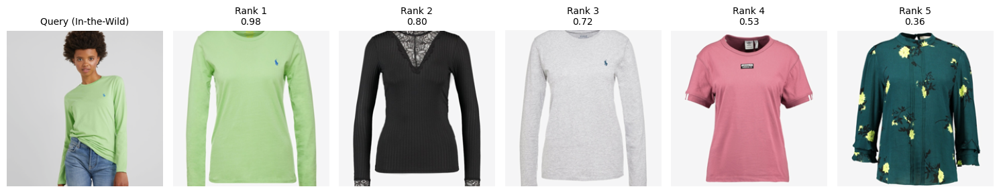

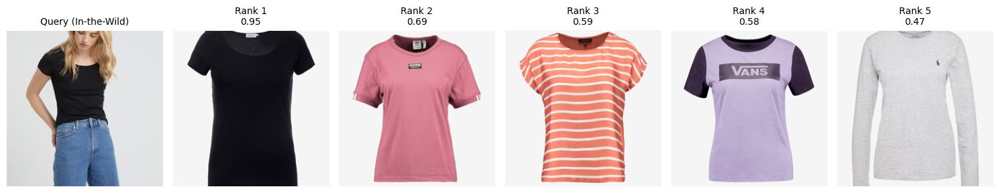

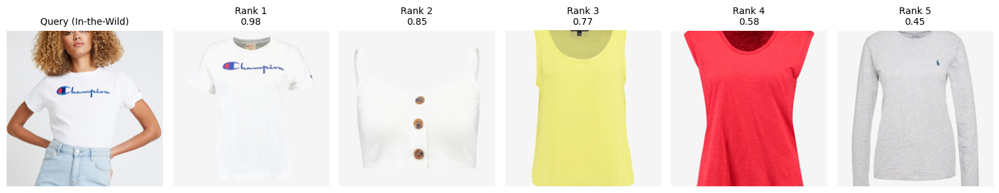

In [ ]:
# Run visualization using the best model
visualize_retrieval(model, val1_dataloader, k=5)

#### Computing the embeddings with StructureNet

In [ ]:
# Call StructureNet model on 1 image
def inference(model: DualStructureNetEncoder, x_itw: torch.Tensor, attr_ids: torch.Tensor, device: str = "cuda") -> torch.Tensor:

    model.to(device)  # Move model to device
    model.eval()  # Set to evaluation mode

    x_itw = x_itw.unsqueeze(0).to(device)
    attr_ids = attr_ids.unsqueeze(0).to(device)

    with torch.no_grad():
        embeddings_itw, _ = model(x_itw, attr_ids)
        return embeddings_itw

# Call StructureNet on a set of images
def inference_set(model: DualStructureNetEncoder, dataloader, image_type, device = "cuda") -> torch.Tensor:

    all_embeddings = []
    num_batches = len(dataloader)

    model.to(device)  # Move model to device
    model.eval()  # Set to evaluation mode

    with torch.no_grad():
      if image_type == "itw":
        for i, (images,_, attr_ids) in enumerate(dataloader):
            images = images.to(device)
            attr_ids = attr_ids.to(device)

            e_itw, _ = model(images, attr_ids)
            all_embeddings.append(e_itw.cpu())  # move to CPU to save memory
      elif image_type == "std":
        print("std")
        for i, (_, images, attr_ids) in enumerate(dataloader):
          images = images.to(device)
          attr_ids = attr_ids.to(device)

          _, e_std = model(None, attr_ids, images)
          all_embeddings.append(e_std.cpu())

          print(f"Batch {i+1}/{num_batches} processed, {num_batches-(i+1)} remaining")

    # Concatenate all batches into a single tensor
    all_embeddings = torch.cat(all_embeddings, dim=0)  # shape: [num_images, 768]
    print(all_embeddings.shape)
    return all_embeddings



In [ ]:
# Attribute vocabulary
vocab_path = "./NN_Project/Attributes/attribute_vocab.pkl"
with open(vocab_path, "rb") as f:
       attribute_vocab = pickle.load(f)

# StructureNet model
model = DualStructureNetEncoder(vocab_size=len(attribute_vocab))
model.load_state_dict(torch.load("./NN_Project/structure_net2.pth", map_location=device))


In [ ]:
# Generating the in the wild embeddings for the TEST images

# Attribute pre-computed for the test images
file_path = "./NN_Project/Attributes/attributes_data_test.pkl"
with open(file_path, "rb") as f:
       attributes_data_test = pickle.load(f)

# Test dataset
validation_set = GarmentDataset(dataset_test_dir, attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, selected_path="./NN_Project/test_image.txt")
val1_dataloader = DataLoader(validation_set, batch_size=8, shuffle=False)

embeddings = inference_set(model, val1_dataloader, image_type = "itw", device=device)
print(embeddings.shape)  # should be [num_images, 768]

# Save embeddings in a pickle file
with open("./NN_Project/StructureNet_e_itw_test.pkl", "wb") as f:
    pickle.dump(embeddings, f)

Found 20 selected image pairs starting from index 0.
torch.Size([20, 768])
torch.Size([20, 768])


In [ ]:
# Generating the standard embeddings for the RETRIEVAL DB

# Attribute pre-computed for the Retrieval db
# Note: Ensure the file path, selected_path and save_path corresponds to the correct Retrieval db size (500,1000,2000)
file_path = "./NN_Project/Attributes/checkpoint/results_step2000.pkl"
with open(file_path, "rb") as f:
       attributes_data_db = pickle.load(f)

training_set = GarmentDataset(dataset_train_dir, attributes_data=attributes_data_db, attribute_vocab=attribute_vocab, selected_path="./NN_Project/retrieval_db_2000/paths.txt", start_idx = 500)
train_dataloader = DataLoader(training_set, batch_size=64, shuffle=False, num_workers=4,pin_memory=True,persistent_workers=True)

standard_embeddings = inference_set(model, train_dataloader, image_type="std", device=device)

# Save standard_embeddings in a pickle file
with open("./NN_Project/retrieval_db_2000/StructureNet_e_std.pkl", "wb") as f:
    pickle.dump(standard_embeddings, f)

# 2. Structure Locally Linear Embedding (SLLE) with a retrieval memory database
At inference time, the structure embedding $e_{itw}$ predicted by StructureNet can be ambiguous, especially  if the input in-the-wild image $x_{itw}$ contains  poses never seen during training. To solve this problem and refine the embedding, it is used **Structure Locally Linear Embedding** (SLLE) with a retrieval memory database.

<div align="center">
    <img src="https://drive.google.com/uc?export=download&id=117LcGnj3vc40bqBnJI6HZ8T08wVsdkDA" height="300">
</div>

## 2.1 Retrieval Memory Database Construction
The memory database $D$ serves as a reference for the SLLE algorithm. It is constructed from the VITON-HD training set and consists of pairs of structure embeddings and silhouette masks:

$$ D={(e_{std},L_{sil})} $$     

- **Standard embedding** $e_{std}$: the structure embedding extracted from a flat-lay image using StructureNet.    
- **Silhouette Mask** $L_{sil}$: a binary mask representing the garment’s explicit geometry, used to guide the generator in placing garment components accurately. The masks are directly taken from the VITON-HD dataset, however they are not always precise and many of them are noisy, which can negatively affect the final generation quality.

To ensure the retrieval database is high-quality and computationally efficient, I did not use the entire VITON HD training set (~13k images). Instead, it is employed **DBSCAN** (**Density-Based Spatial Clustering of Applications with Noise**) a density-based clustering algorithm to filter the data. This step serves two goals:
1. **Remove outliers**: eliminate noisy or non-standard images (with extreme perspectives or visual anomalies) that could degrade retrieval performance.
2. **Reduce redundancy**: cluster visually similar garments and perform downsampling to filter out overly similar instances, ensuring the final database covers a diverse range of styles.

The clustering quality is highly sensitive to the **Distance Threshold ε**, which defines the maximum distance between points considered as neighbors. Choosing an appropriate value is crucial to balance noise removal and cluster diversity. Testing different values I observed that:
- Small ε = 0.2: is too aggressive, almost all data points are labeled as noise, resulting in an almost empty dataset.
- Large ε = 0.6: is too permissive, the algorithm merges distinct garment styles into a single massive cluster, failing to reduce redundancy.
I therefore selected ε = 0.4, which provided a good trade-off by forming a moderate number of clusters (25) while removing approximately 3,000 outliers. This resulted in a database that is both diverse and representative.


| Epsilon | Clusters | Noise points | Observation|
| --- | --------- | ------ | -----|
| 0.1 | 0         | 11647  | All points are noise — eps too small                                               |
| 0.2 | 10        | 11494  | Almost all points are noise — too aggressive                                       |
| 0.3 | 37        | 8022   | Many small clusters, lots of noise  |
| **0.4**| 25        | 2964   | **Few large clusters, moderate noise**    |
| 0.5 | 24        | 1285   | Very large main cluster
| 0.6 | 12        | 545    | One giant cluster dominates|


---


To evaluate the trade-off between retrieval accuracy and inference speed, I generated three distinct retrieval databases of different sizes (N=500, 1000, 2000) using a cluster aware sampling strategy to preserve the structural diversity of the full dataset. Images were first grouped by cluster ID, and then samples were drawn proportionally to each cluster’s size, with at least one image selected per cluster. This approach ensures that even the smallest database maintains the structural diversity found in the full dataset.
However, empirical evaluation revealed that the $N=2000$ database yielded the most robust results. While larger databases demand higher computational resources and increase retrieval latency, the resulting gains in geometric accuracy justified the additional overhead.

In [ ]:
# Import CLIP model and procesor
clip_model = CLIPModel.from_pretrained("openai/clip-vit-large-patch14").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14")

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

In [ ]:
# 1. Encode images with CLIP

# Collect image paths
flat_lay_images = "./viton_hd/train/cloth"
image_paths = [os.path.join(flat_lay_images, f) for f in os.listdir(flat_lay_images) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

BATCH_SIZE = 32
all_embeddings = []

for i in tqdm(range(0, len(image_paths), BATCH_SIZE)):
    batch_paths = image_paths[i:i+BATCH_SIZE]
    batch_images = [Image.open(p).convert("RGB") for p in batch_paths]
    inputs = clip_processor(images=batch_images, return_tensors="pt", padding=True).to(device)

    with torch.no_grad():
        # Get standard CLIP image features
        e_std = clip_model.get_image_features(**inputs)  # [B, 768]
        e_std = F.normalize(e_std, p=2, dim=1)
        all_embeddings.append(e_std.cpu().numpy())
all_embeddings = np.concatenate(all_embeddings, axis=0) # [num_images, 768]

# Save embeddings backup
with open("./NN_Project/all_embeddings.pkl", "wb") as f:
    pickle.dump(all_embeddings, f)

In [ ]:
# If image embeddings already computed, just download them from drive
with open("./NN_Project/all_embeddings.pkl", "rb") as f:
    all_embeddings = pickle.load(f)
print(all_embeddings.shape)

(11647, 768)


In [ ]:
# 2. DBSCAN Clustering

dbscan = DBSCAN(eps=0.4, min_samples=5, metric='euclidean') # epsilon 0 0.4 chosen based on the ablation study
labels = dbscan.fit_predict(all_embeddings) # returns a label for each point (-1) for noise, (positive number) for the cluster IDs

unique, counts = np.unique(labels, return_counts=True)# counts how many points belong to each label
print("Cluster distribution:", dict(zip(unique, counts))) # How many points for each cluster
print("Num clusters (excluding noise):", len(unique) - (1 if -1 in unique else 0))
print("Noise points:", np.sum(labels == -1))


Cluster distribution: {np.int64(-1): np.int64(2964), np.int64(0): np.int64(8342), np.int64(1): np.int64(26), np.int64(2): np.int64(22), np.int64(3): np.int64(45), np.int64(4): np.int64(56), np.int64(5): np.int64(6), np.int64(6): np.int64(6), np.int64(7): np.int64(5), np.int64(8): np.int64(32), np.int64(9): np.int64(7), np.int64(10): np.int64(28), np.int64(11): np.int64(8), np.int64(12): np.int64(11), np.int64(13): np.int64(21), np.int64(14): np.int64(5), np.int64(15): np.int64(5), np.int64(16): np.int64(5), np.int64(17): np.int64(8), np.int64(18): np.int64(11), np.int64(19): np.int64(7), np.int64(20): np.int64(5), np.int64(21): np.int64(5), np.int64(22): np.int64(5), np.int64(23): np.int64(7), np.int64(24): np.int64(5)}
Num clusters (excluding noise): 25
Noise points: 2964


In [ ]:
# 3. Remove noise points (label == -1) from the dataset

mask = labels != -1
filtered_embeddings = all_embeddings[mask]
filtered_paths = [image_paths[i] for i, keep in enumerate(mask) if keep]
labels_filtered = labels[mask] # keep the labels of the filtered points

print(f"Filtered dataset size after DBSCAN: {len(filtered_paths)} (eps={0.4})")

# Save the filtered image paths
with open("./NN_Project/DBSCAN_images.txt", "w") as f:
    for path in filtered_paths:
        f.write(path + "\n")

Filtered dataset size after DBSCAN: 8683 (eps=0.4)


In [ ]:
# 4. Group by cluster and shuffle

# Create a dictionary where each key is a cluster label, and each value is a tuple (image_path, embedding).
clusters = defaultdict(list)
for path, emb, lab in zip(filtered_paths, filtered_embeddings, labels_filtered):
    clusters[lab].append((path, emb))

# Shuffle each cluster locally (to reduce intra-cluster bias)
for cluster_id in clusters:
    random.shuffle(clusters[cluster_id])


In [ ]:
# 5. Create and save retrieval DB subsets of different sizes (500, 1000, 2000)

output_sizes = [500,1000,2000]

# Transform to the desired silhouette size (1024x768 -> 1024x1024)
target_size = (1024, 1024)  # desired silhouette size
transform = T.Pad((128, 0, 128, 0), fill=0)
mask_dir = "./viton_hd/train/cloth-mask"

for size in output_sizes:
    # Cluster aware downsampling
    cluster_ids = list(clusters.keys())
    total_points = sum(len(clusters[cid]) for cid in cluster_ids) # The total number of points (8686)
    print(f"Total points in clusters: {total_points}")

    sampled = []
    for cid in cluster_ids: # for each cluster
        cluster_points = clusters[cid]
        # Proportional sampling: at least 1 image per cluster
        n_samples = max(1, int(len(cluster_points) / total_points * size)) # Take a number of samples from this cluster proportional to its size (and at least 1)
        sampled.extend(random.sample(cluster_points, min(n_samples, len(cluster_points)))) # randomly select n_samples from the cluster ensuring that I don't sample more than the size of the cluster
        print(f"Cluster {cid}: {len(cluster_points)} points, {n_samples} samples taken")

    # Fill remaining samples from largest clusters if needed
    while len(sampled) < size:
        largest_cluster = max(cluster_ids, key=lambda c: len(clusters[c]))
        remaining_points = [p for p in clusters[largest_cluster] if p not in sampled]
        if not remaining_points:
            break
        sampled.append(random.choice(remaining_points))

    # Truncate to exact size
    sampled = sampled[:size]

    # Separate paths
    subset_paths = [p for p, _ in sampled]

    out_dir = f"./NN_Project/retrieval_db_{size}"
    os.makedirs(out_dir, exist_ok=True)

    # Save image paths
    with open(os.path.join(out_dir, "paths.txt"), "w") as f:
        for path in subset_paths:
            f.write(path + "\n")

    # Save silhouette
    mask_list = []
    for filename in subset_paths:
        # Extract only the filename
        fname = os.path.basename(filename)
        mask_path = os.path.join(mask_dir, fname)

        # Load mask with PIL
        mask = Image.open(mask_path).convert("L")  # grayscale

        # Convert to tensor [1, H, W], float32
        mask_tensor = T.ToTensor()(mask)  # [1, H, W], values in (0,1)

        # Binarize: 0 or 1
        mask_tensor = (mask_tensor > 0.5).float()

        # Resize to target size (1024, 768) -> (1024, 1024)
        mask_tensor = transform(mask_tensor)

        # Append to list
        mask_list.append(mask_tensor)

    masks = np.stack(mask_list)  # [N, H, W]
    np.save(os.path.join(out_dir, "masks.npy"), masks)

    print(f"Saved retrieval DB of size {size} to {out_dir}")
    print(f"Masks: {masks.shape}")



torch.Size([1024, 1024])


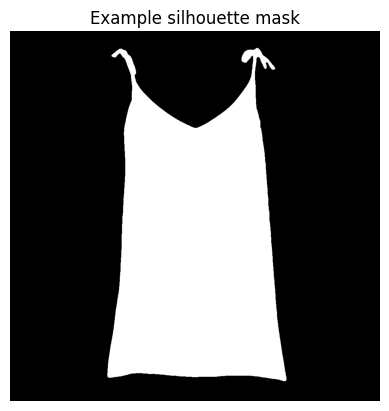

In [ ]:
# Plot an example silhouette
mask_example = mask_tensor.squeeze()  # [H, W], remove channel dim
print(mask_example.shape)
plt.imshow(mask_example, cmap="gray")
plt.title("Example silhouette mask")
plt.axis("off")
plt.show()

In [ ]:
# Function to load from drive the retrieval-db of the desired size

db_size = 2000  # choose 500, 1000, or 2000
out_dir = f"./NN_Project/retrieval_db_{db_size}"

# Load embeddings and masks
with open(f"{out_dir}/StructureNet_e_std.pkl", "rb") as f:
    E_std = pickle.load(f)
L_sil_std = torch.tensor(np.load(f"{out_dir}/masks_1024.npy"), dtype=torch.float16)

# Load paths
with open(f"{out_dir}/paths.txt", "r") as f:
    paths = [line.strip() for line in f]

retrieval_db = []
for i in range(len(paths)):
    retrieval_db.append({
        "embedding": E_std[i],
        "mask": L_sil_std[i],
        "image_id": paths[i]
    })
print(f"Loaded retrieval DB of size {len(retrieval_db)} from {out_dir}")

Loaded retrieval DB of size 2000 from ./NN_Project/retrieval_db_2000


## 2.2 SLLE
Given an in-the-wild embedding $e_{itw}$, the goal is to reconstruct a refined embedding $\hat{e}_{itw}$ and a corresponding silhouette mask $\hat{L}_{sil}$. I implemented a modified version of SLLE that decouples the embedding reconstruction from the silhouette generation.

For the **embedding** reconstruction **$\hat{e}_{itw}$** the process is the following:
1. Retrieve the K nearest neighbors ($ {e_{std_1}, …, e_{std_k}} $) from the retrieval db D using Cosine Similarity.
2. Solve a least-squares problem to find the optimal weights $w^*$ that reconstruct $e_{itw}$ using a weighted sum of its k standard embeddings neighbors.

$$\min_w \left\| e_{itw} - \sum_{i=1}^{K} w_i e_{std}^i \right\|^2 \quad \text{s.t.} \quad \sum_{i=1}^{K} w_i = 1 $$

3. At inference time, the refined embedding $\hat{e}_{itw}$ is computed by interpolating between the original input and the reconstructed neighbors, controlled by hyperparameter $\alpha$.

$$\hat{e}_{itw} = \alpha \left( \sum_{i=1}^{K} w_i^* e_{std}^i \right) + (1-\alpha) e_{itw}$$


The original SLLE method computes the **silhouette** **$\hat{L}_{sil}$** linearly interpolating the top-k binary masks using the optimal weights $w^∗$. However, averaging binary geometric masks often introduces artifacts and blurred boundaries.

To address this limitation, I replaced the interpolation step with a Cohesion-based Prototype selection strategy that identifies a single, structurally consistent silhouette from the retrieved neighborhood.
1. First it is retrieved a larger pool of candidates ($N = 25$) from the database.
2. Cohesion-based Re-ranking step: Then it is calculated the Cohesion Score $S_i$ for each candidate $i$, defined as its average Intersection-over-Union (IoU) with all other $N-1$ candidates. This score measures how representative each mask is of the local neighborhood:

$$S_i = \frac{1}{N-1} \sum_{j \neq i} \text{IoU}(L_{sil}^i, L_{sil}^j)$$

3. Prototype selection: the final silhouette $\hat{L}_{sil}$ is the mask with the highest cohesion score.



---



As shown in the following cells, this strategy effectively eliminates ghosting artifacts, yielding valid silhouettes for most of the samples.

I measured the geometric accuracy of the retrieved masks on the 20 image test subset, using the Mean IoU and Precision (>0.85 IoU). This last metric measured the number of accurate masks as defined in the original paper [1], where a silhouette is considered correct if its Intersection over Union (IoU) exceeds 0.85. The results are showed in the table below:

|Metric |Result (n=20) |Interpretation|
| --- | --- | --- |
|Mean IoU  | 0.8244 | High overall geometric overlap |
|Precision (IoU > 0.85) | 55.00% | Successful high-fidelity retrieval for 11/20 cases |

While the IoU has a high value, the precision indicates that in cases of ambiguous retrieval scenarios (e.g., mixed sleeve lengths), the cohesion strategy may occasionally select the geometric centroid of an incorrect majority (e.g., short sleeves) rather than the true shape.


This are examples of silhouette generated with standard SLLE:
<div align="center">
    <img src="https://drive.google.com/uc?export=download&id=12XN1Ilz7JIrqWcLr7ART7adftDDEf9GA" height="600">
</div>


In [ ]:
# Function that implements slle for the embeddings and a prototype selection based on cohesion score for the masks

def slle_reconstruct(e_itw, retrieval_db, N=25, K=5, alpha=0.5):

    # Retrieve the N neighbors
    E_std = torch.stack([torch.from_numpy(item["embedding"]) for item in retrieval_db]).to(device)
    L_sil_std = torch.stack([item["mask"] for item in retrieval_db]).to(device)
    e_itw = e_itw.unsqueeze(0) if e_itw.ndim == 1 else e_itw
    E_std = E_std.unsqueeze(0) if E_std.ndim == 1 else E_std
    e_itw = e_itw.to(device)

    e_itw_norm = F.normalize(e_itw, dim=1)
    E_std_norm = F.normalize(E_std, dim=1)

    cos_sim = torch.matmul(E_std_norm, e_itw_norm.T).squeeze()
    _, top_n_indices = torch.topk(cos_sim, N, largest=True)

    initial_embeddings = E_std[top_n_indices]
    initial_masks_binary = (L_sil_std[top_n_indices] > 0.5).float() # [K, 1, H, W]

    # Choose only the first k candidates for the embeddings
    top_k_semantic_indices = top_n_indices[:K]
    semantic_neighbor_embeddings = E_std[top_k_semantic_indices] # [K, D]

    # Compute the cohesion score for the N masks
    cohesion_scores = torch.zeros(N, device=device)
    for i in range(N): # Compute the score for the i-th mask
        iou_sum = 0
        for j in range(N): #Compare the i-th mask with all the other j
            if i == j: continue
            intersection = (initial_masks_binary[i] * initial_masks_binary[j]).sum()
            union = initial_masks_binary[i].sum() + initial_masks_binary[j].sum() - intersection
            iou_sum += intersection / (union + 1e-6)
        cohesion_scores[i] = iou_sum / (N - 1) # The final score of the mask i

    # Select the most cohesive mask L_sil_hat
    _, top_k_indices = torch.topk(cohesion_scores, K)
    best_prototype_mask = initial_masks_binary[top_k_indices[0]]
    L_sil_hat = best_prototype_mask.unsqueeze(0) # Shape to [1, 1, H, W]

    # Embedding reconstruction e_hat (standard SLLE)
    # Prepare the matrices for Least Squares: Aw = b
    A = semantic_neighbor_embeddings.T # [768,k] matrix of neighbor embeddings
    b = e_itw.squeeze(0)  # [768]

    # Enforce the constraint sum(w) = 1
    A_aug = torch.cat([A, torch.ones(1, K, device=device)], dim=0)
    b_aug = torch.cat([b, torch.tensor([1.0], device=device)])

    # Solve the constrained least squares problem to find optimal weights w*.
    # minimizing || A_aug * w - b_aug ||^2
    res = torch.linalg.lstsq(A_aug, b_aug.unsqueeze(1))
    weights = res.solution.squeeze()
    weights = weights / weights.sum()

    # Reconstruct the embedding using the optimal weights, e_recon = sum(w_i * e_std_i)
    e_recon = torch.sum(weights.unsqueeze(1) * semantic_neighbor_embeddings, dim=0)
    # Fuse the original and reconstruct embeddings
    e_hat = alpha * e_recon + (1 - alpha) * e_itw.squeeze(0)

    return e_hat, e_recon, weights, top_k_indices, L_sil_hat

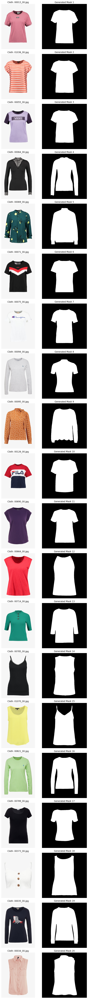

In [ ]:
# Show the result of my modified slle_reconstruct

# Structure Embedding extraction from StructureNet (I saved them on drive)
with open("./NN_Project/StructureNet_e_itw_test.pkl", "rb") as f:
    all_e_itw = pickle.load(f)

file_path = "./NN_Project/Attributes/attributes_data_test.pkl"
with open(file_path, "rb") as f:
       attributes_data_test = pickle.load(f)

transform = T.Compose([
    T.Pad((128, 0, 128, 0), fill=0),
    T.ToTensor(),   # converts to [0,1]
    T.Normalize([0.5], [0.5])  # maps to [-1,1]
])

validation_set = GarmentDataset(dataset_test_dir , attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, transform=transform, selected_path="./NN_Project/test_image.txt")
val1_dataloader = DataLoader(validation_set, batch_size=8, shuffle=False)

num_images = 20

# Create a single figure with 2 columns and a row for each image
fig, axes = plt.subplots(num_images, 2, figsize=(8, num_images * 4))

for i in range (len(validation_set)):
  # Get the i-th embedding and the i-th image
  current_e_itw = all_e_itw[i]
  original_image, _, _ = validation_set[i]

  e_final, e_recon, weights, indices, l_sil_hat = slle_reconstruct(current_e_itw, retrieval_db, N=25, K=4, alpha=0.5)

  # Plot the Generated Silhouette
  # Get the path for the corresponding cloth image
  base_image_path = selected_images[i]
  cloth_path = base_image_path.replace("image", "cloth")
  filename = os.path.basename(base_image_path)

  # Plot the cloth image on the left column (axes[i, 0])
  ax_left = axes[i, 0]
  if os.path.exists(cloth_path):
      cloth_image = plt.imread(cloth_path)
      ax_left.imshow(cloth_image)
      ax_left.set_title(f"Cloth: {filename}")
  else:
      ax_left.text(0.5, 0.5, "Cloth not found", ha='center', va='center')
      ax_left.set_title(f"Cloth: {filename} (Not found)")
  ax_left.axis("off")

  # Plot the generated mask on the right column (axes[i, 1])
  ax_right = axes[i, 1]
  # Process the tensor l_sil_hat
  mask_to_plot = l_sil_hat.squeeze().detach().cpu().numpy()
  ax_right.imshow(mask_to_plot, cmap="gray")
  ax_right.set_title(f"Generated Mask {i+1}")
  ax_right.axis("off")

plt.tight_layout()
plt.show()



In [ ]:
# Compute Intersection Over Union of 2 binary masks
def calculate_iou(gen_mask, gt_mask):
    # Ensure masks are boolean
    gen_mask = (gen_mask > 0.5)
    gt_mask = (gt_mask > 0.5)

    intersection = np.logical_and(gen_mask, gt_mask).sum()
    union = np.logical_or(gen_mask, gt_mask).sum()

    if union == 0:
        return 1.0 # Avoid division by zero if both are empty
    return intersection / union

mask_transform = T.Compose([
    T.Pad((128, 0, 128, 0), fill=0)
])

iou_scores = []
precision_85 = 0 # To check the "IoU > 0.85" protocol from the paper

# Path with selected images
with open("./NN_Project/test_image.txt", "r") as f:
    selected_images = f.readlines()
    selected_images = [img.strip() for img in selected_images]
for i in range(len(validation_set)):
    # 1. Get Generated Mask
    current_e_itw = all_e_itw[i]
    _, _, _, _, l_sil_hat = slle_reconstruct(current_e_itw, retrieval_db)
    gen_mask_np = l_sil_hat.squeeze().detach().cpu().numpy()

    # 2. Load Ground Truth Mask
    base_image_path = selected_images[i]
    gt_mask_path = base_image_path.replace("image", "cloth-mask")

    if os.path.exists(gt_mask_path):
        gt_mask = plt.imread(gt_mask_path)
        if len(gt_mask.shape) == 3: gt_mask = gt_mask[:,:,0] # Handle RGB masks

        # Resize GT to match generated mask if necessary
        if gt_mask.shape != gen_mask_np.shape:
             # 1. Convert Numpy -> Tensor (Add channel dim for transform [1, H, W])
             gt_tensor = torch.from_numpy(gt_mask.copy()).unsqueeze(0)

             # 2. Apply Transform (Pad works on Tensors)
             gt_mask_tensor = mask_transform(gt_tensor)

             # 3. Convert back to Numpy and overwrite gt_mask
             gt_mask = gt_mask_tensor.squeeze().numpy()

        # 3. Compute Score
        score = calculate_iou(gen_mask_np, gt_mask)
        iou_scores.append(score)
        if score > 0.85:
            precision_85 += 1

# --- Final Metrics ---
mean_iou = sum(iou_scores) / len(iou_scores)
accuracy_85 = (precision_85 / len(iou_scores)) * 100

print(f"Mean IoU: {mean_iou:.4f}")
print(f"Precision (IoU > 0.85): {accuracy_85:.2f}%")

Mean IoU: 0.8244
Precision (IoU > 0.85): 55.00%


# 3. SDXL Generator with 3 conditioning levels
The final stage of the project is to integrate the retrieved structural information into the generative process. It is used Stable Diffusion XL (SDXL) backbone, conditioned at three distinct levels aiming at semantic fidelity, geometric accuracy, and texture consistency.
The generator receives four key conditioning inputs derived from the previous steps:
1. $\hat{e}_{itw}$ (**Refined Structure Embedding**): the output of the SLLE module, injected via the EP-Adapter to provide the semantic structural layout (Soft Constraint).
2. $\hat{L}_{sil}$ (**Prototype Silhouette**): the geometrically valid mask selected via Cohesion-Based Re-ranking, processed by ControlNet to guide the explicit shape (Hard Constraint).
3. **Prompt** generated by a LLM, which provides explicit semantic context regarding attributes such as color, pattern, and fabric type.
4. $z_{ref}$ (**Reference Latent**): The VAE-encoded latent representation of the original in-the-wild garment, serving as the source for high-frequency texture details (processed by ReferenceNet).

## Backbone: Stable Diffusion XL (SDXL)   

It is used Stable Diffusion XL (SDXL) Base 1.0 as generative backbone. Compared to previous latent diffusion models, SDXL features a larger U-Net (3.5B vs 1.3B parameters) for richer semantic reasoning and texture synthesis. It utilizes dual text encoders to simultaneously capture high-level concepts and fine-grained details and operates at a native resolution of(1024 x 1024)  ensuring high resolution outputs.


<div align="center">
    <img src="https://drive.google.com/uc?export=download&id=1r6hHSclZTPIL_9IBLSizseS5aK3Ov6j1" height="180">
</div>


In [ ]:
# Load the SDXL Base 1.0 Pipeline
print(f"Using device: {device}")
# Use fp16 (half-precision) and safetensors for memory efficiency and speed
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
).to(device)

Using device: cuda


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

text_encoder_2/model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/50 [00:00<?, ?it/s]

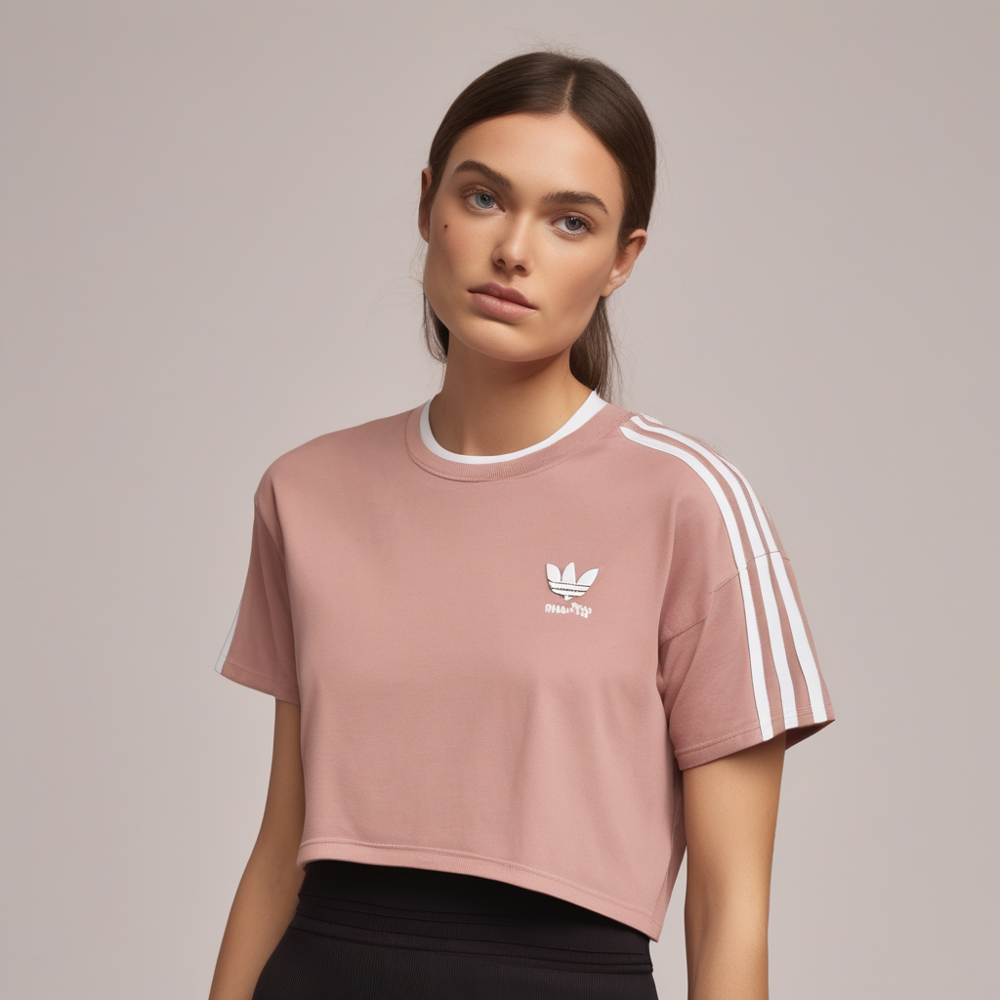

In [ ]:
# Try the SDXL model with a test prompt generated by the LLM
prompt = "A dusty pink, short-sleeved t-shirt with a round neckline, featuring a small logo patch on the left chest and three white stripes on each sleeve, fits snugly and is cropped at the waist."
image = pipe(prompt).images[0]
from IPython.display import display
display(image)


In [ ]:
# The main unet (denoising network) that will be modified
MainUnet = pipe.unet


In [ ]:
print(MainUnet)

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (add_time_proj): Timesteps()
  (add_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=2816, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 320, eps=1e-05, affine=True)
          (conv1): Conv2d(320, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=1280, out_features=320, bias=True)
          (norm2): GroupNorm(32, 320, eps=1e-05, affine=True)
          (dropout): Dropout(p=

## Step 1: Structure faithfulness

#### Soft Constraint: EP-Adapter
To incorporate the refined structural embedding $ \hat e_{itw}$ produced by SLLE into the SDXL generation process and preserve the global garment structure, it is introduced the **Embedding Prompt Adapter (EP-Adapter)**. Inspired by IP-Adapter, it modifies the cross-attention mechanism of the SDXL U-Net to enable conditioning on both textual and structural information.

In SDXL’s Transformer Block, the first attention layer (attn1) performs self-attention over the U-Net’s image features, while the second layer (attn2) applies cross-attention to condition the image generation on text embeddings from the CLIP encoder. EP-Adapter augments this cross-attention layer by adding a parallel attention term, allowing the U-Net queries Q to attend to both text and structure embeddings:

$$ Attention(Q, K_{text}, V_{text}) + Attention(Q, K_{image}, V_{image}) $$

Here, the queries Q are derived from the U-Net’s intermediate image features, while the keys and values come from the text encoder $(K_{text}, V_{text})$ and the structure embeddings $(K_{image}, V_{image})$ produced by EP-Adapter.

Directly injecting the structure embeddings $ \hat e_{itw}\in \mathbb{R}^{768}$ is impossible as the cross-attention mechanism computes attention scores via the dot product between the Queries (Q), derived from the U-Net’s intermediate features and aligned with the 2048-dimensional OpenCLIP text embedding space, and the Keys (K) wich must share the same dimensionality for the $QK^T$ operation to be valid. To resolve this mismatch, a **Resampler module** (defined in the previous section 1.2) is employed.
The structure embeddings are first projected and expanded with learnable latent tokens, then refined through four Perceiver-style cross-attention and feed-forward networks, and finally linearly mapped to 2048 dimensions, producing structure-conditioned Key and Value matrices $ K_{image}, V_{image} $ with shape [B, Num_queries, 2048].

Overall, the EP-Adapter introduces a **Soft structural constraint through structure embeddings** that preserves standard text conditioning while injecting the guidance from the structure embeddings derived from theh previous steps. This enables the model to follow both the semantic instructions provided by the LLM prompt and the geometric constraints derived from StructureNet.


**Implementation Note:** For the scope of this project, I implemented the full EP-Adapter architecture to demonstrate the validity of the end-to-end multimodal pipeline. However, due to the significant computational resources required to align the StructureNet embedding space with SDXL (typically involving thousands of GPU hours on large-scale datasets), the adapter weights remain randomly initialized. Consequently, the generation quality primarily depends on the strong geometric guidance of the Silhouette Constraint ($\hat{L}_{sil}$) and the semantic control of the LLM prompt.


<div align="center">
    <p><strong> Main Net</strong></p>
    <img src="https://drive.google.com/uc?export=download&id=1ZP7HVp9f-hAelekGLdyI-EP2pVhyP-og" height="200">
</div>

#### Hard Constraint: Landmark Guider
To provide an explicit **hard spatial constraint** that enforces the retrieved garment silhouette, the original architecture proposed a custom "Landmark Guider" CNN trained from scratch. However, converging such a spatial module requires resources beyond the scope of this project.

To achieve robust geometric control, I integrated the pre-trained **ControlNet-Canny (SDXL 1.0)**. This substitution is architecturally sound because the binary Silhouette Mask effectively functions as a strong edge map, which the Canny model is expert at interpreting.

ControlNet operates by running a parallel copy of the SDXL U-Net encoder layers. It learns geometric residual feature maps that encode the shape constraints, which are injected directly into the main U-Net's encoder and middle blocks via additive connections:

$$\text{Feature}_{main}^{(i)} = \text{Feature}_{main}^{(i)} + \alpha \cdot \text{Feature}_{control}^{(i)}$$
where $\alpha$ is the control scale that regulates the strength of the geometric guidance, ensuring the silhouette is respected without overpowering the semantic representations of the base model.

In [ ]:
# EPAdapter:
class EPAdapter(nn.Module):
    def __init__(self, structure_dim=768, embed_dim=2048):
        super().__init__()

        # Resampler to map structure embedding to embed_dim 768->2048
        self.resampler = Resampler(input_dim=structure_dim, num_queries = 8, output_dim=embed_dim, return_tokens = True) # output_dim must match UNet cross-attn dim (2048 for SDXL)
        # Linear Projections for cross-attention
        self.k_proj = nn.Linear(embed_dim, embed_dim)
        self.v_proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, structure_embeddings): # structure_embeddings: [B, structure_dim] from SLLE

        batch_size = structure_embeddings.shape[0]
        structure_tokens = self.resampler(structure_embeddings) # [B, num_queries, embed_dim]

        # Project to Key and Value vectors
        K_struct = self.k_proj(structure_tokens)
        V_struct = self.v_proj(structure_tokens)

        return K_struct, V_struct #[B, num_queries, embed_dim]



In [ ]:
# Since the EP-Adapter weights aren't trained their output magnitude may not match the distribution expected by the pre-trained SDXL U-Net.
# I need to balance the the structure signal relative to the text signal
def scale_reference_output(attn_output_main, attn_output_ref, clip_max=2, eps=1e-6):
    """
    attn_output_main: [B, H, L, D], text attention output (text)
    attn_output_ref: [B, H, L_ref, D], structure attention output
    eps: small value to avoid division by zero
    """
    # Compute standard deviation of both signals
    std_main = attn_output_main.std(dim=(-3, -2, -1), keepdim=True)
    std_ref = attn_output_ref.std(dim=(-3, -2, -1), keepdim=True)

    # Compute the normalization ratio, how much we need to boost (or shrink) the structure signal to match the text
    alpha = std_main / (std_ref + eps)

    # Clip alpha to avoid extreme scaling
    alpha = alpha.clamp(max=clip_max)

    # Apply scaling
    attn_output_ref_scaled = attn_output_ref * alpha
    return attn_output_ref_scaled


In [ ]:
# CROSS ATTENTION, to replace in the U-Net of SDXL

class DualCrossAttention(Attention): # inherit from the CrossAttention class used in SDXL
    """
    Cross-Attention that combines text features (K_text, V_text) and structure features (K_struct, V_struct) from EP-Adapter.
    Attention(Q, K_text, V_text) + Attention(Q, K_struct, V_struct)
    """
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.encoder_kv_struct = None

    def forward(
        self,
        hidden_states, # The hidden states (output of the previous U-Net layer at the current resolution) [B, Lt, embed_dim], Lt depends on the current resolution
        encoder_hidden_states=None, # Text embeddings [B, L_text, embed_dimension]
        attention_mask=None,
        **kwargs  # Accept any additional keyword arguments
    ):

        # 1. Project hidden_states of UNet into query (Q)
        q = self.to_q(hidden_states) # Linear projection [B, Lt, embed_dim]
        q = self.head_to_batch_dim(q) # Rearrange for multi-head attention [B * num_heads, Lt, d=embed_dim//num_heads], num_heads = 16 for SDXL

        # 2. Text K, V (Standard SDXL logic)
        k_text = self.to_k(encoder_hidden_states) # [B, L_text, embed_dim]
        v_text = self.to_v(encoder_hidden_states)
        k_text = self.head_to_batch_dim(k_text) # [B * num_heads, L_text, d]
        v_text = self.head_to_batch_dim(v_text)

        # Compute attention for text features
        attn_output_text = F.scaled_dot_product_attention(
            q, k_text, v_text,
            attn_mask=None,
            dropout_p=0.0,
            is_causal=False
        ) # [B, num_heads, Lt, d]


        # 3. Structure K,V
        attn_output_struct = 0
        if self.encoder_kv_struct is not None:
            k_struct, v_struct = self.encoder_kv_struct

            # Ensure dtype matches the Linear layer weights
            k_struct = k_struct.to(self.to_k.weight.dtype)
            v_struct = v_struct.to(self.to_v.weight.dtype)

            # Apply same projection as text features
            k_struct = self.to_k(k_struct) # [B, L_struct, embed_dim]
            v_struct = self.to_v(v_struct)
            k_struct = self.head_to_batch_dim(k_struct) #[B * num_heads, L_struct, d]
            v_struct = self.head_to_batch_dim(v_struct)

            attn_output_struct = F.scaled_dot_product_attention(
                q, k_struct, v_struct,
                attn_mask=None,
                dropout_p=0.0,
                is_causal=False
            ) # [B, num_heads, Lt, d]

            attn_output_struct_scaled = scale_reference_output(attn_output_text, attn_output_struct)

            # Sum the outputs
            combined_output = attn_output_text + attn_output_struct_scaled
        else:
            combined_output = attn_output_text

        combined_output = self.batch_to_head_dim(combined_output)
        combined_output = self.to_out[0](combined_output)  # Linear projection
        combined_output = self.to_out[1](combined_output) # Dropout

        return combined_output

In [ ]:

def replace_cross_attn_with_dual(module: nn.Module):
   # Recursively replace every cross-attention layer 'attn2' with DualCrossAttention.

    for name, child in module.named_children():
        if isinstance(child, Attention) and name == "attn2":
            child.__class__ = DualCrossAttention
            child.encoder_kv_struct = None
        else:
            replace_cross_attn_with_dual(child)


## Step 2: Pattern faithfulness:

To preserve textures, logos, and fine details it is implemented a Reference-Attention mechanism inspired by the architecture *AnimateAnyone* [5] .

I introduced **ReferenceNet**, a parallel U-Net encoder that is isomorphic (shares the same architecture and initial weights) to the main denoising U-Net (MainNet).
- **MainNet**: Processes the noisy latent $z_t$ to generate the target image.
- **ReferenceNet**: Processes the clean latent of the in-the-wild garment image to extract intermediate spatial features  

In standard diffusion models, self-attention operates only within a single image, allowing pixels to attend to each other to enforce global coherence. With this modification, the MainNet is additionally allowed to attend to the pixels of the Reference Image. At each self attention layer:
- Feature Extraction: MainNet produces Queries, Keys, and Values ($ {z_M^q, z_M^k, z_M^v} ∈ ℝ^{N×l×d}$), while ReferenceNet produces Keys and Values ($ {z_R^k, z_R^v} ∈ ℝ^{N×l×d}$)
- Concatenation: The Keys and Values from both networks are concatenated along the sequence dimension to obtain $ {z_C^k, z_C^v} ∈ ℝ^{N×2l×d}$.
- The MainNet queries attend to this combined sequence: $ Attention(z_M^q, z_C^k, z_C^v) = softmax\left(\frac{z_M^q(z_C^k)^T}{\sqrt{d}}\right)z_C^v$, queries from MainNet, keys and values from the concatenated features.   

<div align="center">
    <img src="https://drive.google.com/uc?export=download&id=1VbTAMt2oP4uNc9waAUr30n5YKlSeIys2" height="200">
</div>

Although the ReferenceNet and MainNet are architecturally parallel, I optimized the inference pipeline by decoupling their execution phases. Prior to the denoising loop, the image reference latent (encoded via the SDXL VAE) is passed through the ReferenceNet in a single forward pass. The FeatureExtractor intercepts and caches the Key and Value matrices ($K_{ref}, V_{ref}$) from the self-attention layers. These cached features are injected into the corresponding MainNetAttnProcessor modules, and then during the iterative generation, the MainNet retrieves these pre-computed features directly from memory. This strategy eliminates the need to re-execute the ReferenceNet at each diffusion step, introducing only a negligible computational overhead.

In [ ]:
class MainNetAttnProcessor(AttnProcessor):
    # Processor for MainNet self-attention that that concatenates K,V from ReferenceNet.

    def __init__(self):
        super().__init__()
        self.reference_kv = None

    def set_reference_features(self, k_ref: torch.Tensor, v_ref: torch.Tensor, alpha: float = 1.0):

        if k_ref is None or v_ref is None:
            self.reference_kv = None
            return

        k_ref = k_ref.detach()
        v_ref = v_ref.detach()

        self.alpha = alpha
        self.reference_kv = (k_ref, v_ref )

    def __call__(
        self,
        attn,
        hidden_states,
        encoder_hidden_states=None,
        attention_mask=None,
        **cross_attention_kwargs,
    ):

        # 1. Standard Self-Attention Projections for MainNet
        q = attn.to_q(hidden_states)
        k_main = attn.to_k(hidden_states) # [B, L_main, D]
        v_main = attn.to_v(hidden_states) # [B, L_ref, D]

        # 2. Inject Reference Features (If present)
        if self.reference_kv is not None:
            k_ref, v_ref = self.reference_kv
            k_ref = k_ref.to(k_main.device)
            v_ref = v_ref.to(v_main.device)

            eps = 1e-6
            # compute mean/std over last dim (feature dim) keeping dims for broadcasting
            mean_main = k_main.mean(dim=-1, keepdim=True)
            std_main  = k_main.std(dim=-1, keepdim=True)
            mean_ref  = k_ref.mean(dim=-1, keepdim=True)
            std_ref   = k_ref.std(dim=-1, keepdim=True)
            mean_v_ref  = v_ref.mean(dim=-1, keepdim=True)
            std_v_ref   = v_ref.std(dim=-1, keepdim=True)
            mean_v_main = v_main.mean(dim=-1, keepdim=True)
            std_v_main  = v_main.std(dim=-1, keepdim=True)

            # Align Reference statistics to Main statistics
            k_ref_norm = (k_ref - mean_ref) / (std_ref + eps)
            v_ref_norm = (v_ref - mean_v_ref) / (std_v_ref + eps)

            # This preserves the strength of the signal while ensuring statistical alignment.
            k_ref_matched = (k_ref_norm * self.alpha) * std_main + mean_main
            v_ref_matched = (v_ref_norm * self.alpha) * std_v_main + mean_v_main

            # 3. Concatenate along Sequence Dimension
            k = torch.cat([k_main, k_ref_matched], dim=1)
            v = torch.cat([v_main, v_ref_matched], dim=1)
            #print("k_main and k_ref shape", k_main.shape, k_ref.shape)

            if attention_mask is not None:
                pass

        else:
            k, v = k_main, v_main

        # Multi head attention
        q = attn.head_to_batch_dim(q)
        k = attn.head_to_batch_dim(k)
        v = attn.head_to_batch_dim(v)

        # Run Attention
        out = F.scaled_dot_product_attention(
            q, k, v,
            attn_mask=attention_mask,
            dropout_p=0.0,
            is_causal=False
        )

        # Merge heads
        out = attn.batch_to_head_dim(out)

        # Final projection
        out = attn.to_out[0](out)
        out = attn.to_out[1](out)

        # Clear reference (one-shot use)
        self.reference_kv = None
        return out


In [ ]:

# Extract K,V from ReferenceNet
class FeatureExtractor:
    """Extracts K,V features from ReferenceNet attention layers using hooks"""
    def __init__(self):
        self.features = {}  # Dictionary to store extracted features (key, value pairs) by layer name
        self.hooks = []  # List that maintains references to all registered forward hooks
        self.attention_layers = []  # List of tuples (layer_name, attention_layer)

    # Register forward hooks to extract K,V from attention layers
    def register_hooks(self, reference_unet):
        if self.hooks:
            self.remove_hooks()
        self.attention_layers.clear()

        # Collect all self-attention layers (attn1)
        for name, module in reference_unet.named_modules():
            is_self_attention = isinstance(module, Attention) and "attn1" in name
            if is_self_attention :
                self.attention_layers.append((name, module))

        def create_hook(layer_name):
            def hook_fn(module, inputs, output):
                # inputs[0] is the hidden_states passed into this ReferenceNet Attention
                ref_hidden = inputs[0]
                # use the reference module's projection layers to compute k_ref, v_ref
                with torch.no_grad():
                    k_ref = module.to_k(ref_hidden)    # shape: (B, L_ref, all_head_dim)
                    v_ref = module.to_v(ref_hidden)    # shape: (B, L_ref, all_head_dim)

                    self.features[layer_name] = {
                        'k_ref': k_ref.detach(),
                        'v_ref': v_ref.detach(),
                        'hidden': ref_hidden.detach()
                    }
            return hook_fn

        # Register hooks
        for name, module in self.attention_layers:
            hook = module.register_forward_hook(create_hook(name))
            self.hooks.append(hook)

        if not self.hooks:
            print("WARNING: No self-attention hooks registered in ReferenceNet!")

    # Remove all registered hooks
    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks.clear()
        self.attention_layers.clear()

    # Clear stored K/V for next forward pass
    def clear_features(self):
        self.features.clear()


# Final Pipeline Integration

## Custom RAG Unet

To integrate the three asynchronous guidance signals, Structure (EP-Adapter), Geometry (ControlNet), and Pattern (ReferenceNet), without rewriting the internal logic of the diffusers library, I implemented a wrapper class CustomRAGUNet. This class inherits from the standard SDXL U-Net but intercepts the forward pass to inject external knowledge before the main denoising computation.


In [ ]:

class CustomRAGUNet(UNet2DConditionModel):
    """Wrapper around SDXL UNet for RAG: MainNet + ReferenceNet, landmark guidance, FLUX VAE support."""

    def __init__(self, main_unet, reference_unet, conv_in_16_state_path=None, device=device):
        super().__init__()
        self.main_unet = main_unet
        self.reference_unet = reference_unet

        # Precomputing K/V from ReferenceNet
        self.feature_extractor = FeatureExtractor()
        self.feature_extractor.register_hooks(reference_unet)

        # EPAdapter for structure embedding that will be added in cross-attention
        self.ep_adapter = EPAdapter(structure_dim=768, embed_dim=2048)

        # For Silhouette Guidance, load the official ControlNet model
        print("Loading official pre-trained Canny Edge ControlNet for SDXL...")
        try:
            self.controlnet = ControlNetModel.from_pretrained(
                "diffusers/controlnet-canny-sdxl-1.0",
                torch_dtype=main_unet.dtype # Match the dtype of the main model
            ).to(device)
            print("SUCCESS: Pre-trained ControlNet loaded.")
        except Exception as e:
            print(f"ERROR: Could not load pre-trained ControlNet: {e}")
            self.controlnet = None

        # This implementation supports a configuration that uses the FLUX VAE with 16-channel latents
        # In this case, the standard SDXL U-Net input/output layers (4 channels) are replaced with
        # learned adapter layers ('conv_in_16' and 'conv_out_16') to handle 16-channel latents.
        # However, this configuration was not used in the final experiments due to computational constraints.
        if conv_in_16_state_path:
            # conv_in_16 for FLUX VAE
            self.conv_in_16 = nn.Conv2d(16, 320, kernel_size=3, stride=1, padding=1).to(device)
            state_dict = torch.load(conv_in_16_state_path, map_location=device)
            self.conv_in_16.load_state_dict(state_dict)

            # Cast to half if main_unet is half
            if next(main_unet.parameters()).dtype == torch.float16:
                self.conv_in_16 = self.conv_in_16.half()

            # Add conv_out mapping from UNet internal channels to flux-latent channels (16)
            self.conv_out_320_to_16 = nn.Conv2d(320, 16, kernel_size=3, stride =1, padding =1,).to(device)
            state_dict = torch.load("./NN_Project/conv_out_320_to_16_aligned_1.pt", map_location=device)
            self.conv_out_320_to_16.load_state_dict(state_dict)
        else:
          self.conv_in_16 = None

        self.install_mainnet_processors()
        self._connect_attention_layers()


    # Replace Self Attention in MainNet
    def install_mainnet_processors(self):
      for name, module in self.main_unet.named_modules():
          if isinstance(module, Attention) and not module.is_cross_attention:
              module.set_processor(MainNetAttnProcessor())

    def _collect_self_attn(self, unet):
        return [(name, m) for name, m in unet.named_modules() if isinstance(m, Attention) and getattr(m, "is_cross_attention", False) is False]

    # Mapping MainNet ReferenceNet (to inject the key/value features from a specific ReferenceNet layer into exactly the same layer in the MainNet)
    def _connect_attention_layers(self):
        self.attention_mapping = {}
        self.cross_attention_mapping = {}

        # Collect all Self-Attention layers from both networks
        main_sa = self._collect_self_attn(self.main_unet)
        ref_sa  = self._collect_self_attn(self.reference_unet)

        # Create a lookup for ReferenceNet layers
        ref_dict = dict(ref_sa)
        matched = 0
        # Iterate through MainNet layers to find the corresponding layer in ReferenceNet
        for name, m in main_sa:
            if name in ref_dict:
                self.attention_mapping[name] = m
                matched += 1
            else:
                # positional fallback: find the next ref layer with the same heads & inner_dim
                for rname, rmod in ref_sa:
                    if rname in self.attention_mapping:  # already consumed
                        continue
                    if (getattr(m, "heads", None) == getattr(rmod, "heads", None) and
                        m.to_q.out_features == rmod.to_q.out_features and
                        m.to_q.in_features  == rmod.to_q.in_features):
                        self.attention_mapping[name] = m
                        matched += 1
                        break
        # cross-attention layers
        for name, module in self.main_unet.named_modules():
            if isinstance(module, DualCrossAttention):
                self.cross_attention_mapping[name] = module

        print(f"Total self-attention layers mapped: {matched} / {len(main_sa)}")
        print(f"Total cross-attention layers mapped: {len(self.cross_attention_mapping)}")

    # Inject the semantic structure (from the SLLE module) into the Cross-Attention layers
    def inject_structure_embeddings(self, structure_embeddings):
        if structure_embeddings is None:
            return

        # Process structure embeddings through EP-Adapter
        k_struct, v_struct = self.ep_adapter(structure_embeddings)

        # Inject into all DualCrossAttention layers
        for layer_name, cross_attention in self.cross_attention_mapping.items():
            cross_attention.encoder_kv_struct = (k_struct, v_struct)


    def forward(self, *args, sample, timestep, encoder_hidden_states, added_cond_kwargs, **kwargs):

        reference_latent = getattr(self, 'current_reference_latent', None)
        main_latent = getattr(self, 'current_main_latent', None) # [B, 16, H, W]
        structure_embeddings = getattr(self, 'current_structure_embeddings', None)
        landmark_mask = getattr(self, 'current_landmark_mask', None)
        use_flux_vae = added_cond_kwargs.get('use_flux_vae', False) if added_cond_kwargs else False
        main_latent = sample

        print("Entered CustomRAGUNet.forward")
        print("use_flux_vae:", use_flux_vae)
        print("main_latent.shape before conv_in should be [B, 16, H, W]:", main_latent.shape)

        # Setup to use FLUX VAE ( not used in the final experiments)
        if use_flux_vae and main_latent.shape[1] == 16:
            main_latent = self.conv_in_16(main_latent)
        if use_flux_vae and reference_latent.shape[1] == 16:
            print("Reference latent shape before conv_in", reference_latent.shape)
            reference_latent = self.conv_in_16(reference_latent)  # <-- use same conv_in_16 for ReferenceNet
            self.reference_unet.conv_in = nn.Identity()
        print("reference_latent shape after conv_in should be [B, 320, H, W]:", reference_latent.shape)

        sample = sample.to(torch.float16)
        reference_latent = reference_latent.to(torch.float16)
        encoder_hidden_states = encoder_hidden_states.to(torch.float16)
        if added_cond_kwargs is not None:
            for key in added_cond_kwargs:
                if torch.is_tensor(added_cond_kwargs[key]):
                    added_cond_kwargs[key] = added_cond_kwargs[key].to(torch.float16)

        # Step 1: Run ReferenceNet to get K_ref,V_ref
        if not self.feature_extractor.features:
            ref_timestep = torch.zeros_like(timestep)
            ref_timestep = ref_timestep.to(torch.float16)
            with torch.no_grad():
              reference_output = self.reference_unet(
                  sample = reference_latent, # clean latent of the input image
                  timestep = ref_timestep,
                  encoder_hidden_states= encoder_hidden_states,
                  added_cond_kwargs=added_cond_kwargs,
                  return_dict=False
              )
            print("Step1 finished, successfully computed k_ref and v_ref")


        # Step 2: Inject structure embeddings into cross-attention layers of MainNet
        self.inject_structure_embeddings(structure_embeddings)

        # Step 3: Process silhouette guidance (ControlNet)
        control_net_cond_scale = 0.5

        if landmark_mask is not None and self.controlnet is not None:
            control_image = landmark_mask

            control_image  = control_image.to(device=sample.device, dtype=sample.dtype)
            if control_image.shape[1] == 1:
                control_image  = control_image.repeat(1, 3, 1, 1)

            # Get the guidance "residuals" from ControlNet.
            down_block_res_samples, mid_block_res_sample = self.controlnet(
                sample,
                timestep,
                encoder_hidden_states=encoder_hidden_states,
                added_cond_kwargs=added_cond_kwargs,
                controlnet_cond=control_image, # This is the silhouette
                return_dict=False,
            )

            # Apply the scaling to the guidance signal
            down_block_res_samples = [res * control_net_cond_scale for res in down_block_res_samples]
            mid_block_res_sample = mid_block_res_sample * control_net_cond_scale
        else:
            down_block_res_samples, mid_block_res_sample = None, None

        #Step 4: Transfer reference features to the MainNet layers
        for layer_name, main_attention in self.attention_mapping.items():
          if layer_name in self.feature_extractor.features:
              #print("injecting for layer:", layer_name)
              ref_hidden = self.feature_extractor.features[layer_name]
              k_ref, v_ref = ref_hidden["k_ref"], ref_hidden["v_ref"]
              proc = main_attention.processor

              if isinstance(proc, MainNetAttnProcessor):
                  proc.set_reference_features(k_ref, v_ref, alpha=0.4)
          else:
              print("no ref for", layer_name)


        # Step 5: compute timestep embeddings
        timesteps = timestep
        if not torch.is_tensor(timesteps):
            timesteps = torch.tensor([timesteps], device=device)
        elif torch.is_tensor(timesteps) and len(timesteps.shape) == 0:
            timesteps = timesteps[None].to(device)
        if main_latent.shape[0] > 1 and timesteps.shape[0] == 1:
            timesteps = timesteps.expand(main_latent.shape[0])


        # Step 6: forward through main UNet
        if use_flux_vae: # (Not used in the final experiments)
            t_emb = self.main_unet.time_proj(timesteps).to(dtype=main_latent.dtype)
            t_emb = self.main_unet.time_embedding(t_emb)
            self.main_unet.conv_in = nn.Identity()
            self.main_unet.conv_out = nn.Identity()
            main_output = self.main_unet(main_latent, timestep, encoder_hidden_states, added_cond_kwargs=added_cond_kwargs)

            #print("Main output: ", main_output.shape)
            noise_pred_320 = main_output[0]
            noise_pred_320 = noise_pred_320.to(self.conv_out_320_to_16.weight.dtype)
            noise_pred_16 = self.conv_out_320_to_16(noise_pred_320)
            main_output = (noise_pred_16,) + tuple(main_output[1:])
        else:
            main_output = self.main_unet(
                sample=sample,
                timestep=timestep,
                encoder_hidden_states=encoder_hidden_states,
                added_cond_kwargs=added_cond_kwargs,
                down_block_additional_residuals=down_block_res_samples,
                mid_block_additional_residual=mid_block_res_sample,

            )

        return main_output



## Custom RAG SDXL Pipeline

I implemented a custom pipeline class, RAGStableDiffusionXLPipeline, which extends the [standard SDXL inference pipeline](https://github.com/huggingface/diffusers/blob/c7617e482a522173ea6f922223aa010058552af8/src/diffusers/pipelines/stable_diffusion_xl/pipeline_stable_diffusion_xl.py#L214) to support Retrieval-Augmented Generation (RAG).

This pipeline orchestrates the entire workflow:
1. Encodes the prompt via the dual text encoders.
2. Encodes the reference image via SDXL VAE.
3. Executes the ReferenceNet pass to cache texture features.
4. Runs the denoising loop with the injected structure embeddings and silhouette mask.

In [ ]:

class RAGStableDiffusionXLPipeline(StableDiffusionXLPipeline):

    @torch.no_grad()
    def __call__(self, prompt,
        reference_latent = None,
        structure_embeddings = None, # [B, N, structure_dim]
        landmark_mask = None,    # [B,1,H,W]
        num_inference_steps = 50,
        retrieval_db: list = None,
        itw_image = None,
        ref_image = None,
        guidance_scale = 7.5,
        negative_prompt = "",
        device = device,
        generator=None,
        **kwargs):

        structure_embeddings = structure_embeddings.to(device)

        # 1. Encode prompt
        prompt_embeds, negative_prompt_embeds, pooled_prompt_embeds, negative_pooled_prompt_embeds = \
            self.encode_prompt(prompt, negative_prompt, num_images_per_prompt=1, do_classifier_free_guidance= True)

        # Ensure negative tensors have batch dimension
        if negative_prompt_embeds.ndim == 2:
            negative_prompt_embeds = negative_prompt_embeds.unsqueeze(0)   # [1, seq_len, hidden_dim]

        if negative_pooled_prompt_embeds.ndim == 1:
            negative_pooled_prompt_embeds = negative_pooled_prompt_embeds.unsqueeze(0)  # [1, hidden_dim]

        # 2. Prepare timesteps
        self.scheduler.set_timesteps(num_inference_steps, device = device)
        timesteps = self.scheduler.timesteps
        print("All timesteps:", timesteps)

        # 3. Prepare latents variable
        num_channels_latent = 4
        num_images_per_prompt = 1
        batch_size = 1
        latents = self.prepare_latents(batch_size * num_images_per_prompt, num_channels_latent, 1024, 1024, prompt_embeds.dtype, device, generator=generator)

        itw_image = itw_image.to(device)
        itw_image = itw_image.unsqueeze(0)

        # 4. Prepare Reference latent (from in the wild image)
        # Clean up previous reference features
        if hasattr(self.unet, "feature_extractor"):
             self.unet.feature_extractor.clear_features()
        if ref_image is not None:
            # Define the same preprocessing used for training
            preprocess = T.Compose([
                T.ToTensor(),          # Convert PIL Image [0, 255] to Tensor [0, 1]
                T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]) # Map [0, 1] -> [-1, 1]
            ])

            ref_image_tensor = preprocess(ref_image)
            # Add the batch dimension and move to the device
            ref_image_tensor = ref_image_tensor.unsqueeze(0).to(device)

        else:
            print("Using original image")
            ref_image_tensor = itw_image

        needs_upcasting = self.vae.dtype == torch.float16
        if needs_upcasting:
            self.vae = self.vae.to(dtype=torch.float32)

        with torch.no_grad():
            posterior = self.vae.encode(ref_image_tensor).latent_dist
            reference_latents = posterior.sample(generator=generator)
            reference_latents = reference_latents * self.vae.config.scaling_factor

        if needs_upcasting:
            self.vae = self.vae.to(dtype=torch.float16)
            reference_latents = reference_latents.to(dtype=torch.float16)

        # 5.  SLLE reconstruction
        # e_itw: [D] -> [1, D]
        if structure_embeddings.ndim == 1:
          structure_embeddings = structure_embeddings.unsqueeze(0)
        e_hat, e_recon, weights, topk_indices, L_sil_hat = slle_reconstruct(
            structure_embeddings, retrieval_db
        )
        print("SLLE finished")
        print("e_hat shape:", e_hat.shape)
        print("L_sil_hat shape", L_sil_hat.shape)

        # 6. Preapare conditioning added time ids & embeddings
        prompt_embeds = prompt_embeds.to(device)
        add_text_embeds = pooled_prompt_embeds.to(device)
        if self.text_encoder_2 is None:
            text_encoder_projection_dim = int(pooled_prompt_embeds.shape[-1])
        else:
            text_encoder_projection_dim = self.text_encoder_2.config.projection_dim

        add_time_ids = torch.tensor([
            [1024, 1024, 0, 0, 1024, 1024]  # [orig_h, orig_w, crop_top, crop_left, target_h, target_w]
        ], device=device, dtype=torch.long).repeat(batch_size * num_images_per_prompt, 1)  # [B, 6] - use long for time_ids

        # If CFG is enabled duplicate everything
        do_cfg = guidance_scale > 1.0

        if do_cfg:
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
            add_text_embeds = torch.cat([negative_pooled_prompt_embeds, pooled_prompt_embeds], dim=0)
            add_time_ids = add_time_ids.repeat(2, 1)
        else:
            add_text_embeds = pooled_prompt_embeds

        batch_repeat = 2 if do_cfg else 1
        latent_spatial = latents.shape[-2:]  # (128, 128)

        if reference_latents.shape[0] != batch_repeat:
            reference_latents = reference_latents.expand(batch_repeat, -1, -1, -1).contiguous()

        if e_hat.shape[0] != batch_repeat:
            e_hat = e_hat.expand(batch_repeat, -1).contiguous()

        if L_sil_hat.shape[0] != batch_repeat:
            L_sil_hat = L_sil_hat.expand(batch_repeat, -1, -1, -1).contiguous()
        # Retrieval conditioning for custom unet access
        self.unet.current_reference_latent = reference_latents
        self.unet.current_structure_embeddings = e_hat
        self.unet.current_landmark_mask = L_sil_hat

        print("reference_latent shape:", reference_latents.shape if reference_latents is not None else None)
        print("encoder_hidden_states shape:", prompt_embeds.shape)
        print("structure_embeddings shape:", e_hat.shape)
        print("landmark_mask shape:", (L_sil_hat.shape))

        model_dtype = torch.float16
        prompt_embeds = prompt_embeds.to(dtype=model_dtype)
        negative_prompt_embeds = negative_prompt_embeds.to(dtype=model_dtype)
        pooled_prompt_embeds = pooled_prompt_embeds.to(dtype=model_dtype)
        negative_pooled_prompt_embeds = negative_pooled_prompt_embeds.to(dtype=model_dtype)

        latents = latents.to(dtype=model_dtype)
        reference_latents = reference_latents.to(dtype=model_dtype)
        e_hat = e_hat.to(dtype=model_dtype)
        L_sil_hat = L_sil_hat.to(dtype=model_dtype)

        # 7. Denoising loop
        num_warmup_steps = max(len(timesteps) - num_inference_steps * self.scheduler.order, 0)
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                print(f"We are in timestep {t} (step {i}/{len(timesteps)})")
                latent_model_input = latents
                if do_cfg:
                    latent_model_input = latent_model_input.repeat(2, 1, 1, 1)
                    reference_latents = reference_latents.expand(2, -1, -1, -1).contiguous()
                    e_hat = e_hat.expand(2, -1).contiguous()
                    L_sil_hat = L_sil_hat.expand(2, -1, -1, -1).contiguous()
                latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

                # predict the noise residual
                added_cond_kwargs = {"text_embeds": add_text_embeds, "time_ids": add_time_ids, "use_flux_vae": False}

                print("Calling unet with sample shape", latent_model_input .shape)
                # Unet output corresponding to the predicted noise residual [B, 4 , H, W]
                noise_pred = self.unet(
                    sample = latent_model_input,  # What we want to denoise [B, 4, H, W]
                    timestep = t,
                    encoder_hidden_states=prompt_embeds,
                    added_cond_kwargs=added_cond_kwargs,
                    return_dict=False,
                )[0]

                # CFG step
                if do_cfg:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                # Step through scheduler, compute the previous noisy sample x_t -> x_t-1
                if noise_pred.shape == latents.shape:
                    print("Check ok")
                # Update the latents to get a progressively denoised
                latents = self.scheduler.step(noise_pred, t, latents, generator=generator,return_dict=False)[0]

                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0):
                    progress_bar.update()

        # 8. Decode latent to image
        # make sure the VAE is in float32 mode, as it overflows in float16
        needs_upcasting = self.vae.dtype == torch.float16 and self.vae.config.force_upcast
        if needs_upcasting:
            self.vae.to(dtype=torch.float32)
            latents = latents.to(self.vae.dtype)
        latents = latents.to(self.vae.dtype)
        image = self.vae.decode(latents / self.vae.config.scaling_factor, return_dict=False)[0]

        # cast back to fp16 if needed
        if needs_upcasting:
            self.vae.to(dtype=torch.float16)
        image = self.image_processor.postprocess(image)

        return (image,)



### Execute Pipeline
The following section contains the execution of the RAG SDXL Pipeline

In [ ]:
# 1. RAG pipeline

rag_pipe = RAGStableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    variant="fp16",
    use_safetensors=True
).to(device)

tokenizer = rag_pipe.tokenizer
text_encoder = rag_pipe.text_encoder

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
print(rag_pipe.vae.config)

FrozenDict({'in_channels': 3, 'out_channels': 3, 'down_block_types': ['DownEncoderBlock2D', 'DownEncoderBlock2D', 'DownEncoderBlock2D', 'DownEncoderBlock2D'], 'up_block_types': ['UpDecoderBlock2D', 'UpDecoderBlock2D', 'UpDecoderBlock2D', 'UpDecoderBlock2D'], 'block_out_channels': [128, 256, 512, 512], 'layers_per_block': 2, 'act_fn': 'silu', 'latent_channels': 4, 'norm_num_groups': 32, 'sample_size': 1024, 'scaling_factor': 0.13025, 'shift_factor': None, 'latents_mean': None, 'latents_std': None, 'force_upcast': True, 'use_quant_conv': True, 'use_post_quant_conv': True, 'mid_block_add_attention': True, '_use_default_values': ['use_post_quant_conv', 'shift_factor', 'latents_mean', 'use_quant_conv', 'latents_std', 'mid_block_add_attention'], '_class_name': 'AutoencoderKL', '_diffusers_version': '0.20.0.dev0', '_name_or_path': '/root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-xl-base-1.0/snapshots/462165984030d82259a11f4367a4eed129e94a7b/vae'})


In [ ]:
# 2. Create ReferenceNet
MainUnet = rag_pipe.unet
MainUnet.half()
ReferenceNet = copy.deepcopy(MainUnet)

# 3. Replace all cross attention in MainUnet
replace_cross_attn_with_dual(MainUnet)

In [ ]:
check = MainUnet.config == ReferenceNet.config
print(check)

True


In [ ]:
# 4. Wrap UNet with CustomRAGUNet
custom_unet = CustomRAGUNet(
    main_unet = MainUnet,
    reference_unet=ReferenceNet,
    device=device,

)

print(custom_unet.config)
custom_unet = custom_unet.to(device)
print("RAG UNet loaded")

Loading official pre-trained Canny Edge ControlNet for SDXL...
SUCCESS: Pre-trained ControlNet loaded.
Total self-attention layers mapped: 70 / 70
Total cross-attention layers mapped: 70
FrozenDict({'sample_size': None, 'in_channels': 4, 'out_channels': 4, 'center_input_sample': False, 'flip_sin_to_cos': True, 'freq_shift': 0, 'down_block_types': ('CrossAttnDownBlock2D', 'CrossAttnDownBlock2D', 'CrossAttnDownBlock2D', 'DownBlock2D'), 'mid_block_type': 'UNetMidBlock2DCrossAttn', 'up_block_types': ('UpBlock2D', 'CrossAttnUpBlock2D', 'CrossAttnUpBlock2D', 'CrossAttnUpBlock2D'), 'only_cross_attention': False, 'block_out_channels': (320, 640, 1280, 1280), 'layers_per_block': 2, 'downsample_padding': 1, 'mid_block_scale_factor': 1, 'dropout': 0.0, 'act_fn': 'silu', 'norm_num_groups': 32, 'norm_eps': 1e-05, 'cross_attention_dim': 1280, 'transformer_layers_per_block': 1, 'reverse_transformer_layers_per_block': None, 'encoder_hid_dim': None, 'encoder_hid_dim_type': None, 'attention_head_dim': 8

In [ ]:
all(p.dtype == torch.float16 for p in MainUnet.parameters())  # should be True

True

In [ ]:
all(b.dtype == torch.float16 for b in MainUnet.buffers())     # should be True

True

In [ ]:
for p in MainUnet.parameters():
    p.data = p.data.half()

In [ ]:
# 5. Replace unet with your CustomRAGUNet
rag_pipe.unet = custom_unet
rag_pipe.register_modules(unet=custom_unet)
rap_pipe = rag_pipe.to(device)

In [ ]:
# 6. Prepare the test data


# a. attribute vocabulary
vocab_path = "./NN_Project/Attributes/attribute_vocab.pkl"
with open(vocab_path, "rb") as f:
       attribute_vocab = pickle.load(f)

# b. attributes generated by the LLM
file_path = "./NN_Project/Attributes/attributes_data_test.pkl"
with open(file_path, "rb") as f:
       attributes_data_test = pickle.load(f)

# c. In the wild image
id_image = 18
vae_transform = T.Compose([
    T.Pad((128, 0, 128, 0), fill=255),
    T.ToTensor(),   # converts to [0,1]
    T.Normalize([0.5], [0.5])  # maps to [-1,1]
])
validation_set = GarmentDataset("./viton_hd/test", attributes_data=attributes_data_test, attribute_vocab=attribute_vocab, transform= vae_transform, selected_path="./NN_Project/test_image.txt")
val1_dataloader = DataLoader(validation_set, batch_size=8, shuffle=False)
itw_image, _, attr_ids = validation_set[id_image]
print("itw_image shape", itw_image.shape)

# d. In the wild Structure Embedding generated by StructureNet
with open("./NN_Project/StructureNet_e_itw_test.pkl", "rb") as f:
    e_itw = pickle.load(f)
e_itw = e_itw[id_image]
print(e_itw.shape)  # [768]

# e. Prompt generated by a LLM
with open("./NN_Project/prompts.txt", "r", encoding="utf-8") as f:
    prompts = [line.strip() for line in f if line.strip()]
print(f"Loaded {len(prompts)} prompts:")
print("prompt:", prompts[id_image])

In [ ]:
# 7. Create the retrieval db with the desired size

db_size = 2000  # choose 500, 1000, or 2000
out_dir = f"./NN_Project/retrieval_db_{db_size}"

# Load embeddings and masks
with open(f"{out_dir}/StructureNet_e_std.pkl", "rb") as f:
    E_std = pickle.load(f)
L_sil_std = torch.tensor(np.load(f"{out_dir}/masks_1024.npy"), dtype=torch.float16)

# Load paths
with open(f"{out_dir}/paths.txt", "r") as f:
    paths = [line.strip() for line in f]

retrieval_db = []
for i in range(len(paths)):
    retrieval_db.append({
        "embedding": E_std[i],
        "mask": L_sil_std[i],
        "image_id": paths[i]
    })
print(f"Loaded retrieval DB of size {len(retrieval_db)} from {out_dir}")


Loaded retrieval DB of size 2000 from ./NN_Project/retrieval_db_2000


All timesteps: tensor([981., 961., 941., 921., 901., 881., 861., 841., 821., 801., 781., 761.,
        741., 721., 701., 681., 661., 641., 621., 601., 581., 561., 541., 521.,
        501., 481., 461., 441., 421., 401., 381., 361., 341., 321., 301., 281.,
        261., 241., 221., 201., 181., 161., 141., 121., 101.,  81.,  61.,  41.,
         21.,   1.], device='cuda:0')
Using cropped image
SLLE finished
e_hat shape: torch.Size([768])
L_sil_hat shape torch.Size([1, 1, 1024, 1024])
(1024, 1024)


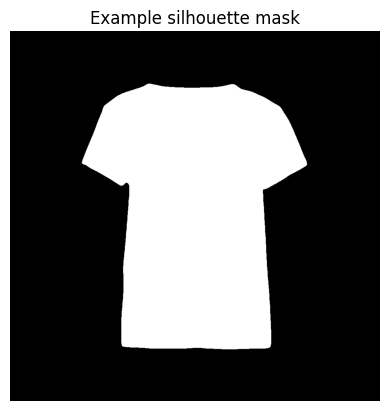

reference_latent shape: torch.Size([2, 4, 128, 128])
encoder_hidden_states shape: torch.Size([2, 77, 2048])
structure_embeddings shape: torch.Size([2, 768])
landmark_mask shape: torch.Size([2, 1, 1024, 1024])


  0%|          | 0/50 [00:00<?, ?it/s]

We are in timestep 981.0 (step 0/50)
Calling unet with sample shape torch.Size([2, 4, 128, 128])
Entered CustomRAGUNet.forward
use_flux_vae: False
main_latent.shape before conv_in should be [B, 16, H, W]: torch.Size([2, 4, 128, 128])
reference_latent shape after conv_in should be [B, 320, H, W]: torch.Size([2, 4, 128, 128])
Step1 finished, successfully computed k_ref and v_ref
Check ok
We are in timestep 961.0 (step 1/50)
Calling unet with sample shape torch.Size([2, 4, 128, 128])
Entered CustomRAGUNet.forward
use_flux_vae: False
main_latent.shape before conv_in should be [B, 16, H, W]: torch.Size([2, 4, 128, 128])
reference_latent shape after conv_in should be [B, 320, H, W]: torch.Size([2, 4, 128, 128])
Step1 finished, successfully computed k_ref and v_ref
Check ok
We are in timestep 941.0 (step 2/50)
Calling unet with sample shape torch.Size([2, 4, 128, 128])
Entered CustomRAGUNet.forward
use_flux_vae: False
main_latent.shape before conv_in should be [B, 16, H, W]: torch.Size([2, 4,

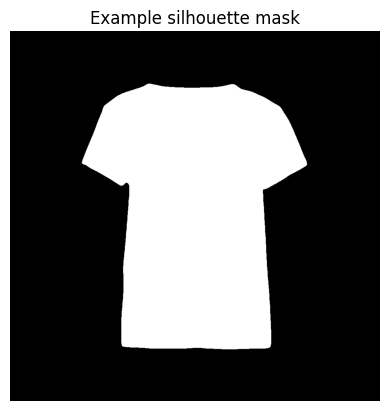

In [ ]:
# 8. Execute the custom RAG pipeline
generator = torch.Generator(device=device)
generator.manual_seed(42)

Result = rag_pipe(
    structure_embeddings=e_itw.unsqueeze(0),
    prompt=prompts[id_image],
    retrieval_db=retrieval_db,
    itw_image=itw_image,
    ref_image = itw_image,
    device = device,
    generator = generator
)


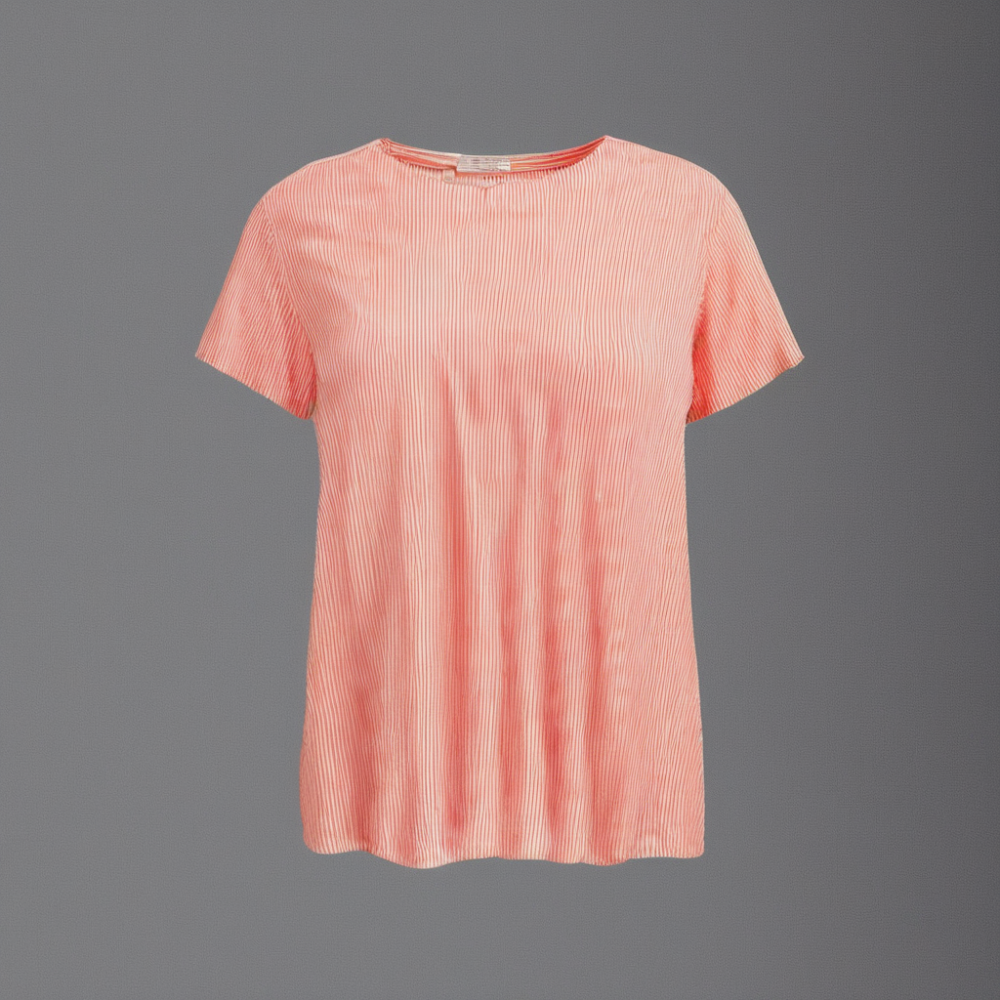

In [ ]:
# Display the first image in the list
display(Result[0][0])


# Final Analysis and conclusion

Due to significant computational constraints, large-scale quantitative benchmarking over thousands of samples was not feasible. Instead, this project focused on component-level validation and perceptual faithfulness, providing insight on the effectiveness of the proposed multi-level conditioning.

Before full integration, the individual components of the pipeline were validated to ensure they provided robust guidance:
- **Semantic Alignment**: the latent space mapping of StructureNet was evaluated using Recall@K. The results confirmed that the fine-tuned dual-tower architecture in most cases effectively clusters structurally similar garments.
- **Silhuoette Accuracy**: quantified through Mean IoU and the proportion of accurate silhouettes (IoU>0.85) proved a moderate reliability of the mask retrieval technique.

To assess the performance of the fully integrated RAG-Diffusion pipeline, I conducted both qualitative and quantitative analysis.
- **Quantitative Analysis**: I computed the Learned Perceptual Image Patch Similarity (**LPIPS**) to measure the perceptual distance between the generated outputs and the ground truth (lower scores indicate higher similarity). Across a test set of 12 samples, the model achieved a Mean LPIPS of 0.706.
- **Qualitative Observations**: visual inspection reveals a variance in fidelity based on feature scale. Large scale logos are better reproduced than smaller, repetitive patterns. This suggests that the ReferenceNet attention mechanism is currently more effective at capturing global semantic features than local high-frequency textures. (All the generated images together with the corresponding inputs are showed in the cell below).

While the results confirm that the full pipeline was correctly integrated, the overall fidelity remains limited by computational constraints. The advanced multimodal components, specifically the EP-Adapter, could not be trained due to computational limitations, meaning the semantic alignment capabilities of StructureNet were not fully transferred to the diffusion backbone. As a result, the generation process primarily relied on the LLM prompt and ControlNet guidance.

**Future Work:** A significant constraint of this implementation was the omission of Decoding Faithfulness. The original paper employs a Parameter Gradual Encoding Adaptation (PGEA) to align the SDXL U-Net with the 16-channel FLUX VAE, reducing decoding artifacts caused by high compression ratios. Due to the high training costs required to adapt the convolutional layers from 4 to 16 channels, this project relied on the standard SDXL VAE. Future work would prioritize this adaptation to further reduce fine-grained reconstruction errors.

**Conclusion**  
The primary objective of this project was not to achieve state of the art performance, but to investigate and deeply understand the mechanisms of Retrieval-Augmented Generation (RAG) within the context of diffusion-based image synthesis.
By replicating and adapting the RAGDiffusion framework [1], I successfully explored the complexities of multi-level conditioning such as the semantic retrieval and the structural conditioning, understanding how external knowledge can mitigate generation hallucinations.



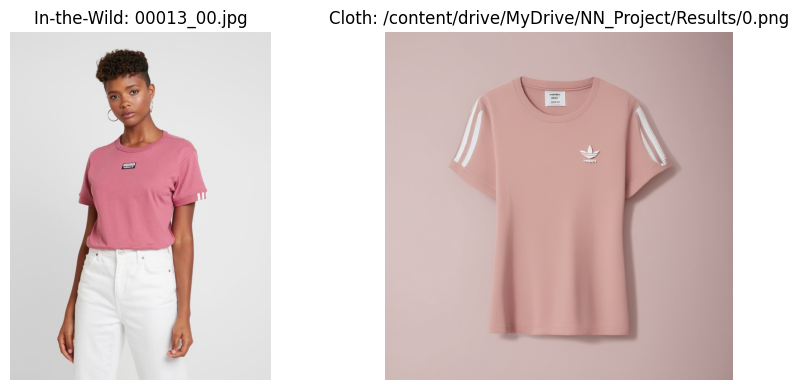

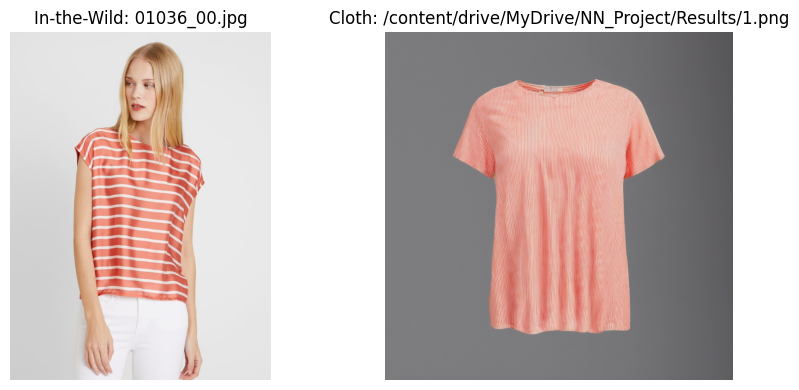

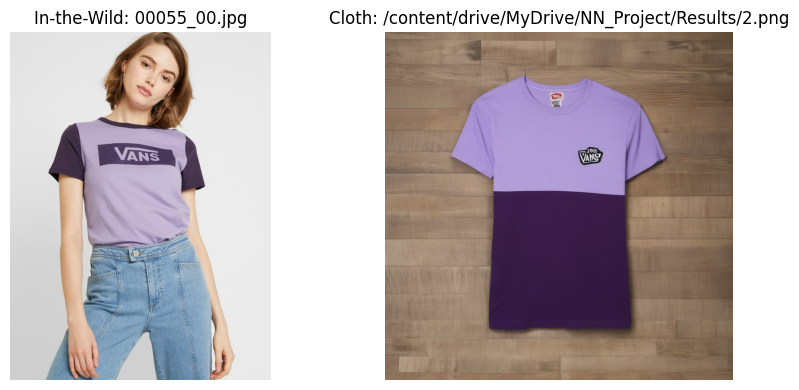

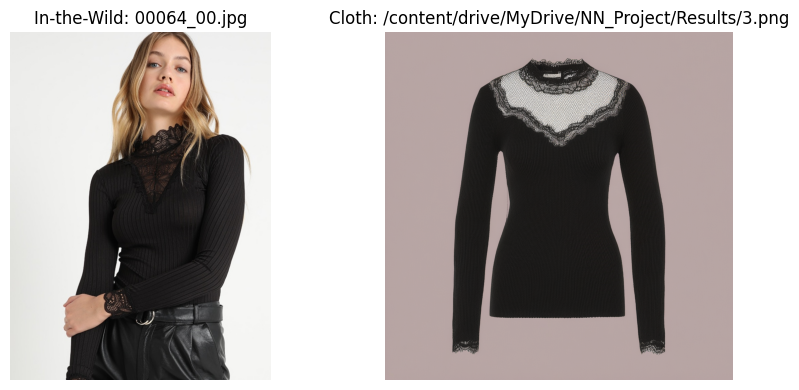

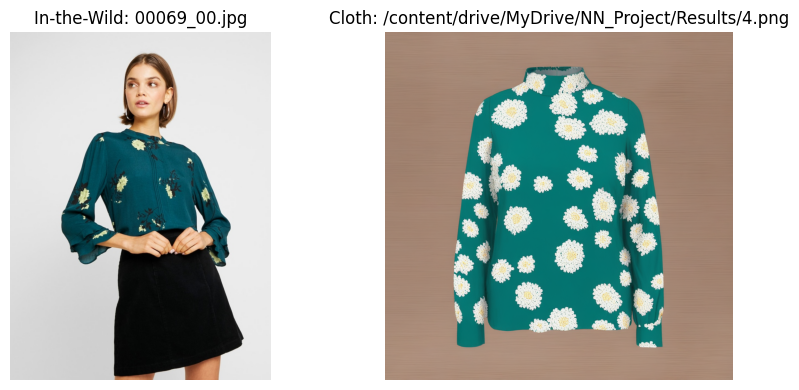

<Figure size 640x480 with 0 Axes>

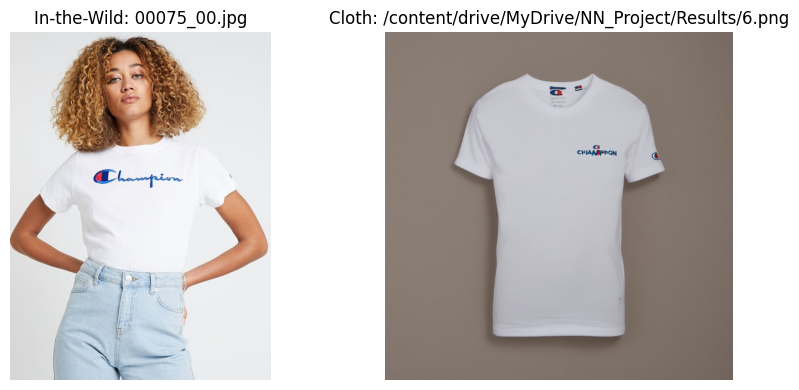

<Figure size 640x480 with 0 Axes>

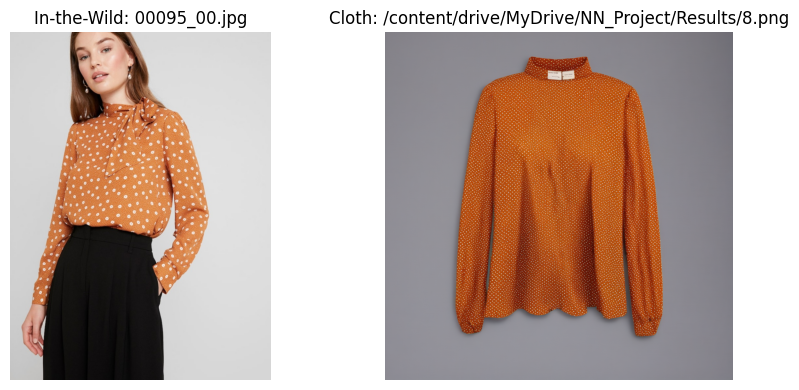

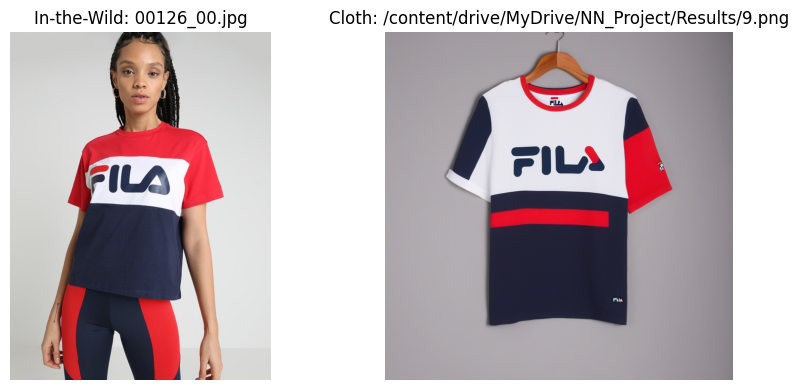

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

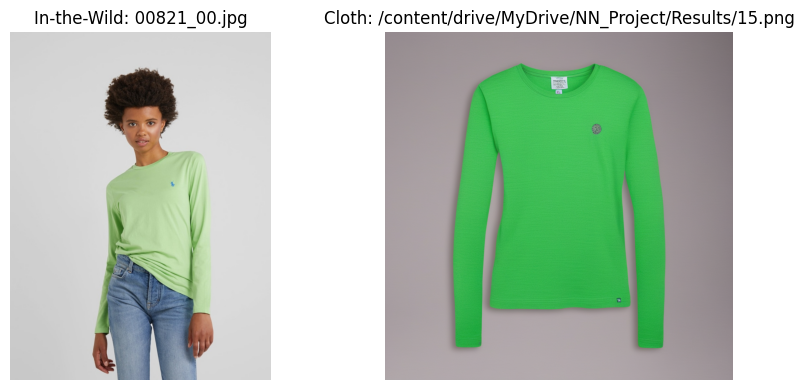

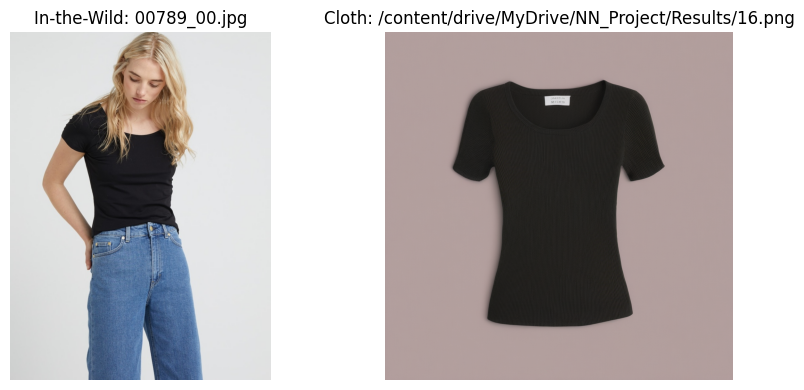

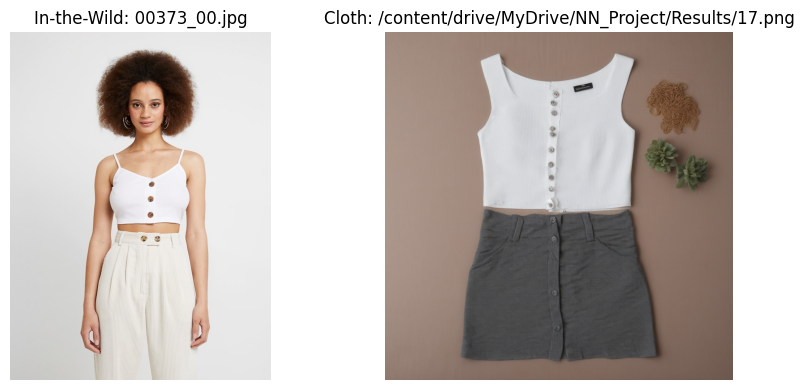

<Figure size 640x480 with 0 Axes>

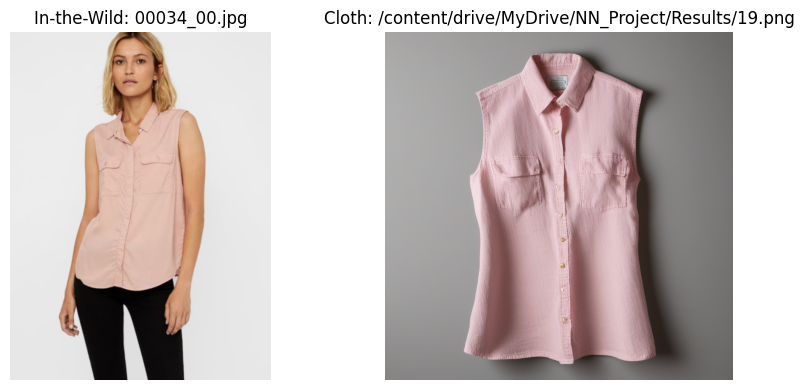

In [ ]:
# Display the image in the wild near the result (pre computed and saved in drive)

# Import the image
with open("./NN_Project/test_image.txt", "r") as f:
    selected_images = f.readlines()
    selected_images = [img.strip() for img in selected_images]
# The folder with the Results
result_folder = "./NN_Project/Results"

# Show the results with also the corresponding standard cloth images
i = 0
for img_path in selected_images:
    result_path = os.path.join(result_folder, f"{i}.png")
    if os.path.exists(result_path):
        # Extract filename and create cloth path
        filename = os.path.basename(img_path)
        cloth_path = img_path.replace("image", "cloth")
        mask_path = img_path.replace("image", "cloth-mask")

        # Create subplot with 1 row, 2 columns
        fig, axes = plt.subplots(1, 2, figsize=(9, 4))

        # Display in-the-wild image
        axes[0].imshow(plt.imread(img_path))
        axes[0].set_title(f"In-the-Wild: {filename}")
        axes[0].axis("off")

        axes[1].imshow(plt.imread(result_path))
        axes[1].set_title(f"Cloth: {result_path}")
        axes[1].axis("off")
    i += 1

    plt.tight_layout()
    plt.show()

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.12/dist-packages/lpips/weights/v0.1/alex.pth


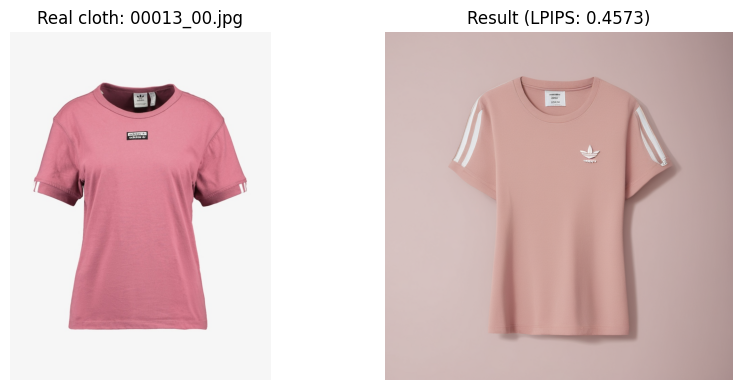

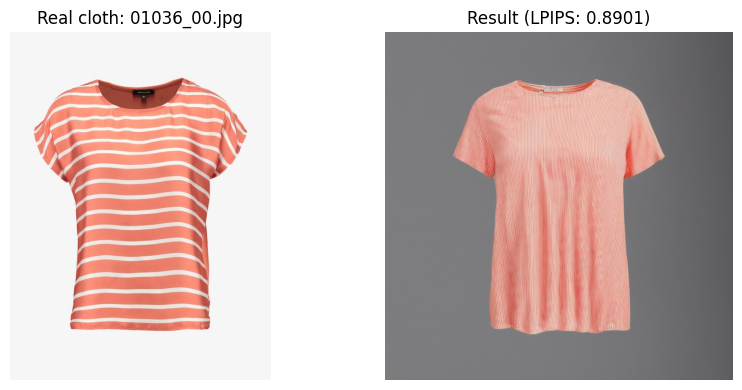

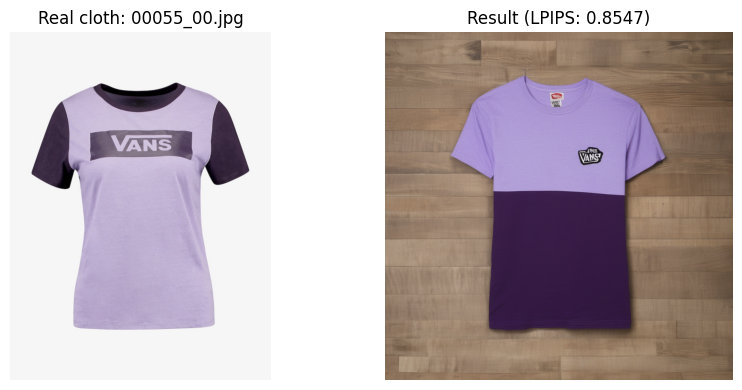

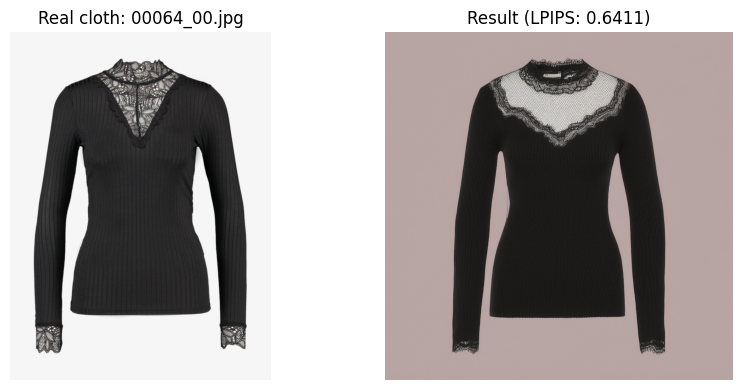

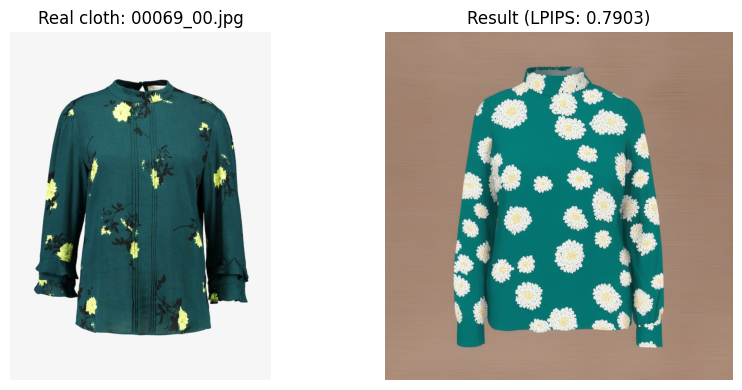

...

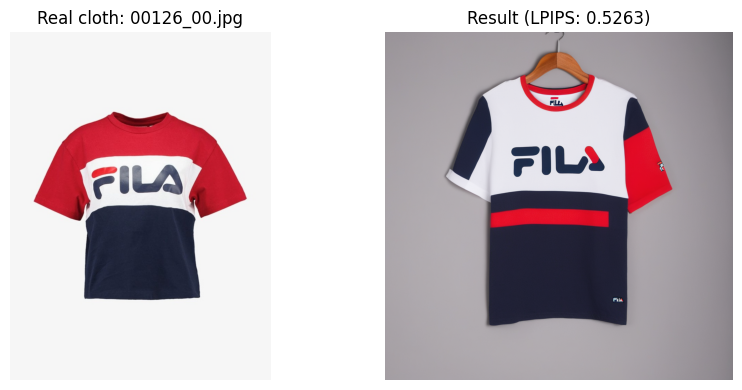

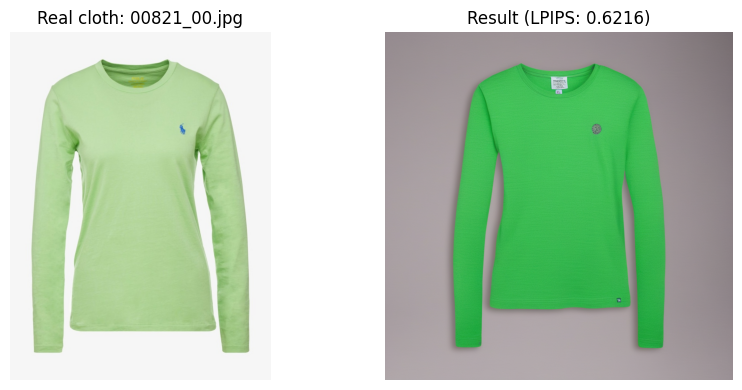

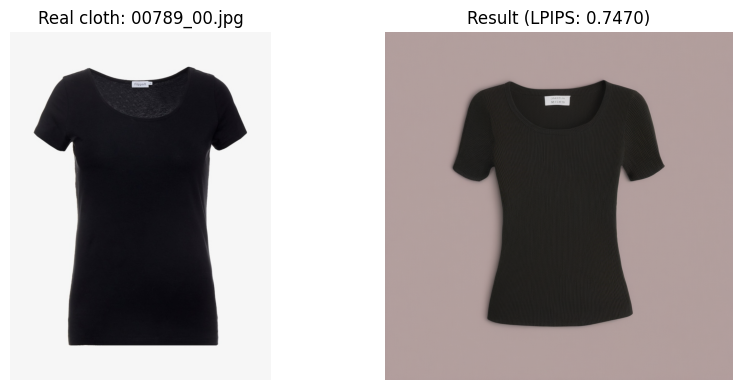

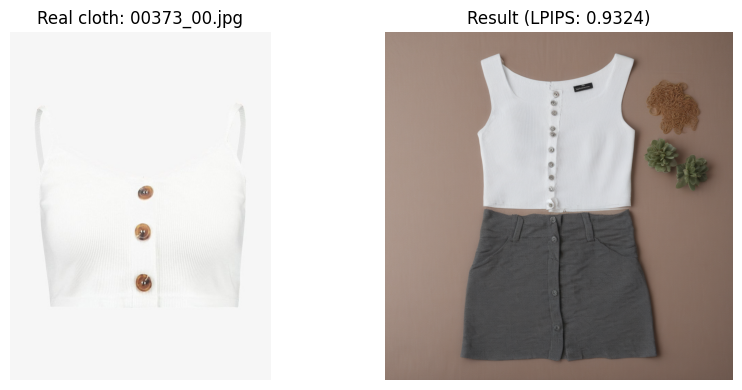

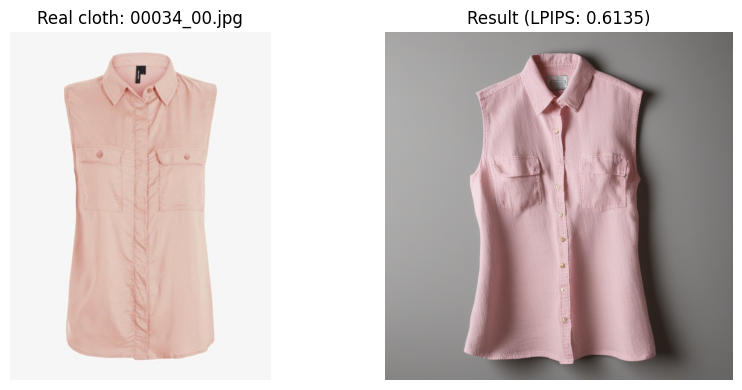


Mean LPIPS Distance across 12 samples: 0.7066
All LPIPS values: [0.4573303163051605, 0.890121340751648, 0.854716956615448, 0.6411072015762329, 0.7902982831001282, 0.6837669610977173, 0.7212604880332947, 0.5263484120368958, 0.6215606927871704, 0.7469845414161682, 0.9323711395263672, 0.6134746074676514]


In [ ]:
# 1. Initialize LPIPS model (AlexNet-based is standard for perceptual distance)
loss_fn_alex = lpips.LPIPS(net='alex').to(device)

# 2. Define transform to prepare images for LPIPS
# Note: LPIPS expects input in range [-1, 1]
lpips_transform = T.Compose([
    T.Resize((1024, 1024)), # Ensure both images match spatially
    T.ToTensor(),
    T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

all_lpips_values = []

# Show the results with also the corresponding standard cloth images
for i, img_path in enumerate(selected_images):
    result_path = os.path.join(result_folder, f"{i}.png")

    if os.path.exists(result_path):
        # compare the Generated Result vs the Ground Truth Cloth
        cloth_path = img_path.replace("image", "cloth")
        filename = os.path.basename(img_path)

        if os.path.exists(cloth_path):
            # 3. Load and Transform images
            img_gt = Image.open(cloth_path).convert("RGB")
            img_gen = Image.open(result_path).convert("RGB")

            # Transform to tensors [-1, 1] and add batch dimension
            tensor_gt = lpips_transform(img_gt).unsqueeze(0).to(device)
            tensor_gen = lpips_transform(img_gen).unsqueeze(0).to(device)

            # 4. Compute LPIPS Distance
            with torch.no_grad():
                current_lpips = loss_fn_alex(tensor_gen, tensor_gt).item()
                all_lpips_values.append(current_lpips)

            # Visualization
            fig, axes = plt.subplots(1, 2, figsize=(9, 4))

            # Display flat lay image
            axes[0].imshow(plt.imread(cloth_path))
            axes[0].set_title(f"Real cloth: {filename}")
            axes[0].axis("off")

            # Display Generated Result
            axes[1].imshow(plt.imread(result_path))
            axes[1].set_title(f"Result (LPIPS: {current_lpips:.4f})")
            axes[1].axis("off")

            plt.tight_layout()
            plt.show()
        else:
            print(f"Ground truth cloth not found for {filename}")

# 5. Final Report Metric
if all_lpips_values:
    mean_lpips = sum(all_lpips_values) / len(all_lpips_values)
    print(f"\nMean LPIPS Distance across {len(all_lpips_values)} samples: {mean_lpips:.4f}")
    print(f"All LPIPS values: {all_lpips_values}")



# References
[1] Yuhan Li, Xianfeng Tan, Wenxiang Shang, Yubo Wu, Jian Wang, Xuanhong Chen, Yi Zhang, Ran Lin, Bingbing Ni. (2025). RAG-Diffusion: Faithful Cloth Generation via External Knowledge Assimilation. arXiv preprint arXiv:2411.19528v2. (Primary architectural framework).

[2] Dustin Podell, Zion English, Kyle Lacey, Andreas Blattmann, Tim Dockhorn, Jonas M¨uller, Joe Penna, and Robin Rombach. (2023). SDXL: Improving Latent Diffusion Models for High-Resolution Image Synthesis. arXiv preprint arXiv:2307.01952. (Backbone generative model).

[3] Jinze Bai, Shuai Bai, Shusheng Yang, Shijie Wang, Sinan Tan, Peng Wang, Junyang Lin, Chang Zhou, and Jingren Zhou. (2023). Qwen-VL: A Versatile Vision-Language Model for Understanding, Localization, Text Reading, and Beyond. arXiv preprint arXiv:2308.12966. (Used for semantic attribute extraction and prompt generation).

[4] Hu Ye, Jun Zhang, Sibo Liu, Xiao Han, Wei Yang. (2023). IP-Adapter: Text Compatible Image Prompt Adapter for Text-to-Image Diffusion Models. arXiv preprint arXiv:2308.06721. (Source for the Perceiver Resampler and the architectural basis of the EP-Adapter).

[5] Li Hu, Xin Gao, Peng Zhang, Ke Sun, Bang Zhang, and Liefeng Bo. (2023). Animate anyone: Consistent and controllable image-to-video synthesis for character animation. arXiv preprint arXiv:2311.17117. (Methodological source for ReferenceNet and spatial feature injection).

[6] Seunghwan Choi, Sunghyun Park, Minsoo Lee, Jaegul Choo. (2021). VITON-HD: High-Resolution Virtual Try-On via Misalignment-Aware Normalization. arXiv preprint arXiv:2103.16874. (Dataset source via Kaggle).